# Package Insatallation

In [1]:
from utils.dataloader import DatasetLoader
from utils.preprocessing import DataProcessing
from utils.cases import Case

import numpy as np
import matplotlib.pyplot as plt

import shap
import pandas as pd
import xgboost as xgb
import optuna

from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import  MinMaxScaler

from keras.models import Model,Sequential
from keras.layers import Dense, LSTM, Flatten
from keras.optimizers import Adam
from keras.backend import clear_session

from tensorflow_addons.metrics import RSquare
from tensorflow.keras.optimizers.legacy import Adam 
from tensorflow.keras.callbacks import ModelCheckpoint
import pickle

import warnings
warnings.filterwarnings('ignore')



TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.11.0 and strictly below 2.14.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.9.2 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/a

# Static Variables

In [2]:
dataset_path = "data/dataset/"
blacklist_states = ['kansas', 'new mexico', 'california', 'arizona']

target = 'yield'


"""
Removing Features:
Static: OCS, Bulk density, CEC
Dynamic: lst_day, lst_night, fpar, tmin, vp, lai
"""

drop_dynamic_features = ['lst_day', 'lst_nigth', 'fpar', 'tmin', 'vp', 'lai']
drop_static_features = ['OCS', 'Bulk density', 'CEC' ]
drop_feature_list = drop_dynamic_features + drop_static_features


# Dataset Loader

In [3]:
loader = DatasetLoader(dataset_path)
datasets = loader.load_all_pickle_dataset()
dataset_dict = loader.get_state_names(datasets[0])
print(dataset_dict)

{'alabama': ['baldwin', 'calhoun', 'cherokee', 'coffee', 'covington', 'dale', 'dallas', 'elmore', 'escambia', 'geneva', 'henry', 'houston', 'lauderdale', 'lawrence', 'limestone', 'madison', 'mobile', 'monroe', 'shelby'], 'arizona': ['graham', 'maricopa', 'pinal', 'yuma'], 'arkansas': ['ashley', 'chicot', 'clay', 'craighead', 'crittenden', 'desha', 'drew', 'jefferson', 'lee', 'lincoln', 'mississippi', 'phillips', 'poinsett'], 'california': ['kings', 'merced', 'tulare'], 'georgia': ['appling', 'atkinson', 'baker', 'ben hill', 'berrien', 'bleckley', 'brooks', 'bulloch', 'burke', 'calhoun', 'candler', 'coffee', 'colquitt', 'cook', 'crisp', 'decatur', 'dodge', 'dooly', 'early', 'emanuel', 'grady', 'irwin', 'jeff davis', 'jefferson', 'jenkins', 'laurens', 'miller', 'mitchell', 'pierce', 'pulaski', 'randolph', 'screven', 'seminole', 'sumter', 'tattnall', 'terrell', 'thomas', 'tift', 'turner', 'webster', 'wilcox', 'worth'], 'kansas': ['pratt', 'sumner'], 'louisiana': ['catahoula', 'east carrol

In [4]:
for idx in range(len(blacklist_states)):
    del dataset_dict[blacklist_states[idx]]
    
city_count = sum(len(cities) for cities in dataset_dict.values())
print("Total number of cities:", city_count)

Total number of cities: 224


# Case 1 - 15th Day

In [5]:
c1 = Case(day=15,dynamic_drop=drop_dynamic_features,static_drop=drop_static_features)
c1_dfs, c1_scalers, c1_datas = c1.case_preprocessing(datasets,dataset_dict,target)

In [6]:
c1_dfs[0][2].dtypes

evi_4               float64
evi_5               float64
evi_6               float64
evi_7               float64
evi_8               float64
evi_9               float64
dayl_4              float64
dayl_5              float64
dayl_6              float64
dayl_7              float64
dayl_8              float64
dayl_9              float64
prcp_4              float64
prcp_5              float64
prcp_6              float64
prcp_7              float64
prcp_8              float64
prcp_9              float64
srad_4              float64
srad_5              float64
srad_6              float64
srad_7              float64
srad_8              float64
srad_9              float64
tmax_4              float64
tmax_5              float64
tmax_6              float64
tmax_7              float64
tmax_8              float64
tmax_9              float64
ssm_4               float64
ssm_5               float64
ssm_6               float64
ssm_7               float64
ssm_8               float64
ssm_9               

In [7]:
X_train_scaled = c1_datas[0][0]
X_test_scaled = c1_datas[0][1]

y_train_scaled = c1_datas[0][2]
y_test_scaled = c1_datas[0][3]

X_val_scaled = c1_datas[0][5]
y_val_scaled = c1_datas[0][6]

X_scaled = c1_datas[0][8]
y_scaled = c1_datas[0][9]

kf = c1_datas[0][7]
test = c1_datas[0][4]


print("Train: ", X_train_scaled.shape)
print("Train Target: ", X_test_scaled.shape)

print("Test: ", y_train_scaled.shape)
print("Test Targer: ", y_test_scaled.shape)

print("Validation: ", X_val_scaled.shape)
print("Validation Target: ", y_val_scaled.shape) 

print("X Scaled: ", X_scaled.shape)
print("y Scaled: ", y_scaled.shape)

print("yield:" , test.shape)

Train:  (825, 50)
Train Target:  (137, 50)
Test:  (825, 1)
Test Targer:  (137, 1)
Validation:  (138, 50)
Validation Target:  (138, 1)
X Scaled:  (1100, 50)
y Scaled:  (1100, 1)
yield: (1100, 1)


## Optuna LSTM

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

clear_session()
case1_LSTM= Sequential()
case1_LSTM.add(LSTM(4, activation='tanh',input_shape=(c1_datas[0][0].shape[1],1))) 
case1_LSTM.add(Dense(1))

optimizer = Adam(lr=0.0001)
case1_LSTM.compile(optimizer=optimizer, loss='mse',metrics=[RSquare()])

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = case1_LSTM.fit(X_train_scaled, y_train_scaled, epochs=50, batch_size=16, validation_data=(X_test_scaled, y_test_scaled),callbacks= early_stopping, verbose=1)


Epoch 1/50
52/52 [==============================] - 2s 11ms/step - loss: 0.0603 - r_square: -1.5681 - val_loss: 0.0539 - val_r_square: -1.2827
Epoch 2/50
52/52 [==============================] - 0s 5ms/step - loss: 0.0486 - r_square: -1.0723 - val_loss: 0.0438 - val_r_square: -0.8521
Epoch 3/50
52/52 [==============================] - 0s 5ms/step - loss: 0.0399 - r_square: -0.7016 - val_loss: 0.0363 - val_r_square: -0.5362
Epoch 4/50
52/52 [==============================] - 0s 5ms/step - loss: 0.0336 - r_square: -0.4342 - val_loss: 0.0312 - val_r_square: -0.3190
Epoch 5/50
52/52 [==============================] - 0s 5ms/step - loss: 0.0294 - r_square: -0.2528 - val_loss: 0.0278 - val_r_square: -0.1770
Epoch 6/50
52/52 [==============================] - 0s 6ms/step - loss: 0.0269 - r_square: -0.1454 - val_loss: 0.0258 - val_r_square: -0.0920
Epoch 7/50
52/52 [==============================] - 0s 6ms/step - loss: 0.0255 - r_square: -0.0859 - val_loss: 0.0249 - val_r_square: -0.0524
Epoch

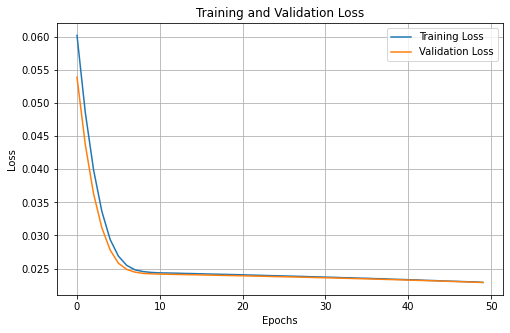

In [ ]:
# Kayıp değerlerini çizdirme
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Global overfitting threshold (same as XGB)
OVERFIT_THRESHOLD = 0.20

# Global best score for LSTM (we maximize R2, so higher is better)
best_score_lstm = float('-inf')
lstm_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/lstm/best_model.h5'

def optuna_lstm(trial):
    """
    Objective function for LSTM using 5‑fold cross validation.
    For each fold:
      - Further split the fold’s test/validation set 50–50.
      - Reshape the data (for LSTM, input shape is (n_features, 1)).
      - Train with early stopping (via ModelCheckpoint on the validation set).
      - Compute both training MSE and test MSE to check for overfitting.
    If any fold is overfitted, return a large penalty (-1e6).
    Otherwise, compute a trial score = (mean R2 – std R2) across folds.
    If the trial’s score beats the best so far, retrain a final model using the
    best fold’s split and save it.
    """
    clear_session()
    
    fold_test_r2s = []
    fold_train_mses = []
    fold_test_mses = []
    fold_train_indices = []
    fold_test_indices = []
    fold_models = []
    fold_history = []
    
    for fold, (train_index, test_val_index) in enumerate(kf.split(X_scaled)):
        # Get fold data
        X_fold_train, X_fold_testval = X_scaled[train_index], X_scaled[test_val_index]
        y_fold_train, y_fold_testval = y_scaled[train_index], y_scaled[test_val_index]
        fold_train_indices.append(train_index)
        fold_test_indices.append(test_val_index)
        
        # Further split test_val into test and validation sets (50–50)
        X_test_fold, X_val_fold, y_test_fold, y_val_fold = train_test_split(
            X_fold_testval, y_fold_testval, test_size=0.5, random_state=42
        )
        
        # Reshape inputs for LSTM: (samples, n_features, 1)
        n_features = X_fold_train.shape[1]
        X_fold_train_r = X_fold_train.reshape(-1, n_features, 1)
        X_val_fold_r = X_val_fold.reshape(-1, n_features, 1)
        X_test_fold_r = X_test_fold.reshape(-1, n_features, 1)
        
        # -------------------------
        # 1. Hyperparameter suggestions
        # -------------------------

        units = trial.suggest_categorical('units', [32, 64, 128])
        lr = trial.suggest_float('lr', 5e-4, 5e-3, log=True)
        epochs = trial.suggest_int('epochs', 100, 300, step=10)
        batch_size = trial.suggest_categorical('batch_size', [32, 64])
        dropout = trial.suggest_float('dropout', 0.1, 0.3)

        
        # -------------------------
        # 2. Build and train the model with Dropout & EarlyStopping
        # -------------------------
        model = Sequential()
        model.add(LSTM(units=units, activation='tanh', dropout=dropout, return_sequences=True, input_shape=(n_features, 1)))
        model.add(LSTM(units=units//2, activation='tanh', dropout=dropout)) 
        model.add(Dense(1))
        model.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        tmp_checkpoint = 'temp_lstm_checkpoint.h5'
        checkpoint = ModelCheckpoint(tmp_checkpoint, monitor='val_loss', mode='min',
                                     save_best_only=True, verbose=0)
        early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
        
        history = model.fit(X_fold_train_r, y_fold_train, epochs=epochs, batch_size=batch_size,
                  validation_data=(X_val_fold_r, y_val_fold), callbacks=[checkpoint, early_stopping], verbose=0)
        model.load_weights(tmp_checkpoint)
        fold_history.append(history)
        fold_models.append(model)
        # -------------------------
        # 3. Evaluate and check for overfitting
        # -------------------------
        y_pred_test = model.predict(X_test_fold_r)
        test_r2 = r2_score(y_test_fold, y_pred_test)
        fold_test_r2s.append(test_r2)
        print(f" LSTM model R2: {test_r2:.4f}")

        y_pred_train = model.predict(X_fold_train_r)
        train_mse = mean_squared_error(y_fold_train, y_pred_train)
        test_mse = mean_squared_error(y_test_fold, y_pred_test)
        fold_train_mses.append(train_mse)
        fold_test_mses.append(test_mse)
        print(f"Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}")

        # Overfitting check: if training MSE is much lower than test MSE, penalize.
        # if test_mse > 0 and ((test_mse - train_mse) / test_mse) > OVERFIT_THRESHOLD:
        #     print("Overfitted!!")  # large penalty for overfitting
    
    # -------------------------
    # 4. Compute CV metrics and trial score
    # -------------------------
    mean_r2 = np.mean(fold_test_r2s)
    std_r2 = np.std(fold_test_r2s)
    # trial_score = mean_r2 - std_r2  # lower is better
    trial_score = mean_r2  # lower is better
    # Identify the fold with the highest test R2
    best_fold_index, best_fold_r2 = max(enumerate(fold_test_r2s), key=lambda x: x[1])
    # -------------------------
    # 5. Retrain final model if trial beats previous best
    # -------------------------
    global best_score_lstm
    if trial_score > best_score_lstm:
        print(f"Trial R2: {mean_r2:.4f} ± {std_r2:.4f}")
        best_score_lstm = trial_score
        best_train_idx = fold_train_indices[best_fold_index]
        best_test_idx = fold_test_indices[best_fold_index]
        
        # Split the full data using the best fold's indices
        X_train_full, y_train_full = X_scaled[best_train_idx], y_scaled[best_train_idx]
        X_testval_full, y_testval_full = X_scaled[best_test_idx], y_scaled[best_test_idx]
        X_test_full, X_val_full, y_test_full, y_val_full = train_test_split(
            X_testval_full, y_testval_full, test_size=0.5, random_state=42
        )
        
        # Reshape for LSTM
        n_features = X_train_full.shape[1]
        X_train_full_r = X_train_full.reshape(-1, n_features, 1)
        X_val_full_r = X_val_full.reshape(-1, n_features, 1)
        X_test_full_r = X_test_full.reshape(-1, n_features, 1)
        
       
        # final_model = Sequential()
        # final_model.add(LSTM(units=units, activation='tanh', dropout=dropout, return_sequences=True, input_shape=(n_features, 1)))
        # final_model.add(LSTM(units=units//2, activation='tanh', dropout=dropout)) 
        # final_model.add(Dense(1))
        # final_model.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        # final_checkpoint = ModelCheckpoint(lstm_model_path, monitor='val_loss', mode='min',
        #                                    save_best_only=True, verbose=0)
        # final_model.fit(X_train_full_r, y_train_full, epochs=epochs, batch_size=batch_size,
        #                 validation_data=(X_val_full_r, y_val_full), callbacks=[final_checkpoint, early_stopping], verbose=0)
        # final_model.load_weights(lstm_model_path)
        
        final_model_1 = fold_models[best_fold_index]

        y_pred_final = final_model_1.predict(X_test_full_r)
        final_r2 = r2_score(y_test_full, y_pred_final)
        print(f"Best LSTM model R2: {final_r2:.4f}")
        final_mse = mean_squared_error(y_test_full, y_pred_final)
        print(f"Best LSTM model MSE: {final_mse:.4f}")
        
        # Save final model info (optional)
        best_model_info = {
            "model": final_model_1,
            "history": fold_history[best_fold_index],
            "hyperparameters": {"units": units, "lr": lr, "epochs": epochs, "batch_size": batch_size, "dropout": dropout},
            "fold_data": {"X_train": X_train_full_r, "y_train": y_train_full, "X_test": X_test_full_r, "y_test": y_test_full, "X_val": X_val_full_r, "y_val": y_val_full}
        }        
        save_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/lstm/best_model_info.pkl'
        with open(save_path, 'wb') as f:
            pickle.dump(best_model_info, f)
    
    return trial_score

study_lstm = optuna.create_study(direction="maximize", study_name="lstm_regression")
study_lstm.optimize(optuna_lstm, n_trials=50)

print("Number of finished trials: {}".format(len(study_lstm.trials)))
print("Best trial:")
trial_lstm = study_lstm.best_trial
print("  Value (mean R2 - std): {:.4f}".format(trial_lstm.value))
print("  Best hyperparameters:")
for key, value in trial_lstm.params.items():
    print("    {}: {}".format(key, value))


[I 2025-02-19 18:28:58,361] A new study created in memory with name: lstm_regression


4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5145
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0126, Test MSE: 0.0112
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.1780
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0192, Test MSE: 0.0181
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.4512
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0110, Test MSE: 0.0132
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.1745
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0199, Test MSE: 0.0198
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.4050
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0096, Test MSE: 0.0126
Trial R2: 0.3446 ± 0.1418
4/4 [==============================] - 0s 12ms/step
Best LSTM model R2: 0.5145
Best LSTM model MSE: 0.0112


INFO:tensorflow:Assets written to: ram://2a23866e-5965-4c56-8d3a-0bc5dd512cd2/assets


INFO:tensorflow:Assets written to: ram://2a23866e-5965-4c56-8d3a-0bc5dd512cd2/assets
[I 2025-02-19 18:38:19,807] Trial 0 finished with value: 0.34463232736950183 and parameters: {'units': 128, 'lr': 0.002090597520411263, 'epochs': 260, 'batch_size': 32, 'dropout': 0.19974254801719357}. Best is trial 0 with value: 0.34463232736950183.


4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.1233
28/28 [==============================] - 0s 3ms/step
Train MSE: 0.0201, Test MSE: 0.0203
4/4 [==============================] - 1s 3ms/step
 LSTM model R2: 0.1255
28/28 [==============================] - 0s 2ms/step
Train MSE: 0.0197, Test MSE: 0.0193
4/4 [==============================] - 1s 4ms/step
 LSTM model R2: 0.1247
28/28 [==============================] - 0s 3ms/step
Train MSE: 0.0196, Test MSE: 0.0210
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1864
28/28 [==============================] - 0s 3ms/step
Train MSE: 0.0196, Test MSE: 0.0195
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.0640
28/28 [==============================] - 0s 2ms/step


[I 2025-02-19 18:40:04,365] Trial 1 finished with value: 0.12478849394716895 and parameters: {'units': 32, 'lr': 0.0005354929800140303, 'epochs': 230, 'batch_size': 64, 'dropout': 0.26472632781839256}. Best is trial 0 with value: 0.34463232736950183.


Train MSE: 0.0201, Test MSE: 0.0198
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.0801
28/28 [==============================] - 0s 5ms/step
Train MSE: 0.0208, Test MSE: 0.0213
4/4 [==============================] - 1s 7ms/step
 LSTM model R2: 0.1766
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0188, Test MSE: 0.0181
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.1609
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0187, Test MSE: 0.0201
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1968
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0196, Test MSE: 0.0193
4/4 [==============================] - 0s 8ms/step
 LSTM model R2: 0.1131
28/28 [==============================] - 0s 4ms/step


[I 2025-02-19 18:42:57,137] Trial 2 finished with value: 0.14552042355282313 and parameters: {'units': 64, 'lr': 0.0009033567882449367, 'epochs': 200, 'batch_size': 64, 'dropout': 0.2068661884892112}. Best is trial 0 with value: 0.34463232736950183.


Train MSE: 0.0187, Test MSE: 0.0188
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.1464
28/28 [==============================] - 0s 2ms/step
Train MSE: 0.0197, Test MSE: 0.0198
4/4 [==============================] - 2s 5ms/step
 LSTM model R2: 0.1743
28/28 [==============================] - 0s 2ms/step
Train MSE: 0.0189, Test MSE: 0.0182
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.1399
28/28 [==============================] - 0s 3ms/step
Train MSE: 0.0188, Test MSE: 0.0206
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1983
28/28 [==============================] - 0s 3ms/step
Train MSE: 0.0196, Test MSE: 0.0193
4/4 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1041
28/28 [==============================] - 0s 2ms/step


[I 2025-02-19 18:44:23,861] Trial 3 finished with value: 0.15258498150150868 and parameters: {'units': 32, 'lr': 0.0006151547982710275, 'epochs': 110, 'batch_size': 64, 'dropout': 0.10381231705782666}. Best is trial 0 with value: 0.34463232736950183.


Train MSE: 0.0187, Test MSE: 0.0190
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1490
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0198, Test MSE: 0.0197
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.1706
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0190, Test MSE: 0.0183
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1449
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0192, Test MSE: 0.0205
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1814
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0198, Test MSE: 0.0197
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1256
28/28 [==============================] - 0s 4ms/step


[I 2025-02-19 18:46:33,230] Trial 4 finished with value: 0.15431569650805074 and parameters: {'units': 64, 'lr': 0.0013282647510138809, 'epochs': 120, 'batch_size': 64, 'dropout': 0.274125476000176}. Best is trial 0 with value: 0.34463232736950183.


Train MSE: 0.0192, Test MSE: 0.0185
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.3221
28/28 [==============================] - 0s 10ms/step
Train MSE: 0.0173, Test MSE: 0.0157
4/4 [==============================] - 0s 14ms/step
 LSTM model R2: 0.4082
28/28 [==============================] - 1s 18ms/step
Train MSE: 0.0140, Test MSE: 0.0130
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.1671
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0189, Test MSE: 0.0200
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.1950
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0196, Test MSE: 0.0193
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.3521
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0139, Test MSE: 0.0137


[I 2025-02-19 18:52:29,020] Trial 5 finished with value: 0.2888983626381795 and parameters: {'units': 128, 'lr': 0.0035228191546122258, 'epochs': 100, 'batch_size': 64, 'dropout': 0.21819265385129416}. Best is trial 0 with value: 0.34463232736950183.


4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.1845
28/28 [==============================] - 0s 3ms/step
Train MSE: 0.0190, Test MSE: 0.0189
4/4 [==============================] - 2s 5ms/step
 LSTM model R2: 0.1935
28/28 [==============================] - 0s 2ms/step
Train MSE: 0.0186, Test MSE: 0.0178
4/4 [==============================] - 1s 4ms/step
 LSTM model R2: 0.1947
28/28 [==============================] - 0s 2ms/step
Train MSE: 0.0180, Test MSE: 0.0193
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.2366
28/28 [==============================] - 0s 3ms/step
Train MSE: 0.0186, Test MSE: 0.0183
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.0729
28/28 [==============================] - 0s 2ms/step


[I 2025-02-19 18:54:16,254] Trial 6 finished with value: 0.17643543275899415 and parameters: {'units': 32, 'lr': 0.0014633843275804195, 'epochs': 130, 'batch_size': 64, 'dropout': 0.1508232080976597}. Best is trial 0 with value: 0.34463232736950183.


Train MSE: 0.0197, Test MSE: 0.0196
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.1238
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0200, Test MSE: 0.0203
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.1773
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0189, Test MSE: 0.0181
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.1579
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0187, Test MSE: 0.0202
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.2236
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0190, Test MSE: 0.0187
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.1374
28/28 [==============================] - 0s 16ms/step


[I 2025-02-19 18:59:06,877] Trial 7 finished with value: 0.16401468262075636 and parameters: {'units': 128, 'lr': 0.000784790218779539, 'epochs': 120, 'batch_size': 64, 'dropout': 0.1576643381553447}. Best is trial 0 with value: 0.34463232736950183.


Train MSE: 0.0184, Test MSE: 0.0183
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.1506
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0195, Test MSE: 0.0197
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1831
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0188, Test MSE: 0.0180
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.0935
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0198, Test MSE: 0.0217
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.3950
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0134, Test MSE: 0.0145
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1202
28/28 [==============================] - 0s 4ms/step


[I 2025-02-19 19:01:43,805] Trial 8 finished with value: 0.18848789462432866 and parameters: {'units': 64, 'lr': 0.001681153230246199, 'epochs': 140, 'batch_size': 32, 'dropout': 0.20753348813590095}. Best is trial 0 with value: 0.34463232736950183.


Train MSE: 0.0182, Test MSE: 0.0186
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4992
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0136, Test MSE: 0.0116
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.4966
28/28 [==============================] - 0s 7ms/step
Train MSE: 0.0137, Test MSE: 0.0111
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.2103
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0177, Test MSE: 0.0189
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4106
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0137, Test MSE: 0.0142
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1119
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0189, Test MSE: 0.0188
Trial R2: 0.3457 ± 0.1572
4/4 [==============================] - 0s 4ms/step
Best LSTM model R2: 0.4992
Best LSTM model MSE: 0.0116


INFO:tensorflow:Assets written to: ram://3bf3ee29-1b14-4480-864d-f81b26444b95/assets


INFO:tensorflow:Assets written to: ram://3bf3ee29-1b14-4480-864d-f81b26444b95/assets
[I 2025-02-19 19:05:43,687] Trial 9 finished with value: 0.3457015480006723 and parameters: {'units': 64, 'lr': 0.002532223198273606, 'epochs': 170, 'batch_size': 64, 'dropout': 0.16996606244135454}. Best is trial 9 with value: 0.3457015480006723.


4/4 [==============================] - 0s 6ms/step
 LSTM model R2: 0.4335
28/28 [==============================] - 0s 5ms/step
Train MSE: 0.0152, Test MSE: 0.0131
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.3019
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0165, Test MSE: 0.0154
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.1481
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0196, Test MSE: 0.0204
4/4 [==============================] - 1s 7ms/step
 LSTM model R2: 0.4323
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0143, Test MSE: 0.0136
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.2725
28/28 [==============================] - 0s 4ms/step


[I 2025-02-19 19:09:16,247] Trial 10 finished with value: 0.3176568387660623 and parameters: {'units': 64, 'lr': 0.004632869211317012, 'epochs': 180, 'batch_size': 32, 'dropout': 0.2970021454921575}. Best is trial 9 with value: 0.3457015480006723.


Train MSE: 0.0164, Test MSE: 0.0154
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.4849
28/28 [==============================] - 0s 16ms/step
Train MSE: 0.0125, Test MSE: 0.0119
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.5471
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0129, Test MSE: 0.0100
4/4 [==============================] - 0s 10ms/step
 LSTM model R2: 0.4608
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0118, Test MSE: 0.0129
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.5874
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0093, Test MSE: 0.0099
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.4685
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0074, Test MSE: 0.0112
Trial R2: 0.5097 ± 0.0493
4/4 [==============================] - 0s 35ms/step
Best LSTM model R2: 0.5874
Best LSTM model MSE: 0.0099


INFO:tensorflow:Assets written to: ram://1d742bfa-f8d4-4824-8dde-58750a0851f8/assets


INFO:tensorflow:Assets written to: ram://1d742bfa-f8d4-4824-8dde-58750a0851f8/assets
[I 2025-02-19 19:20:58,864] Trial 11 finished with value: 0.5097492595505365 and parameters: {'units': 128, 'lr': 0.0024857492694191027, 'epochs': 280, 'batch_size': 32, 'dropout': 0.1652782869250289}. Best is trial 11 with value: 0.5097492595505365.


4/4 [==============================] - 1s 21ms/step
 LSTM model R2: 0.5258
28/28 [==============================] - 0s 17ms/step
Train MSE: 0.0116, Test MSE: 0.0110
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6370
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0082, Test MSE: 0.0080
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.4879
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0098, Test MSE: 0.0123
4/4 [==============================] - 1s 11ms/step
 LSTM model R2: 0.6083
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0087, Test MSE: 0.0094
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.5005
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0089, Test MSE: 0.0106
Trial R2: 0.5519 ± 0.0597
4/4 [==============================] - 0s 11ms/step
Best LSTM model R2: 0.6370
Best LSTM model MSE: 0.0080


INFO:tensorflow:Assets written to: ram://8ca7c6d8-4bf3-40bb-ae40-de0c060239e2/assets


INFO:tensorflow:Assets written to: ram://8ca7c6d8-4bf3-40bb-ae40-de0c060239e2/assets
[I 2025-02-19 19:33:14,475] Trial 12 finished with value: 0.5518953351092256 and parameters: {'units': 128, 'lr': 0.0026013587883194343, 'epochs': 270, 'batch_size': 32, 'dropout': 0.1609466924461984}. Best is trial 12 with value: 0.5518953351092256.


4/4 [==============================] - 0s 10ms/step
 LSTM model R2: 0.5047
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0127, Test MSE: 0.0115
4/4 [==============================] - 1s 10ms/step
 LSTM model R2: 0.5760
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0081, Test MSE: 0.0093
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6051
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0067, Test MSE: 0.0095
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.6276
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0079, Test MSE: 0.0089
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.1213
28/28 [==============================] - 0s 13ms/step


[I 2025-02-19 19:43:27,486] Trial 13 finished with value: 0.48694501142235447 and parameters: {'units': 128, 'lr': 0.0028111503934815235, 'epochs': 300, 'batch_size': 32, 'dropout': 0.12628292908712893}. Best is trial 12 with value: 0.5518953351092256.


Train MSE: 0.0188, Test MSE: 0.0186
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.4633
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0141, Test MSE: 0.0124
4/4 [==============================] - 0s 14ms/step
 LSTM model R2: 0.6082
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0091, Test MSE: 0.0086
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5250
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0095, Test MSE: 0.0114
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.6426
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0085, Test MSE: 0.0086
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.4726
28/28 [==============================] - 0s 14ms/step


[I 2025-02-19 19:55:15,729] Trial 14 finished with value: 0.5423325306710153 and parameters: {'units': 128, 'lr': 0.0033716252111195798, 'epochs': 290, 'batch_size': 32, 'dropout': 0.17776540197289578}. Best is trial 12 with value: 0.5518953351092256.


Train MSE: 0.0089, Test MSE: 0.0112
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5390
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0115, Test MSE: 0.0107
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.4889
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0125, Test MSE: 0.0113
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.5957
28/28 [==============================] - 0s 16ms/step
Train MSE: 0.0083, Test MSE: 0.0097
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.4093
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0148, Test MSE: 0.0142
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.4695
28/28 [==============================] - 0s 17ms/step


[I 2025-02-19 20:05:01,439] Trial 15 finished with value: 0.5004554852576459 and parameters: {'units': 128, 'lr': 0.004596885309355486, 'epochs': 250, 'batch_size': 32, 'dropout': 0.1834887151160676}. Best is trial 12 with value: 0.5518953351092256.


Train MSE: 0.0091, Test MSE: 0.0112
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6206
28/28 [==============================] - 0s 16ms/step
Train MSE: 0.0087, Test MSE: 0.0088
4/4 [==============================] - 0s 15ms/step
 LSTM model R2: 0.6864
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0064, Test MSE: 0.0069
4/4 [==============================] - 0s 14ms/step
 LSTM model R2: 0.5686
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0075, Test MSE: 0.0103
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.6131
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0086, Test MSE: 0.0093
4/4 [==============================] - 0s 14ms/step
 LSTM model R2: 0.1047
28/28 [==============================] - 0s 15ms/step


[I 2025-02-19 20:16:52,553] Trial 16 finished with value: 0.5186794170612884 and parameters: {'units': 128, 'lr': 0.003466667425760856, 'epochs': 230, 'batch_size': 32, 'dropout': 0.13435714877441335}. Best is trial 12 with value: 0.5518953351092256.


Train MSE: 0.0186, Test MSE: 0.0189
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.4942
28/28 [==============================] - 1s 17ms/step
Train MSE: 0.0127, Test MSE: 0.0117
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5870
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0099, Test MSE: 0.0091
4/4 [==============================] - 0s 14ms/step
 LSTM model R2: 0.4619
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0099, Test MSE: 0.0129
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.6099
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0094, Test MSE: 0.0094
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.0921
28/28 [==============================] - 0s 15ms/step


[I 2025-02-19 20:26:49,002] Trial 17 finished with value: 0.4490023424598246 and parameters: {'units': 128, 'lr': 0.0033864134341669923, 'epochs': 290, 'batch_size': 32, 'dropout': 0.18153609063935017}. Best is trial 12 with value: 0.5518953351092256.


Train MSE: 0.0193, Test MSE: 0.0192
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5222
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0130, Test MSE: 0.0111
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.4623
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0141, Test MSE: 0.0119
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.3750
28/28 [==============================] - 1s 19ms/step
Train MSE: 0.0131, Test MSE: 0.0150
4/4 [==============================] - 1s 18ms/step
 LSTM model R2: 0.4429
28/28 [==============================] - 1s 18ms/step
Train MSE: 0.0132, Test MSE: 0.0134
4/4 [==============================] - 0s 14ms/step
 LSTM model R2: 0.0735
28/28 [==============================] - 0s 17ms/step


[I 2025-02-19 20:35:25,688] Trial 18 finished with value: 0.37514762380022976 and parameters: {'units': 128, 'lr': 0.0020212254424946475, 'epochs': 270, 'batch_size': 32, 'dropout': 0.22536287139241803}. Best is trial 12 with value: 0.5518953351092256.


Train MSE: 0.0198, Test MSE: 0.0196
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5578
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0124, Test MSE: 0.0102
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5818
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0076, Test MSE: 0.0092
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.5789
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0080, Test MSE: 0.0101
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6234
28/28 [==============================] - 1s 17ms/step
Train MSE: 0.0073, Test MSE: 0.0090
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.5358
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0069, Test MSE: 0.0098
Trial R2: 0.5756 ± 0.0291
4/4 [==============================] - 0s 23ms/step
Best LSTM model R2: 0.6234
Best LSTM model MSE: 0.0090


INFO:tensorflow:Assets written to: ram://6245f382-a6e7-4fa8-b852-562ba6723a74/assets


INFO:tensorflow:Assets written to: ram://6245f382-a6e7-4fa8-b852-562ba6723a74/assets
[I 2025-02-19 20:47:33,067] Trial 19 finished with value: 0.57555210266767 and parameters: {'units': 128, 'lr': 0.0039706923494555344, 'epochs': 240, 'batch_size': 32, 'dropout': 0.141295946075098}. Best is trial 19 with value: 0.57555210266767.


4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.6080
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0088, Test MSE: 0.0091
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.1755
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0190, Test MSE: 0.0182
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.1345
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0191, Test MSE: 0.0208
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5940
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0082, Test MSE: 0.0098
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.2958
28/28 [==============================] - 0s 4ms/step


[I 2025-02-19 20:50:18,444] Trial 20 finished with value: 0.36155435892132287 and parameters: {'units': 32, 'lr': 0.004943877911687424, 'epochs': 230, 'batch_size': 32, 'dropout': 0.1392692894404493}. Best is trial 19 with value: 0.57555210266767.


Train MSE: 0.0134, Test MSE: 0.0149
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5682
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0106, Test MSE: 0.0100
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.5120
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0121, Test MSE: 0.0108
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.5273
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0081, Test MSE: 0.0113
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.5433
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0106, Test MSE: 0.0110
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.0930
28/28 [==============================] - 0s 16ms/step


[I 2025-02-19 20:58:11,569] Trial 21 finished with value: 0.44876044398747095 and parameters: {'units': 128, 'lr': 0.0038311735425293, 'epochs': 250, 'batch_size': 32, 'dropout': 0.1171274454678097}. Best is trial 19 with value: 0.57555210266767.


Train MSE: 0.0188, Test MSE: 0.0192
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.5372
28/28 [==============================] - 0s 16ms/step
Train MSE: 0.0118, Test MSE: 0.0107
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5619
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0082, Test MSE: 0.0097
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.1641
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0186, Test MSE: 0.0200
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6082
28/28 [==============================] - 0s 16ms/step
Train MSE: 0.0075, Test MSE: 0.0094
4/4 [==============================] - 1s 17ms/step
 LSTM model R2: 0.4799
28/28 [==============================] - 0s 15ms/step


[I 2025-02-19 21:08:15,170] Trial 22 finished with value: 0.4702407088856533 and parameters: {'units': 128, 'lr': 0.0029306541334656443, 'epochs': 300, 'batch_size': 32, 'dropout': 0.14697252656294868}. Best is trial 19 with value: 0.57555210266767.


Train MSE: 0.0080, Test MSE: 0.0110
4/4 [==============================] - 2s 14ms/step
 LSTM model R2: 0.4942
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0124, Test MSE: 0.0117
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.5895
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0074, Test MSE: 0.0090
4/4 [==============================] - 1s 16ms/step
 LSTM model R2: 0.4994
28/28 [==============================] - 0s 17ms/step
Train MSE: 0.0087, Test MSE: 0.0120
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6525
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0069, Test MSE: 0.0083
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.4687
28/28 [==============================] - 0s 16ms/step


[I 2025-02-19 21:19:12,560] Trial 23 finished with value: 0.5408550574129976 and parameters: {'units': 128, 'lr': 0.004180152039985699, 'epochs': 210, 'batch_size': 32, 'dropout': 0.15399436785658546}. Best is trial 19 with value: 0.57555210266767.


Train MSE: 0.0103, Test MSE: 0.0112
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6317
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0083, Test MSE: 0.0085
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6416
28/28 [==============================] - 0s 16ms/step
Train MSE: 0.0067, Test MSE: 0.0079
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.5001
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0094, Test MSE: 0.0120
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.6746
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0057, Test MSE: 0.0078
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5356
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0071, Test MSE: 0.0098
Trial R2: 0.5967 ± 0.0669
4/4 [==============================] - 0s 12ms/step
Best LSTM model R2: 0.6746
Best LSTM model MSE: 0.0078


INFO:tensorflow:Assets written to: ram://8c5b7763-e824-432f-b9ca-ac51aea7b24a/assets


INFO:tensorflow:Assets written to: ram://8c5b7763-e824-432f-b9ca-ac51aea7b24a/assets
[I 2025-02-19 21:32:05,888] Trial 24 finished with value: 0.5967365045020306 and parameters: {'units': 128, 'lr': 0.0030932820287273267, 'epochs': 270, 'batch_size': 32, 'dropout': 0.12400772913297142}. Best is trial 24 with value: 0.5967365045020306.


4/4 [==============================] - 1s 22ms/step
 LSTM model R2: 0.6745
28/28 [==============================] - 0s 17ms/step
Train MSE: 0.0059, Test MSE: 0.0075
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.6316
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0054, Test MSE: 0.0081
4/4 [==============================] - 3s 12ms/step
 LSTM model R2: 0.6476
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0052, Test MSE: 0.0084
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.7129
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0051, Test MSE: 0.0069
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.0644
28/28 [==============================] - 0s 13ms/step


[I 2025-02-19 21:45:07,179] Trial 25 finished with value: 0.5462240720162211 and parameters: {'units': 128, 'lr': 0.003956843166214785, 'epochs': 250, 'batch_size': 32, 'dropout': 0.10136448724957424}. Best is trial 24 with value: 0.5967365045020306.


Train MSE: 0.0191, Test MSE: 0.0198
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.5687
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0101, Test MSE: 0.0100
4/4 [==============================] - 1s 11ms/step
 LSTM model R2: 0.6419
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0071, Test MSE: 0.0079
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.5204
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0088, Test MSE: 0.0115
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.4623
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0116, Test MSE: 0.0129
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.0707
28/28 [==============================] - 0s 14ms/step


[I 2025-02-19 21:54:40,037] Trial 26 finished with value: 0.4527965699773688 and parameters: {'units': 128, 'lr': 0.0029630970781992024, 'epochs': 270, 'batch_size': 32, 'dropout': 0.1225923992413028}. Best is trial 24 with value: 0.5967365045020306.


Train MSE: 0.0191, Test MSE: 0.0197
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5823
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0108, Test MSE: 0.0097
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6256
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0078, Test MSE: 0.0083
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5561
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0087, Test MSE: 0.0106
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.5942
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0086, Test MSE: 0.0098
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.4546
28/28 [==============================] - 0s 14ms/step


[I 2025-02-19 22:07:22,120] Trial 27 finished with value: 0.5625424812645413 and parameters: {'units': 128, 'lr': 0.002272692792598416, 'epochs': 210, 'batch_size': 32, 'dropout': 0.14012126042003517}. Best is trial 24 with value: 0.5967365045020306.


Train MSE: 0.0096, Test MSE: 0.0115
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.1368
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0187, Test MSE: 0.0200
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.2090
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0185, Test MSE: 0.0174
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.1580
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0188, Test MSE: 0.0202
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.2387
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0191, Test MSE: 0.0183
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1349
28/28 [==============================] - 0s 4ms/step


[I 2025-02-19 22:09:38,717] Trial 28 finished with value: 0.1754945890167829 and parameters: {'units': 32, 'lr': 0.0021892994763637826, 'epochs': 180, 'batch_size': 32, 'dropout': 0.13515785039234204}. Best is trial 24 with value: 0.5967365045020306.


Train MSE: 0.0179, Test MSE: 0.0183
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5445
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0109, Test MSE: 0.0105
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5937
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0105, Test MSE: 0.0090
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.0838
28/28 [==============================] - 0s 17ms/step
Train MSE: 0.0197, Test MSE: 0.0220
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.6554
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0066, Test MSE: 0.0083
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.1176
28/28 [==============================] - 0s 14ms/step


[I 2025-02-19 22:18:59,504] Trial 29 finished with value: 0.3990059626072499 and parameters: {'units': 128, 'lr': 0.002257016364225381, 'epochs': 220, 'batch_size': 32, 'dropout': 0.11990797416709253}. Best is trial 24 with value: 0.5967365045020306.


Train MSE: 0.0183, Test MSE: 0.0187
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6246
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0086, Test MSE: 0.0087
4/4 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6296
28/28 [==============================] - 0s 16ms/step
Train MSE: 0.0070, Test MSE: 0.0082
4/4 [==============================] - 1s 16ms/step
 LSTM model R2: 0.5333
28/28 [==============================] - 0s 16ms/step
Train MSE: 0.0077, Test MSE: 0.0112
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.5622
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0092, Test MSE: 0.0105
4/4 [==============================] - 1s 17ms/step
 LSTM model R2: 0.4625
28/28 [==============================] - 0s 13ms/step


[I 2025-02-19 22:32:13,103] Trial 30 finished with value: 0.5624451880563573 and parameters: {'units': 128, 'lr': 0.003139762445793924, 'epochs': 240, 'batch_size': 32, 'dropout': 0.1446861659134926}. Best is trial 24 with value: 0.5967365045020306.


Train MSE: 0.0070, Test MSE: 0.0114
4/4 [==============================] - 1s 11ms/step
 LSTM model R2: 0.1447
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0197, Test MSE: 0.0198
4/4 [==============================] - 1s 11ms/step
 LSTM model R2: 0.5893
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0079, Test MSE: 0.0091
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5065
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0094, Test MSE: 0.0118
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.4966
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0111, Test MSE: 0.0121
4/4 [==============================] - 0s 14ms/step
 LSTM model R2: 0.0455
28/28 [==============================] - 0s 16ms/step


[I 2025-02-19 22:39:35,287] Trial 31 finished with value: 0.35650596058622985 and parameters: {'units': 128, 'lr': 0.0031106167635274206, 'epochs': 240, 'batch_size': 32, 'dropout': 0.14101490411943204}. Best is trial 24 with value: 0.5967365045020306.


Train MSE: 0.0203, Test MSE: 0.0202
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.7099
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0073, Test MSE: 0.0067
4/4 [==============================] - 2s 11ms/step
 LSTM model R2: 0.6662
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0063, Test MSE: 0.0074
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.5850
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0084, Test MSE: 0.0100
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6348
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0076, Test MSE: 0.0088
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.5212
28/28 [==============================] - 0s 16ms/step
Train MSE: 0.0058, Test MSE: 0.0101
Trial R2: 0.6234 ± 0.0653
4/4 [==============================] - 0s 12ms/step
Best LSTM model R2: 0.7099
Best LSTM model MSE: 0.0067


INFO:tensorflow:Assets written to: ram://5c81d70f-4c78-4474-b921-2b38167c5133/assets


INFO:tensorflow:Assets written to: ram://5c81d70f-4c78-4474-b921-2b38167c5133/assets
[I 2025-02-19 22:50:37,566] Trial 32 finished with value: 0.6234129187941256 and parameters: {'units': 128, 'lr': 0.004036716250472124, 'epochs': 200, 'batch_size': 32, 'dropout': 0.11172718443876674}. Best is trial 32 with value: 0.6234129187941256.


4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5945
28/28 [==============================] - 0s 17ms/step
Train MSE: 0.0095, Test MSE: 0.0094
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6650
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0057, Test MSE: 0.0074
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.6537
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0048, Test MSE: 0.0083
4/4 [==============================] - 1s 16ms/step
 LSTM model R2: 0.7082
28/28 [==============================] - 0s 15ms/step
Train MSE: 0.0051, Test MSE: 0.0070
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5447
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0063, Test MSE: 0.0096
Trial R2: 0.6332 ± 0.0573
4/4 [==============================] - 0s 12ms/step
Best LSTM model R2: 0.7082
Best LSTM model MSE: 0.0070


INFO:tensorflow:Assets written to: ram://3e067e9c-0bcc-4fd5-85df-74772e8e6f05/assets


INFO:tensorflow:Assets written to: ram://3e067e9c-0bcc-4fd5-85df-74772e8e6f05/assets
[I 2025-02-19 23:04:46,723] Trial 33 finished with value: 0.6332125202100171 and parameters: {'units': 128, 'lr': 0.0042815048427162624, 'epochs': 200, 'batch_size': 32, 'dropout': 0.11056107446169507}. Best is trial 33 with value: 0.6332125202100171.


4/4 [==============================] - 1s 17ms/step
 LSTM model R2: 0.5465
28/28 [==============================] - 1s 20ms/step
Train MSE: 0.0120, Test MSE: 0.0105
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6612
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0060, Test MSE: 0.0075
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.4545
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0111, Test MSE: 0.0131
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.7320
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0048, Test MSE: 0.0064
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.5307
28/28 [==============================] - 0s 13ms/step


[I 2025-02-19 23:15:30,025] Trial 34 finished with value: 0.5849772493864689 and parameters: {'units': 128, 'lr': 0.004179529045092802, 'epochs': 190, 'batch_size': 32, 'dropout': 0.10659550614740972}. Best is trial 33 with value: 0.6332125202100171.


Train MSE: 0.0075, Test MSE: 0.0099
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.5565
28/28 [==============================] - 0s 3ms/step
Train MSE: 0.0110, Test MSE: 0.0103
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6797
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0064, Test MSE: 0.0071
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.5666
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0081, Test MSE: 0.0104
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.5288
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0093, Test MSE: 0.0113
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.3029
28/28 [==============================] - 0s 5ms/step


[I 2025-02-19 23:19:49,625] Trial 35 finished with value: 0.5268950547408359 and parameters: {'units': 32, 'lr': 0.004430610326028385, 'epochs': 160, 'batch_size': 32, 'dropout': 0.10712512372078031}. Best is trial 33 with value: 0.6332125202100171.


Train MSE: 0.0071, Test MSE: 0.0148
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6793
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0068, Test MSE: 0.0074
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6483
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0093, Test MSE: 0.0078
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6883
28/28 [==============================] - 0s 7ms/step
Train MSE: 0.0055, Test MSE: 0.0075
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6727
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0060, Test MSE: 0.0079
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5692
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0069, Test MSE: 0.0091
Trial R2: 0.6516 ± 0.0433
4/4 [==============================] - 0s 5ms/step
Best LSTM model R2: 0.6883
Best LSTM model MSE: 0.0075


INFO:tensorflow:Assets written to: ram://9e1d8e23-06d3-41f4-a68c-a495f8f9a549/assets


INFO:tensorflow:Assets written to: ram://9e1d8e23-06d3-41f4-a68c-a495f8f9a549/assets
[I 2025-02-19 23:26:11,499] Trial 36 finished with value: 0.6515558083191832 and parameters: {'units': 64, 'lr': 0.004897314663555816, 'epochs': 190, 'batch_size': 32, 'dropout': 0.11147615559396351}. Best is trial 36 with value: 0.6515558083191832.


4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5222
28/28 [==============================] - 0s 7ms/step
Train MSE: 0.0111, Test MSE: 0.0111
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6169
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0073, Test MSE: 0.0084
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5747
28/28 [==============================] - 0s 5ms/step
Train MSE: 0.0091, Test MSE: 0.0102
4/4 [==============================] - 1s 7ms/step
 LSTM model R2: 0.2137
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0199, Test MSE: 0.0189
4/4 [==============================] - 1s 7ms/step
 LSTM model R2: 0.4272
28/28 [==============================] - 0s 6ms/step


[I 2025-02-19 23:31:09,976] Trial 37 finished with value: 0.4709506951656211 and parameters: {'units': 64, 'lr': 0.0038865460589398485, 'epochs': 200, 'batch_size': 64, 'dropout': 0.11333881272692801}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0083, Test MSE: 0.0121
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.5126
28/28 [==============================] - 0s 7ms/step
Train MSE: 0.0123, Test MSE: 0.0113
4/4 [==============================] - 1s 7ms/step
 LSTM model R2: 0.6475
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0073, Test MSE: 0.0078
4/4 [==============================] - 1s 7ms/step
 LSTM model R2: 0.5786
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0095, Test MSE: 0.0101
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6870
28/28 [==============================] - 0s 8ms/step
Train MSE: 0.0059, Test MSE: 0.0075
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.0873
28/28 [==============================] - 0s 6ms/step


[I 2025-02-19 23:35:09,605] Trial 38 finished with value: 0.5026056513372372 and parameters: {'units': 64, 'lr': 0.004880008371627681, 'epochs': 150, 'batch_size': 32, 'dropout': 0.100169118323373}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0186, Test MSE: 0.0193
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5621
28/28 [==============================] - 0s 7ms/step
Train MSE: 0.0100, Test MSE: 0.0101
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.5620
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0117, Test MSE: 0.0097
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.4815
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0109, Test MSE: 0.0124
4/4 [==============================] - 1s 8ms/step
 LSTM model R2: 0.4375
28/28 [==============================] - 0s 5ms/step
Train MSE: 0.0117, Test MSE: 0.0135
4/4 [==============================] - 0s 6ms/step
 LSTM model R2: 0.3525
28/28 [==============================] - 0s 6ms/step


[I 2025-02-19 23:39:23,615] Trial 39 finished with value: 0.4791185747634355 and parameters: {'units': 64, 'lr': 0.004966583413803887, 'epochs': 190, 'batch_size': 64, 'dropout': 0.12890024470750988}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0113, Test MSE: 0.0137
4/4 [==============================] - 1s 6ms/step
 LSTM model R2: 0.5331
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0115, Test MSE: 0.0108
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6349
28/28 [==============================] - 0s 6ms/step
Train MSE: 0.0091, Test MSE: 0.0080
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5892
28/28 [==============================] - 0s 7ms/step
Train MSE: 0.0072, Test MSE: 0.0098
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6048
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0082, Test MSE: 0.0095
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1031
28/28 [==============================] - 0s 4ms/step


[I 2025-02-19 23:43:43,795] Trial 40 finished with value: 0.49303192199535406 and parameters: {'units': 64, 'lr': 0.0036042955931830135, 'epochs': 210, 'batch_size': 32, 'dropout': 0.11560435988802856}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0182, Test MSE: 0.0190
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5148
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0129, Test MSE: 0.0112
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5804
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0094, Test MSE: 0.0092
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5623
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0081, Test MSE: 0.0105
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6955
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0063, Test MSE: 0.0073
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.0668
28/28 [==============================] - 0s 4ms/step


[I 2025-02-19 23:48:13,799] Trial 41 finished with value: 0.48393607924987225 and parameters: {'units': 64, 'lr': 0.004299650623533868, 'epochs': 190, 'batch_size': 32, 'dropout': 0.11295656989703524}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0190, Test MSE: 0.0198
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.5616
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0122, Test MSE: 0.0102
4/4 [==============================] - 1s 12ms/step
 LSTM model R2: 0.6444
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0063, Test MSE: 0.0078
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6448
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0061, Test MSE: 0.0085
4/4 [==============================] - 0s 13ms/step
 LSTM model R2: 0.7220
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0056, Test MSE: 0.0067
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.5205
28/28 [==============================] - 0s 14ms/step


[I 2025-02-20 00:00:00,458] Trial 42 finished with value: 0.618646639029554 and parameters: {'units': 128, 'lr': 0.004250785029244364, 'epochs': 170, 'batch_size': 32, 'dropout': 0.10676825362289856}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0074, Test MSE: 0.0101
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5975
28/28 [==============================] - 0s 2ms/step
Train MSE: 0.0087, Test MSE: 0.0093
4/4 [==============================] - 1s 4ms/step
 LSTM model R2: 0.5441
28/28 [==============================] - 0s 2ms/step
Train MSE: 0.0100, Test MSE: 0.0100
4/4 [==============================] - 1s 4ms/step
 LSTM model R2: 0.4159
28/28 [==============================] - 0s 2ms/step
Train MSE: 0.0114, Test MSE: 0.0140
4/4 [==============================] - 0s 4ms/step
 LSTM model R2: 0.2259
28/28 [==============================] - 0s 2ms/step
Train MSE: 0.0193, Test MSE: 0.0186
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4164
28/28 [==============================] - 0s 2ms/step


[I 2025-02-20 00:03:26,848] Trial 43 finished with value: 0.4399478125796959 and parameters: {'units': 32, 'lr': 0.003713344957029714, 'epochs': 170, 'batch_size': 32, 'dropout': 0.12503513407516817}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0089, Test MSE: 0.0124
4/4 [==============================] - 1s 8ms/step
 LSTM model R2: 0.5337
28/28 [==============================] - 0s 7ms/step
Train MSE: 0.0105, Test MSE: 0.0108
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5947
28/28 [==============================] - 0s 5ms/step
Train MSE: 0.0094, Test MSE: 0.0089
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.4742
28/28 [==============================] - 0s 7ms/step
Train MSE: 0.0107, Test MSE: 0.0126
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6336
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0076, Test MSE: 0.0088
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1831
28/28 [==============================] - 0s 4ms/step


[I 2025-02-20 00:08:05,847] Trial 44 finished with value: 0.48386023195866795 and parameters: {'units': 64, 'lr': 0.0044672186479883125, 'epochs': 160, 'batch_size': 64, 'dropout': 0.10007034402528485}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0169, Test MSE: 0.0173
4/4 [==============================] - 3s 15ms/step
 LSTM model R2: 0.6143
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0082, Test MSE: 0.0089
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.1697
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0190, Test MSE: 0.0183
4/4 [==============================] - 1s 13ms/step
 LSTM model R2: 0.4806
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0111, Test MSE: 0.0125
4/4 [==============================] - 0s 15ms/step
 LSTM model R2: 0.6559
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0079, Test MSE: 0.0083
4/4 [==============================] - 0s 10ms/step
 LSTM model R2: 0.3727
28/28 [==============================] - 0s 11ms/step


[I 2025-02-20 00:17:04,622] Trial 45 finished with value: 0.45865103756086983 and parameters: {'units': 128, 'lr': 0.0033338692071186583, 'epochs': 200, 'batch_size': 32, 'dropout': 0.11295941912929415}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0099, Test MSE: 0.0133
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.5530
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0112, Test MSE: 0.0104
4/4 [==============================] - 1s 11ms/step
 LSTM model R2: 0.6513
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0067, Test MSE: 0.0077
4/4 [==============================] - 1s 16ms/step
 LSTM model R2: 0.4962
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0084, Test MSE: 0.0121
4/4 [==============================] - 2s 18ms/step
 LSTM model R2: 0.6041
28/28 [==============================] - 0s 14ms/step
Train MSE: 0.0079, Test MSE: 0.0095
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.5547
28/28 [==============================] - 0s 12ms/step


[I 2025-02-20 00:26:43,694] Trial 46 finished with value: 0.5718481139486247 and parameters: {'units': 128, 'lr': 0.00499426592208362, 'epochs': 180, 'batch_size': 32, 'dropout': 0.12999858905525108}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0077, Test MSE: 0.0094
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5437
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0111, Test MSE: 0.0106
4/4 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6223
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0103, Test MSE: 0.0083
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1998
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0175, Test MSE: 0.0192
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5315
28/28 [==============================] - 0s 4ms/step
Train MSE: 0.0104, Test MSE: 0.0113
4/4 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4320
28/28 [==============================] - 0s 4ms/step


[I 2025-02-20 00:31:03,937] Trial 47 finished with value: 0.4658478524827512 and parameters: {'units': 64, 'lr': 0.004174815665388426, 'epochs': 140, 'batch_size': 64, 'dropout': 0.12076520025587768}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0095, Test MSE: 0.0120
4/4 [==============================] - 1s 15ms/step
 LSTM model R2: 0.5525
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0108, Test MSE: 0.0104
4/4 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6203
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0068, Test MSE: 0.0084
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.6260
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0066, Test MSE: 0.0090
4/4 [==============================] - 0s 15ms/step
 LSTM model R2: 0.5940
28/28 [==============================] - 0s 16ms/step
Train MSE: 0.0086, Test MSE: 0.0098
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.1114
28/28 [==============================] - 0s 13ms/step


[I 2025-02-20 00:41:16,670] Trial 48 finished with value: 0.5008528826760272 and parameters: {'units': 128, 'lr': 0.00364281858747056, 'epochs': 220, 'batch_size': 32, 'dropout': 0.12984540151442464}. Best is trial 36 with value: 0.6515558083191832.


Train MSE: 0.0191, Test MSE: 0.0188
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.7173
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0065, Test MSE: 0.0065
4/4 [==============================] - 0s 11ms/step
 LSTM model R2: 0.5389
28/28 [==============================] - 0s 10ms/step
Train MSE: 0.0090, Test MSE: 0.0102
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.6316
28/28 [==============================] - 0s 11ms/step
Train MSE: 0.0062, Test MSE: 0.0088
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.6205
28/28 [==============================] - 0s 12ms/step
Train MSE: 0.0077, Test MSE: 0.0091
4/4 [==============================] - 0s 12ms/step
 LSTM model R2: 0.5147
28/28 [==============================] - 0s 13ms/step
Train MSE: 0.0057, Test MSE: 0.0103


[I 2025-02-20 00:52:39,580] Trial 49 finished with value: 0.6045967042791605 and parameters: {'units': 128, 'lr': 0.004500101386384465, 'epochs': 170, 'batch_size': 32, 'dropout': 0.10913781747067593}. Best is trial 36 with value: 0.6515558083191832.


Number of finished trials: 50
Best trial:
  Value (mean R2 - std): 0.6516
  Best hyperparameters:
    units: 64
    lr: 0.004897314663555816
    epochs: 190
    batch_size: 32
    dropout: 0.11147615559396351


## Optuna MLP

In [266]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Dropout
from tensorflow.keras.regularizers import l2


# Global overfitting threshold (same as XGB)
OVERFIT_THRESHOLD = 0.20

# Global best score for MLP (we maximize R2)
best_score_mlp = float('-inf')
mlp_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/mlp/best_model.h5'

def optuna_mlp(trial):
    """
    Objective function for MLP using 5‑fold cross validation.
    """
    clear_session()
    
    fold_test_r2s = []
    fold_train_mses = []
    fold_test_mses = []
    fold_train_indices = []
    fold_test_indices = []
    fold_models = []
    fold_history = []
    
    for fold, (train_index, test_val_index) in enumerate(kf.split(X_scaled)):
        # Get fold data
        X_fold_train, X_fold_testval = X_scaled[train_index], X_scaled[test_val_index]
        y_fold_train, y_fold_testval = y_scaled[train_index], y_scaled[test_val_index]
        fold_train_indices.append(train_index)
        fold_test_indices.append(test_val_index)
        
        # Further split test_val into test and validation sets (50–50)
        X_test_fold, X_val_fold, y_test_fold, y_val_fold = train_test_split(
            X_fold_testval, y_fold_testval, test_size=0.5, random_state=42
        )
        
        # -------------------------
        # 1. Hyperparameter suggestions
        # # -------------------------
        # units1 = trial.suggest_categorical('units_1', [32, 64, 128])
        # units2 = trial.suggest_categorical('units_2', [16, 32])
        # units3 = trial.suggest_categorical('units_3', [8, 16])
        # lr = trial.suggest_float('lr', 3e-4, 3e-3, log=True)
        # epochs = trial.suggest_int('epochs', 80, 200, step=10)
        # dropout = trial.suggest_float('dropout', 0.2, 0.5)
        # batch_size = trial.suggest_categorical('batch_size', [64, 128])
        # l2_reg = trial.suggest_float('l2_reg', 1e-5, 1e-2, log=True)

        units1 = trial.suggest_categorical('units_1', [32, 64, 128])
        units2 = trial.suggest_categorical('units_2', [16, 32])
        units3 = trial.suggest_categorical('units_3', [8, 16])
        lr = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
        epochs = trial.suggest_int('epochs', 80, 200, step=10)
        dropout = trial.suggest_float('dropout', 0.1, 0.3)
        batch_size = trial.suggest_categorical('batch_size', [64, 128])
        l2_reg = trial.suggest_float('l2_reg', 1e-5, 1e-2, log=True)


        # -------------------------
        # 2. Build and train the model with Dropout & EarlyStopping
        # -------------------------

        model = Sequential()
        model.add(Dense(units1, activation='relu', kernel_regularizer=l2(l2_reg), input_shape=(X_fold_train.shape[1],)))
        model.add(Dropout(dropout))
        model.add(Dense(units2, activation='relu', kernel_regularizer=l2(l2_reg)))
        model.add(Dropout(dropout))
        model.add(Dense(units3, activation='relu', kernel_regularizer=l2(l2_reg)))
        model.add(Dense(1))
        model.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        tmp_checkpoint = 'temp_mlp_checkpoint.h5'
        checkpoint = ModelCheckpoint(tmp_checkpoint, monitor='val_loss', mode='min',
                                     save_best_only=True, verbose=0)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
        
        history = model.fit(X_fold_train, y_fold_train, epochs=epochs, batch_size=batch_size,
                  validation_data=(X_val_fold, y_val_fold), callbacks=[checkpoint, early_stopping], verbose=0)
        model.load_weights(tmp_checkpoint)
        fold_history.append(history)
        fold_models.append(model)
        # -------------------------
        # 3. Evaluate and check for overfitting
        # -------------------------
        y_pred_test = model.predict(X_test_fold)
        test_r2 = r2_score(y_test_fold, y_pred_test)
        fold_test_r2s.append(test_r2)
        
        y_pred_train = model.predict(X_fold_train)
        train_mse = mean_squared_error(y_fold_train, y_pred_train)
        test_mse = mean_squared_error(y_test_fold, y_pred_test)
        fold_train_mses.append(train_mse)
        fold_test_mses.append(test_mse)
        
        if test_mse > 0 and ((test_mse - train_mse) / test_mse) > OVERFIT_THRESHOLD:
            return -1e6  # penalty for overfitting
    
    # -------------------------
    # 4. Compute CV metrics and trial score
    # -------------------------
    mean_r2 = np.mean(fold_test_r2s)
    std_r2 = np.std(fold_test_r2s)
    trial_score = mean_r2  # maximize R2
    
    best_fold_index, best_fold_r2 = max(enumerate(fold_test_r2s), key=lambda x: x[1])
    
    # -------------------------
    # 5. Retrain final model if trial beats previous best
    # -------------------------
    global best_score_mlp
    if trial_score > best_score_mlp:
        best_score_mlp = trial_score
        best_train_idx = fold_train_indices[best_fold_index]
        best_test_idx = fold_test_indices[best_fold_index]
        
        X_train_full, y_train_full = X_scaled[best_train_idx], y_scaled[best_train_idx]
        X_testval_full, y_testval_full = X_scaled[best_test_idx], y_scaled[best_test_idx]
        X_test_full, X_val_full, y_test_full, y_val_full = train_test_split(
            X_testval_full, y_testval_full, test_size=0.5, random_state=42
        )
        

        # final_model = Sequential()
        # final_model.add(Dense(units1, activation='relu', kernel_regularizer=l2(l2_reg), input_shape=(X_fold_train.shape[1],)))
        # final_model.add(Dropout(dropout))
        # final_model.add(Dense(units2, activation='relu', kernel_regularizer=l2(l2_reg)))
        # final_model.add(Dropout(dropout))
        # final_model.add(Dense(units3, activation='relu', kernel_regularizer=l2(l2_reg)))
        # final_model.add(Dense(1))
        # final_model.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        # final_checkpoint = ModelCheckpoint(mlp_model_path, monitor='val_loss', mode='min',
        #                                    save_best_only=True, verbose=0)
        # final_model.fit(X_train_full, y_train_full, epochs=epochs, batch_size=batch_size,
        #                 validation_data=(X_val_full, y_val_full), callbacks=[final_checkpoint, early_stopping], verbose=0)
        # final_model.load_weights(mlp_model_path)
        
        final_model = fold_models[best_fold_index]

        y_pred_final = final_model.predict(X_test_full)
        final_r2 = r2_score(y_test_full, y_pred_final)
        print(f"Best MLP model R2: {final_r2:.4f}")
        
        best_model_info = {
            "model": final_model,
            "history": fold_history[best_fold_index],
            "hyperparameters": {"units_1": units1, "units_2": units2, "units_3": units3, "lr": lr, "epochs": epochs, "batch_size": batch_size, "dropout": dropout, "l2_reg": l2_reg},
            "fold_data": {"X_train": X_train_full, "y_train": y_train_full, "X_test": X_test_full, "y_test": y_test_full, "X_val": X_val_full, "y_val": y_val_full}
        }
        save_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/mlp/best_model_info.pkl'
        with open(save_path, 'wb') as f:
            pickle.dump(best_model_info, f)
    
    return trial_score

study_mlp = optuna.create_study(direction="maximize", study_name="mlp_regression")
study_mlp.optimize(optuna_mlp, n_trials=30)
print("Number of finished trials: {}".format(len(study_mlp.trials)))

print("Best trial:")
trial_mlp = study_mlp.best_trial

print("  Value: {}".format(trial_mlp.value))

print("  Params: ")
for key, value in trial_mlp.params.items():
    print("    {}: {}".format(key, value))

[I 2025-02-20 20:29:03,782] A new study created in memory with name: mlp_regression


4/4 [==============================] - 0s 557us/step
Best MLP model R2: 0.3464
INFO:tensorflow:Assets written to: ram://4e45d1a3-67ff-400e-9f59-4c5e10f626bb/assets


INFO:tensorflow:Assets written to: ram://4e45d1a3-67ff-400e-9f59-4c5e10f626bb/assets
[I 2025-02-20 20:29:11,075] Trial 0 finished with value: 0.18621802748104607 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.00016932329139556697, 'epochs': 90, 'dropout': 0.18811679247613172, 'batch_size': 64, 'l2_reg': 2.9463723251711788e-05}. Best is trial 0 with value: 0.18621802748104607.


4/4 [==============================] - 0s 579us/step
Best MLP model R2: 0.6462
INFO:tensorflow:Assets written to: ram://db6a315f-d9dc-42f2-8e9d-9f4ee186484f/assets


INFO:tensorflow:Assets written to: ram://db6a315f-d9dc-42f2-8e9d-9f4ee186484f/assets
[I 2025-02-20 20:29:41,529] Trial 1 finished with value: 0.5866303816741282 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0002463679542340391, 'epochs': 200, 'dropout': 0.22387728198893853, 'batch_size': 64, 'l2_reg': 0.002295001573343182}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 325us/step


[I 2025-02-20 20:30:03,218] Trial 2 finished with value: 0.5492857131776273 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 16, 'lr': 0.00014699441219233708, 'epochs': 170, 'dropout': 0.11173982546710388, 'batch_size': 128, 'l2_reg': 0.0006800742029427653}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 452us/step


[I 2025-02-20 20:30:16,110] Trial 3 finished with value: 0.3446207774000568 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.00010822800918837972, 'epochs': 100, 'dropout': 0.12030350306043724, 'batch_size': 64, 'l2_reg': 9.962079356495492e-05}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 439us/step


[I 2025-02-20 20:30:34,456] Trial 4 finished with value: 0.21249557648291262 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.0001376603384640638, 'epochs': 90, 'dropout': 0.17112891764819646, 'batch_size': 64, 'l2_reg': 0.009680146756254424}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 527us/step


[I 2025-02-20 20:30:47,708] Trial 5 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0001967823683289926, 'epochs': 140, 'dropout': 0.19337984801678437, 'batch_size': 64, 'l2_reg': 0.000635709486658987}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 363us/step


[I 2025-02-20 20:31:22,314] Trial 6 finished with value: 0.33625493029800246 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.00014949720222056032, 'epochs': 190, 'dropout': 0.2356850696261329, 'batch_size': 64, 'l2_reg': 0.009675518706964155}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 331us/step


[I 2025-02-20 20:31:26,492] Trial 7 finished with value: 0.21603634775781644 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.00032055817003369717, 'epochs': 110, 'dropout': 0.21392015704690187, 'batch_size': 128, 'l2_reg': 2.7860601193886907e-05}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 376us/step


[I 2025-02-20 20:31:31,320] Trial 8 finished with value: 0.30263690479592176 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.000798809149118601, 'epochs': 200, 'dropout': 0.21895104400669696, 'batch_size': 128, 'l2_reg': 8.129663482887893e-05}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 343us/step


[I 2025-02-20 20:31:39,967] Trial 9 finished with value: 0.37607871024384215 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0004183176480556634, 'epochs': 150, 'dropout': 0.27316294312557066, 'batch_size': 64, 'l2_reg': 1.4127755729379313e-05}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 390us/step


[I 2025-02-20 20:32:04,708] Trial 10 finished with value: 0.4670962642592351 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.00024755602274874577, 'epochs': 170, 'dropout': 0.29893112897724367, 'batch_size': 128, 'l2_reg': 0.002119322491800834}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 348us/step


[I 2025-02-20 20:32:29,166] Trial 11 finished with value: 0.5031931049347432 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.00010384303840101729, 'epochs': 180, 'dropout': 0.10302403172619652, 'batch_size': 128, 'l2_reg': 0.0008280959004949128}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 499us/step


[I 2025-02-20 20:32:54,119] Trial 12 finished with value: 0.5500292214867274 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.00022733892014101855, 'epochs': 160, 'dropout': 0.14713441126521842, 'batch_size': 128, 'l2_reg': 0.001439704454381057}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 417us/step


[I 2025-02-20 20:33:18,184] Trial 13 finished with value: 0.5071640096100009 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.00025132819203876894, 'epochs': 140, 'dropout': 0.15489271872970606, 'batch_size': 128, 'l2_reg': 0.0020463016647078035}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 373us/step


[I 2025-02-20 20:33:40,364] Trial 14 finished with value: 0.5645306902246633 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.00037414602465690386, 'epochs': 120, 'dropout': 0.1484043649242717, 'batch_size': 64, 'l2_reg': 0.0028406118202545733}. Best is trial 1 with value: 0.5866303816741282.


28/28 [==============================] - 0s 343us/step


[I 2025-02-20 20:34:03,481] Trial 15 finished with value: 0.5497927007417861 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0004547383621582799, 'epochs': 120, 'dropout': 0.23971635723440599, 'batch_size': 64, 'l2_reg': 0.003911650345001504}. Best is trial 1 with value: 0.5866303816741282.


4/4 [==============================] - 0s 638us/step
Best MLP model R2: 0.6555
INFO:tensorflow:Assets written to: ram://effb74d6-fc2f-4307-8bb0-f8e675267eb6/assets


INFO:tensorflow:Assets written to: ram://effb74d6-fc2f-4307-8bb0-f8e675267eb6/assets
[I 2025-02-20 20:34:23,341] Trial 16 finished with value: 0.5894033905570769 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0003103324381440522, 'epochs': 120, 'dropout': 0.14892414143999913, 'batch_size': 64, 'l2_reg': 0.0003474494455061885}. Best is trial 16 with value: 0.5894033905570769.


28/28 [==============================] - 0s 523us/step


[I 2025-02-20 20:34:41,553] Trial 17 finished with value: 0.5387879769042399 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0002994554199308936, 'epochs': 130, 'dropout': 0.17435063095181277, 'batch_size': 64, 'l2_reg': 0.00027750701948274194}. Best is trial 16 with value: 0.5894033905570769.


28/28 [==============================] - 0s 391us/step


[I 2025-02-20 20:34:53,213] Trial 18 finished with value: 0.552022195121081 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.0005714157930765505, 'epochs': 80, 'dropout': 0.13184741313904041, 'batch_size': 64, 'l2_reg': 0.000240225332850528}. Best is trial 16 with value: 0.5894033905570769.


28/28 [==============================] - 0s 509us/step


[I 2025-02-20 20:35:11,364] Trial 19 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.000311665929287464, 'epochs': 200, 'dropout': 0.17077845112761628, 'batch_size': 64, 'l2_reg': 0.0005509258706422549}. Best is trial 16 with value: 0.5894033905570769.


4/4 [==============================] - 0s 694us/step
Best MLP model R2: 0.6800
INFO:tensorflow:Assets written to: ram://93082922-8e7f-49bb-ab90-54c5565b6b2a/assets


INFO:tensorflow:Assets written to: ram://93082922-8e7f-49bb-ab90-54c5565b6b2a/assets
[I 2025-02-20 20:35:39,797] Trial 20 finished with value: 0.6067090833245281 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.00022026704558322362, 'epochs': 150, 'dropout': 0.13020895160179974, 'batch_size': 64, 'l2_reg': 0.001277634779712642}. Best is trial 20 with value: 0.6067090833245281.


28/28 [==============================] - 0s 417us/step


[I 2025-02-20 20:36:05,320] Trial 21 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.00020434166563229977, 'epochs': 150, 'dropout': 0.13014000803246936, 'batch_size': 64, 'l2_reg': 0.0012414662368280894}. Best is trial 20 with value: 0.6067090833245281.


28/28 [==============================] - 0s 781us/step


[I 2025-02-20 20:36:27,341] Trial 22 finished with value: 0.4736606200310057 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0002486196660912854, 'epochs': 120, 'dropout': 0.13925003957534055, 'batch_size': 64, 'l2_reg': 0.0043982304369313795}. Best is trial 20 with value: 0.6067090833245281.


28/28 [==============================] - 0s 523us/step


[I 2025-02-20 20:36:49,789] Trial 23 finished with value: 0.5707540892417633 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.00020083415967696628, 'epochs': 170, 'dropout': 0.10074470380550696, 'batch_size': 64, 'l2_reg': 0.00039204886432595335}. Best is trial 20 with value: 0.6067090833245281.


28/28 [==============================] - 0s 556us/step


[I 2025-02-20 20:37:12,471] Trial 24 finished with value: 0.5901217290107327 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.00027938487358362306, 'epochs': 140, 'dropout': 0.11751562570043804, 'batch_size': 64, 'l2_reg': 0.001416120229860267}. Best is trial 20 with value: 0.6067090833245281.


28/28 [==============================] - 0s 397us/step


[I 2025-02-20 20:37:36,390] Trial 25 finished with value: 0.6008223624407594 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.00029282820573758476, 'epochs': 140, 'dropout': 0.12229850360011829, 'batch_size': 64, 'l2_reg': 0.0012634424896836515}. Best is trial 20 with value: 0.6067090833245281.


28/28 [==============================] - 0s 401us/step


[I 2025-02-20 20:37:58,816] Trial 26 finished with value: 0.5751524810223765 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.0003547347158847371, 'epochs': 140, 'dropout': 0.1231922790168813, 'batch_size': 64, 'l2_reg': 0.0012331461355117267}. Best is trial 20 with value: 0.6067090833245281.


28/28 [==============================] - 0s 763us/step


[W 2025-02-20 20:38:10,011] Trial 27 failed with parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0002734843760939255, 'epochs': 150, 'dropout': 0.11624623430535966, 'batch_size': 64, 'l2_reg': 0.0010199656018901153} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/Users/alperbalmumcu/miniforge3/envs/env_tf/lib/python3.8/site-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "/var/folders/5x/6qn4dr6x2_57w8c6tfg6pqfr0000gn/T/ipykernel_1224/3235671375.py", line 79, in optuna_mlp
    history = model.fit(X_fold_train, y_fold_train, epochs=epochs, batch_size=batch_size,
  File "/Users/alperbalmumcu/miniforge3/envs/env_tf/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 64, in error_handler
    return fn(*args, **kwargs)
  File "/Users/alperbalmumcu/miniforge3/envs/env_tf/lib/python3.8/site-packages/keras/engine/training.py", line 1409, in fit
    tmp_logs = se

KeyboardInterrupt: 

In [ ]:
study_mlp = optuna.create_study(direction="maximize")
study_mlp.optimize(mlp_optuna, n_trials=100)

print("Number of finished trials: {}".format(len(study_mlp.trials)))

print("Best trial:")
trial_mlp = study_mlp.best_trial

print("  Value: {}".format(trial_mlp.value))

print("  Params: ")
for key, value in trial_mlp.params.items():
    print("    {}: {}".format(key, value))

[I 2025-02-09 22:12:49,316] A new study created in memory with name: no-name-45396848-7ffb-49ce-803c-30e8ce4ba62e


NameError: name 'mlp_optuna' is not defined

## Optuna XGBosst

In [268]:

# Global variable to store the best (lowest) CV score (mean mse + std) among non-overfitted trials.
best_score_xgb = float('-inf')

# You can also define a threshold to flag overfitting on a per-fold basis.
# For each fold, if the relative gap between test and training error is above this threshold, we mark the trial as overfitted.
OVERFIT_THRESHOLD = 0.20  # e.g. if (test_mse - train_mse) / test_mse > 20%


def optuna_xgb(trial):
    """
    Objective function for Optuna.
    
    For each trial, we:
      1. Suggest XGBoost hyperparameters.
      2. Run a 5‑fold cross validation.
           - In each fold: split the fold’s “test/validation” set further 50–50.
           - Scale features (and target) using training‐only information.
           - Fit the XGBoost model with early stopping on the validation set.
           - Compute both training and test error (MSE).
           - Check for overfitting on that fold.
      3. If any fold shows too much overfitting, we immediately return a high penalty.
      4. Otherwise, compute the mean and standard deviation of the test MSE across folds.
      5. Update (and save) the best model if the combined score (mean + std) is lower than the best seen so far.
    """
    # -------------------------
    # 1. Hyperparameter suggestions
    # -------------------------
    xgb_param_1 = {
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.01, 1.0),
        'subsample': trial.suggest_float('subsample', 0.01, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
        'random_state': trial.suggest_int('random_state', 1, 1000)
    }
    
    # -------------------------
    # 2. 5-Fold Cross Validation
    # -------------------------
    fold_test_mses = []       # Will store test MSE (on the 50% test split of each fold)
    fold_train_mses = []      # Will store training MSE for overfitting check
    fold_train_indices = []   # Will store the training indices for each fold
    fold_test_indices = []    # Will store the test indices for each fold
    fold_test_r2s_2 = []
    fold_models = []

    # Loop over each fold
    for fold, (train_index, test_val_index) in enumerate(kf.split(X_scaled)):
        # The CV split: use fold's training indices and "test/validation" indices.
        X_fold_train, X_fold_testval = X_scaled[train_index], X_scaled[test_val_index]
        y_fold_train, y_fold_testval = y_scaled[train_index], y_scaled[test_val_index]
        fold_train_indices.append(train_index)
        fold_test_indices.append(test_val_index)

        # --- Further split the test/validation set into 50–50 splits ---
        # This yields a test set (for final prediction evaluation) and a validation set (for early stopping)
        (X_test_fold, X_val_fold,
         y_test_fold, y_val_fold) = train_test_split(
            X_fold_testval, y_fold_testval, test_size=0.5,
            random_state=42
        )
        
        # --- Train the model with early stopping ---
        xgb_model = xgb.XGBRegressor(**xgb_param_1)
        xgb_model.fit(
            X_fold_train, y_fold_train,
            eval_set=[(X_val_fold, y_val_fold)],
            early_stopping_rounds=10,
            verbose=False
        )
        fold_models.append(xgb_model)
        # --- Evaluate performance on test set (for this fold) ---
        y_pred_test = xgb_model.predict(X_test_fold)
        test_mse = mean_squared_error(y_test_fold, y_pred_test)
        fold_test_mses.append(test_mse)
        test_r2 = r2_score(y_test_fold, y_pred_test)
        fold_test_r2s_2.append(test_r2)        

        # Also compute training error (using the training fold) for an overfitting check.
        y_pred_train = xgb_model.predict(X_fold_train)
        train_mse = mean_squared_error(y_fold_train, y_pred_train)
        fold_train_mses.append(train_mse)
        
        
        # --- Check for overfitting in this fold ---
        # If the training error is much lower than the test error, then we flag this fold.
        # if test_mse > 0 and ((test_mse - train_mse) / test_mse) > OVERFIT_THRESHOLD:
        #     # If overfitting is detected in any fold, we return a large penalty.
        #     # (This trial will not be considered as a candidate for the best model.)
        #     return 1e6  # high penalty value
    
    # -------------------------
    # 3. Compute CV metrics over the 5 folds
    # -------------------------
    mean_mse = np.mean(fold_test_r2s_2)
    std_mse = np.std(fold_test_r2s_2)
    trial_score = mean_mse  # Lower is better when both error and its variance are low.
    


    # Find the index of the fold with the lowest test MSE
    best_fold_index, best_fold_r2 = max(enumerate(fold_test_mses), key=lambda x: x[1])
    
    # -------------------------
    # 4. Save model if this trial beats all previous non-overfitted trials
    # -------------------------
    global best_score_xgb
    if trial_score > best_score_xgb:
        best_score_xgb = trial_score
        # To save the “best‐of‐the‐best” model, retrain on the entire dataset using the same splitting scheme.
        # First, split the full dataset into 80% training and 20% test/validation.
        X_fold_train_full, X_testval_full = X_scaled[fold_train_indices[best_fold_index]], X_scaled[fold_test_indices[best_fold_index]]
        y_fold_train_full, y_testval_full = y_scaled[fold_train_indices[best_fold_index]], y_scaled[fold_test_indices[best_fold_index]]
        # Then split the 20% into equal parts: test and validation (each 10% of the full data).
        X_test_full, X_val_full, y_test_full, y_val_full = train_test_split(
            X_testval_full, y_testval_full, test_size=0.5, random_state=42
        )
  
        # Train a final model on the full training set with early stopping on the validation set.
        # final_model = xgb.XGBRegressor(**xgb_param_1)
        # final_model.fit(
        #     X_fold_train_full, y_fold_train_full,
        #     eval_set=[(X_val_full, y_val_full)],
        #     early_stopping_rounds=10,
        #     verbose=False
        # )
        final_model = fold_models[best_fold_index]

        y_pred_test_best = xgb_model.predict(X_test_full)
        best_mse = mean_squared_error(y_test_full, y_pred_test_best)
        r2_best = r2_score(y_test_full, y_pred_test_best)
        print(f"Best model MSE: {best_mse:.4f}")
        print(f"Best model R2 score: {r2_best:.4f}")

        # Save the final model along with its hyperparameters and the scalers (for future use).
        best_model_info = {
            "model": final_model,
            "xgb_params": xgb_param_1,
            "fold_data": {"X_train": X_fold_train_full, "y_train": y_fold_train_full, "X_test": X_test_full, "y_test": y_test_full, "X_val": X_val_full, "y_val": y_val_full}

        }
        
        # IMPORTANT: Only one file (the “best” model) is saved/overwritten each time a new best trial is found.
        save_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/xgboost/best_model.pkl'
        with open(save_path, 'wb') as f:
            pickle.dump(best_model_info, f)
    
    return trial_score

study_xgb = optuna.create_study(direction='maximize', study_name='regression')
study_xgb.optimize(optuna_xgb, n_trials=500)

# Report results from the study.
print("Number of finished trials: {}".format(len(study_xgb.trials)))
print("Best trial:")
best_trial = study_xgb.best_trial
print("  Value (mean mse + std): {:.4f}".format(best_trial.value))
print("  Best hyperparameters:")
for key, value in best_trial.params.items():
    print("    {}: {}".format(key, value))


[I 2025-02-20 20:41:35,372] A new study created in memory with name: regression
[I 2025-02-20 20:41:35,702] Trial 0 finished with value: 0.21152078645722008 and parameters: {'max_depth': 4, 'learning_rate': 0.12794052147745275, 'n_estimators': 187, 'min_child_weight': 10, 'gamma': 0.6072154092695087, 'subsample': 0.1177856738020322, 'colsample_bytree': 0.6358632425251772, 'reg_alpha': 0.36516004753637693, 'reg_lambda': 0.478520338156251, 'random_state': 537}. Best is trial 0 with value: 0.21152078645722008.


Best model MSE: 0.0186
Best model R2 score: 0.2274


[I 2025-02-20 20:41:36,778] Trial 1 finished with value: 0.4378418188622952 and parameters: {'max_depth': 8, 'learning_rate': 0.04242852543858586, 'n_estimators': 243, 'min_child_weight': 7, 'gamma': 0.5680395700585397, 'subsample': 0.7491606018982784, 'colsample_bytree': 0.8886259515937197, 'reg_alpha': 0.28273515982572456, 'reg_lambda': 0.32416718574684483, 'random_state': 411}. Best is trial 1 with value: 0.4378418188622952.
[I 2025-02-20 20:41:36,948] Trial 2 finished with value: 0.42276506912381795 and parameters: {'max_depth': 1, 'learning_rate': 0.40767448894336916, 'n_estimators': 595, 'min_child_weight': 2, 'gamma': 0.5384827068055081, 'subsample': 0.8038410354490592, 'colsample_bytree': 0.5415034313647493, 'reg_alpha': 0.30747249552289985, 'reg_lambda': 0.3383377031479619, 'random_state': 247}. Best is trial 1 with value: 0.4378418188622952.


Best model MSE: 0.0136
Best model R2 score: 0.4337


[I 2025-02-20 20:41:37,110] Trial 3 finished with value: 0.3370191711618003 and parameters: {'max_depth': 7, 'learning_rate': 0.4642775964269915, 'n_estimators': 311, 'min_child_weight': 10, 'gamma': 0.9108199611355091, 'subsample': 0.4332873415995581, 'colsample_bytree': 0.7986096580343923, 'reg_alpha': 0.9165560077034377, 'reg_lambda': 0.6344509206405201, 'random_state': 442}. Best is trial 1 with value: 0.4378418188622952.
[I 2025-02-20 20:41:37,379] Trial 4 finished with value: 0.5468679790014327 and parameters: {'max_depth': 7, 'learning_rate': 0.5024237716871585, 'n_estimators': 917, 'min_child_weight': 3, 'gamma': 0.15284006651032214, 'subsample': 0.7058554400197521, 'colsample_bytree': 0.558111980258575, 'reg_alpha': 0.10954785711008065, 'reg_lambda': 0.35105085149617055, 'random_state': 557}. Best is trial 4 with value: 0.5468679790014327.
[I 2025-02-20 20:41:37,461] Trial 5 finished with value: 0.4611390427706151 and parameters: {'max_depth': 1, 'learning_rate': 0.88829226656

Best model MSE: 0.0062
Best model R2 score: 0.7416


[I 2025-02-20 20:41:37,607] Trial 6 finished with value: 0.3985769725760207 and parameters: {'max_depth': 8, 'learning_rate': 0.9665112704509193, 'n_estimators': 785, 'min_child_weight': 1, 'gamma': 0.05399161582542652, 'subsample': 0.37064704362392753, 'colsample_bytree': 0.7047436184680496, 'reg_alpha': 0.17316406365880604, 'reg_lambda': 0.42525132597439763, 'random_state': 432}. Best is trial 4 with value: 0.5468679790014327.
[I 2025-02-20 20:41:37,720] Trial 7 finished with value: 0.08661900176919599 and parameters: {'max_depth': 10, 'learning_rate': 0.5118158984971477, 'n_estimators': 520, 'min_child_weight': 6, 'gamma': 0.029236748958004016, 'subsample': 0.167388857416446, 'colsample_bytree': 0.022253357539491182, 'reg_alpha': 0.08187633888306343, 'reg_lambda': 0.8837893648896815, 'random_state': 615}. Best is trial 4 with value: 0.5468679790014327.
[I 2025-02-20 20:41:37,965] Trial 8 finished with value: 0.48888320182025946 and parameters: {'max_depth': 3, 'learning_rate': 0.077

Best model MSE: 0.0078
Best model R2 score: 0.6755


[I 2025-02-20 20:41:39,417] Trial 13 finished with value: 0.6135255725889337 and parameters: {'max_depth': 7, 'learning_rate': 0.2629003419827569, 'n_estimators': 808, 'min_child_weight': 4, 'gamma': 0.18476879845395078, 'subsample': 0.952695836189834, 'colsample_bytree': 0.46632145383546925, 'reg_alpha': 0.016652092653378192, 'reg_lambda': 0.6219375241210515, 'random_state': 909}. Best is trial 13 with value: 0.6135255725889337.


Best model MSE: 0.0074
Best model R2 score: 0.6929


[I 2025-02-20 20:41:39,786] Trial 14 finished with value: 0.6307186896255933 and parameters: {'max_depth': 6, 'learning_rate': 0.253272556918563, 'n_estimators': 745, 'min_child_weight': 5, 'gamma': 0.1091810434828747, 'subsample': 0.9858999393949209, 'colsample_bytree': 0.42591066590617677, 'reg_alpha': 0.027781032950825624, 'reg_lambda': 0.6212830749960989, 'random_state': 992}. Best is trial 14 with value: 0.6307186896255933.


Best model MSE: 0.0061
Best model R2 score: 0.7462


[I 2025-02-20 20:41:40,213] Trial 15 finished with value: 0.6832333764389535 and parameters: {'max_depth': 6, 'learning_rate': 0.2925414579827389, 'n_estimators': 742, 'min_child_weight': 5, 'gamma': 0.020719238255553454, 'subsample': 0.9879838688166208, 'colsample_bytree': 0.404954476907852, 'reg_alpha': 0.013334588595148744, 'reg_lambda': 0.75263515563728, 'random_state': 966}. Best is trial 15 with value: 0.6832333764389535.


Best model MSE: 0.0018
Best model R2 score: 0.9269


[I 2025-02-20 20:41:40,509] Trial 16 finished with value: 0.633561544741864 and parameters: {'max_depth': 5, 'learning_rate': 0.2953375691128585, 'n_estimators': 431, 'min_child_weight': 8, 'gamma': 0.06498371937172592, 'subsample': 0.8599187217195061, 'colsample_bytree': 0.3162749087662679, 'reg_alpha': 0.15721218695311479, 'reg_lambda': 0.8051645430377257, 'random_state': 988}. Best is trial 15 with value: 0.6832333764389535.
[I 2025-02-20 20:41:40,812] Trial 17 finished with value: 0.6703153078729329 and parameters: {'max_depth': 5, 'learning_rate': 0.3651099622789531, 'n_estimators': 410, 'min_child_weight': 8, 'gamma': 0.013999480385161783, 'subsample': 0.8251928713607692, 'colsample_bytree': 0.3337181569654359, 'reg_alpha': 0.15010437022139964, 'reg_lambda': 0.9864226116139247, 'random_state': 740}. Best is trial 15 with value: 0.6832333764389535.
[I 2025-02-20 20:41:40,980] Trial 18 finished with value: 0.620559564566205 and parameters: {'max_depth': 4, 'learning_rate': 0.604580

Best model MSE: 0.0019
Best model R2 score: 0.9221


[I 2025-02-20 20:41:42,760] Trial 23 finished with value: 0.6132662528875483 and parameters: {'max_depth': 4, 'learning_rate': 0.14866583958883148, 'n_estimators': 706, 'min_child_weight': 9, 'gamma': 0.128374082647259, 'subsample': 0.9861225711262123, 'colsample_bytree': 0.7042328768679785, 'reg_alpha': 0.1349338226196133, 'reg_lambda': 0.8997673311546517, 'random_state': 804}. Best is trial 22 with value: 0.6971862970165009.
[I 2025-02-20 20:41:43,083] Trial 24 finished with value: 0.6104768435275894 and parameters: {'max_depth': 5, 'learning_rate': 0.1658746053664559, 'n_estimators': 361, 'min_child_weight': 8, 'gamma': 0.1318938715584787, 'subsample': 0.9754606339727528, 'colsample_bytree': 0.3574259167017473, 'reg_alpha': 0.12742645856895055, 'reg_lambda': 0.8854796409847738, 'random_state': 911}. Best is trial 22 with value: 0.6971862970165009.
[I 2025-02-20 20:41:44,465] Trial 25 finished with value: 0.6408953085722668 and parameters: {'max_depth': 2, 'learning_rate': 0.03170479

Best model MSE: 0.0017
Best model R2 score: 0.9285


[I 2025-02-20 20:42:02,188] Trial 57 finished with value: 0.6131562628227831 and parameters: {'max_depth': 10, 'learning_rate': 0.07531224135017928, 'n_estimators': 823, 'min_child_weight': 8, 'gamma': 0.1178072282224879, 'subsample': 0.8960338242616791, 'colsample_bytree': 0.38189676424216407, 'reg_alpha': 0.32990748600122144, 'reg_lambda': 0.8979861714466485, 'random_state': 967}. Best is trial 56 with value: 0.6991889605253903.
[I 2025-02-20 20:42:03,049] Trial 58 finished with value: 0.6476158365336129 and parameters: {'max_depth': 10, 'learning_rate': 0.11951135176412271, 'n_estimators': 936, 'min_child_weight': 4, 'gamma': 0.07729480195791119, 'subsample': 0.9694259982200464, 'colsample_bytree': 0.601402170100983, 'reg_alpha': 0.35609323812851484, 'reg_lambda': 0.8014528187673963, 'random_state': 888}. Best is trial 56 with value: 0.6991889605253903.
[I 2025-02-20 20:42:04,568] Trial 59 finished with value: 0.6619002380595862 and parameters: {'max_depth': 9, 'learning_rate': 0.05

Best model MSE: 0.0011
Best model R2 score: 0.9545


[I 2025-02-20 20:42:14,120] Trial 73 finished with value: 0.6530689862047058 and parameters: {'max_depth': 7, 'learning_rate': 0.11464031746677919, 'n_estimators': 394, 'min_child_weight': 9, 'gamma': 0.07989573764063396, 'subsample': 0.9074832619034596, 'colsample_bytree': 0.5178840037195528, 'reg_alpha': 0.0821958159625219, 'reg_lambda': 0.8855679715759515, 'random_state': 934}. Best is trial 72 with value: 0.7020167987439662.
[I 2025-02-20 20:42:14,595] Trial 74 finished with value: 0.6734555841840724 and parameters: {'max_depth': 8, 'learning_rate': 0.23276889121056607, 'n_estimators': 436, 'min_child_weight': 9, 'gamma': 0.03951894036535208, 'subsample': 0.8824800755127074, 'colsample_bytree': 0.5475789736993742, 'reg_alpha': 0.03578443547944905, 'reg_lambda': 0.8065154898599144, 'random_state': 908}. Best is trial 72 with value: 0.7020167987439662.
[I 2025-02-20 20:42:15,353] Trial 75 finished with value: 0.6323825363820573 and parameters: {'max_depth': 7, 'learning_rate': 0.0839

Best model MSE: 0.0015
Best model R2 score: 0.9380


[I 2025-02-20 20:42:19,504] Trial 80 finished with value: 0.6498846944895276 and parameters: {'max_depth': 7, 'learning_rate': 0.05968290826484118, 'n_estimators': 502, 'min_child_weight': 8, 'gamma': 0.07417313619886187, 'subsample': 0.8051186296679185, 'colsample_bytree': 0.6731446523492599, 'reg_alpha': 0.16272969674385962, 'reg_lambda': 0.9090850653505981, 'random_state': 741}. Best is trial 79 with value: 0.7090685949418518.
[I 2025-02-20 20:42:20,380] Trial 81 finished with value: 0.7046851742681074 and parameters: {'max_depth': 6, 'learning_rate': 0.11264115781501138, 'n_estimators': 544, 'min_child_weight': 8, 'gamma': 0.01002329856029292, 'subsample': 0.8310286122496996, 'colsample_bytree': 0.6533573764499344, 'reg_alpha': 0.14301550708606783, 'reg_lambda': 0.8848446296896998, 'random_state': 793}. Best is trial 79 with value: 0.7090685949418518.
[I 2025-02-20 20:42:24,628] Trial 82 finished with value: 0.6783661905777163 and parameters: {'max_depth': 6, 'learning_rate': 0.010

Best model MSE: 0.0018
Best model R2 score: 0.9241


[I 2025-02-20 20:42:59,764] Trial 122 finished with value: 0.7003782605097209 and parameters: {'max_depth': 8, 'learning_rate': 0.10381378054908083, 'n_estimators': 493, 'min_child_weight': 9, 'gamma': 0.01365834416068585, 'subsample': 0.8825372859777175, 'colsample_bytree': 0.6300052562949577, 'reg_alpha': 0.17160494351194253, 'reg_lambda': 0.9418480432556906, 'random_state': 384}. Best is trial 121 with value: 0.7148705446872266.
[I 2025-02-20 20:43:00,671] Trial 123 finished with value: 0.6727258389165415 and parameters: {'max_depth': 8, 'learning_rate': 0.08219025423764754, 'n_estimators': 494, 'min_child_weight': 9, 'gamma': 0.03500565799031305, 'subsample': 0.8922958937603575, 'colsample_bytree': 0.6346912951377459, 'reg_alpha': 0.19554763934291822, 'reg_lambda': 0.9598066156433527, 'random_state': 357}. Best is trial 121 with value: 0.7148705446872266.
[I 2025-02-20 20:43:01,601] Trial 124 finished with value: 0.7088392291730179 and parameters: {'max_depth': 8, 'learning_rate': 

Best model MSE: 0.0016
Best model R2 score: 0.9319


[I 2025-02-20 20:43:30,253] Trial 149 finished with value: 0.6353296617639476 and parameters: {'max_depth': 7, 'learning_rate': 0.029751596686722212, 'n_estimators': 391, 'min_child_weight': 8, 'gamma': 0.08993390586884932, 'subsample': 0.8012156156974162, 'colsample_bytree': 0.5647911006402992, 'reg_alpha': 0.2023326098370211, 'reg_lambda': 0.9554608707752625, 'random_state': 338}. Best is trial 148 with value: 0.7152356063775577.
[I 2025-02-20 20:43:31,504] Trial 150 finished with value: 0.6639516631029808 and parameters: {'max_depth': 8, 'learning_rate': 0.04476790197088207, 'n_estimators': 376, 'min_child_weight': 8, 'gamma': 0.046616310108773935, 'subsample': 0.8201709503360288, 'colsample_bytree': 0.5486097311436635, 'reg_alpha': 0.22370231081395445, 'reg_lambda': 0.9852164055807094, 'random_state': 292}. Best is trial 148 with value: 0.7152356063775577.
[I 2025-02-20 20:43:32,287] Trial 151 finished with value: 0.7072996692179118 and parameters: {'max_depth': 7, 'learning_rate':

Best model MSE: 0.0016
Best model R2 score: 0.9329


[I 2025-02-20 20:47:46,142] Trial 407 finished with value: 0.6503490630871744 and parameters: {'max_depth': 4, 'learning_rate': 0.13215688728493333, 'n_estimators': 402, 'min_child_weight': 6, 'gamma': 0.049941543189980356, 'subsample': 0.8163364239768967, 'colsample_bytree': 0.24309457080469604, 'reg_alpha': 0.03576924258110581, 'reg_lambda': 0.9643629821683959, 'random_state': 459}. Best is trial 406 with value: 0.7183948466297971.
[I 2025-02-20 20:47:46,436] Trial 408 finished with value: 0.48807762623024253 and parameters: {'max_depth': 6, 'learning_rate': 0.4028003221156161, 'n_estimators': 422, 'min_child_weight': 9, 'gamma': 0.40144407347736105, 'subsample': 0.8759729311643021, 'colsample_bytree': 0.3935946671683406, 'reg_alpha': 0.05727901673346138, 'reg_lambda': 0.9626953318296946, 'random_state': 450}. Best is trial 406 with value: 0.7183948466297971.
[I 2025-02-20 20:47:46,936] Trial 409 finished with value: 0.693025271508447 and parameters: {'max_depth': 6, 'learning_rate':

Number of finished trials: 500
Best trial:
  Value (mean mse + std): 0.7184
  Best hyperparameters:
    max_depth: 6
    learning_rate: 0.11671193815677373
    n_estimators: 420
    min_child_weight: 9
    gamma: 0.010159422461342438
    subsample: 0.8099221831405184
    colsample_bytree: 0.2759245585238812
    reg_alpha: 0.06764296105367618
    reg_lambda: 0.9701375135684202
    random_state: 445


# Case 2 - 10 + 15 days

In [8]:
c2 = Case(day=10,dynamic_drop=drop_dynamic_features,static_drop=drop_static_features)
c2_dfs, c2_scalers, c2_datas = c2.case_preprocessing(datasets,dataset_dict,target,concat=True, vector_df_old= c1_dfs[0][2])

In [9]:
c2_dfs[0][2]

,evi_4,evi_5,evi_6,evi_7,evi_8,evi_9,dayl_4,dayl_5,dayl_6,dayl_7,...,susm_9,Sand,Silt,Clay,Coarse fragments,Total Nitrogen,pH,SOC,OCD,yield
0,0.310849,45896.016658,0.319848,427.239497,27.437770,9.549332,34.738435,0.328404,48760.840971,4.875159,...,62.469219,154.599236,539.340720,241.478909,92.958904,52.015565,2617.824646,4.973312,131.016430,906.0
1,0.336559,46254.087089,0.221124,445.857697,28.149444,17.429897,95.798961,0.373631,49508.886035,1.244099,...,117.335260,154.125211,308.963687,393.967130,100.792664,53.429210,1064.655667,58.750118,153.173881,983.0
2,0.336853,46295.602571,0.621514,435.435894,28.558294,19.550295,97.355930,0.321911,49595.843478,2.318856,...,113.914677,150.862889,273.146413,410.812365,109.764601,52.214165,1067.024366,38.610076,150.685079,964.0
3,0.360703,45978.737251,0.000000,445.037145,28.957153,6.257261,28.802221,0.326848,48933.351618,4.316143,...,88.786554,160.232886,663.365493,130.701087,59.933976,54.598065,859.944129,21.015287,140.017393,800.0
4,0.380783,45973.194882,0.043116,453.083244,28.941340,6.849353,36.950674,0.350393,48921.788497,3.467616,...,101.800664,157.265212,644.284111,159.153368,77.696829,51.155335,969.720436,16.696927,130.917712,857.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.256489,45339.784314,0.609833,421.028353,28.074751,10.505326,70.613963,0.332232,48157.684929,6.034668,...,40.462621,175.779677,178.360079,392.798638,267.768370,68.298912,1214.751463,3.542135,184.377850,1007.0
1096,0.307105,45800.129329,1.948428,444.296984,23.393893,12.407171,57.328288,0.211514,49237.142017,5.606122,...,54.031033,168.588090,295.737775,400.648040,177.292773,74.770346,1014.992316,30.698133,131.214816,483.0
1097,0.221419,45100.854776,0.706716,453.588649,31.524284,6.938106,28.407998,0.248873,47599.979793,2.469158,...,47.155167,165.075644,546.275191,179.360253,176.403242,76.559601,1005.625344,5.454114,132.518912,701.0
1098,0.260353,45464.647683,4.304286,412.401931,26.906139,19.153392,158.430578,0.302567,48449.789907,2.978147,...,55.586617,175.741669,130.928545,464.448651,373.127370,76.310138,1036.009102,28.895865,166.142748,588.0


In [10]:
X_train_scaled_10_15   = c2_datas[0][0]
X_test_scaled_10_15    = c2_datas[0][1]
y_train_scaled_10_15   = c2_datas[0][2]
y_test_scaled_10_15    = c2_datas[0][3]
test_scaled_10_15      = c2_datas[0][4]

X_val_scaled_10_15  = c2_datas[0][5]
y_val_scaled_10_15  = c2_datas[0][6]

X_scaled_10_15  = c2_datas[0][8]
y_scaled_10_15  = c2_datas[0][9]

kf_10_15  = c2_datas[0][7]


## LSTM

In [ ]:
clear_session()

LSTM_full_10_15 = Sequential()
LSTM_full_10_15.add(LSTM(128, activation='tanh', input_shape=(X_train_scaled_10_15.shape[1],1)))
LSTM_full_10_15.add(Dense(1))

optimizer = Adam(lr=0.000766851760352889)

LSTM_full_10_15.compile(optimizer=optimizer, loss='mse',metrics=[RSquare()])

history_full_lstm_10_15 = LSTM_full_10_15.fit(X_train_scaled_10_15, y_train_scaled_10_15, epochs=330, batch_size=8)

Epoch 1/300
220/220 [==============================] - 12s 36ms/step - loss: 0.0288 - r_square: -0.2578
Epoch 2/300
220/220 [==============================] - 5s 23ms/step - loss: 0.0238 - r_square: -0.0398
Epoch 3/300
220/220 [==============================] - 3s 13ms/step - loss: 0.0229 - r_square: -0.0015
Epoch 4/300
220/220 [==============================] - 3s 14ms/step - loss: 0.0220 - r_square: 0.0395
Epoch 5/300
220/220 [==============================] - 3s 12ms/step - loss: 0.0211 - r_square: 0.0802
Epoch 6/300
220/220 [==============================] - 3s 12ms/step - loss: 0.0201 - r_square: 0.1242
Epoch 7/300
220/220 [==============================] - 3s 13ms/step - loss: 0.0196 - r_square: 0.1464
Epoch 8/300
220/220 [==============================] - 3s 15ms/step - loss: 0.0186 - r_square: 0.1874
Epoch 9/300
220/220 [==============================] - 5s 23ms/step - loss: 0.0183 - r_square: 0.2007
Epoch 10/300
220/220 [==============================] - 5s 23ms/step - loss: 0

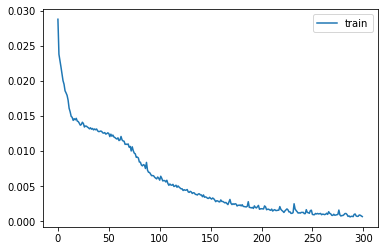

In [ ]:
plt.plot(history_full_lstm_10_15.history['loss'], label='train')
plt.legend()
#plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/loss.png")
plt.show()

In [ ]:
score = history_full_lstm_10_15.evaluate(X_test_scaled_10_15, y_test_scaled_10_15, batch_size=1)

AttributeError: 'History' object has no attribute 'evaluate'

In [ ]:
pred_lstm_full_16 = LSTM_full_10_15.predict(X_test_scaled_10_15) 
pred_train_lstm_full_16 = LSTM_full_10_15.predict(X_train_scaled_10_15)

55/55 [==============================] - 0s 6ms/step


In [ ]:
pred_train_lstm_full_16.shape
pred_lstm_full_16.shape

(440, 1)

In [ ]:
rmse_lstm_full_16 = np.sqrt(mean_squared_error(y_test_scaled_10_15, pred_lstm_full_16)) 
print("RMSE: %f" % (rmse_lstm_full_16)) 

RMSE: 0.093962


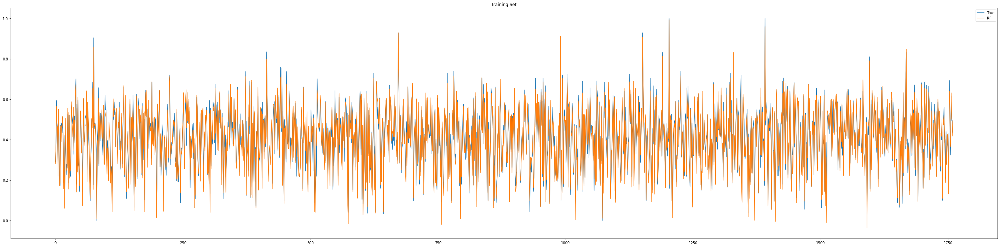

Training Set R-Square= 0.9543958975332626


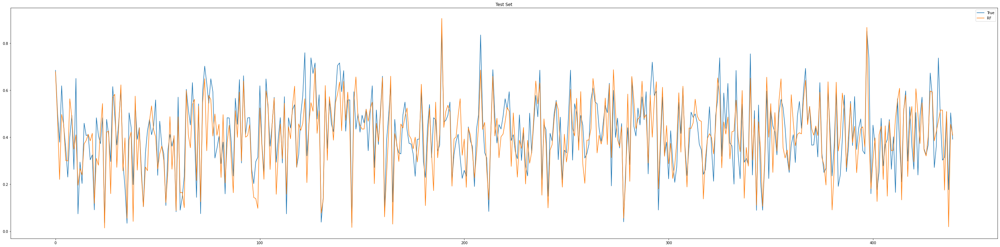

Test Set R-Square= 0.629119587337077


In [ ]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_scaled_10_15))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_lstm_full_16)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
#plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/train.png")

plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_scaled_10_15 ,pred_train_lstm_full_16)
print("Training Set R-Square=", rf_indices_r2_train)


plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_scaled_10_15))
# plt.plot(pred_train_mlp)
plt.plot(pred_lstm_full_16)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
#plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/test.png")

plt.show()

# Compute R-Square value for test set
rf_indices_r2_test = r2_score(y_test_scaled_10_15,pred_lstm_full_16)
print("Test Set R-Square=", rf_indices_r2_test)

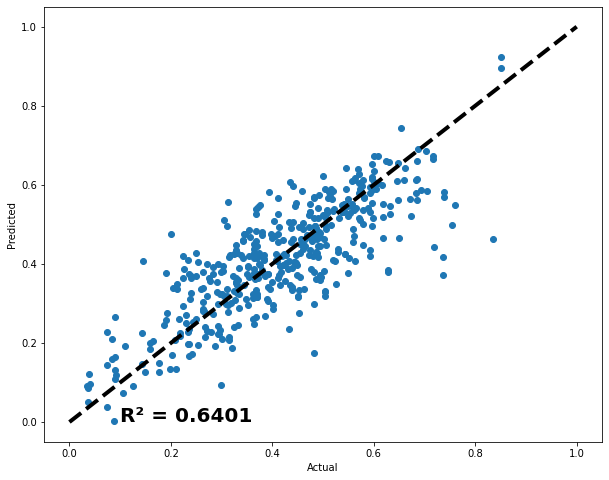

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15, pred_lstm_full_16)
ax.plot([test_scaled_10_15.min(), test_scaled_10_15.max()], [test_scaled_10_15.min(), test_scaled_10_15.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled_10_15, pred_lstm_full_16)),  (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/r2.png")

plt.show()

## Optuna LSTM

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Global overfitting threshold (same as XGB)
OVERFIT_THRESHOLD = 0.20

# Global best score for LSTM (we maximize R2, so higher is better)
best_score_lstm_2 = float('-inf')
lstm_model_path_2 = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/best_model.h5'

def optuna_lstm_2(trial):
    """
    Objective function for LSTM using 5‑fold cross validation.
    For each fold:
      - Further split the fold’s test/validation set 50–50.
      - Reshape the data (for LSTM, input shape is (n_features_2, 1)).
      - Train with early stopping (via ModelCheckpoint on the validation set).
      - Compute both training MSE and test MSE to check for overfitting.
    If any fold is overfitted, return a large penalty (-1e6).
    Otherwise, compute a trial score = (mean R2 – std R2) across folds.
    If the trial’s score beats the best so far, retrain a final model using the
    best fold’s split and save it.
    """
    clear_session()
    
    fold_test_r2s_2 = []
    fold_train_mses_2 = []
    fold_test_mses_2 = []
    fold_train_indices_2 = []
    fold_test_indices_2 = []
    fold_models_3 = []
    fold_history_2 = []
    
    for fold, (train_index_2, test_val_index_2) in enumerate(kf_10_15.split(X_scaled_10_15)):
        # Get fold data
        X_fold_train_2, X_fold_testval_2 = X_scaled_10_15[train_index_2], X_scaled_10_15[test_val_index_2]
        y_fold_train_2, y_fold_testval = y_scaled_10_15[train_index_2], y_scaled_10_15[test_val_index_2]
        fold_train_indices_2.append(train_index_2)
        fold_test_indices_2.append(test_val_index_2)
        
        # Further split test_val into test and validation sets (50–50)
        X_test_fold, X_val_fold, y_test_fold, y_val_fold = train_test_split(
            X_fold_testval_2, y_fold_testval, test_size=0.5, random_state=42
        )
        
        # Reshape inputs for LSTM: (samples, n_features, 1)
        n_features_2 = X_fold_train_2.shape[1]
        X_fold_train_2_r = X_fold_train_2.reshape(-1, n_features_2, 1)
        X_val_fold_r_2 = X_val_fold.reshape(-1, n_features_2, 1)
        X_test_fold_r_2 = X_test_fold.reshape(-1, n_features_2, 1)
        
        # -------------------------
        # 1. Hyperparameter suggestions
        # -------------------------

        units = trial.suggest_categorical('units', [32, 64, 128])
        lr = trial.suggest_float('lr', 5e-4, 5e-3, log=True)
        epochs = trial.suggest_int('epochs', 100, 300, step=10)
        batch_size = trial.suggest_categorical('batch_size', [32, 64])
        dropout = trial.suggest_float('dropout', 0.1, 0.3)

        
        # -------------------------
        # 2. Build and train the model with Dropout & EarlyStopping
        # -------------------------
        model = Sequential()
        model.add(LSTM(units=units, activation='tanh', dropout=dropout, return_sequences=True, input_shape=(n_features_2, 1)))
        model.add(LSTM(units=units//2, activation='tanh', dropout=dropout)) 
        model.add(Dense(1))
        model.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        tmp_checkpoint = 'temp_lstm_checkpoint.h5'
        checkpoint = ModelCheckpoint(tmp_checkpoint, monitor='val_loss', mode='min',
                                     save_best_only=True, verbose=0)
        early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
        
        history = model.fit(X_fold_train_2_r, y_fold_train_2, epochs=epochs, batch_size=batch_size,
                  validation_data=(X_val_fold_r_2, y_val_fold), callbacks=[checkpoint, early_stopping], verbose=0)
        model.load_weights(tmp_checkpoint)
        fold_models_3.append(model)
        fold_history_2.append(history)
        # -------------------------
        # 3. Evaluate and check for overfitting
        # -------------------------
        y_pred_test = model.predict(X_test_fold_r_2)
        test_r2 = r2_score(y_test_fold, y_pred_test)
        fold_test_r2s_2.append(test_r2)
        print(f" LSTM model R2: {test_r2:.4f}")

        y_pred_train = model.predict(X_fold_train_2_r)
        train_mse = mean_squared_error(y_fold_train_2, y_pred_train)
        test_mse = mean_squared_error(y_test_fold, y_pred_test)
        fold_train_mses_2.append(train_mse)
        fold_test_mses_2.append(test_mse)
        print(f"Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}")

        # # Overfitting check: if training MSE is much lower than test MSE, penalize.
        # if test_mse > 0 and ((test_mse - train_mse) / test_mse) > OVERFIT_THRESHOLD:
        #     return -1e6 # print("Overfitted!!")  # large penalty for overfitting
    
    # -------------------------
    # 4. Compute CV metrics and trial score
    # -------------------------
    mean_r2 = np.mean(fold_test_r2s_2)
    std_r2 = np.std(fold_test_r2s_2)
    # trial_score = mean_r2 - std_r2  # lower is better
    trial_score = mean_r2  # lower is better
    # Identify the fold with the highest test R2
    best_fold_index, best_fold_r2 = max(enumerate(fold_test_r2s_2), key=lambda x: x[1])
    
    # -------------------------
    # 5. Retrain final model if trial beats previous best
    # -------------------------
    global best_score_lstm_2
    if trial_score > best_score_lstm_2:
        print(f"Trial R2: {mean_r2:.4f} ± {std_r2:.4f}")
        best_score_lstm_2 = trial_score
        best_train_idx = fold_train_indices_2[best_fold_index]
        best_test_idx = fold_test_indices_2[best_fold_index]
        
        # Split the full data using the best fold's indices
        X_train_full, y_train_full = X_scaled_10_15[best_train_idx], y_scaled_10_15[best_train_idx]
        X_testval_full, y_testval_full = X_scaled_10_15[best_test_idx], y_scaled_10_15[best_test_idx]
        X_test_full, X_val_full, y_test_full, y_val_full = train_test_split(
            X_testval_full, y_testval_full, test_size=0.5, random_state=42
        )
        
        # Reshape for LSTM
        n_features_2 = X_train_full.shape[1]
        X_train_full_r = X_train_full.reshape(-1, n_features_2, 1)
        X_val_full_r = X_val_full.reshape(-1, n_features_2, 1)
        X_test_full_r = X_test_full.reshape(-1, n_features_2, 1)
        
       
        # final_model = Sequential()
        # final_model.add(LSTM(units=units, activation='tanh', dropout=dropout, return_sequences=True, input_shape=(n_features_2, 1)))
        # final_model.add(LSTM(units=units//2, activation='tanh', dropout=dropout)) 
        # final_model.add(Dense(1))
        # final_model.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        # final_checkpoint = ModelCheckpoint(lstm_model_path_2, monitor='val_loss', mode='min',
        #                                    save_best_only=True, verbose=0)
        # final_model.fit(X_train_full_r, y_train_full, epochs=epochs, batch_size=batch_size,
        #                 validation_data=(X_val_full_r, y_val_full), callbacks=[final_checkpoint, early_stopping], verbose=0)
        # final_model.load_weights(lstm_model_path_2)
        
        final_model_2 = fold_models_3[best_fold_index]

        y_pred_final = final_model_2.predict(X_test_full_r)
        final_r2 = r2_score(y_test_full, y_pred_final)
        print(f"Best LSTM model R2: {final_r2:.4f}")
        final_mse = mean_squared_error(y_test_full, y_pred_final)
        print(f"Best LSTM model MSE: {final_mse:.4f}")
        
        # Save final model info (optional)
        best_model_info = {
            "model": final_model_2,
            "history": fold_history_2[best_fold_index],
            "hyperparameters": {"units": units, "lr": lr, "epochs": epochs, "batch_size": batch_size, "dropout": dropout},
            "fold_data": {"X_train": X_train_full_r, "y_train": y_train_full, "X_test": X_test_full_r, "y_test": y_test_full, "X_val": X_val_full_r, "y_val": y_val_full}
                }
        save_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/best_model_info.pkl'
        with open(save_path, 'wb') as f:
            pickle.dump(best_model_info, f)
    
    return trial_score

study_lstm_2 = optuna.create_study(direction="maximize", study_name="lstm_regression")
study_lstm_2.optimize(optuna_lstm_2, n_trials=50)

print("Number of finished trials: {}".format(len(study_lstm_2.trials)))
print("Best trial:")
trial_lstm_2 = study_lstm_2.best_trial
print("  Value (mean R2 - std): {:.4f}".format(trial_lstm_2.value))
print("  Best hyperparameters:")
for key, value in trial_lstm_2.params.items():
    print("    {}: {}".format(key, value))


[I 2025-02-19 07:36:21,608] A new study created in memory with name: lstm_regression


7/7 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5076
55/55 [==============================] - 1s 10ms/step
Train MSE: 0.0129, Test MSE: 0.0130
7/7 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5095
55/55 [==============================] - 1s 11ms/step
Train MSE: 0.0095, Test MSE: 0.0101
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.3807
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0134, Test MSE: 0.0142
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.2823
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0166, Test MSE: 0.0144
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.2582
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0168, Test MSE: 0.0175
Trial R2: 0.3877 ± 0.1069
7/7 [==============================] - 0s 11ms/step
Best LSTM model R2: 0.5095
Best LSTM model MSE: 0.0101


INFO:tensorflow:Assets written to: ram://90a6858d-602f-4288-9774-71cce4597c60/assets


INFO:tensorflow:Assets written to: ram://90a6858d-602f-4288-9774-71cce4597c60/assets
[I 2025-02-19 07:47:45,865] Trial 0 finished with value: 0.38765588191364175 and parameters: {'units': 128, 'lr': 0.004968070172570192, 'epochs': 290, 'batch_size': 32, 'dropout': 0.264233704699408}. Best is trial 0 with value: 0.38765588191364175.


7/7 [==============================] - 0s 4ms/step
 LSTM model R2: 0.2380
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0190, Test MSE: 0.0201
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1442
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0184, Test MSE: 0.0176
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.3192
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0152, Test MSE: 0.0156
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.2323
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0190, Test MSE: 0.0154
7/7 [==============================] - 0s 4ms/step
 LSTM model R2: 0.1065
55/55 [==============================] - 0s 3ms/step


[I 2025-02-19 07:50:55,354] Trial 1 finished with value: 0.20806280781282388 and parameters: {'units': 32, 'lr': 0.0021505288649885895, 'epochs': 140, 'batch_size': 64, 'dropout': 0.2934457615281769}. Best is trial 0 with value: 0.38765588191364175.


Train MSE: 0.0185, Test MSE: 0.0211
7/7 [==============================] - 0s 4ms/step
 LSTM model R2: 0.4320
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0144, Test MSE: 0.0150
7/7 [==============================] - 2s 4ms/step
 LSTM model R2: 0.2687
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0151, Test MSE: 0.0151
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1136
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0194, Test MSE: 0.0203
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.2772
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0178, Test MSE: 0.0145
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1181
55/55 [==============================] - 0s 3ms/step


[I 2025-02-19 07:53:59,488] Trial 2 finished with value: 0.24190515048526065 and parameters: {'units': 32, 'lr': 0.002253318516169029, 'epochs': 160, 'batch_size': 32, 'dropout': 0.2761115932607208}. Best is trial 0 with value: 0.38765588191364175.


Train MSE: 0.0188, Test MSE: 0.0208
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5500
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0116, Test MSE: 0.0119
7/7 [==============================] - 1s 4ms/step
 LSTM model R2: 0.3472
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0127, Test MSE: 0.0135
7/7 [==============================] - 1s 3ms/step
 LSTM model R2: 0.3781
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0131, Test MSE: 0.0142
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.3953
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0130, Test MSE: 0.0121
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.4046
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0125, Test MSE: 0.0140
Trial R2: 0.4151 ± 0.0703
7/7 [==============================] - 0s 3ms/step
Best LSTM model R2: 0.5500
Best LSTM model MSE: 0.0119


INFO:tensorflow:Assets written to: ram://64c36463-9681-4fd9-953f-33bf32759b66/assets


INFO:tensorflow:Assets written to: ram://64c36463-9681-4fd9-953f-33bf32759b66/assets
[I 2025-02-19 07:58:12,704] Trial 3 finished with value: 0.41505136682185634 and parameters: {'units': 32, 'lr': 0.003725906203690608, 'epochs': 110, 'batch_size': 64, 'dropout': 0.20669306577437668}. Best is trial 3 with value: 0.41505136682185634.


7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.2071
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0195, Test MSE: 0.0209
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1245
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0188, Test MSE: 0.0181
7/7 [==============================] - 1s 3ms/step
 LSTM model R2: 0.1198
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0190, Test MSE: 0.0202
7/7 [==============================] - 0s 4ms/step
 LSTM model R2: 0.1722
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0199, Test MSE: 0.0166
7/7 [==============================] - 0s 4ms/step
 LSTM model R2: 0.1239
55/55 [==============================] - 0s 3ms/step


[I 2025-02-19 08:00:58,970] Trial 4 finished with value: 0.14951088567225282 and parameters: {'units': 32, 'lr': 0.0006121151692302056, 'epochs': 150, 'batch_size': 64, 'dropout': 0.25782229031426707}. Best is trial 3 with value: 0.41505136682185634.


Train MSE: 0.0189, Test MSE: 0.0206
7/7 [==============================] - 0s 6ms/step
 LSTM model R2: 0.6195
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0092, Test MSE: 0.0101
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.4964
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0089, Test MSE: 0.0104
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.5507
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0088, Test MSE: 0.0103
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.4790
55/55 [==============================] - 0s 6ms/step
Train MSE: 0.0101, Test MSE: 0.0105
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5650
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0089, Test MSE: 0.0103
Trial R2: 0.5421 ± 0.0503
7/7 [==============================] - 0s 5ms/step
Best LSTM model R2: 0.6195
Best LSTM model MSE: 0.0101


INFO:tensorflow:Assets written to: ram://2159640d-0495-4b49-a442-f7679a78103e/assets


INFO:tensorflow:Assets written to: ram://2159640d-0495-4b49-a442-f7679a78103e/assets
[I 2025-02-19 08:07:55,364] Trial 5 finished with value: 0.5421210226247655 and parameters: {'units': 64, 'lr': 0.0042451925423995975, 'epochs': 180, 'batch_size': 32, 'dropout': 0.20829818921852655}. Best is trial 5 with value: 0.5421210226247655.


7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.3341
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0165, Test MSE: 0.0176
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.2747
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0139, Test MSE: 0.0150
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.3185
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0156, Test MSE: 0.0156
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.2258
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0180, Test MSE: 0.0156
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.2798
55/55 [==============================] - 1s 14ms/step


[I 2025-02-19 08:18:51,334] Trial 6 finished with value: 0.2865858771704627 and parameters: {'units': 128, 'lr': 0.0036739765553656305, 'epochs': 200, 'batch_size': 32, 'dropout': 0.29998486139391745}. Best is trial 5 with value: 0.5421210226247655.


Train MSE: 0.0162, Test MSE: 0.0170
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.2526
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0189, Test MSE: 0.0197
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1395
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0186, Test MSE: 0.0177
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1203
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0193, Test MSE: 0.0201
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1861
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0197, Test MSE: 0.0163
7/7 [==============================] - 0s 17ms/step
 LSTM model R2: 0.1250
55/55 [==============================] - 0s 3ms/step


[I 2025-02-19 08:22:34,705] Trial 7 finished with value: 0.16468531164503455 and parameters: {'units': 32, 'lr': 0.000566538175166167, 'epochs': 170, 'batch_size': 64, 'dropout': 0.26183894013317754}. Best is trial 5 with value: 0.5421210226247655.


Train MSE: 0.0187, Test MSE: 0.0206
7/7 [==============================] - 1s 12ms/step
 LSTM model R2: 0.4386
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0140, Test MSE: 0.0148
7/7 [==============================] - 2s 13ms/step
 LSTM model R2: 0.3028
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0142, Test MSE: 0.0144
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.3387
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0139, Test MSE: 0.0151
7/7 [==============================] - 1s 17ms/step
 LSTM model R2: 0.4864
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0137, Test MSE: 0.0103
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.1440
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0182, Test MSE: 0.0202


[I 2025-02-19 08:38:46,276] Trial 8 finished with value: 0.34212856610583736 and parameters: {'units': 128, 'lr': 0.0006937988652500578, 'epochs': 120, 'batch_size': 32, 'dropout': 0.20863437619945474}. Best is trial 5 with value: 0.5421210226247655.


7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.3859
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0163, Test MSE: 0.0162
7/7 [==============================] - 1s 4ms/step
 LSTM model R2: 0.1530
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0175, Test MSE: 0.0175
7/7 [==============================] - 1s 4ms/step
 LSTM model R2: 0.3224
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0141, Test MSE: 0.0155
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.1890
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0196, Test MSE: 0.0163
7/7 [==============================] - 0s 4ms/step
 LSTM model R2: 0.2213
55/55 [==============================] - 0s 3ms/step


[I 2025-02-19 08:43:42,028] Trial 9 finished with value: 0.25431640455745974 and parameters: {'units': 32, 'lr': 0.0008869476740249356, 'epochs': 290, 'batch_size': 64, 'dropout': 0.11981949821884819}. Best is trial 5 with value: 0.5421210226247655.


Train MSE: 0.0164, Test MSE: 0.0183
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.4940
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0125, Test MSE: 0.0134
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.3501
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0122, Test MSE: 0.0134
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.4905
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0099, Test MSE: 0.0117
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5092
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0114, Test MSE: 0.0099
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4818
55/55 [==============================] - 0s 4ms/step


[I 2025-02-19 08:52:49,894] Trial 10 finished with value: 0.4651079739727617 and parameters: {'units': 64, 'lr': 0.001235248089575429, 'epochs': 240, 'batch_size': 32, 'dropout': 0.15866187839918505}. Best is trial 5 with value: 0.5421210226247655.


Train MSE: 0.0109, Test MSE: 0.0122
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.5547
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0107, Test MSE: 0.0118
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.4066
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0119, Test MSE: 0.0122
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4161
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0127, Test MSE: 0.0134
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4717
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0121, Test MSE: 0.0106
7/7 [==============================] - 0s 6ms/step
 LSTM model R2: 0.4252
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0118, Test MSE: 0.0135


[I 2025-02-19 09:02:00,620] Trial 11 finished with value: 0.454850747720557 and parameters: {'units': 64, 'lr': 0.0011489542642254271, 'epochs': 240, 'batch_size': 32, 'dropout': 0.16014033944573014}. Best is trial 5 with value: 0.5421210226247655.


7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.4356
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0125, Test MSE: 0.0149
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.3157
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0131, Test MSE: 0.0141
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.4699
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0107, Test MSE: 0.0121
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5461
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0105, Test MSE: 0.0091
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5062
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 09:11:18,583] Trial 12 finished with value: 0.45471183515827 and parameters: {'units': 64, 'lr': 0.001478661031079365, 'epochs': 230, 'batch_size': 32, 'dropout': 0.17305539272564638}. Best is trial 5 with value: 0.5421210226247655.


Train MSE: 0.0103, Test MSE: 0.0116
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6742
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0070, Test MSE: 0.0086
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5294
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0070, Test MSE: 0.0097
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.4861
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0106, Test MSE: 0.0118
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.4989
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0116, Test MSE: 0.0101
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5954
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0074, Test MSE: 0.0095
Trial R2: 0.5568 ± 0.0698
7/7 [==============================] - 0s 5ms/step
Best LSTM model R2: 0.6742
Best LSTM model MSE: 0.0086


INFO:tensorflow:Assets written to: ram://b53b6f09-bf09-4a84-9c9e-dee017321cdc/assets


INFO:tensorflow:Assets written to: ram://b53b6f09-bf09-4a84-9c9e-dee017321cdc/assets
[I 2025-02-19 09:20:49,092] Trial 13 finished with value: 0.5567849264197375 and parameters: {'units': 64, 'lr': 0.0016337500446076453, 'epochs': 230, 'batch_size': 32, 'dropout': 0.11018407359833016}. Best is trial 13 with value: 0.5567849264197375.


7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4748
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0119, Test MSE: 0.0139
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.2676
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0143, Test MSE: 0.0151
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4367
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0120, Test MSE: 0.0129
7/7 [==============================] - 3s 6ms/step
 LSTM model R2: 0.4976
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0134, Test MSE: 0.0101
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5288
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 09:28:16,514] Trial 14 finished with value: 0.4410900549876534 and parameters: {'units': 64, 'lr': 0.0020680997593317753, 'epochs': 200, 'batch_size': 32, 'dropout': 0.22994146680897073}. Best is trial 13 with value: 0.5567849264197375.


Train MSE: 0.0098, Test MSE: 0.0111
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.7243
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0052, Test MSE: 0.0073
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6054
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0055, Test MSE: 0.0081
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6893
55/55 [==============================] - 0s 6ms/step
Train MSE: 0.0057, Test MSE: 0.0071
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6378
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0053, Test MSE: 0.0073
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6102
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0066, Test MSE: 0.0092
Trial R2: 0.6534 ± 0.0463
7/7 [==============================] - 0s 5ms/step
Best LSTM model R2: 0.7243
Best LSTM model MSE: 0.0073


INFO:tensorflow:Assets written to: ram://dc9d194f-30b1-4d56-9bae-92a2bf9dcb4e/assets


INFO:tensorflow:Assets written to: ram://dc9d194f-30b1-4d56-9bae-92a2bf9dcb4e/assets
[I 2025-02-19 09:37:37,339] Trial 15 finished with value: 0.6534018147321716 and parameters: {'units': 64, 'lr': 0.0028081923029885094, 'epochs': 220, 'batch_size': 32, 'dropout': 0.1051022567065075}. Best is trial 15 with value: 0.6534018147321716.


7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6806
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0063, Test MSE: 0.0084
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6153
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0053, Test MSE: 0.0079
7/7 [==============================] - 1s 24ms/step
 LSTM model R2: 0.6532
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0062, Test MSE: 0.0079
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6395
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0061, Test MSE: 0.0072
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6441
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 09:46:54,735] Trial 16 finished with value: 0.6465264008619791 and parameters: {'units': 64, 'lr': 0.0031319319980819193, 'epochs': 260, 'batch_size': 32, 'dropout': 0.12021908484314273}. Best is trial 15 with value: 0.6534018147321716.


Train MSE: 0.0057, Test MSE: 0.0084
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6784
55/55 [==============================] - 0s 6ms/step
Train MSE: 0.0080, Test MSE: 0.0085
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5858
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0073, Test MSE: 0.0085
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6322
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0067, Test MSE: 0.0084
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6847
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0060, Test MSE: 0.0063
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6513
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 09:54:44,608] Trial 17 finished with value: 0.6464795205407678 and parameters: {'units': 64, 'lr': 0.0029932495570343916, 'epochs': 270, 'batch_size': 32, 'dropout': 0.125042633447882}. Best is trial 15 with value: 0.6534018147321716.


Train MSE: 0.0065, Test MSE: 0.0082
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6941
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0057, Test MSE: 0.0081
7/7 [==============================] - 0s 6ms/step
 LSTM model R2: 0.6095
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0058, Test MSE: 0.0081
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6661
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0059, Test MSE: 0.0076
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6027
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0064, Test MSE: 0.0080
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6713
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 10:03:46,861] Trial 18 finished with value: 0.6487363108212942 and parameters: {'units': 64, 'lr': 0.002857635092189526, 'epochs': 260, 'batch_size': 32, 'dropout': 0.10024500537662283}. Best is trial 15 with value: 0.6534018147321716.


Train MSE: 0.0054, Test MSE: 0.0077
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6949
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0052, Test MSE: 0.0081
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5888
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0053, Test MSE: 0.0085
7/7 [==============================] - 1s 7ms/step
 LSTM model R2: 0.6552
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0074, Test MSE: 0.0079
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6013
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0075, Test MSE: 0.0080
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.7232
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 10:12:14,781] Trial 19 finished with value: 0.6526794308823414 and parameters: {'units': 64, 'lr': 0.0027565654489337343, 'epochs': 210, 'batch_size': 32, 'dropout': 0.10339528331135994}. Best is trial 15 with value: 0.6534018147321716.


Train MSE: 0.0054, Test MSE: 0.0065
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.7023
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0064, Test MSE: 0.0079
7/7 [==============================] - 0s 7ms/step
 LSTM model R2: 0.5961
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0068, Test MSE: 0.0083
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5315
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0097, Test MSE: 0.0107
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.5295
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0088, Test MSE: 0.0095
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6070
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 10:20:47,636] Trial 20 finished with value: 0.5932860936916351 and parameters: {'units': 64, 'lr': 0.002507633505030555, 'epochs': 200, 'batch_size': 32, 'dropout': 0.1370186012354921}. Best is trial 15 with value: 0.6534018147321716.


Train MSE: 0.0069, Test MSE: 0.0093
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.7407
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0044, Test MSE: 0.0069
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6220
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0053, Test MSE: 0.0078
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6024
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0086, Test MSE: 0.0091
7/7 [==============================] - 1s 7ms/step
 LSTM model R2: 0.6475
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0050, Test MSE: 0.0071
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.7010
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0044, Test MSE: 0.0070
Trial R2: 0.6627 ± 0.0511
7/7 [==============================] - 0s 5ms/step
Best LSTM model R2: 0.7407
Best LSTM model MSE: 0.0069


INFO:tensorflow:Assets written to: ram://8a24de0f-35bc-49ba-9ad9-63ad0652a4cf/assets


INFO:tensorflow:Assets written to: ram://8a24de0f-35bc-49ba-9ad9-63ad0652a4cf/assets
[I 2025-02-19 10:30:38,500] Trial 21 finished with value: 0.6626917591823378 and parameters: {'units': 64, 'lr': 0.002738778997637705, 'epochs': 210, 'batch_size': 32, 'dropout': 0.10379324700292442}. Best is trial 21 with value: 0.6626917591823378.


7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6823
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0055, Test MSE: 0.0084
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6347
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0042, Test MSE: 0.0075
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5173
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0100, Test MSE: 0.0111
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6373
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0061, Test MSE: 0.0073
7/7 [==============================] - 1s 7ms/step
 LSTM model R2: 0.6368
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0070, Test MSE: 0.0086


[I 2025-02-19 10:40:09,261] Trial 22 finished with value: 0.6216826690372502 and parameters: {'units': 64, 'lr': 0.0025667547400668226, 'epochs': 210, 'batch_size': 32, 'dropout': 0.10093134937617829}. Best is trial 21 with value: 0.6626917591823378.


7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6757
55/55 [==============================] - 0s 6ms/step
Train MSE: 0.0075, Test MSE: 0.0086
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4993
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0089, Test MSE: 0.0103
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6340
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0079, Test MSE: 0.0084
7/7 [==============================] - 1s 20ms/step
 LSTM model R2: 0.6127
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0063, Test MSE: 0.0078
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.5752
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 10:50:08,997] Trial 23 finished with value: 0.5993882797730055 and parameters: {'units': 64, 'lr': 0.0019595548700514463, 'epochs': 220, 'batch_size': 32, 'dropout': 0.1324224852882112}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0071, Test MSE: 0.0100
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.7157
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0066, Test MSE: 0.0075
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5613
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0081, Test MSE: 0.0090
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.5210
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0095, Test MSE: 0.0110
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.5575
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0073, Test MSE: 0.0089
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6207
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 10:57:16,469] Trial 24 finished with value: 0.5952401969328818 and parameters: {'units': 64, 'lr': 0.003353713739445842, 'epochs': 180, 'batch_size': 32, 'dropout': 0.14270788023777745}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0063, Test MSE: 0.0089
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6653
55/55 [==============================] - 1s 11ms/step
Train MSE: 0.0065, Test MSE: 0.0088
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.5944
55/55 [==============================] - 1s 11ms/step
Train MSE: 0.0064, Test MSE: 0.0084
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6580
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0056, Test MSE: 0.0078
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6321
55/55 [==============================] - 1s 11ms/step
Train MSE: 0.0050, Test MSE: 0.0074
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6582
55/55 [==============================] - 1s 12ms/step


[I 2025-02-19 11:15:56,774] Trial 25 finished with value: 0.6416072391408066 and parameters: {'units': 128, 'lr': 0.002720168575774901, 'epochs': 180, 'batch_size': 32, 'dropout': 0.11178134663537535}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0054, Test MSE: 0.0081
7/7 [==============================] - 0s 6ms/step
 LSTM model R2: 0.7279
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0046, Test MSE: 0.0072
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6001
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0057, Test MSE: 0.0082
7/7 [==============================] - 1s 7ms/step
 LSTM model R2: 0.6939
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0058, Test MSE: 0.0070
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6237
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0063, Test MSE: 0.0076
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6365
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 11:25:46,716] Trial 26 finished with value: 0.65642105604874 and parameters: {'units': 64, 'lr': 0.004324701568072927, 'epochs': 210, 'batch_size': 64, 'dropout': 0.10029293211232829}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0066, Test MSE: 0.0086
7/7 [==============================] - 2s 6ms/step
 LSTM model R2: 0.6535
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0072, Test MSE: 0.0092
7/7 [==============================] - 1s 9ms/step
 LSTM model R2: 0.5916
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0062, Test MSE: 0.0084
7/7 [==============================] - 1s 7ms/step
 LSTM model R2: 0.5627
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0082, Test MSE: 0.0100
7/7 [==============================] - 0s 6ms/step
 LSTM model R2: 0.6148
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0064, Test MSE: 0.0077
7/7 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6096
55/55 [==============================] - 0s 5ms/step


[I 2025-02-19 11:36:42,439] Trial 27 finished with value: 0.6064227020233769 and parameters: {'units': 64, 'lr': 0.003981428913983966, 'epochs': 240, 'batch_size': 64, 'dropout': 0.12192808247434814}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0068, Test MSE: 0.0092
7/7 [==============================] - 1s 7ms/step
 LSTM model R2: 0.6406
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0068, Test MSE: 0.0095
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5039
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0088, Test MSE: 0.0102
7/7 [==============================] - 1s 7ms/step
 LSTM model R2: 0.6057
55/55 [==============================] - 0s 6ms/step
Train MSE: 0.0074, Test MSE: 0.0090
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6209
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0071, Test MSE: 0.0076
7/7 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6164
55/55 [==============================] - 0s 5ms/step
Train MSE: 0.0071, Test MSE: 0.0090


[I 2025-02-19 11:45:55,418] Trial 28 finished with value: 0.5974899465014706 and parameters: {'units': 64, 'lr': 0.0049999363373133855, 'epochs': 220, 'batch_size': 64, 'dropout': 0.14513522370267926}. Best is trial 21 with value: 0.6626917591823378.


7/7 [==============================] - 1s 21ms/step
 LSTM model R2: 0.7331
55/55 [==============================] - 1s 16ms/step
Train MSE: 0.0045, Test MSE: 0.0071
7/7 [==============================] - 3s 20ms/step
 LSTM model R2: 0.6538
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0050, Test MSE: 0.0071
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.5982
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0081, Test MSE: 0.0092
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6116
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0063, Test MSE: 0.0078
7/7 [==============================] - 1s 19ms/step
 LSTM model R2: 0.6846
55/55 [==============================] - 1s 14ms/step


[I 2025-02-19 12:07:34,874] Trial 29 finished with value: 0.6562254000901617 and parameters: {'units': 128, 'lr': 0.004554321124783216, 'epochs': 300, 'batch_size': 64, 'dropout': 0.11252114454944047}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0044, Test MSE: 0.0074
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6858
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0061, Test MSE: 0.0083
7/7 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5691
55/55 [==============================] - 1s 11ms/step
Train MSE: 0.0061, Test MSE: 0.0089
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6047
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0074, Test MSE: 0.0091
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6459
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0063, Test MSE: 0.0071
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6812
55/55 [==============================] - 1s 11ms/step


[I 2025-02-19 12:26:17,342] Trial 30 finished with value: 0.6373469560231808 and parameters: {'units': 128, 'lr': 0.00445171090511178, 'epochs': 300, 'batch_size': 64, 'dropout': 0.12531896908592138}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0055, Test MSE: 0.0075
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6876
55/55 [==============================] - 1s 11ms/step
Train MSE: 0.0064, Test MSE: 0.0083
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6607
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0059, Test MSE: 0.0070
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.5616
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0091, Test MSE: 0.0100
7/7 [==============================] - 1s 21ms/step
 LSTM model R2: 0.6672
55/55 [==============================] - 1s 16ms/step
Train MSE: 0.0041, Test MSE: 0.0067
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5918
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0078, Test MSE: 0.0096


[I 2025-02-19 12:44:25,048] Trial 31 finished with value: 0.6337865944094525 and parameters: {'units': 128, 'lr': 0.004557147338229654, 'epochs': 280, 'batch_size': 64, 'dropout': 0.111550437999368}. Best is trial 21 with value: 0.6626917591823378.


7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6595
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0065, Test MSE: 0.0090
7/7 [==============================] - 1s 17ms/step
 LSTM model R2: 0.6404
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0054, Test MSE: 0.0074
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.7308
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0047, Test MSE: 0.0062
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6166
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0078, Test MSE: 0.0077
7/7 [==============================] - 1s 17ms/step
 LSTM model R2: 0.6477
55/55 [==============================] - 1s 14ms/step


[I 2025-02-19 13:07:06,442] Trial 32 finished with value: 0.6589962265066112 and parameters: {'units': 128, 'lr': 0.003460165423301999, 'epochs': 260, 'batch_size': 64, 'dropout': 0.1121989524434245}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0059, Test MSE: 0.0083
7/7 [==============================] - 1s 17ms/step
 LSTM model R2: 0.6921
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0053, Test MSE: 0.0081
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.5797
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0059, Test MSE: 0.0087
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6260
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0068, Test MSE: 0.0086
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6848
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0055, Test MSE: 0.0063
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6578
55/55 [==============================] - 1s 18ms/step


[I 2025-02-19 13:28:33,383] Trial 33 finished with value: 0.6480782057636011 and parameters: {'units': 128, 'lr': 0.0034937218913350574, 'epochs': 300, 'batch_size': 64, 'dropout': 0.13335092466608411}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0064, Test MSE: 0.0081
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6196
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0073, Test MSE: 0.0100
7/7 [==============================] - 1s 19ms/step
 LSTM model R2: 0.5654
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0068, Test MSE: 0.0090
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6526
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0065, Test MSE: 0.0080
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5591
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0073, Test MSE: 0.0089
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6631
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0054, Test MSE: 0.0079


[I 2025-02-19 13:45:47,698] Trial 34 finished with value: 0.6119493335925271 and parameters: {'units': 128, 'lr': 0.0039888741156597326, 'epochs': 260, 'batch_size': 64, 'dropout': 0.11622090208906474}. Best is trial 21 with value: 0.6626917591823378.


7/7 [==============================] - 1s 20ms/step
 LSTM model R2: 0.7074
55/55 [==============================] - 1s 17ms/step
Train MSE: 0.0060, Test MSE: 0.0077
7/7 [==============================] - 2s 16ms/step
 LSTM model R2: 0.6053
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0062, Test MSE: 0.0081
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6989
55/55 [==============================] - 1s 16ms/step
Train MSE: 0.0048, Test MSE: 0.0069
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6231
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0065, Test MSE: 0.0076
7/7 [==============================] - 1s 19ms/step
 LSTM model R2: 0.6757
55/55 [==============================] - 1s 15ms/step


[I 2025-02-19 14:10:11,441] Trial 35 finished with value: 0.6620665881178753 and parameters: {'units': 128, 'lr': 0.0034091845585456308, 'epochs': 280, 'batch_size': 64, 'dropout': 0.101198043018223}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0052, Test MSE: 0.0076
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.7014
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0046, Test MSE: 0.0079
7/7 [==============================] - 1s 20ms/step
 LSTM model R2: 0.6198
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0055, Test MSE: 0.0078
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6072
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0069, Test MSE: 0.0090
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6119
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0067, Test MSE: 0.0078
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6493
55/55 [==============================] - 1s 15ms/step


[I 2025-02-19 14:33:53,400] Trial 36 finished with value: 0.6379302805908859 and parameters: {'units': 128, 'lr': 0.0032735058950870833, 'epochs': 280, 'batch_size': 64, 'dropout': 0.10213301032935539}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0056, Test MSE: 0.0083
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6025
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0091, Test MSE: 0.0105
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6544
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0054, Test MSE: 0.0071
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6556
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0065, Test MSE: 0.0079
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6038
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0059, Test MSE: 0.0080
7/7 [==============================] - 1s 17ms/step
 LSTM model R2: 0.6403
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0063, Test MSE: 0.0085


[I 2025-02-19 14:53:45,637] Trial 37 finished with value: 0.6313242563888197 and parameters: {'units': 128, 'lr': 0.004070855652996395, 'epochs': 250, 'batch_size': 64, 'dropout': 0.12876436841482614}. Best is trial 21 with value: 0.6626917591823378.


7/7 [==============================] - 1s 21ms/step
 LSTM model R2: 0.6648
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0068, Test MSE: 0.0089
7/7 [==============================] - 1s 21ms/step
 LSTM model R2: 0.4328
55/55 [==============================] - 1s 17ms/step
Train MSE: 0.0100, Test MSE: 0.0117
7/7 [==============================] - 1s 20ms/step
 LSTM model R2: 0.5954
55/55 [==============================] - 1s 17ms/step
Train MSE: 0.0088, Test MSE: 0.0093
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6387
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0064, Test MSE: 0.0073
7/7 [==============================] - 1s 19ms/step
 LSTM model R2: 0.6470
55/55 [==============================] - 1s 15ms/step


[I 2025-02-19 15:13:19,551] Trial 38 finished with value: 0.5957395407564766 and parameters: {'units': 128, 'lr': 0.0035381754516631506, 'epochs': 140, 'batch_size': 64, 'dropout': 0.11636395964951154}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0071, Test MSE: 0.0083
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5787
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0109, Test MSE: 0.0111
7/7 [==============================] - 0s 4ms/step
 LSTM model R2: 0.4616
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0099, Test MSE: 0.0111
7/7 [==============================] - 1s 3ms/step
 LSTM model R2: 0.4477
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0121, Test MSE: 0.0126
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.4807
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0125, Test MSE: 0.0104
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5454
55/55 [==============================] - 0s 3ms/step


[I 2025-02-19 15:18:02,794] Trial 39 finished with value: 0.5028204664481246 and parameters: {'units': 32, 'lr': 0.0038524801638749897, 'epochs': 280, 'batch_size': 64, 'dropout': 0.14416069626152744}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0104, Test MSE: 0.0107
7/7 [==============================] - 1s 19ms/step
 LSTM model R2: 0.7138
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0046, Test MSE: 0.0076
7/7 [==============================] - 1s 19ms/step
 LSTM model R2: 0.6733
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0049, Test MSE: 0.0067
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6609
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0060, Test MSE: 0.0078
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6227
55/55 [==============================] - 1s 11ms/step
Train MSE: 0.0052, Test MSE: 0.0076
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6347
55/55 [==============================] - 1s 11ms/step


[I 2025-02-19 15:44:23,804] Trial 40 finished with value: 0.6610830216505084 and parameters: {'units': 128, 'lr': 0.002421312636413313, 'epochs': 250, 'batch_size': 64, 'dropout': 0.10095755678322875}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0057, Test MSE: 0.0086
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6213
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0092, Test MSE: 0.0100
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6101
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0052, Test MSE: 0.0080
7/7 [==============================] - 1s 19ms/step
 LSTM model R2: 0.6806
55/55 [==============================] - 1s 16ms/step
Train MSE: 0.0048, Test MSE: 0.0073
7/7 [==============================] - 1s 24ms/step
 LSTM model R2: 0.6002
55/55 [==============================] - 1s 17ms/step
Train MSE: 0.0069, Test MSE: 0.0080
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.7022
55/55 [==============================] - 1s 15ms/step


[I 2025-02-19 16:08:35,991] Trial 41 finished with value: 0.6428987566788761 and parameters: {'units': 128, 'lr': 0.002354280770196041, 'epochs': 250, 'batch_size': 64, 'dropout': 0.10060637304953929}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0044, Test MSE: 0.0070
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6849
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0050, Test MSE: 0.0083
7/7 [==============================] - 1s 20ms/step
 LSTM model R2: 0.5938
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0050, Test MSE: 0.0084
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6165
55/55 [==============================] - 1s 16ms/step
Train MSE: 0.0069, Test MSE: 0.0088
7/7 [==============================] - 1s 19ms/step
 LSTM model R2: 0.7078
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0044, Test MSE: 0.0059
7/7 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6083
55/55 [==============================] - 1s 12ms/step


[I 2025-02-19 16:34:25,608] Trial 42 finished with value: 0.6422691298751916 and parameters: {'units': 128, 'lr': 0.0031043958067111296, 'epochs': 270, 'batch_size': 64, 'dropout': 0.11241477222852045}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0074, Test MSE: 0.0092
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6636
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0067, Test MSE: 0.0089
7/7 [==============================] - 1s 17ms/step
 LSTM model R2: 0.6124
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0055, Test MSE: 0.0080
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6499
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0057, Test MSE: 0.0080
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6241
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0057, Test MSE: 0.0076
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.7063
55/55 [==============================] - 1s 13ms/step


[I 2025-02-19 16:55:10,713] Trial 43 finished with value: 0.6512515320538569 and parameters: {'units': 128, 'lr': 0.0036055257881304754, 'epochs': 170, 'batch_size': 64, 'dropout': 0.12281210118327274}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0052, Test MSE: 0.0069
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5326
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0108, Test MSE: 0.0123
7/7 [==============================] - 1s 4ms/step
 LSTM model R2: 0.4640
55/55 [==============================] - 0s 4ms/step
Train MSE: 0.0104, Test MSE: 0.0111
7/7 [==============================] - 1s 4ms/step
 LSTM model R2: 0.5461
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0093, Test MSE: 0.0104
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5185
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0097, Test MSE: 0.0097
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1597
55/55 [==============================] - 0s 3ms/step


[I 2025-02-19 17:01:11,833] Trial 44 finished with value: 0.44418380660450313 and parameters: {'units': 32, 'lr': 0.0023446910178869743, 'epochs': 270, 'batch_size': 64, 'dropout': 0.11099479752488356}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0175, Test MSE: 0.0198
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6732
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0053, Test MSE: 0.0086
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.5507
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0075, Test MSE: 0.0093
7/7 [==============================] - 1s 17ms/step
 LSTM model R2: 0.6609
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0062, Test MSE: 0.0078
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6705
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0052, Test MSE: 0.0066
7/7 [==============================] - 1s 12ms/step
 LSTM model R2: 0.6859
55/55 [==============================] - 1s 11ms/step


[I 2025-02-19 17:24:42,800] Trial 45 finished with value: 0.6482457126775101 and parameters: {'units': 128, 'lr': 0.0032415445105572686, 'epochs': 190, 'batch_size': 64, 'dropout': 0.12819450531344517}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0068, Test MSE: 0.0074
7/7 [==============================] - 1s 19ms/step
 LSTM model R2: 0.6642
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0071, Test MSE: 0.0089
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.5468
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0067, Test MSE: 0.0093
7/7 [==============================] - 1s 20ms/step
 LSTM model R2: 0.6404
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0074, Test MSE: 0.0082
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.5137
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0082, Test MSE: 0.0098
7/7 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6050
55/55 [==============================] - 1s 14ms/step


[I 2025-02-19 17:39:23,406] Trial 46 finished with value: 0.594005970761847 and parameters: {'units': 128, 'lr': 0.0037308075667643113, 'epochs': 100, 'batch_size': 64, 'dropout': 0.1187988162996149}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0083, Test MSE: 0.0093
7/7 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5666
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0102, Test MSE: 0.0114
7/7 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5257
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0092, Test MSE: 0.0098
7/7 [==============================] - 1s 4ms/step
 LSTM model R2: 0.5915
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0084, Test MSE: 0.0094
7/7 [==============================] - 0s 4ms/step
 LSTM model R2: 0.5251
55/55 [==============================] - 0s 3ms/step
Train MSE: 0.0092, Test MSE: 0.0095
7/7 [==============================] - 0s 4ms/step
 LSTM model R2: 0.6288
55/55 [==============================] - 0s 3ms/step


[I 2025-02-19 17:46:24,927] Trial 47 finished with value: 0.5675492065671435 and parameters: {'units': 32, 'lr': 0.002194732974277202, 'epochs': 230, 'batch_size': 64, 'dropout': 0.10007926436898706}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0075, Test MSE: 0.0087
7/7 [==============================] - 1s 12ms/step
 LSTM model R2: 0.7262
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0045, Test MSE: 0.0072
7/7 [==============================] - 1s 17ms/step
 LSTM model R2: 0.5564
55/55 [==============================] - 1s 14ms/step
Train MSE: 0.0060, Test MSE: 0.0091
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.7092
55/55 [==============================] - 1s 13ms/step
Train MSE: 0.0045, Test MSE: 0.0067
7/7 [==============================] - 1s 19ms/step
 LSTM model R2: 0.6520
55/55 [==============================] - 1s 16ms/step
Train MSE: 0.0061, Test MSE: 0.0070
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6388
55/55 [==============================] - 1s 13ms/step


[I 2025-02-19 18:08:01,678] Trial 48 finished with value: 0.6565340701984215 and parameters: {'units': 128, 'lr': 0.004275338351751008, 'epochs': 250, 'batch_size': 64, 'dropout': 0.11074294096156662}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0064, Test MSE: 0.0085
7/7 [==============================] - 1s 18ms/step
 LSTM model R2: 0.6216
55/55 [==============================] - 1s 15ms/step
Train MSE: 0.0094, Test MSE: 0.0100
7/7 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5976
55/55 [==============================] - 1s 11ms/step
Train MSE: 0.0059, Test MSE: 0.0083
7/7 [==============================] - 1s 15ms/step
 LSTM model R2: 0.5511
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0100, Test MSE: 0.0103
7/7 [==============================] - 1s 12ms/step
 LSTM model R2: 0.5718
55/55 [==============================] - 1s 12ms/step
Train MSE: 0.0072, Test MSE: 0.0086
7/7 [==============================] - 1s 17ms/step
 LSTM model R2: 0.6499
55/55 [==============================] - 1s 14ms/step


[I 2025-02-19 18:28:57,818] Trial 49 finished with value: 0.5984001649374691 and parameters: {'units': 128, 'lr': 0.0031825152604273103, 'epochs': 250, 'batch_size': 64, 'dropout': 0.1365542275568594}. Best is trial 21 with value: 0.6626917591823378.


Train MSE: 0.0055, Test MSE: 0.0082
Number of finished trials: 50
Best trial:
  Value (mean R2 - std): 0.6627
  Best hyperparameters:
    units: 64
    lr: 0.002738778997637705
    epochs: 210
    batch_size: 32
    dropout: 0.10379324700292442


In [ ]:
study_lstm_2 = optuna.create_study(direction="maximize")
study_lstm_2.optimize(lstm_optuna_case2, n_trials=50)

print("Number of finished trials: {}".format(len(study_lstm_2.trials)))

print("Best trial:")
trial_lstm_2 = study_lstm_2.best_trial

print("  Value: {}".format(trial_lstm_2.value))

print("  Params: ")
for key, value in trial_lstm_2.params.items():
    print("    {}: {}".format(key, value))

[I 2023-10-29 18:12:14,150] A new study created in memory with name: no-name-8e7d54df-4388-41cb-998e-542b03699fc2


[I 2023-10-29 18:34:06,129] Trial 0 finished with value: 0.6800127029418945 and parameters: {'units': 64, 'lr': 0.0008558432381922752, 'epochs': 250}. Best is trial 0 with value: 0.6800127029418945.
[I 2023-10-29 18:50:05,942] Trial 1 finished with value: 0.5773618817329407 and parameters: {'units': 16, 'lr': 0.0009513856508249928, 'epochs': 300}. Best is trial 0 with value: 0.6800127029418945.
[I 2023-10-29 19:04:05,092] Trial 2 finished with value: 0.6524996161460876 and parameters: {'units': 32, 'lr': 0.000493324648084258, 'epochs': 260}. Best is trial 0 with value: 0.6800127029418945.
[I 2023-10-29 19:47:17,726] Trial 3 finished with value: 0.7298488616943359 and parameters: {'units': 128, 'lr': 0.0009979805843283594, 'epochs': 350}. Best is trial 3 with value: 0.7298488616943359.
[I 2023-10-29 20:01:33,475] Trial 4 finished with value: 0.35463351011276245 and parameters: {'units': 16, 'lr': 0.0001397048907026962, 'epochs': 280}. Best is trial 3 with value: 0.7298488616943359.
[I 2

Number of finished trials: 50
Best trial:
  Value: 0.7298488616943359
  Params: 
    units: 128
    lr: 0.0009979805843283594
    epochs: 350


## MLP

In [ ]:
clear_session()
MLP_full_16 = Sequential()
MLP_full_16.add(Dense(256, activation="relu",input_shape=(X_train_scaled_10_15.shape[1],1)))
#MLP_full.add(Dropout(0.2))
MLP_full_16.add(Dense(64, activation="relu"))
#MLP_full.add(Dropout(0.4))
MLP_full_16.add(Dense(8, activation="relu"))
MLP_full_16.add(Flatten())    
MLP_full_16.add(Dense(1))
MLP_full_16.compile(loss='mse', optimizer=Adam(lr=0.0005761073539838296), metrics=[RSquare()])#,decay=1e-3 / 200))

history_MLP_full_16 = MLP_full_16.fit(X_train_scaled_10_15, y_train_scaled_10_15, epochs=320, batch_size=4)


Epoch 1/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0213 - r_square: 0.0688
Epoch 2/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0138 - r_square: 0.3983
Epoch 3/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0126 - r_square: 0.4514
Epoch 4/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0112 - r_square: 0.5092
Epoch 5/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0105 - r_square: 0.5420
Epoch 6/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0099 - r_square: 0.5692
Epoch 7/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0094 - r_square: 0.5882
Epoch 8/320
440/440 [==============================] - 1s 3ms/step - loss: 0.0094 - r_square: 0.5906
Epoch 9/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0089 - r_square: 0.6096
Epoch 10/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0088 - r_squa

In [ ]:
pred_train_mlp_full_16 = MLP_full_16.predict(X_train_scaled_10_15)
pred_test_mlp_full_16 = MLP_full_16.predict(X_test_scaled_10_15)

14/14 [==============================] - 0s 3ms/step


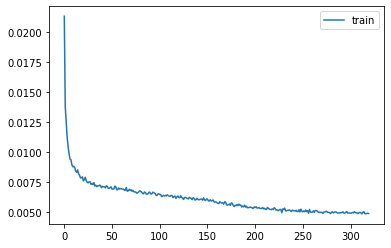

In [ ]:
plt.plot(history_MLP_full_16.history['loss'], label='train')
plt.legend()
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/mlp/loss.png")
plt.show()

In [ ]:
rmse_mlp_full_16 = np.sqrt(mean_squared_error(y_test_scaled_10_15, pred_test_mlp_full_16)) 
print("RMSE: %f" % (rmse_mlp_full_16)) 

RMSE: 0.089395


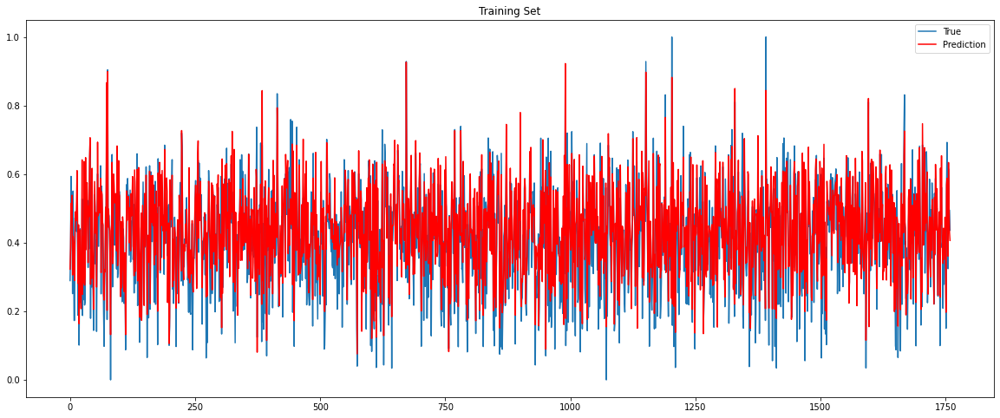

Training Set R-Square= 0.7578182427538446


In [ ]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_scaled_10_15))
plt.plot(pred_train_mlp_full_16,'r')
plt.title("Average WFV predictions on train data")
plt.legend(["True", "Prediction"])
plt.title('Training Set')
plt.savefig("")
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_train = r2_score(y_train_scaled_10_15,pred_train_mlp_full_16)
print("Training Set R-Square=", mlp_indices_r2_train)

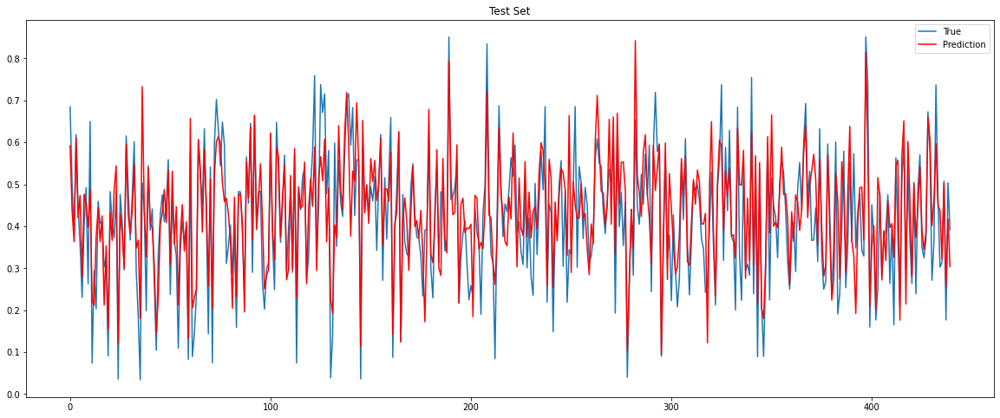

Test Set R-Square= 0.6642942262886022


In [ ]:

plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_scaled_10_15))
plt.plot(pred_test_mlp_full_16,'r')
plt.title("Average WFV predictions on test data")
plt.legend(["True", "Prediction"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_test = r2_score(y_test_scaled_10_15,pred_test_mlp_full_16)
print("Test Set R-Square=", mlp_indices_r2_test)


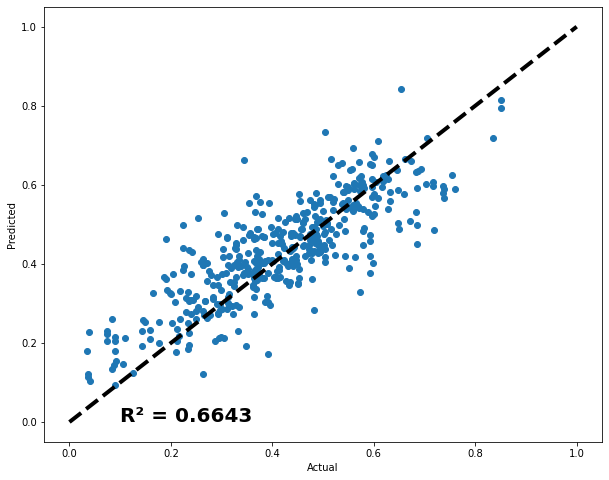

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15, pred_test_mlp_full_16)
ax.plot([test_scaled_10_15.min(), test_scaled_10_15.max()], [test_scaled_10_15.min(), test_scaled_10_15.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled_10_15, pred_test_mlp_full_16)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/mlp/r2.png")
plt.show()


## Optuna MLP

In [264]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Dropout
from tensorflow.keras.regularizers import l2

# Global overfitting threshold (same as XGB)
OVERFIT_THRESHOLD = 0.20

# Global best score for MLP (we maximize R2)
best_score_mlp_2 = float('-inf')
mlp_model_path_2 = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/mlp/best_model.h5'

def optuna_mlp_2(trial):
    """
    Objective function for MLP using 5‑fold cross validation.
    """
    clear_session()
    
    fold_test_r2s_2 = []
    fold_train_mses_2 = []
    fold_test_mses_2 = []
    fold_train_indices_2 = []
    fold_test_indices_2 = []
    fold_models_2 = []
    fold_history_2 = []

    for fold, (train_index, test_val_index) in enumerate(kf_10_15.split(X_scaled_10_15)):
        # Get fold data
        X_fold_train, X_fold_testval = X_scaled_10_15[train_index], X_scaled_10_15[test_val_index]
        y_fold_train, y_fold_testval = y_scaled_10_15[train_index], y_scaled_10_15[test_val_index]
        fold_train_indices_2.append(train_index)
        fold_test_indices_2.append(test_val_index)
        
        # Further split test_val into test and validation sets (50–50)
        X_test_fold, X_val_fold, y_test_fold, y_val_fold = train_test_split(
            X_fold_testval, y_fold_testval, test_size=0.5, random_state=42
        )
        
        # Hyperparameter suggestions
        # units1 = trial.suggest_categorical('units_1', [32, 64, 128])
        # units2 = trial.suggest_categorical('units_2', [16, 32])
        # units3 = trial.suggest_categorical('units_3', [8, 16])
        # lr = trial.suggest_float('lr', 3e-4, 3e-3, log=True)
        # epochs = trial.suggest_int('epochs', 80, 200, step=10)
        # dropout = trial.suggest_float('dropout', 0.2, 0.5)
        # batch_size = trial.suggest_categorical('batch_size', [64, 128])
        # l2_reg = trial.suggest_float('l2_reg', 1e-5, 1e-2, log=True)

        units1 = trial.suggest_categorical('units_1', [32, 64, 128])
        units2 = trial.suggest_categorical('units_2', [16, 32])
        units3 = trial.suggest_categorical('units_3', [8, 16])
        lr = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
        epochs = trial.suggest_int('epochs', 80, 200, step=10)
        dropout = trial.suggest_float('dropout', 0.1, 0.3)
        batch_size = trial.suggest_categorical('batch_size', [64, 128])
        l2_reg = trial.suggest_float('l2_reg', 1e-5, 1e-2, log=True)

        # Build and train the model_2
        model_2 = Sequential()
        model_2.add(Dense(units1, activation='relu', kernel_regularizer=l2(l2_reg), input_shape=(X_fold_train.shape[1],)))
        model_2.add(Dropout(dropout))
        model_2.add(Dense(units2, activation='relu', kernel_regularizer=l2(l2_reg)))
        model_2.add(Dropout(dropout))
        model_2.add(Dense(units3, activation='relu', kernel_regularizer=l2(l2_reg)))
        model_2.add(Dense(1))
        model_2.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        fold_models_2.append(model_2)
        tmp_checkpoint_2 = 'temp_mlp_checkpoint.h5'
        checkpoint_2 = ModelCheckpoint(tmp_checkpoint_2, monitor='val_loss', mode='min',
                                     save_best_only=True, verbose=0)
        early_stopping_2 = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
        
        history = model_2.fit(X_fold_train, y_fold_train, epochs=epochs, batch_size=batch_size,
                  validation_data=(X_val_fold, y_val_fold), callbacks=[checkpoint_2, early_stopping_2], verbose=0)
        model_2.load_weights(tmp_checkpoint_2)
        fold_history_2.append(history)
        
        # Evaluate model_2
        y_pred_test = model_2.predict(X_test_fold)
        test_r2 = r2_score(y_test_fold, y_pred_test)
        fold_test_r2s_2.append(test_r2)
        
        y_pred_train = model_2.predict(X_fold_train)
        train_mse = mean_squared_error(y_fold_train, y_pred_train)
        test_mse = mean_squared_error(y_test_fold, y_pred_test)
        fold_train_mses_2.append(train_mse)
        fold_test_mses_2.append(test_mse)
        
        # if test_mse > 0 and ((test_mse - train_mse) / test_mse) > OVERFIT_THRESHOLD:
        #     return -1e6  # penalty for overfitting
    
    # Compute CV metrics
    mean_r2 = np.mean(fold_test_r2s_2)
    std_r2 = np.std(fold_test_r2s_2)
    trial_score = mean_r2  # maximize R2
    
    best_fold_index, best_fold_r2 = max(enumerate(fold_test_r2s_2), key=lambda x: x[1])
    
    # Retrain final model_2 if trial beats previous best
    global best_score_mlp_2
    if trial_score > best_score_mlp_2:
        best_score_mlp_2 = trial_score
        best_train_idx = fold_train_indices_2[best_fold_index]
        best_test_idx = fold_test_indices_2[best_fold_index]
        
        X_train_full, y_train_full = X_scaled_10_15[best_train_idx], y_scaled_10_15[best_train_idx]
        X_testval_full, y_testval_full = X_scaled_10_15[best_test_idx], y_scaled_10_15[best_test_idx]
        X_test_full, X_val_full, y_test_full, y_val_full = train_test_split(
            X_testval_full, y_testval_full, test_size=0.5, random_state=42
        )
        
        # final_model_2 = Sequential()
        # final_model_2.add(Dense(units1, activation='relu', kernel_regularizer=l2(l2_reg), input_shape=(X_fold_train.shape[1],)))
        # final_model_2.add(Dropout(dropout))
        # final_model_2.add(Dense(units2, activation='relu', kernel_regularizer=l2(l2_reg)))
        # final_model_2.add(Dropout(dropout))
        # final_model_2.add(Dense(units3, activation='relu', kernel_regularizer=l2(l2_reg)))
        # final_model_2.add(Dense(1))
        # final_model_2.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        # final_checkpoint_2 = ModelCheckpoint(mlp_model_path_2, monitor='val_loss', mode='min',
        #                                    save_best_only=True, verbose=0)
        # final_model_2.fit(X_train_full, y_train_full, epochs=epochs, batch_size=batch_size,
        #                 validation_data=(X_val_full, y_val_full), callbacks=[final_checkpoint_2, early_stopping_2], verbose=0)
        # final_model_2.load_weights(mlp_model_path_2)
        
        final_model_2 = fold_models_2[best_fold_index]
        y_pred_final = final_model_2.predict(X_test_full)
        final_r2 = r2_score(y_test_full, y_pred_final)
        print(f"Best MLP model R2: {final_r2:.4f}")
        
        best_model_info = {
            "model": final_model_2,
           "history": fold_history_2[best_fold_index],
            "hyperparameters": {"units_1": units1, "units_2": units2, "units_3": units3, "lr": lr, "epochs": epochs, "batch_size": batch_size, "dropout": dropout, "l2_reg": l2_reg},
            "fold_data": {"X_train": X_train_full, "y_train": y_train_full, "X_test": X_test_full, "y_test": y_test_full, "X_val": X_val_full, "y_val": y_val_full}
        }
        save_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/mlp/best_model_info.pkl'
        with open(save_path, 'wb') as f:
            pickle.dump(best_model_info, f)
    
    return trial_score
    
study_mlp_2 = optuna.create_study(direction="maximize", study_name="mlp_regression_case2")
study_mlp_2.optimize(optuna_mlp_2, n_trials=30)
print("Number of finished trials: {}".format(len(study_mlp_2.trials)))

print("Best trial:")
trial_mlp_2 = study_mlp_2.best_trial

print("  Value: {}".format(trial_mlp_2.value))

print("  Params: ")
for key, value in trial_mlp_2.params.items():
    print("    {}: {}".format(key, value))


[I 2025-02-20 19:50:38,421] A new study created in memory with name: mlp_regression_case2


7/7 [==============================] - 0s 445us/step
Best MLP model R2: 0.6412
INFO:tensorflow:Assets written to: ram://3677ede0-4ed6-4a9b-98f6-7805f199e7a8/assets


INFO:tensorflow:Assets written to: ram://3677ede0-4ed6-4a9b-98f6-7805f199e7a8/assets
[I 2025-02-20 19:51:02,219] Trial 0 finished with value: 0.39254964351684984 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.00012303404365116875, 'epochs': 190, 'dropout': 0.25267910751721356, 'batch_size': 64, 'l2_reg': 0.00030676939723007097}. Best is trial 0 with value: 0.39254964351684984.


7/7 [==============================] - 0s 452us/step
Best MLP model R2: 0.7073
INFO:tensorflow:Assets written to: ram://d426860c-31db-4222-a13e-91b9facf28d9/assets


INFO:tensorflow:Assets written to: ram://d426860c-31db-4222-a13e-91b9facf28d9/assets
[I 2025-02-20 19:51:24,945] Trial 1 finished with value: 0.6366115813236023 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0004464813710089903, 'epochs': 140, 'dropout': 0.14283243009700525, 'batch_size': 64, 'l2_reg': 0.001280866698413433}. Best is trial 1 with value: 0.6366115813236023.


55/55 [==============================] - 0s 341us/step


[I 2025-02-20 19:51:37,510] Trial 2 finished with value: 0.26002716460272524 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.00040874454544147064, 'epochs': 130, 'dropout': 0.26883665614100904, 'batch_size': 128, 'l2_reg': 7.201191025916311e-05}. Best is trial 1 with value: 0.6366115813236023.


55/55 [==============================] - 0s 337us/step


[I 2025-02-20 19:51:42,880] Trial 3 finished with value: -0.08125726847413917 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.00013987801653397264, 'epochs': 130, 'dropout': 0.28596433405120236, 'batch_size': 128, 'l2_reg': 1.8833635778170894e-05}. Best is trial 1 with value: 0.6366115813236023.


55/55 [==============================] - 0s 331us/step


[I 2025-02-20 19:51:50,678] Trial 4 finished with value: 0.5597322461517031 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0009383256029896563, 'epochs': 190, 'dropout': 0.12412780314446836, 'batch_size': 128, 'l2_reg': 1.2607492315422939e-05}. Best is trial 1 with value: 0.6366115813236023.


55/55 [==============================] - 0s 345us/step


[I 2025-02-20 19:52:11,599] Trial 5 finished with value: 0.5617325328033058 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.00013466659154665284, 'epochs': 140, 'dropout': 0.16174484196508454, 'batch_size': 128, 'l2_reg': 0.00018103456586115535}. Best is trial 1 with value: 0.6366115813236023.


7/7 [==============================] - 0s 485us/step
Best MLP model R2: 0.7319
INFO:tensorflow:Assets written to: ram://d52d4c2c-ac4e-471b-a272-d77def9dc293/assets


INFO:tensorflow:Assets written to: ram://d52d4c2c-ac4e-471b-a272-d77def9dc293/assets
[I 2025-02-20 19:52:33,838] Trial 6 finished with value: 0.6544808355862473 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.00024059044585316813, 'epochs': 110, 'dropout': 0.2505345282992377, 'batch_size': 64, 'l2_reg': 0.0003701673518035646}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 348us/step


[I 2025-02-20 19:52:43,796] Trial 7 finished with value: 0.5503034997226778 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0004667174699456939, 'epochs': 190, 'dropout': 0.1853998096266486, 'batch_size': 64, 'l2_reg': 2.4818965767221066e-05}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 352us/step


[I 2025-02-20 19:52:53,542] Trial 8 finished with value: 0.31487873681863593 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.00021495538554834514, 'epochs': 160, 'dropout': 0.17978953477557952, 'batch_size': 128, 'l2_reg': 9.011468088945743e-05}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 355us/step


[I 2025-02-20 19:53:08,792] Trial 9 finished with value: 0.6184783668076193 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0006058657002044244, 'epochs': 110, 'dropout': 0.19611263490678973, 'batch_size': 128, 'l2_reg': 0.00029186766984732416}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 347us/step


[I 2025-02-20 19:53:26,051] Trial 10 finished with value: 0.299905422424348 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.00025101060341122417, 'epochs': 80, 'dropout': 0.10109283747277921, 'batch_size': 64, 'l2_reg': 0.00961764891324166}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 347us/step


[I 2025-02-20 19:53:46,601] Trial 11 finished with value: 0.6160926830400676 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.00030594107472725987, 'epochs': 100, 'dropout': 0.22977375100171873, 'batch_size': 64, 'l2_reg': 0.001297013468521065}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 357us/step


[I 2025-02-20 19:54:18,123] Trial 12 finished with value: 0.6346017793123073 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.00019068374478870614, 'epochs': 160, 'dropout': 0.22958052677930987, 'batch_size': 64, 'l2_reg': 0.0010390849791692435}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 342us/step


[I 2025-02-20 19:54:40,504] Trial 13 finished with value: 0.6280268767570835 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.00034729512977978323, 'epochs': 110, 'dropout': 0.14992010286894325, 'batch_size': 64, 'l2_reg': 0.0010531005785323194}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 334us/step


[I 2025-02-20 19:55:08,665] Trial 14 finished with value: 0.6437832394863053 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0002723924032072678, 'epochs': 160, 'dropout': 0.23401815621173602, 'batch_size': 64, 'l2_reg': 0.000713938407384469}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 339us/step


[I 2025-02-20 19:55:38,303] Trial 15 finished with value: 0.6232119219358764 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 16, 'lr': 0.00018325416519762, 'epochs': 160, 'dropout': 0.2951138585584724, 'batch_size': 64, 'l2_reg': 0.0005900709898420881}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 352us/step


[I 2025-02-20 19:56:10,022] Trial 16 finished with value: 0.4892792392541172 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.00010589412785038231, 'epochs': 170, 'dropout': 0.22420758418904524, 'batch_size': 64, 'l2_reg': 0.003268073868063577}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 331us/step


[I 2025-02-20 19:56:26,130] Trial 17 finished with value: 0.5661918138718833 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 16, 'lr': 0.0002607979706242177, 'epochs': 80, 'dropout': 0.2547639350311215, 'batch_size': 64, 'l2_reg': 0.0005453268615598001}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 330us/step


[I 2025-02-20 19:56:40,367] Trial 18 finished with value: 0.42507566069850017 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.00017941358601891144, 'epochs': 100, 'dropout': 0.21354392756768673, 'batch_size': 64, 'l2_reg': 0.00013657925764017578}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 344us/step


[I 2025-02-20 19:56:53,051] Trial 19 finished with value: 0.43584579173380333 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0002866239404320799, 'epochs': 120, 'dropout': 0.24630042096914379, 'batch_size': 64, 'l2_reg': 4.7824398049461944e-05}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 330us/step


[I 2025-02-20 19:57:08,658] Trial 20 finished with value: 0.2816939829047357 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 16, 'lr': 0.0002303112126336831, 'epochs': 170, 'dropout': 0.27419373001422054, 'batch_size': 64, 'l2_reg': 0.000169835761892421}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 342us/step


[I 2025-02-20 19:57:33,768] Trial 21 finished with value: 0.5884943928650737 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.00036605280793587994, 'epochs': 140, 'dropout': 0.207454771374208, 'batch_size': 64, 'l2_reg': 0.0021096312723555143}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 341us/step


[I 2025-02-20 19:57:58,792] Trial 22 finished with value: 0.6456995104753724 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0003045640795597578, 'epochs': 150, 'dropout': 0.23986757460653874, 'batch_size': 64, 'l2_reg': 0.000669810222915673}. Best is trial 6 with value: 0.6544808355862473.


55/55 [==============================] - 0s 331us/step


[I 2025-02-20 19:58:21,857] Trial 23 finished with value: 0.572990481631224 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 16, 'lr': 0.00030839284647029126, 'epochs': 150, 'dropout': 0.24055866850519778, 'batch_size': 64, 'l2_reg': 0.00042847369838316154}. Best is trial 6 with value: 0.6544808355862473.


7/7 [==============================] - 0s 439us/step
Best MLP model R2: 0.7210
INFO:tensorflow:Assets written to: ram://f577d0ef-cf73-40f1-8381-b53eafd523f9/assets


INFO:tensorflow:Assets written to: ram://f577d0ef-cf73-40f1-8381-b53eafd523f9/assets
[I 2025-02-20 19:58:52,848] Trial 24 finished with value: 0.6590699840933707 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0002522290346836307, 'epochs': 180, 'dropout': 0.262713408805564, 'batch_size': 64, 'l2_reg': 0.0006056233222221217}. Best is trial 24 with value: 0.6590699840933707.


55/55 [==============================] - 0s 353us/step


[I 2025-02-20 19:59:19,822] Trial 25 finished with value: 0.6323121615495721 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.00022866151462307884, 'epochs': 200, 'dropout': 0.2630610383073799, 'batch_size': 64, 'l2_reg': 0.0003437075744905916}. Best is trial 24 with value: 0.6590699840933707.


55/55 [==============================] - 0s 340us/step


[I 2025-02-20 19:59:35,323] Trial 26 finished with value: 0.37457977867722175 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0001583272956180447, 'epochs': 180, 'dropout': 0.2726078303003945, 'batch_size': 64, 'l2_reg': 0.0002539241305885869}. Best is trial 24 with value: 0.6590699840933707.


55/55 [==============================] - 0s 336us/step


[I 2025-02-20 20:00:04,188] Trial 27 finished with value: 0.6348818700656935 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.000223461569642513, 'epochs': 180, 'dropout': 0.2537047150215944, 'batch_size': 64, 'l2_reg': 0.0005708919932132141}. Best is trial 24 with value: 0.6590699840933707.


55/55 [==============================] - 0s 347us/step


[I 2025-02-20 20:00:21,224] Trial 28 finished with value: 0.5324988977255712 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.00034065731313866085, 'epochs': 90, 'dropout': 0.29835914766734767, 'batch_size': 64, 'l2_reg': 0.00020404592793017142}. Best is trial 24 with value: 0.6590699840933707.


55/55 [==============================] - 0s 333us/step


[I 2025-02-20 20:00:48,267] Trial 29 finished with value: 0.5502428921985436 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.00016352009841973458, 'epochs': 200, 'dropout': 0.25328355500859495, 'batch_size': 64, 'l2_reg': 0.0003023199453748557}. Best is trial 24 with value: 0.6590699840933707.


Number of finished trials: 30
Best trial:
  Value: 0.6590699840933707
  Params: 
    units_1: 128
    units_2: 16
    units_3: 16
    lr: 0.0002522290346836307
    epochs: 180
    dropout: 0.262713408805564
    batch_size: 64
    l2_reg: 0.0006056233222221217


In [ ]:
"""
[I 2025-02-16 19:12:29,607] A new study created in memory with name: mlp_regression_case2
7/7 [==============================] - 0s 734us/step
55/55 [==============================] - 0s 526us/step
[I 2025-02-16 19:12:33,665] Trial 0 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0025915637766320003, 'epochs': 130, 'dropout': 0.2178343358957262, 'batch_size': 128, 'l2_reg': 8.822895670714831e-05}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 542us/step
55/55 [==============================] - 0s 540us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 432us/step
[I 2025-02-16 19:12:44,605] Trial 1 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0005632562428551833, 'epochs': 170, 'dropout': 0.4816721639017238, 'batch_size': 128, 'l2_reg': 0.00015096226887026834}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 411us/step
7/7 [==============================] - 0s 528us/step
55/55 [==============================] - 0s 559us/step
[I 2025-02-16 19:12:53,188] Trial 2 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0005030979113338109, 'epochs': 110, 'dropout': 0.41249430264715314, 'batch_size': 64, 'l2_reg': 0.0005673935231571405}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 497us/step
7/7 [==============================] - 0s 774us/step
55/55 [==============================] - 0s 366us/step
[I 2025-02-16 19:12:59,610] Trial 3 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0027999057166787095, 'epochs': 90, 'dropout': 0.3626619684855009, 'batch_size': 128, 'l2_reg': 0.0002666839755575679}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 714us/step
55/55 [==============================] - 0s 488us/step
[I 2025-02-16 19:13:06,796] Trial 4 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.00041928980260935554, 'epochs': 190, 'dropout': 0.3980392161375795, 'batch_size': 64, 'l2_reg': 8.266254816676902e-05}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 726us/step
55/55 [==============================] - 0s 415us/step
7/7 [==============================] - 0s 2ms/step
55/55 [==============================] - 0s 385us/step
[I 2025-02-16 19:13:14,870] Trial 5 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0020810454471140516, 'epochs': 110, 'dropout': 0.23470072139965686, 'batch_size': 64, 'l2_reg': 0.00021308603630779518}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 3ms/step
55/55 [==============================] - 0s 627us/step
7/7 [==============================] - 0s 863us/step
55/55 [==============================] - 0s 416us/step
[I 2025-02-16 19:13:29,965] Trial 6 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.001203531166554586, 'epochs': 190, 'dropout': 0.3729657420791098, 'batch_size': 64, 'l2_reg': 0.00041264253972313187}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 648us/step
7/7 [==============================] - 0s 546us/step
55/55 [==============================] - 0s 437us/step
[I 2025-02-16 19:13:40,215] Trial 7 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 16, 'lr': 0.0006717275877835314, 'epochs': 200, 'dropout': 0.44164162449567207, 'batch_size': 128, 'l2_reg': 7.169022156758061e-05}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 591us/step
55/55 [==============================] - 0s 1ms/step
[I 2025-02-16 19:13:42,762] Trial 8 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 16, 'lr': 0.0018498867376027202, 'epochs': 110, 'dropout': 0.3052489307129369, 'batch_size': 128, 'l2_reg': 5.302105937147566e-05}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 708us/step
[I 2025-02-16 19:13:50,091] Trial 9 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0004416938237276273, 'epochs': 170, 'dropout': 0.26219723803205863, 'batch_size': 64, 'l2_reg': 0.00015603445331910048}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 872us/step
55/55 [==============================] - 0s 1ms/step
7/7 [==============================] - 0s 495us/step
55/55 [==============================] - 0s 394us/step
7/7 [==============================] - 0s 459us/step
55/55 [==============================] - 0s 387us/step
[I 2025-02-16 19:14:00,512] Trial 10 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.001138785382551667, 'epochs': 140, 'dropout': 0.20370200166532354, 'batch_size': 128, 'l2_reg': 1.015646447267587e-05}. Best is trial 0 with value: -1000000.0.
7/7 [==============================] - 0s 979us/step
55/55 [==============================] - 0s 419us/step
7/7 [==============================] - 0s 607us/step
55/55 [==============================] - 0s 593us/step
7/7 [==============================] - 0s 2ms/step
55/55 [==============================] - 0s 458us/step
7/7 [==============================] - 0s 665us/step
55/55 [==============================] - 0s 476us/step
7/7 [==============================] - 0s 775us/step
55/55 [==============================] - 0s 615us/step
7/7 [==============================] - 0s 550us/step
[I 2025-02-16 19:14:27,783] Trial 11 finished with value: 0.28715810603692676 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.00030091438384849775, 'epochs': 150, 'dropout': 0.48507911078731764, 'batch_size': 128, 'l2_reg': 0.004751410763627557}. Best is trial 11 with value: 0.28715810603692676.
Best MLP model_2 R2: 0.3060
7/7 [==============================] - 0s 651us/step
55/55 [==============================] - 0s 460us/step
7/7 [==============================] - 0s 492us/step
55/55 [==============================] - 0s 384us/step
7/7 [==============================] - 0s 606us/step
55/55 [==============================] - 0s 2ms/step
7/7 [==============================] - 0s 681us/step
55/55 [==============================] - 0s 635us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 594us/step
7/7 [==============================] - 0s 830us/step
[I 2025-02-16 19:14:53,525] Trial 12 finished with value: 0.30171213692300985 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.00030627326404617715, 'epochs': 140, 'dropout': 0.3213354028897704, 'batch_size': 128, 'l2_reg': 0.007377950049557082}. Best is trial 12 with value: 0.30171213692300985.
Best MLP model_2 R2: 0.2726
7/7 [==============================] - 0s 683us/step
55/55 [==============================] - 0s 456us/step
7/7 [==============================] - 0s 760us/step
55/55 [==============================] - 0s 845us/step
7/7 [==============================] - 0s 495us/step
55/55 [==============================] - 0s 406us/step
7/7 [==============================] - 0s 507us/step
55/55 [==============================] - 0s 401us/step
7/7 [==============================] - 0s 688us/step
55/55 [==============================] - 0s 617us/step
[I 2025-02-16 19:15:17,689] Trial 13 finished with value: 0.21667273993082614 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.00030593991214830396, 'epochs': 160, 'dropout': 0.3197105635644234, 'batch_size': 128, 'l2_reg': 0.009599167110662922}. Best is trial 12 with value: 0.30171213692300985.
7/7 [==============================] - 0s 640us/step
55/55 [==============================] - 0s 405us/step
7/7 [==============================] - 0s 797us/step
55/55 [==============================] - 0s 604us/step
7/7 [==============================] - 0s 466us/step
55/55 [==============================] - 0s 367us/step
7/7 [==============================] - 0s 652us/step
55/55 [==============================] - 0s 532us/step
7/7 [==============================] - 0s 633us/step
55/55 [==============================] - 0s 397us/step
[I 2025-02-16 19:15:40,500] Trial 14 finished with value: 0.1859627511665016 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.0003031080881930246, 'epochs': 150, 'dropout': 0.49681674508195434, 'batch_size': 128, 'l2_reg': 0.008920279057148756}. Best is trial 12 with value: 0.30171213692300985.
7/7 [==============================] - 0s 506us/step
55/55 [==============================] - 0s 422us/step
7/7 [==============================] - 0s 492us/step
55/55 [==============================] - 0s 397us/step
7/7 [==============================] - 0s 558us/step
55/55 [==============================] - 0s 380us/step
7/7 [==============================] - 0s 649us/step
55/55 [==============================] - 0s 402us/step
7/7 [==============================] - 0s 516us/step
55/55 [==============================] - 0s 384us/step
7/7 [==============================] - 0s 621us/step
[I 2025-02-16 19:16:03,095] Trial 15 finished with value: 0.4873067530464084 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.000703055822660753, 'epochs': 130, 'dropout': 0.32935066531987134, 'batch_size': 128, 'l2_reg': 0.0031150205131180108}. Best is trial 15 with value: 0.4873067530464084.
Best MLP model_2 R2: 0.5378
7/7 [==============================] - 0s 862us/step
55/55 [==============================] - 0s 502us/step
7/7 [==============================] - 0s 575us/step
55/55 [==============================] - 0s 381us/step
7/7 [==============================] - 0s 596us/step
55/55 [==============================] - 0s 437us/step
7/7 [==============================] - 0s 621us/step
55/55 [==============================] - 0s 423us/step
7/7 [==============================] - 0s 2ms/step
55/55 [==============================] - 0s 461us/step
7/7 [==============================] - 0s 528us/step
[I 2025-02-16 19:16:26,059] Trial 16 finished with value: 0.5376949695578289 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.0007188911842118339, 'epochs': 130, 'dropout': 0.32893874685141017, 'batch_size': 128, 'l2_reg': 0.0019375756999789524}. Best is trial 16 with value: 0.5376949695578289.
Best MLP model_2 R2: 0.6443
7/7 [==============================] - 0s 780us/step
55/55 [==============================] - 0s 474us/step
7/7 [==============================] - 0s 628us/step
55/55 [==============================] - 0s 484us/step
7/7 [==============================] - 0s 523us/step
55/55 [==============================] - 0s 379us/step
7/7 [==============================] - 0s 953us/step
55/55 [==============================] - 0s 520us/step
7/7 [==============================] - 0s 499us/step
55/55 [==============================] - 0s 414us/step
[I 2025-02-16 19:16:39,681] Trial 17 finished with value: 0.5266573664854451 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0008165672637268547, 'epochs': 80, 'dropout': 0.28549580995957036, 'batch_size': 128, 'l2_reg': 0.00234272997822949}. Best is trial 16 with value: 0.5376949695578289.
7/7 [==============================] - 0s 648us/step
55/55 [==============================] - 0s 628us/step
7/7 [==============================] - 0s 531us/step
55/55 [==============================] - 0s 420us/step
7/7 [==============================] - 0s 831us/step
55/55 [==============================] - 0s 474us/step
7/7 [==============================] - 0s 609us/step
55/55 [==============================] - 0s 395us/step
7/7 [==============================] - 0s 542us/step
55/55 [==============================] - 0s 376us/step
[I 2025-02-16 19:16:53,983] Trial 18 finished with value: 0.4168253221023498 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0008741579046966795, 'epochs': 80, 'dropout': 0.2849765820707944, 'batch_size': 128, 'l2_reg': 0.0017191422091586215}. Best is trial 16 with value: 0.5376949695578289.
7/7 [==============================] - 0s 730us/step
55/55 [==============================] - 0s 446us/step
7/7 [==============================] - 0s 588us/step
55/55 [==============================] - 0s 889us/step
7/7 [==============================] - 0s 530us/step
55/55 [==============================] - 0s 488us/step
7/7 [==============================] - 0s 634us/step
55/55 [==============================] - 0s 529us/step
7/7 [==============================] - 0s 635us/step
55/55 [==============================] - 0s 507us/step
7/7 [==============================] - 0s 507us/step
[I 2025-02-16 19:17:13,948] Trial 19 finished with value: 0.5869022402794232 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0009428308397878729, 'epochs': 100, 'dropout': 0.27121551051238474, 'batch_size': 128, 'l2_reg': 0.0012819902013674023}. Best is trial 19 with value: 0.5869022402794232.
Best MLP model_2 R2: 0.6512
7/7 [==============================] - 0s 779us/step
55/55 [==============================] - 0s 450us/step
7/7 [==============================] - 0s 760us/step
55/55 [==============================] - 0s 456us/step
[I 2025-02-16 19:17:21,373] Trial 20 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0010929475126556713, 'epochs': 120, 'dropout': 0.25284129455320814, 'batch_size': 128, 'l2_reg': 0.0010590288708756195}. Best is trial 19 with value: 0.5869022402794232.
7/7 [==============================] - 0s 532us/step
55/55 [==============================] - 0s 508us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 597us/step
7/7 [==============================] - 0s 715us/step
55/55 [==============================] - 0s 507us/step
7/7 [==============================] - 0s 553us/step
55/55 [==============================] - 0s 374us/step
7/7 [==============================] - 0s 604us/step
55/55 [==============================] - 0s 388us/step
[I 2025-02-16 19:17:36,556] Trial 21 finished with value: 0.5494752590341665 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0008748467216621286, 'epochs': 90, 'dropout': 0.2818676954740472, 'batch_size': 128, 'l2_reg': 0.001954488499972405}. Best is trial 19 with value: 0.5869022402794232.
7/7 [==============================] - 0s 588us/step
55/55 [==============================] - 0s 461us/step
7/7 [==============================] - 0s 736us/step
55/55 [==============================] - 0s 490us/step
7/7 [==============================] - 0s 715us/step
55/55 [==============================] - 0s 395us/step
7/7 [==============================] - 0s 506us/step
55/55 [==============================] - 0s 464us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 469us/step
[I 2025-02-16 19:17:53,757] Trial 22 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0009845407194268335, 'epochs': 100, 'dropout': 0.3426647317276887, 'batch_size': 128, 'l2_reg': 0.0009459966797647899}. Best is trial 19 with value: 0.5869022402794232.
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 642us/step
7/7 [==============================] - 0s 585us/step
55/55 [==============================] - 0s 417us/step
7/7 [==============================] - 0s 641us/step
55/55 [==============================] - 0s 425us/step
7/7 [==============================] - 0s 542us/step
55/55 [==============================] - 0s 389us/step
7/7 [==============================] - 0s 498us/step
55/55 [==============================] - 0s 388us/step
[I 2025-02-16 19:18:08,282] Trial 23 finished with value: 0.5473245802187536 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.001344654348282706, 'epochs': 90, 'dropout': 0.2868669912642011, 'batch_size': 128, 'l2_reg': 0.001711207644465688}. Best is trial 19 with value: 0.5869022402794232.
7/7 [==============================] - 0s 603us/step
55/55 [==============================] - 0s 646us/step
7/7 [==============================] - 0s 496us/step
55/55 [==============================] - 0s 412us/step
7/7 [==============================] - 0s 557us/step
55/55 [==============================] - 0s 495us/step
7/7 [==============================] - 0s 535us/step
55/55 [==============================] - 0s 414us/step
7/7 [==============================] - 0s 680us/step
55/55 [==============================] - 0s 528us/step
[I 2025-02-16 19:18:23,041] Trial 24 finished with value: 0.44014138248980766 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0013566934529933249, 'epochs': 90, 'dropout': 0.27980823067921745, 'batch_size': 128, 'l2_reg': 0.0039095933935867555}. Best is trial 19 with value: 0.5869022402794232.
7/7 [==============================] - 0s 513us/step
55/55 [==============================] - 0s 445us/step
7/7 [==============================] - 0s 580us/step
55/55 [==============================] - 0s 382us/step
7/7 [==============================] - 0s 686us/step
55/55 [==============================] - 0s 481us/step
7/7 [==============================] - 0s 504us/step
55/55 [==============================] - 0s 609us/step
7/7 [==============================] - 0s 691us/step
55/55 [==============================] - 0s 429us/step
[I 2025-02-16 19:18:37,793] Trial 25 finished with value: 0.5852458368011235 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0009414895877107812, 'epochs': 90, 'dropout': 0.24556167672153156, 'batch_size': 128, 'l2_reg': 0.0012286449590417313}. Best is trial 19 with value: 0.5869022402794232.
7/7 [==============================] - 0s 874us/step
55/55 [==============================] - 0s 469us/step
7/7 [==============================] - 0s 551us/step
55/55 [==============================] - 0s 434us/step
7/7 [==============================] - 0s 669us/step
55/55 [==============================] - 0s 389us/step
7/7 [==============================] - 0s 505us/step
55/55 [==============================] - 0s 455us/step
7/7 [==============================] - 0s 730us/step
55/55 [==============================] - 0s 405us/step
[I 2025-02-16 19:18:56,565] Trial 26 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.000950393328776346, 'epochs': 100, 'dropout': 0.23946637485321776, 'batch_size': 64, 'l2_reg': 0.0008691559954201079}. Best is trial 19 with value: 0.5869022402794232.
7/7 [==============================] - 0s 641us/step
55/55 [==============================] - 0s 476us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 406us/step
7/7 [==============================] - 0s 592us/step
55/55 [==============================] - 0s 503us/step
7/7 [==============================] - 0s 552us/step
55/55 [==============================] - 0s 404us/step
7/7 [==============================] - 0s 728us/step
55/55 [==============================] - 0s 460us/step
7/7 [==============================] - 0s 522us/step
[I 2025-02-16 19:19:13,190] Trial 27 finished with value: 0.6237441769228449 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0008134906987392026, 'epochs': 80, 'dropout': 0.2559672878807404, 'batch_size': 128, 'l2_reg': 0.0005926839941491242}. Best is trial 27 with value: 0.6237441769228449.
Best MLP model_2 R2: 0.5580
7/7 [==============================] - 0s 581us/step
55/55 [==============================] - 0s 445us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 425us/step
7/7 [==============================] - 0s 531us/step
55/55 [==============================] - 0s 400us/step
7/7 [==============================] - 0s 528us/step
55/55 [==============================] - 0s 367us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 563us/step
[I 2025-02-16 19:19:26,734] Trial 28 finished with value: 0.6179808900642834 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0007592878330676997, 'epochs': 80, 'dropout': 0.20128706867013338, 'batch_size': 128, 'l2_reg': 0.0005792525251288443}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 808us/step
55/55 [==============================] - 0s 502us/step
7/7 [==============================] - 0s 797us/step
55/55 [==============================] - 0s 478us/step
[I 2025-02-16 19:19:32,369] Trial 29 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0006185993582431259, 'epochs': 80, 'dropout': 0.21682617243482338, 'batch_size': 128, 'l2_reg': 0.0005301362482048448}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 524us/step
55/55 [==============================] - 0s 665us/step
7/7 [==============================] - 0s 714us/step
55/55 [==============================] - 0s 394us/step
[I 2025-02-16 19:19:39,624] Trial 30 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0007717745104712069, 'epochs': 100, 'dropout': 0.20132550963487272, 'batch_size': 128, 'l2_reg': 0.0006287195690642028}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 589us/step
55/55 [==============================] - 0s 460us/step
7/7 [==============================] - 0s 515us/step
55/55 [==============================] - 0s 454us/step
[I 2025-02-16 19:19:45,046] Trial 31 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0008382156019216681, 'epochs': 80, 'dropout': 0.23545220575899478, 'batch_size': 128, 'l2_reg': 0.0010558926697032919}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 655us/step
55/55 [==============================] - 0s 407us/step
7/7 [==============================] - 0s 776us/step
55/55 [==============================] - 0s 510us/step
[I 2025-02-16 19:19:51,271] Trial 32 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0009967611239145846, 'epochs': 100, 'dropout': 0.22528410368221063, 'batch_size': 128, 'l2_reg': 0.0003663714891036436}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 567us/step
55/55 [==============================] - 0s 409us/step
7/7 [==============================] - 0s 512us/step
55/55 [==============================] - 0s 413us/step
7/7 [==============================] - 0s 598us/step
55/55 [==============================] - 0s 404us/step
7/7 [==============================] - 0s 563us/step
55/55 [==============================] - 0s 410us/step
7/7 [==============================] - 0s 906us/step
55/55 [==============================] - 0s 480us/step
[I 2025-02-16 19:20:10,073] Trial 33 finished with value: 0.6030631393722817 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0006179343140696038, 'epochs': 120, 'dropout': 0.25894986576025986, 'batch_size': 128, 'l2_reg': 0.0012762886822173809}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 833us/step
55/55 [==============================] - 0s 492us/step
7/7 [==============================] - 0s 774us/step
55/55 [==============================] - 0s 475us/step
[I 2025-02-16 19:20:17,846] Trial 34 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0005739711479761638, 'epochs': 120, 'dropout': 0.2629097874003315, 'batch_size': 128, 'l2_reg': 0.0005510096320754379}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 656us/step
55/55 [==============================] - 0s 443us/step
7/7 [==============================] - 0s 558us/step
55/55 [==============================] - 0s 417us/step
7/7 [==============================] - 0s 486us/step
55/55 [==============================] - 0s 395us/step
7/7 [==============================] - 0s 915us/step
55/55 [==============================] - 0s 466us/step
7/7 [==============================] - 0s 794us/step
55/55 [==============================] - 0s 404us/step
[I 2025-02-16 19:20:37,373] Trial 35 finished with value: 0.6193244070200894 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0006775119681517907, 'epochs': 120, 'dropout': 0.22167824562250119, 'batch_size': 128, 'l2_reg': 0.000823839600763507}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 580us/step
55/55 [==============================] - 0s 374us/step
7/7 [==============================] - 0s 655us/step
55/55 [==============================] - 0s 401us/step
[I 2025-02-16 19:20:47,034] Trial 36 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0005574583922739772, 'epochs': 120, 'dropout': 0.2182775572479116, 'batch_size': 64, 'l2_reg': 0.0006954105137392182}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 560us/step
55/55 [==============================] - 0s 433us/step
7/7 [==============================] - 0s 515us/step
55/55 [==============================] - 0s 380us/step
[I 2025-02-16 19:20:53,810] Trial 37 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0006364890534211933, 'epochs': 110, 'dropout': 0.25003682346397843, 'batch_size': 128, 'l2_reg': 0.00032244857956442686}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 860us/step
55/55 [==============================] - 0s 449us/step
[I 2025-02-16 19:20:57,956] Trial 38 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0007789156558379044, 'epochs': 120, 'dropout': 0.21793512473136356, 'batch_size': 64, 'l2_reg': 0.0004672112093413862}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 618us/step
55/55 [==============================] - 0s 493us/step
[I 2025-02-16 19:21:01,347] Trial 39 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0005062891922831506, 'epochs': 110, 'dropout': 0.20022183967078858, 'batch_size': 128, 'l2_reg': 0.00024923187691578124}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 602us/step
55/55 [==============================] - 0s 795us/step
7/7 [==============================] - 0s 636us/step
55/55 [==============================] - 0s 496us/step
[I 2025-02-16 19:21:10,629] Trial 40 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0007095210506122477, 'epochs': 130, 'dropout': 0.22772634864587596, 'batch_size': 64, 'l2_reg': 0.0008234649108341302}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 564us/step
55/55 [==============================] - 0s 480us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 378us/step
7/7 [==============================] - 0s 953us/step
55/55 [==============================] - 0s 475us/step
7/7 [==============================] - 0s 523us/step
55/55 [==============================] - 0s 394us/step
7/7 [==============================] - 0s 805us/step
55/55 [==============================] - 0s 496us/step
[I 2025-02-16 19:21:26,890] Trial 41 finished with value: 0.5939115122221985 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0006194500672691026, 'epochs': 90, 'dropout': 0.25455275812439043, 'batch_size': 128, 'l2_reg': 0.0014040201277036573}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 522us/step
7/7 [==============================] - 0s 564us/step
55/55 [==============================] - 0s 387us/step
7/7 [==============================] - 0s 557us/step
55/55 [==============================] - 0s 417us/step
7/7 [==============================] - 0s 502us/step
55/55 [==============================] - 0s 414us/step
7/7 [==============================] - 0s 631us/step
55/55 [==============================] - 0s 391us/step
[I 2025-02-16 19:21:40,903] Trial 42 finished with value: 0.6192056670692972 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0006380360734742169, 'epochs': 80, 'dropout': 0.256979542131185, 'batch_size': 128, 'l2_reg': 0.0007526072194527192}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 841us/step
55/55 [==============================] - 0s 556us/step
7/7 [==============================] - 0s 627us/step
55/55 [==============================] - 0s 511us/step
[I 2025-02-16 19:21:47,107] Trial 43 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0007341245055918849, 'epochs': 80, 'dropout': 0.24059823823189477, 'batch_size': 128, 'l2_reg': 0.0006929421501612016}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 882us/step
55/55 [==============================] - 0s 647us/step
7/7 [==============================] - 0s 979us/step
55/55 [==============================] - 0s 480us/step
[I 2025-02-16 19:21:52,891] Trial 44 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0006633691683351932, 'epochs': 80, 'dropout': 0.26535502165846614, 'batch_size': 128, 'l2_reg': 0.00041453067165491916}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 645us/step
55/55 [==============================] - 0s 434us/step
7/7 [==============================] - 0s 639us/step
55/55 [==============================] - 0s 373us/step
7/7 [==============================] - 0s 501us/step
55/55 [==============================] - 0s 389us/step
7/7 [==============================] - 0s 616us/step
55/55 [==============================] - 0s 450us/step
7/7 [==============================] - 0s 571us/step
55/55 [==============================] - 0s 428us/step
[I 2025-02-16 19:22:07,356] Trial 45 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0005260127242039406, 'epochs': 90, 'dropout': 0.3016754772295326, 'batch_size': 128, 'l2_reg': 0.0003220675522672438}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 662us/step
55/55 [==============================] - 0s 437us/step
7/7 [==============================] - 0s 587us/step
55/55 [==============================] - 0s 417us/step
[I 2025-02-16 19:22:15,293] Trial 46 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.000487276443284992, 'epochs': 110, 'dropout': 0.23447386089004763, 'batch_size': 128, 'l2_reg': 0.0007574769753442497}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 669us/step
[I 2025-02-16 19:22:20,138] Trial 47 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0005856558684245841, 'epochs': 180, 'dropout': 0.22342862441345382, 'batch_size': 128, 'l2_reg': 0.0005074949028242225}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 780us/step
55/55 [==============================] - 0s 641us/step
[I 2025-02-16 19:22:24,664] Trial 48 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0007736328718489923, 'epochs': 160, 'dropout': 0.2102236821146486, 'batch_size': 128, 'l2_reg': 0.00019985471772239016}. Best is trial 27 with value: 0.6237441769228449.
7/7 [==============================] - 0s 637us/step
55/55 [==============================] - 0s 825us/step
7/7 [==============================] - 0s 2ms/step
55/55 [==============================] - 0s 482us/step
7/7 [==============================] - 0s 704us/step
55/55 [==============================] - 0s 389us/step
7/7 [==============================] - 0s 511us/step
55/55 [==============================] - 0s 420us/step
7/7 [==============================] - 0s 571us/step
55/55 [==============================] - 0s 485us/step
7/7 [==============================] - 0s 916us/step
[I 2025-02-16 19:22:55,566] Trial 49 finished with value: 0.627988229299875 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0006410958574561215, 'epochs': 150, 'dropout': 0.20838481830928604, 'batch_size': 64, 'l2_reg': 0.0012602576132304513}. Best is trial 49 with value: 0.627988229299875.
Best MLP model_2 R2: 0.6876
7/7 [==============================] - 0s 781us/step
55/55 [==============================] - 0s 398us/step
[I 2025-02-16 19:23:01,873] Trial 50 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0006799704107706655, 'epochs': 150, 'dropout': 0.20808148823855502, 'batch_size': 64, 'l2_reg': 0.00039660242700025923}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 665us/step
55/55 [==============================] - 0s 787us/step
7/7 [==============================] - 0s 556us/step
55/55 [==============================] - 0s 407us/step
[I 2025-02-16 19:23:12,098] Trial 51 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0006638196584737397, 'epochs': 140, 'dropout': 0.2305171138516286, 'batch_size': 64, 'l2_reg': 0.001309205165544002}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 862us/step
55/55 [==============================] - 0s 797us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 481us/step
[I 2025-02-16 19:23:23,696] Trial 52 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0005920735558688297, 'epochs': 170, 'dropout': 0.21191472924788213, 'batch_size': 64, 'l2_reg': 0.0009390747624794713}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 652us/step
55/55 [==============================] - 0s 649us/step
7/7 [==============================] - 0s 710us/step
55/55 [==============================] - 0s 483us/step
7/7 [==============================] - 0s 871us/step
55/55 [==============================] - 0s 441us/step
7/7 [==============================] - 0s 625us/step
55/55 [==============================] - 0s 507us/step
7/7 [==============================] - 0s 531us/step
55/55 [==============================] - 0s 483us/step
[I 2025-02-16 19:23:51,309] Trial 53 finished with value: 0.5699530537784442 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0007481006947878848, 'epochs': 160, 'dropout': 0.2451752730432968, 'batch_size': 64, 'l2_reg': 0.002742493170092422}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 735us/step
55/55 [==============================] - 0s 734us/step
7/7 [==============================] - 0s 683us/step
55/55 [==============================] - 0s 539us/step
[I 2025-02-16 19:24:02,462] Trial 54 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.00043749353098207814, 'epochs': 140, 'dropout': 0.25465741213221155, 'batch_size': 64, 'l2_reg': 0.000634277558937777}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 762us/step
55/55 [==============================] - 0s 836us/step
7/7 [==============================] - 0s 492us/step
55/55 [==============================] - 0s 392us/step
7/7 [==============================] - 0s 525us/step
55/55 [==============================] - 0s 419us/step
7/7 [==============================] - 0s 586us/step
55/55 [==============================] - 0s 395us/step
7/7 [==============================] - 0s 525us/step
55/55 [==============================] - 0s 351us/step
[I 2025-02-16 19:24:24,887] Trial 55 finished with value: 0.5948469831942964 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0005426668056231897, 'epochs': 150, 'dropout': 0.2243205189291903, 'batch_size': 128, 'l2_reg': 0.0016224645210483279}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 597us/step
55/55 [==============================] - 0s 2ms/step
7/7 [==============================] - 0s 635us/step
55/55 [==============================] - 0s 458us/step
7/7 [==============================] - 0s 751us/step
55/55 [==============================] - 0s 482us/step
7/7 [==============================] - 0s 522us/step
55/55 [==============================] - 0s 396us/step
7/7 [==============================] - 0s 525us/step
55/55 [==============================] - 0s 469us/step
[I 2025-02-16 19:24:44,957] Trial 56 finished with value: 0.5893863084117716 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0004707244226543546, 'epochs': 130, 'dropout': 0.2719089534924235, 'batch_size': 128, 'l2_reg': 0.0011566932154131583}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 556us/step
55/55 [==============================] - 0s 501us/step
7/7 [==============================] - 0s 805us/step
55/55 [==============================] - 0s 380us/step
7/7 [==============================] - 0s 478us/step
55/55 [==============================] - 0s 370us/step
7/7 [==============================] - 0s 752us/step
55/55 [==============================] - 0s 474us/step
7/7 [==============================] - 0s 493us/step
55/55 [==============================] - 0s 379us/step
[I 2025-02-16 19:24:58,142] Trial 57 finished with value: 0.5053221992817295 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.0006485762434814235, 'epochs': 80, 'dropout': 0.21040444485372892, 'batch_size': 128, 'l2_reg': 0.002111840079002303}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 599us/step
55/55 [==============================] - 0s 585us/step
7/7 [==============================] - 0s 618us/step
55/55 [==============================] - 0s 366us/step
[I 2025-02-16 19:25:10,323] Trial 58 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0008389871824282974, 'epochs': 200, 'dropout': 0.23605667839397498, 'batch_size': 64, 'l2_reg': 0.0008278424317262017}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 688us/step
55/55 [==============================] - 0s 426us/step
7/7 [==============================] - 0s 694us/step
55/55 [==============================] - 0s 500us/step
7/7 [==============================] - 0s 590us/step
55/55 [==============================] - 0s 412us/step
7/7 [==============================] - 0s 507us/step
55/55 [==============================] - 0s 395us/step
7/7 [==============================] - 0s 613us/step
55/55 [==============================] - 0s 455us/step
[I 2025-02-16 19:25:32,757] Trial 59 finished with value: 0.6107166314308574 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0007148638214825001, 'epochs': 160, 'dropout': 0.25629395964577995, 'batch_size': 128, 'l2_reg': 0.001454353231476413}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 888us/step
55/55 [==============================] - 0s 838us/step
7/7 [==============================] - 0s 638us/step
55/55 [==============================] - 0s 381us/step
7/7 [==============================] - 0s 789us/step
55/55 [==============================] - 0s 518us/step
7/7 [==============================] - 0s 560us/step
55/55 [==============================] - 0s 399us/step
7/7 [==============================] - 0s 669us/step
55/55 [==============================] - 0s 379us/step
[I 2025-02-16 19:25:58,752] Trial 60 finished with value: 0.5754111300935651 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0007322121045465285, 'epochs': 180, 'dropout': 0.20243363336360554, 'batch_size': 128, 'l2_reg': 0.0025773931910164655}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 674us/step
55/55 [==============================] - 0s 426us/step
7/7 [==============================] - 0s 744us/step
55/55 [==============================] - 0s 414us/step
7/7 [==============================] - 0s 788us/step
55/55 [==============================] - 0s 520us/step
7/7 [==============================] - 0s 535us/step
55/55 [==============================] - 0s 386us/step
7/7 [==============================] - 0s 659us/step
55/55 [==============================] - 0s 449us/step
[I 2025-02-16 19:26:21,377] Trial 61 finished with value: 0.5954957142136303 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0005945329603969476, 'epochs': 160, 'dropout': 0.2574936979091649, 'batch_size': 128, 'l2_reg': 0.001471494097734515}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 554us/step
55/55 [==============================] - 0s 479us/step
7/7 [==============================] - 0s 647us/step
55/55 [==============================] - 0s 433us/step
[I 2025-02-16 19:26:30,491] Trial 62 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0006874582887792984, 'epochs': 150, 'dropout': 0.24443497657247365, 'batch_size': 128, 'l2_reg': 0.0010125428686634838}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 651us/step
55/55 [==============================] - 0s 615us/step
7/7 [==============================] - 0s 770us/step
55/55 [==============================] - 0s 501us/step
7/7 [==============================] - 0s 601us/step
55/55 [==============================] - 0s 428us/step
7/7 [==============================] - 0s 538us/step
55/55 [==============================] - 0s 409us/step
7/7 [==============================] - 0s 569us/step
55/55 [==============================] - 0s 464us/step
[I 2025-02-16 19:26:51,966] Trial 63 finished with value: 0.58839266337325 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0008075628005139283, 'epochs': 140, 'dropout': 0.22864100413501992, 'batch_size': 128, 'l2_reg': 0.0018086824635518083}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 665us/step
7/7 [==============================] - 0s 649us/step
55/55 [==============================] - 0s 399us/step
[I 2025-02-16 19:27:01,886] Trial 64 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0005523965063728436, 'epochs': 170, 'dropout': 0.21910442795130813, 'batch_size': 128, 'l2_reg': 0.0005617264717664877}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 651us/step
55/55 [==============================] - 0s 489us/step
7/7 [==============================] - 0s 582us/step
55/55 [==============================] - 0s 388us/step
7/7 [==============================] - 0s 477us/step
55/55 [==============================] - 0s 416us/step
7/7 [==============================] - 0s 793us/step
55/55 [==============================] - 0s 367us/step
7/7 [==============================] - 0s 791us/step
55/55 [==============================] - 0s 490us/step
[I 2025-02-16 19:27:16,791] Trial 65 finished with value: 0.5301182612982902 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.0008835551247167197, 'epochs': 90, 'dropout': 0.2679481261589716, 'batch_size': 128, 'l2_reg': 0.0011655814764254936}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 734us/step
7/7 [==============================] - 0s 530us/step
55/55 [==============================] - 0s 433us/step
[I 2025-02-16 19:27:25,759] Trial 66 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0006254647882845243, 'epochs': 160, 'dropout': 0.2527729532895214, 'batch_size': 128, 'l2_reg': 0.0007463897858704849}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 554us/step
55/55 [==============================] - 0s 415us/step
7/7 [==============================] - 0s 594us/step
55/55 [==============================] - 0s 434us/step
7/7 [==============================] - 0s 566us/step
55/55 [==============================] - 0s 380us/step
7/7 [==============================] - 0s 620us/step
55/55 [==============================] - 0s 416us/step
7/7 [==============================] - 0s 718us/step
55/55 [==============================] - 0s 391us/step
[I 2025-02-16 19:27:41,858] Trial 67 finished with value: 0.5616018428144904 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0007075574134841137, 'epochs': 100, 'dropout': 0.2958957739308543, 'batch_size': 128, 'l2_reg': 0.0014903301005710229}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 642us/step
55/55 [==============================] - 0s 406us/step
7/7 [==============================] - 0s 656us/step
55/55 [==============================] - 0s 394us/step
7/7 [==============================] - 0s 533us/step
55/55 [==============================] - 0s 399us/step
7/7 [==============================] - 0s 548us/step
55/55 [==============================] - 0s 389us/step
7/7 [==============================] - 0s 477us/step
55/55 [==============================] - 0s 408us/step
[I 2025-02-16 19:28:04,305] Trial 68 finished with value: 0.5486209913485933 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0007852592312429086, 'epochs': 150, 'dropout': 0.27309702506029526, 'batch_size': 128, 'l2_reg': 0.002071113481395042}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 715us/step
55/55 [==============================] - 0s 484us/step
7/7 [==============================] - 0s 637us/step
55/55 [==============================] - 0s 430us/step
[I 2025-02-16 19:28:10,109] Trial 69 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0005253355332735479, 'epochs': 80, 'dropout': 0.2432961303848352, 'batch_size': 128, 'l2_reg': 0.0009659035876055537}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 2ms/step
55/55 [==============================] - 0s 678us/step
7/7 [==============================] - 0s 527us/step
55/55 [==============================] - 0s 416us/step
[I 2025-02-16 19:28:19,100] Trial 70 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0006423643740277765, 'epochs': 130, 'dropout': 0.25905362808865695, 'batch_size': 64, 'l2_reg': 0.0004469986733551424}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 542us/step
55/55 [==============================] - 0s 417us/step
7/7 [==============================] - 0s 696us/step
55/55 [==============================] - 0s 390us/step
7/7 [==============================] - 0s 659us/step
55/55 [==============================] - 0s 462us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 580us/step
7/7 [==============================] - 0s 828us/step
55/55 [==============================] - 0s 2ms/step
[I 2025-02-16 19:28:43,726] Trial 71 finished with value: 0.5921284174302623 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.000584216268108146, 'epochs': 160, 'dropout': 0.27615431373747124, 'batch_size': 128, 'l2_reg': 0.0014286753740520898}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 840us/step
55/55 [==============================] - 0s 1ms/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 468us/step
[I 2025-02-16 19:28:53,627] Trial 72 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0006164118637111148, 'epochs': 170, 'dropout': 0.2616160812672222, 'batch_size': 128, 'l2_reg': 0.0011580304856327387}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 928us/step
55/55 [==============================] - 0s 637us/step
[I 2025-02-16 19:28:58,474] Trial 73 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0007043125111337882, 'epochs': 180, 'dropout': 0.23174029207700897, 'batch_size': 128, 'l2_reg': 0.0006054473219575839}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 2ms/step
55/55 [==============================] - 0s 668us/step
7/7 [==============================] - 0s 722us/step
55/55 [==============================] - 0s 421us/step
7/7 [==============================] - 0s 622us/step
55/55 [==============================] - 0s 421us/step
7/7 [==============================] - 0s 548us/step
55/55 [==============================] - 0s 400us/step
7/7 [==============================] - 0s 526us/step
55/55 [==============================] - 0s 423us/step
[I 2025-02-16 19:29:22,150] Trial 74 finished with value: 0.5871758635446711 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0007512971935810831, 'epochs': 160, 'dropout': 0.24881439703920255, 'batch_size': 128, 'l2_reg': 0.001657187860355727}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 578us/step
55/55 [==============================] - 0s 471us/step
7/7 [==============================] - 0s 756us/step
55/55 [==============================] - 0s 627us/step
[I 2025-02-16 19:29:30,250] Trial 75 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0005849815371546957, 'epochs': 140, 'dropout': 0.2919579010031216, 'batch_size': 128, 'l2_reg': 0.0008742949325039697}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 678us/step
55/55 [==============================] - 0s 553us/step
7/7 [==============================] - 0s 525us/step
55/55 [==============================] - 0s 388us/step
7/7 [==============================] - 0s 523us/step
55/55 [==============================] - 0s 390us/step
7/7 [==============================] - 0s 546us/step
55/55 [==============================] - 0s 399us/step
7/7 [==============================] - 0s 794us/step
55/55 [==============================] - 0s 428us/step
[I 2025-02-16 19:29:52,240] Trial 76 finished with value: 0.5773995870824556 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0006710784840194029, 'epochs': 150, 'dropout': 0.2817295816790049, 'batch_size': 128, 'l2_reg': 0.0012993623771545605}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 689us/step
55/55 [==============================] - 0s 544us/step
7/7 [==============================] - 0s 779us/step
55/55 [==============================] - 0s 440us/step
[I 2025-02-16 19:30:01,439] Trial 77 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.00082266868899265, 'epochs': 170, 'dropout': 0.2156836281394182, 'batch_size': 128, 'l2_reg': 0.0006975059511676476}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 798us/step
55/55 [==============================] - 0s 586us/step
7/7 [==============================] - 0s 556us/step
55/55 [==============================] - 0s 399us/step
7/7 [==============================] - 0s 511us/step
55/55 [==============================] - 0s 391us/step
7/7 [==============================] - 0s 673us/step
55/55 [==============================] - 0s 380us/step
7/7 [==============================] - 0s 958us/step
55/55 [==============================] - 0s 479us/step
[I 2025-02-16 19:30:16,860] Trial 78 finished with value: 0.5118933604266146 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0005458760581874435, 'epochs': 90, 'dropout': 0.2594588062540575, 'batch_size': 128, 'l2_reg': 0.002269510340772024}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 820us/step
55/55 [==============================] - 0s 553us/step
7/7 [==============================] - 0s 567us/step
55/55 [==============================] - 0s 464us/step
7/7 [==============================] - 0s 755us/step
55/55 [==============================] - 0s 408us/step
7/7 [==============================] - 0s 568us/step
55/55 [==============================] - 0s 393us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 506us/step
[I 2025-02-16 19:30:32,141] Trial 79 finished with value: 0.5034057234446245 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0006105804258756455, 'epochs': 80, 'dropout': 0.23987580985964285, 'batch_size': 128, 'l2_reg': 0.0035294054146344715}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 663us/step
55/55 [==============================] - 0s 752us/step
7/7 [==============================] - 0s 651us/step
55/55 [==============================] - 0s 431us/step
[I 2025-02-16 19:30:42,697] Trial 80 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0008789743230563162, 'epochs': 160, 'dropout': 0.22243670217145717, 'batch_size': 64, 'l2_reg': 0.0005194239114946365}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 703us/step
55/55 [==============================] - 0s 693us/step
7/7 [==============================] - 0s 741us/step
55/55 [==============================] - 0s 557us/step
7/7 [==============================] - 0s 756us/step
55/55 [==============================] - 0s 572us/step
7/7 [==============================] - 0s 696us/step
55/55 [==============================] - 0s 502us/step
7/7 [==============================] - 0s 753us/step
55/55 [==============================] - 0s 374us/step
[I 2025-02-16 19:31:05,771] Trial 81 finished with value: 0.587849304208697 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0005329021831783525, 'epochs': 150, 'dropout': 0.22373970463626927, 'batch_size': 128, 'l2_reg': 0.0016853759194311027}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 709us/step
55/55 [==============================] - 0s 491us/step
7/7 [==============================] - 0s 533us/step
55/55 [==============================] - 0s 392us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 495us/step
7/7 [==============================] - 0s 581us/step
55/55 [==============================] - 0s 563us/step
7/7 [==============================] - 0s 700us/step
55/55 [==============================] - 0s 457us/step
[I 2025-02-16 19:31:27,172] Trial 82 finished with value: 0.6051878430959204 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.000565775936045484, 'epochs': 140, 'dropout': 0.2002793825912672, 'batch_size': 128, 'l2_reg': 0.0014738297088334469}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 922us/step
55/55 [==============================] - 0s 807us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 469us/step
[I 2025-02-16 19:31:35,623] Trial 83 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0006501619787810139, 'epochs': 140, 'dropout': 0.20097903415148577, 'batch_size': 128, 'l2_reg': 0.0010236608860915732}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 820us/step
55/55 [==============================] - 0s 771us/step
7/7 [==============================] - 0s 2ms/step
55/55 [==============================] - 0s 480us/step
[I 2025-02-16 19:31:44,106] Trial 84 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0007185668651228345, 'epochs': 120, 'dropout': 0.20662070114993022, 'batch_size': 128, 'l2_reg': 0.0008276309567707932}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 672us/step
55/55 [==============================] - 0s 475us/step
7/7 [==============================] - 0s 772us/step
55/55 [==============================] - 0s 395us/step
7/7 [==============================] - 0s 758us/step
55/55 [==============================] - 0s 475us/step
7/7 [==============================] - 0s 557us/step
55/55 [==============================] - 0s 410us/step
7/7 [==============================] - 0s 752us/step
55/55 [==============================] - 0s 516us/step
[I 2025-02-16 19:32:00,605] Trial 85 finished with value: 0.5517921807624997 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0005747292337247958, 'epochs': 100, 'dropout': 0.21638097844326495, 'batch_size': 128, 'l2_reg': 0.0013833499738740013}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 754us/step
55/55 [==============================] - 0s 687us/step
7/7 [==============================] - 0s 672us/step
55/55 [==============================] - 0s 395us/step
[I 2025-02-16 19:32:09,139] Trial 86 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0006834476383056795, 'epochs': 130, 'dropout': 0.20925643572779898, 'batch_size': 128, 'l2_reg': 0.0006418935363578306}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 542us/step
55/55 [==============================] - 0s 519us/step
7/7 [==============================] - 0s 708us/step
55/55 [==============================] - 0s 580us/step
7/7 [==============================] - 0s 476us/step
55/55 [==============================] - 0s 416us/step
7/7 [==============================] - 0s 777us/step
55/55 [==============================] - 0s 494us/step
7/7 [==============================] - 0s 648us/step
55/55 [==============================] - 0s 450us/step
[I 2025-02-16 19:32:27,199] Trial 87 finished with value: 0.5816886049161409 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0006201354067037102, 'epochs': 110, 'dropout': 0.23350293157144525, 'batch_size': 128, 'l2_reg': 0.0019066889888726876}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 666us/step
55/55 [==============================] - 0s 529us/step
7/7 [==============================] - 0s 572us/step
55/55 [==============================] - 0s 472us/step
7/7 [==============================] - 0s 634us/step
55/55 [==============================] - 0s 531us/step
7/7 [==============================] - 0s 557us/step
55/55 [==============================] - 0s 403us/step
7/7 [==============================] - 0s 596us/step
55/55 [==============================] - 0s 475us/step
[I 2025-02-16 19:32:41,550] Trial 88 finished with value: 0.526588364235356 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0005015614782591497, 'epochs': 80, 'dropout': 0.2659756192099608, 'batch_size': 128, 'l2_reg': 0.0012000389810535414}. Best is trial 49 with value: 0.627988229299875.
7/7 [==============================] - 0s 735us/step
55/55 [==============================] - 0s 496us/step
7/7 [==============================] - 0s 638us/step
55/55 [==============================] - 0s 358us/step
7/7 [==============================] - 0s 620us/step
55/55 [==============================] - 0s 479us/step
7/7 [==============================] - 0s 602us/step
55/55 [==============================] - 0s 394us/step
7/7 [==============================] - 0s 559us/step
55/55 [==============================] - 0s 438us/step
7/7 [==============================] - 0s 615us/step
[I 2025-02-16 19:33:02,473] Trial 89 finished with value: 0.6302112823893647 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0007630651383646171, 'epochs': 90, 'dropout': 0.25031278379666944, 'batch_size': 64, 'l2_reg': 0.0007826488873435188}. Best is trial 89 with value: 0.6302112823893647.
Best MLP model_2 R2: 0.6788
7/7 [==============================] - 0s 773us/step
55/55 [==============================] - 0s 394us/step
7/7 [==============================] - 0s 506us/step
55/55 [==============================] - 0s 493us/step
[I 2025-02-16 19:33:09,336] Trial 90 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0007667033343420597, 'epochs': 90, 'dropout': 0.23827581771817513, 'batch_size': 64, 'l2_reg': 0.0004621130028843208}. Best is trial 89 with value: 0.6302112823893647.
7/7 [==============================] - 0s 776us/step
55/55 [==============================] - 0s 544us/step
7/7 [==============================] - 0s 623us/step
55/55 [==============================] - 0s 393us/step
7/7 [==============================] - 0s 627us/step
55/55 [==============================] - 0s 383us/step
7/7 [==============================] - 0s 544us/step
55/55 [==============================] - 0s 422us/step
7/7 [==============================] - 0s 463us/step
55/55 [==============================] - 0s 401us/step
[I 2025-02-16 19:33:25,446] Trial 91 finished with value: 0.6212140980861343 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0007280891182558275, 'epochs': 80, 'dropout': 0.25073283963052834, 'batch_size': 64, 'l2_reg': 0.0007838574968521783}. Best is trial 89 with value: 0.6302112823893647.
7/7 [==============================] - 0s 924us/step
55/55 [==============================] - 0s 559us/step
7/7 [==============================] - 0s 507us/step
55/55 [==============================] - 0s 357us/step
7/7 [==============================] - 0s 621us/step
55/55 [==============================] - 0s 442us/step
7/7 [==============================] - 0s 504us/step
55/55 [==============================] - 0s 367us/step
7/7 [==============================] - 0s 484us/step
55/55 [==============================] - 0s 405us/step
[I 2025-02-16 19:33:40,993] Trial 92 finished with value: 0.6174331810754798 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0007418853480671087, 'epochs': 80, 'dropout': 0.250731934195022, 'batch_size': 64, 'l2_reg': 0.0007898409656186171}. Best is trial 89 with value: 0.6302112823893647.
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 534us/step
7/7 [==============================] - 0s 635us/step
55/55 [==============================] - 0s 415us/step
7/7 [==============================] - 0s 535us/step
55/55 [==============================] - 0s 463us/step
7/7 [==============================] - 0s 558us/step
55/55 [==============================] - 0s 498us/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 440us/step
[I 2025-02-16 19:33:57,369] Trial 93 finished with value: 0.6051727285667979 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0007440074613045355, 'epochs': 80, 'dropout': 0.24912889420544104, 'batch_size': 64, 'l2_reg': 0.0007917087822513498}. Best is trial 89 with value: 0.6302112823893647.
7/7 [==============================] - 0s 757us/step
55/55 [==============================] - 0s 2ms/step
7/7 [==============================] - 0s 1ms/step
55/55 [==============================] - 0s 1ms/step
[I 2025-02-16 19:34:03,756] Trial 94 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0008152406180488332, 'epochs': 80, 'dropout': 0.21521078202257163, 'batch_size': 64, 'l2_reg': 0.0005895833724939003}. Best is trial 89 with value: 0.6302112823893647.
7/7 [==============================] - 0s 761us/step
55/55 [==============================] - 0s 637us/step
7/7 [==============================] - 0s 597us/step
55/55 [==============================] - 0s 388us/step
7/7 [==============================] - 0s 582us/step
55/55 [==============================] - 0s 481us/step
7/7 [==============================] - 0s 552us/step
55/55 [==============================] - 0s 530us/step
7/7 [==============================] - 0s 678us/step
55/55 [==============================] - 0s 373us/step
[I 2025-02-16 19:34:21,763] Trial 95 finished with value: 0.6066059667239954 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0007080530863090766, 'epochs': 90, 'dropout': 0.22822212179679088, 'batch_size': 64, 'l2_reg': 0.0009558591719606479}. Best is trial 89 with value: 0.6302112823893647.
7/7 [==============================] - 0s 859us/step
55/55 [==============================] - 0s 559us/step
7/7 [==============================] - 0s 851us/step
55/55 [==============================] - 0s 497us/step
[I 2025-02-16 19:34:28,637] Trial 96 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0007923507274260685, 'epochs': 90, 'dropout': 0.22835641027972756, 'batch_size': 64, 'l2_reg': 0.0007310748810552975}. Best is trial 89 with value: 0.6302112823893647.
7/7 [==============================] - 0s 642us/step
55/55 [==============================] - 0s 539us/step
7/7 [==============================] - 0s 722us/step
55/55 [==============================] - 0s 444us/step
7/7 [==============================] - 0s 515us/step
55/55 [==============================] - 0s 387us/step
7/7 [==============================] - 0s 556us/step
55/55 [==============================] - 0s 404us/step
7/7 [==============================] - 0s 612us/step
55/55 [==============================] - 0s 385us/step
[I 2025-02-16 19:34:43,976] Trial 97 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0007217560336185209, 'epochs': 80, 'dropout': 0.24577735432875747, 'batch_size': 64, 'l2_reg': 0.0003673061643417064}. Best is trial 89 with value: 0.6302112823893647.
7/7 [==============================] - 0s 747us/step
55/55 [==============================] - 0s 549us/step
7/7 [==============================] - 0s 630us/step
55/55 [==============================] - 0s 384us/step
7/7 [==============================] - 0s 515us/step
55/55 [==============================] - 0s 352us/step
7/7 [==============================] - 0s 637us/step
55/55 [==============================] - 0s 467us/step
7/7 [==============================] - 0s 618us/step
55/55 [==============================] - 0s 422us/step
[I 2025-02-16 19:35:02,625] Trial 98 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 16, 'lr': 0.0008621395558144574, 'epochs': 90, 'dropout': 0.23467898313512714, 'batch_size': 64, 'l2_reg': 0.0008931347457363498}. Best is trial 89 with value: 0.6302112823893647.
7/7 [==============================] - 0s 601us/step
55/55 [==============================] - 0s 818us/step
7/7 [==============================] - 0s 557us/step
55/55 [==============================] - 0s 473us/step
7/7 [==============================] - 0s 604us/step
55/55 [==============================] - 0s 400us/step
7/7 [==============================] - 0s 746us/step
55/55 [==============================] - 0s 381us/step
7/7 [==============================] - 0s 571us/step
55/55 [==============================] - 0s 609us/step
[I 2025-02-16 19:35:18,135] Trial 99 finished with value: 0.6007691682634968 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0009092832340211528, 'epochs': 80, 'dropout': 0.26699047186101216, 'batch_size': 64, 'l2_reg': 0.0010506678603257763}. Best is trial 89 with value: 0.6302112823893647.
Number of finished trials: 100
Best trial:
  Value: 0.6302112823893647
  Params: 
    units_1: 64
    units_2: 16
    units_3: 8
    lr: 0.0007630651383646171
    epochs: 90
    dropout: 0.25031278379666944
    batch_size: 64
    l2_reg: 0.0007826488873435188
"""

SyntaxError: invalid syntax (4162634866.py, line 1)

In [ ]:
best_score_mlp_2 = float('-inf')  # Initialize the best score
mlp2_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/mlp/best_model.h5'

def mlp_optuna_2(trial):
    clear_session()

    input_shape = (X_train_scaled_10_15.shape[1], 1)

    model = Sequential()
    model.add(
        Dense(units=trial.suggest_categorical('units_1', [64,128,256]), 
            activation='relu',
            input_shape=input_shape))
    model.add(
        Dense(units=trial.suggest_categorical('units_2', [8,16,32,64]), 
            activation='relu'))
    model.add(
        Dense(units=trial.suggest_categorical('units_3', [4,8]), 
            activation='relu'))
    model.add(Flatten())    
    model.add(Dense(1))

    learning_r = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
    model.compile(loss='mse', optimizer=Adam(lr=learning_r), metrics=['mean_squared_error'])

    # Save the best model weights
    model_checkpoint = ModelCheckpoint(mlp2_model_path, monitor='val_loss', mode='min', save_best_only=True)

    model.fit(X_train_scaled_10_15, y_train_scaled_10_15, epochs=trial.suggest_int('epochs', 250, 450, 10),
              batch_size=8, validation_data=(X_test_scaled_10_15, y_test_scaled_10_15), callbacks=[model_checkpoint], verbose=0)

    model.load_weights(mlp2_model_path)  # Load the best weights saved during training

    y_pred = model.predict(X_test_scaled_10_15)
    score = r2_score(y_test_scaled_10_15, y_pred)

    global best_score_mlp_2
    if score > best_score_mlp_2:  # Update the best score and save the model weights
        best_score_mlp_2 = score
        model.save('/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/mlp/best_model_weights.h5')
    return score
    


In [ ]:
study_mlp_2 = optuna.create_study(direction="maximize")
study_mlp_2.optimize(mlp_optuna_2, n_trials=100)

print("Number of finished trials: {}".format(len(study_mlp_2.trials)))

print("Best trial:")
trial_mlp_2 = study_mlp_2.best_trial

print("  Value: {}".format(trial_mlp_2.value))

print("  Params: ")
for key, value in trial_mlp_2.params.items():
    print("    {}: {}".format(key, value))

[I 2023-11-11 03:18:38,870] A new study created in memory with name: no-name-2e2905c4-fcb0-438a-ac5e-a9ab7445054a


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 03:20:13,146] Trial 0 finished with value: 0.6630629056306616 and parameters: {'units_1': 128, 'units_2': 64, 'units_3': 8, 'lr': 0.0008392552068067759, 'epochs': 280}. Best is trial 0 with value: 0.6630629056306616.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 03:21:22,841] Trial 1 finished with value: 0.6788639182206222 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0005877837052016468, 'epochs': 290}. Best is trial 1 with value: 0.6788639182206222.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 03:23:08,806] Trial 2 finished with value: 0.6813819999078807 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.00029800399932387606, 'epochs': 430}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 03:24:19,217] Trial 3 finished with value: 0.6523913202409352 and parameters: {'units_1': 128, 'units_2': 8, 'units_3': 4, 'lr': 0.0007181164587886849, 'epochs': 360}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 03:25:30,347] Trial 4 finished with value: 0.6755115204890207 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0006138063920988003, 'epochs': 280}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 03:26:33,988] Trial 5 finished with value: 0.6650968125119816 and parameters: {'units_1': 64, 'units_2': 8, 'units_3': 4, 'lr': 0.0004576202504893246, 'epochs': 350}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 03:27:35,422] Trial 6 finished with value: 0.6709620052245182 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 4, 'lr': 0.00063697323714655, 'epochs': 280}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 03:28:58,385] Trial 7 finished with value: 0.615011672347392 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 4, 'lr': 0.0005404602043157692, 'epochs': 290}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 03:30:08,210] Trial 8 finished with value: 0.6716631838736302 and parameters: {'units_1': 128, 'units_2': 8, 'units_3': 8, 'lr': 0.0004720417538171121, 'epochs': 350}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 03:31:36,612] Trial 9 finished with value: 0.6587028602373446 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.00012888494957051186, 'epochs': 390}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 03:34:02,633] Trial 10 finished with value: 0.6719074413839823 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0002519800609252719, 'epochs': 450}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 03:35:51,912] Trial 11 finished with value: 0.6684477488515963 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0003031540765909968, 'epochs': 440}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 03:36:44,933] Trial 12 finished with value: 0.674810026043438 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0009759678752730844, 'epochs': 250}. Best is trial 2 with value: 0.6813819999078807.


14/14 [==============================] - 0s 4ms/step


[I 2023-11-11 03:39:26,811] Trial 13 finished with value: 0.6841555786466362 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003727303198810841, 'epochs': 410}. Best is trial 13 with value: 0.6841555786466362.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 03:41:57,186] Trial 14 finished with value: 0.6786149277462141 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.00023517890601333774, 'epochs': 420}. Best is trial 13 with value: 0.6841555786466362.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 03:44:20,980] Trial 15 finished with value: 0.6935591137398165 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.00036856715227682704, 'epochs': 400}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 03:46:48,309] Trial 16 finished with value: 0.6770065049996492 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0004074139418351944, 'epochs': 400}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 03:49:12,196] Trial 17 finished with value: 0.6826279950334475 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003699188722400615, 'epochs': 380}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 03:51:45,182] Trial 18 finished with value: 0.6341061019779289 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 4, 'lr': 0.0001894279467495332, 'epochs': 410}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 03:53:11,049] Trial 19 finished with value: 0.687780327504768 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.00034135876176250496, 'epochs': 320}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 03:54:31,495] Trial 20 finished with value: 0.6834363148550568 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.0003482839830683678, 'epochs': 310}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 03:55:58,473] Trial 21 finished with value: 0.6722513438745912 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.0004709421561318672, 'epochs': 330}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 4ms/step


[I 2023-11-11 03:57:34,578] Trial 22 finished with value: 0.6704002644447681 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.00034610366979142155, 'epochs': 370}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 03:59:00,789] Trial 23 finished with value: 0.6828800501867343 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.0004101743907482878, 'epochs': 330}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 04:01:02,935] Trial 24 finished with value: 0.657178222040633 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0002769502095894562, 'epochs': 330}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 04:03:24,408] Trial 25 finished with value: 0.6766531186811114 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.000214599939789916, 'epochs': 400}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 04:04:57,267] Trial 26 finished with value: 0.6714948442387383 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 4, 'lr': 0.00033040280043158455, 'epochs': 380}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 04:06:40,678] Trial 27 finished with value: 0.6742930833968752 and parameters: {'units_1': 256, 'units_2': 8, 'units_3': 8, 'lr': 0.00039790660451874676, 'epochs': 420}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 04:08:38,273] Trial 28 finished with value: 0.6678074413114876 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.00029061011070306885, 'epochs': 310}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 04:54:53,273] Trial 29 finished with value: 0.6839552577884913 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0005157583901771821, 'epochs': 450}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 04:55:46,125] Trial 30 finished with value: 0.6768602412103383 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.0007541225999179427, 'epochs': 260}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 04:57:51,168] Trial 31 finished with value: 0.6784511179843834 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0005213998760522917, 'epochs': 440}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 04:59:55,974] Trial 32 finished with value: 0.6781582676907548 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.00042303838582885886, 'epochs': 450}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:02:07,415] Trial 33 finished with value: 0.6848698263679507 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003590063193051829, 'epochs': 430}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:04:29,578] Trial 34 finished with value: 0.6685458423484202 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003404677518932983, 'epochs': 420}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:06:09,208] Trial 35 finished with value: 0.6864312134428306 and parameters: {'units_1': 128, 'units_2': 64, 'units_3': 8, 'lr': 0.00037816456328107684, 'epochs': 400}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 05:07:18,863] Trial 36 finished with value: 0.6666260384504472 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0003042193993269311, 'epochs': 360}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 05:08:20,480] Trial 37 finished with value: 0.663090123166129 and parameters: {'units_1': 128, 'units_2': 8, 'units_3': 4, 'lr': 0.0004538717542845264, 'epochs': 430}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:09:42,570] Trial 38 finished with value: 0.6741823239314177 and parameters: {'units_1': 128, 'units_2': 64, 'units_3': 8, 'lr': 0.0005994895940434787, 'epochs': 390}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:11:09,189] Trial 39 finished with value: 0.6482216986671329 and parameters: {'units_1': 128, 'units_2': 64, 'units_3': 4, 'lr': 0.00027007403689376536, 'epochs': 430}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 05:11:54,874] Trial 40 finished with value: 0.6590216155510259 and parameters: {'units_1': 128, 'units_2': 8, 'units_3': 8, 'lr': 0.0003225289434708352, 'epochs': 310}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:13:58,775] Trial 41 finished with value: 0.6912726848527789 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003738867547926213, 'epochs': 410}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:15:30,927] Trial 42 finished with value: 0.676690974682451 and parameters: {'units_1': 128, 'units_2': 64, 'units_3': 8, 'lr': 0.00036830690565462225, 'epochs': 400}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 05:16:54,165] Trial 43 finished with value: 0.6906357405784177 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.00044078479762304053, 'epochs': 410}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:18:02,699] Trial 44 finished with value: 0.6858799988289548 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0004387021546504031, 'epochs': 380}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 05:19:03,030] Trial 45 finished with value: 0.6731379306401517 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0005091381975641169, 'epochs': 360}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 05:19:49,456] Trial 46 finished with value: 0.6697251835415926 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0005655075402735427, 'epochs': 340}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 05:20:49,213] Trial 47 finished with value: 0.5289654968584343 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 4, 'lr': 0.000486796971638516, 'epochs': 410}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:21:55,424] Trial 48 finished with value: 0.6757111242767933 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0006433844110586487, 'epochs': 390}. Best is trial 15 with value: 0.6935591137398165.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:22:55,498] Trial 49 finished with value: 0.6940294211361668 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0003873729034886212, 'epochs': 300}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 05:23:41,478] Trial 50 finished with value: 0.6562238034279884 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.00043049801288204176, 'epochs': 290}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:24:32,192] Trial 51 finished with value: 0.6471608242687099 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.00038859744318683035, 'epochs': 290}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 05:25:28,880] Trial 52 finished with value: 0.6636085830120502 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0003886774015863324, 'epochs': 320}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 05:26:17,483] Trial 53 finished with value: 0.641810656857833 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.00032100163234078353, 'epochs': 270}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:27:43,985] Trial 54 finished with value: 0.6834263830013696 and parameters: {'units_1': 128, 'units_2': 64, 'units_3': 8, 'lr': 0.0004314296348346594, 'epochs': 410}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 832us/step


[I 2023-11-11 05:28:32,567] Trial 55 finished with value: 0.6609770576114469 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0004622127910821836, 'epochs': 370}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:29:43,835] Trial 56 finished with value: 0.6724560022660409 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.00036792254859590315, 'epochs': 400}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:30:51,016] Trial 57 finished with value: 0.6591681240987826 and parameters: {'units_1': 128, 'units_2': 64, 'units_3': 8, 'lr': 0.00030758482315602063, 'epochs': 300}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 807us/step


[I 2023-11-11 05:31:26,858] Trial 58 finished with value: 0.6324322502954777 and parameters: {'units_1': 64, 'units_2': 8, 'units_3': 4, 'lr': 0.00048343728949849476, 'epochs': 300}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:32:42,387] Trial 59 finished with value: 0.6651942511725938 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.0003933122050805003, 'epochs': 350}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:34:56,858] Trial 60 finished with value: 0.6863476011635672 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003529844821378255, 'epochs': 420}. Best is trial 49 with value: 0.6940294211361668.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:37:08,640] Trial 61 finished with value: 0.6945349784272732 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.00032654083136778755, 'epochs': 420}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:39:24,438] Trial 62 finished with value: 0.6638504501787871 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.00032898273211404757, 'epochs': 440}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:41:20,343] Trial 63 finished with value: 0.6794867183243993 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0002885030534623459, 'epochs': 410}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:43:05,318] Trial 64 finished with value: 0.6702724784244449 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003871266300964645, 'epochs': 390}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:44:35,156] Trial 65 finished with value: 0.6769300703145855 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0004154995429113372, 'epochs': 320}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:45:54,938] Trial 66 finished with value: 0.6639799203471328 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.00034436442735544763, 'epochs': 400}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:47:56,448] Trial 67 finished with value: 0.6713270993572347 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.000260647898286441, 'epochs': 420}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:50:07,221] Trial 68 finished with value: -8.661556960554151e-07 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.00030672288134682467, 'epochs': 440}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:50:58,923] Trial 69 finished with value: 0.6750337511024362 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.00040838679188986933, 'epochs': 280}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 05:53:00,936] Trial 70 finished with value: 0.6281381348573907 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 4, 'lr': 0.0002895235673863468, 'epochs': 430}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:55:03,899] Trial 71 finished with value: 0.6731633448390553 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.00034772453488873323, 'epochs': 420}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:57:05,086] Trial 72 finished with value: 0.6727606136297193 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003637877407125088, 'epochs': 410}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 05:59:09,961] Trial 73 finished with value: 0.6827816351563671 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003351011227991816, 'epochs': 420}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 06:01:02,640] Trial 74 finished with value: 0.6751772499682567 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003759501169619416, 'epochs': 380}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 06:02:58,282] Trial 75 finished with value: 0.6760912805444983 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0004264861578789814, 'epochs': 400}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:04:17,082] Trial 76 finished with value: 0.6479637354620564 and parameters: {'units_1': 256, 'units_2': 8, 'units_3': 8, 'lr': 0.0004653987862685396, 'epochs': 410}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 06:05:24,680] Trial 77 finished with value: 0.6644416958398189 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.00032746874719127617, 'epochs': 420}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:06:33,827] Trial 78 finished with value: 0.6798405233500056 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.00035945594535829957, 'epochs': 370}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 06:08:31,748] Trial 79 finished with value: 0.6654658482735555 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.00027796363762675385, 'epochs': 390}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 3ms/step


[I 2023-11-11 06:10:39,737] Trial 80 finished with value: 0.6804671742244548 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0003098061330048484, 'epochs': 430}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:11:41,098] Trial 81 finished with value: 0.6714392550595905 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0004323826316656867, 'epochs': 380}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:12:45,981] Trial 82 finished with value: 0.6633745249492586 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0003977740551585973, 'epochs': 400}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:13:57,574] Trial 83 finished with value: 0.6611547321342449 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0003472452069216385, 'epochs': 390}. Best is trial 61 with value: 0.6945349784272732.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:15:16,687] Trial 84 finished with value: 0.7015099468987738 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0004477381545587217, 'epochs': 410}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 06:16:40,855] Trial 85 finished with value: 0.6904822281788705 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.000497730026502377, 'epochs': 430}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:17:38,928] Trial 86 finished with value: 0.6853189406594802 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 4, 'lr': 0.0005313025900109082, 'epochs': 440}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:18:50,299] Trial 87 finished with value: 0.685180186064428 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0004480976121964262, 'epochs': 410}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:19:45,364] Trial 88 finished with value: 0.6934330982239705 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0004958873577953143, 'epochs': 340}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:20:41,050] Trial 89 finished with value: 0.6747953829108018 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0004941114270272004, 'epochs': 340}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:21:33,132] Trial 90 finished with value: 0.6836532165324924 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0005593726968266616, 'epochs': 320}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 06:22:29,832] Trial 91 finished with value: 0.6613990774201027 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.00045413088950810494, 'epochs': 340}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 897us/step


[I 2023-11-11 06:23:19,147] Trial 92 finished with value: 0.6798350185431099 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0004971982034395389, 'epochs': 300}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 941us/step


[I 2023-11-11 06:24:34,971] Trial 93 finished with value: 0.6729523750810498 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.00040444619773499416, 'epochs': 430}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:25:27,167] Trial 94 finished with value: 0.6627178234689814 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0003720170983566358, 'epochs': 330}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 2ms/step


[I 2023-11-11 06:26:05,900] Trial 95 finished with value: 0.6723585316426217 and parameters: {'units_1': 64, 'units_2': 8, 'units_3': 8, 'lr': 0.0004740293014426197, 'epochs': 310}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:27:16,810] Trial 96 finished with value: 0.6765804315704018 and parameters: {'units_1': 128, 'units_2': 64, 'units_3': 8, 'lr': 0.0005207706979059043, 'epochs': 350}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 842us/step


[I 2023-11-11 06:28:13,029] Trial 97 finished with value: 0.6849294310054618 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0004135821903431551, 'epochs': 410}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:29:14,258] Trial 98 finished with value: 0.6507674460991615 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.00044173019424759743, 'epochs': 320}. Best is trial 84 with value: 0.7015099468987738.


14/14 [==============================] - 0s 1ms/step


[I 2023-11-11 06:30:11,421] Trial 99 finished with value: -1.2498714152542334e-07 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 4, 'lr': 0.0003762513083382267, 'epochs': 360}. Best is trial 84 with value: 0.7015099468987738.


Number of finished trials: 100
Best trial:
  Value: 0.7015099468987738
  Params: 
    units_1: 64
    units_2: 64
    units_3: 8
    lr: 0.0004477381545587217
    epochs: 410


## XGBOOST

In [ ]:
param = {
    'max_depth': 4,
    'learning_rate': 0.22263268291255955,
    'n_estimators': 835,
    'min_child_weight': 3,
    'gamma': 0.013250717825604455,
    'subsample': 0.4671058000154715,
    'colsample_bytree': 0.09841076552545186,
    'reg_alpha': 0.8142648557298242,
    'reg_lambda': 0.16537014620751905,
    'random_state': 641,
}

xg_reg_full_16 = xgb.XGBRegressor(**param)
# xg_reg_full_16 =xgb.XGBRegressor(objective ='reg:squarederror') 
# xg_reg_full_16.fit(X_train_scaled_10_15,y_train_scaled_10_15) 
xg_reg_full_16.load_model("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/xgboost/best_model_weights.json")


In [ ]:
pred_xgb_full_16 = xg_reg_full_16.predict(X_test_scaled_10_15)
pred_train_xgb_full_16 = xg_reg_full_16.predict(X_train_scaled_10_15)


In [ ]:
rmse_xgb_full = np.sqrt(mean_squared_error(y_test_scaled_10_15, pred_xgb_full_16)) 

print("RMSE: %f" % (rmse_xgb_full)) 

RMSE: 0.073147


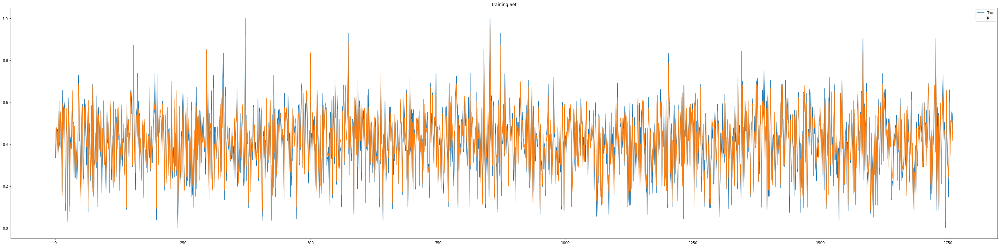

Training Set R-Square= 0.9348545445753992


In [ ]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_scaled_10_15))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_xgb_full_16)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train_full = r2_score(y_train_scaled_10_15,pred_train_xgb_full_16)
print("Training Set R-Square=", rf_indices_r2_train_full)

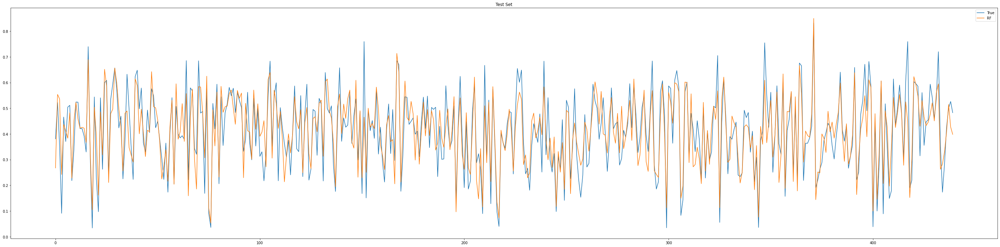

Test Set R-Square= 0.7705657242560676


In [ ]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_scaled_10_15))
# plt.plot(pred_train_mlp)
plt.plot(pred_xgb_full_16)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_test_full = r2_score(y_test_scaled_10_15,pred_xgb_full_16)
print("Test Set R-Square=", rf_indices_r2_test_full)

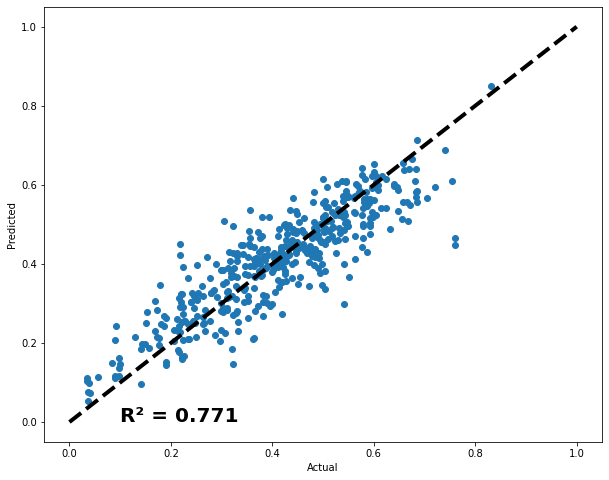

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15, pred_xgb_full_16)
ax.plot([test_scaled_10_15.min(), test_scaled_10_15.max()], [test_scaled_10_15.min(), test_scaled_10_15.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_scaled_10_15, pred_xgb_full_16)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/xgboost/r2.png")

plt.show()


## Optuna XGBoost

In [ ]:
best_score_xgb_2 = float('inf')  # Initialize the best score


# You can also define a threshold to flag overfitting on a per-fold basis.
# For each fold, if the relative gap between test and training error is above this threshold, we mark the trial as overfitted.
OVERFIT_THRESHOLD = 0.20  # e.g. if (test_mse - train_mse_2) / test_mse > 20%

def optuna_xgb_2(trial):
    """
    Objective function for Optuna.
    
    For each trial, we:
      1. Suggest XGBoost hyperparameters.
      2. Run a 5‑fold cross validation.
           - In each fold: split the fold’s “test/validation” set further 50–50.
           - Scale features (and target) using training‐only information.
           - Fit the XGBoost model with early stopping on the validation set.
           - Compute both training and test error (MSE).
           - Check for overfitting on that fold.
      3. If any fold shows too much overfitting, we immediately return a high penalty.
      4. Otherwise, compute the mean and standard deviation of the test MSE across folds.
      5. Update (and save) the best model if the combined score (mean + std) is lower than the best seen so far.
    """
    # -------------------------
    # 1. Hyperparameter suggestions
    # -------------------------
    param_2 = {
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.01, 1.0),
        'subsample': trial.suggest_float('subsample', 0.01, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
        'random_state': trial.suggest_int('random_state', 1, 1000)
    }
    
    # -------------------------
    # 2. 5-Fold Cross Validation
    # -------------------------
    fold_test_mses_2 = []       # Will store test MSE (on the 50% test split of each fold)
    fold_train_mses_2 = []      # Will store training MSE for overfitting check
    fold_train_indices_2 = []   # Will store the training indices for each fold
    fold_test_indices_2 = []    # Will store the test indices for each fold
    fold_test_r2_2 = []
    # Loop over each fold
    for fold, (train_index_2, test_val_index_2) in enumerate(kf_10_15.split(X_scaled_10_15)):
        # The CV split: use fold's training indices and "test/validation" indices.
        X_fold_train_10_15, X_fold_testval_10_15 = X_scaled_10_15[train_index_2], X_scaled_10_15[test_val_index_2]
        y_fold_train_10_15, y_fold_testval_10_15 = y_scaled_10_15[train_index_2], y_scaled_10_15[test_val_index_2]
        fold_train_indices_2.append(train_index_2)
        fold_test_indices_2.append(test_val_index_2)
        # --- Further split the test/validation set into 50–50 splits ---
        # This yields a test set (for final prediction evaluation) and a validation set (for early stopping)
        (X_test_fold_10_15, X_val_fold_10_15,
         y_test_fold_10_15, y_val_fold_10_15) = train_test_split(
            X_fold_testval_10_15, y_fold_testval_10_15, test_size=0.5,
            random_state=42
        )
        
        # --- Train the model with early stopping ---
        xgb_model_2 = xgb.XGBRegressor(**param_2)
        xgb_model_2.fit(
            X_fold_train_10_15, y_fold_train_10_15,
            eval_set=[(X_val_fold_10_15, y_val_fold_10_15)],
            early_stopping_rounds=10,
            verbose=False
        )
        
        # --- Evaluate performance on test set (for this fold) ---
        y_pred_test_2 = xgb_model_2.predict(X_test_fold_10_15)
        test_r2_fold = r2_score(y_test_fold_10_15, y_pred_test_2)
        fold_test_r2_2.append(test_r2_fold)
        test_mse_2 = mean_squared_error(y_test_fold_10_15, y_pred_test_2)
        fold_test_mses_2.append(test_mse_2)
        
        # Also compute training error (using the training fold) for an overfitting check.
        y_pred_train = xgb_model_2.predict(X_fold_train_10_15)
        train_mse_2 = mean_squared_error(y_fold_train_10_15, y_pred_train)
        fold_train_mses_2.append(train_mse_2)
        
        # --- Check for overfitting in this fold ---
        # If the training error is much lower than the test error, then we flag this fold.
        # if test_mse_2 > 0 and ((test_mse_2 - train_mse_2) / test_mse_2) > OVERFIT_THRESHOLD:
        #     # If overfitting is detected in any fold, we return a large penalty.
        #     # (This trial will not be considered as a candidate for the best model.)
        #     return 1e6  # high penalty value
    
    mean_mse_2 = np.mean(fold_test_mses_2)
    std_mse_2 = np.std(fold_test_mses_2)
    trial_score_2 = mean_mse_2 + std_mse_2  # Lower is better when both error and its variance are low.
    
    # Find the index of the fold with the lowest test MSE
    best_fold_index_2 = np.argmin(fold_test_mses_2)
    
    # -------------------------
    # 4. Save model if this trial beats all previous non-overfitted trials
    # -------------------------
    # trial_score_2 = fold_test_mses_2[best_fold_index_2]  # Lower is better when both error and its variance are low.
    global best_score_xgb_2
    if trial_score_2 < best_score_xgb_2:
        best_score_xgb_2 = trial_score_2
        # To save the “best‐of‐the‐best” model, retrain on the entire dataset using the same splitting scheme.
        # First, split the full dataset into 80% training and 20% test/validation.
        X_fold_train_full_10_15, X_testval_full_10_15 = X_scaled_10_15[fold_train_indices_2[best_fold_index_2]], X_scaled_10_15[fold_test_indices_2[best_fold_index_2]]
        y_fold_train_full_10_15, y_testval_full_10_15 = y_scaled_10_15[fold_train_indices_2[best_fold_index_2]], y_scaled_10_15[fold_test_indices_2[best_fold_index_2]]
        # Then split the 20% into equal parts: test and validation (each 10% of the full data).
        X_test_full_10_15, X_val_full_10_15, y_test_full_10_15, y_val_full_10_15 = train_test_split(
            X_testval_full_10_15, y_testval_full_10_15, test_size=0.5, random_state=42
        )
  
        # # Train a final model on the full training set with early stopping on the validation set.
        # xgb_final_model_2 = xgb.XGBRegressor(**param_2)
        # xgb_final_model_2.fit(
        #     X_fold_train_full_10_15, y_fold_train_full_10_15,
        #     eval_set=[(X_val_full_10_15, y_val_full_10_15)],
        #     early_stopping_rounds=10,
        #     verbose=False
        # )

        y_pred_test_2_best = xgb_final_model_2.predict(X_test_full_10_15)
        mse_best_2 = mean_squared_error(y_test_full_10_15, y_pred_test_2_best)
        r2_best_2 = r2_score(y_test_full_10_15, y_pred_test_2_best)
        print(f"Best model MSE: {mse_best_2:.4f}")
        print(f"Best model R2 score: {r2_best_2:.4f}")

        # Save the final model along with its hyperparameters and the scalers (for future use).
        best_model_info = {
            "model": xgb_final_model_2,
            "params": param_2,
            "fold_data": {"X_train": X_fold_train_full_10_15, "y_train": y_fold_train_full_10_15, "X_test": X_test_full_10_15, "y_test": y_test_full_10_15, "X_val": X_val_full_10_15, "y_val": y_val_full_10_15}

        }
        
        # IMPORTANT: Only one file (the “best” model) is saved/overwritten each time a new best trial is found.
        save_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/xgboost/best_model.pkl'
        with open(save_path, 'wb') as f:
            pickle.dump(best_model_info, f)
    
    return trial_score_2



# Create the study
study_xgb_2 = optuna.create_study(direction='minimize', study_name='regression')
study_xgb_2.optimize(optuna_xgb_2, n_trials=200)
print("Number of finished trials: {}".format(len(study_xgb_2.trials)))
 
print("Best trial:")
trial_xgb_2 = study_xgb_2.best_trial

print("  Value (mean mse + std): {:.4f}".format(trial_xgb_2.value))

print("  Params: ")
for key, value in trial_xgb_2.params.items():
    print("    {}: {}".format(key, value))



[I 2025-02-20 09:54:29,401] A new study created in memory with name: regression


[I 2025-02-20 09:54:30,098] Trial 0 finished with value: 0.014962448915500977 and parameters: {'max_depth': 4, 'learning_rate': 0.038390673205070724, 'n_estimators': 659, 'min_child_weight': 3, 'gamma': 0.9788701081799615, 'subsample': 0.6420411533722077, 'colsample_bytree': 0.11429230785951627, 'reg_alpha': 0.2784369089627717, 'reg_lambda': 0.9849956171560611, 'random_state': 88}. Best is trial 0 with value: 0.014962448915500977.
[I 2025-02-20 09:54:30,250] Trial 1 finished with value: 0.01504847455591201 and parameters: {'max_depth': 6, 'learning_rate': 0.48235348824421126, 'n_estimators': 683, 'min_child_weight': 8, 'gamma': 0.24158468455166227, 'subsample': 0.137978684283044, 'colsample_bytree': 0.44397910121720485, 'reg_alpha': 0.9665789870085753, 'reg_lambda': 0.8444375045230393, 'random_state': 110}. Best is trial 0 with value: 0.014962448915500977.


Best model MSE: 0.0116
Best model R2 score: 0.4235


[I 2025-02-20 09:54:30,753] Trial 2 finished with value: 0.013135656921228547 and parameters: {'max_depth': 4, 'learning_rate': 0.06836955257959569, 'n_estimators': 176, 'min_child_weight': 10, 'gamma': 0.5088762786509006, 'subsample': 0.7078670039064361, 'colsample_bytree': 0.11487910884350012, 'reg_alpha': 0.7462164824194227, 'reg_lambda': 0.40568882920993904, 'random_state': 581}. Best is trial 2 with value: 0.013135656921228547.
[I 2025-02-20 09:54:30,902] Trial 3 finished with value: 0.013854555451298479 and parameters: {'max_depth': 4, 'learning_rate': 0.49267762804241855, 'n_estimators': 413, 'min_child_weight': 9, 'gamma': 0.30440695207497637, 'subsample': 0.2136273574318839, 'colsample_bytree': 0.5707653452670398, 'reg_alpha': 0.20787923083947818, 'reg_lambda': 0.6350487957274648, 'random_state': 770}. Best is trial 2 with value: 0.013135656921228547.


Best model MSE: 0.0102
Best model R2 score: 0.4932


[I 2025-02-20 09:54:31,235] Trial 4 finished with value: 0.01269179586574537 and parameters: {'max_depth': 2, 'learning_rate': 0.8438631864846425, 'n_estimators': 406, 'min_child_weight': 2, 'gamma': 0.2745183614590594, 'subsample': 0.5635266108516487, 'colsample_bytree': 0.49823105585890715, 'reg_alpha': 0.5966134068849639, 'reg_lambda': 0.3597937836442664, 'random_state': 825}. Best is trial 4 with value: 0.01269179586574537.
[I 2025-02-20 09:54:31,361] Trial 5 finished with value: 0.01564514612095406 and parameters: {'max_depth': 1, 'learning_rate': 0.9588363757248847, 'n_estimators': 523, 'min_child_weight': 3, 'gamma': 0.2731673922288666, 'subsample': 0.9693223090107588, 'colsample_bytree': 0.012759501443911324, 'reg_alpha': 0.5725557811303479, 'reg_lambda': 0.933704289386662, 'random_state': 612}. Best is trial 4 with value: 0.01269179586574537.


Best model MSE: 0.0104
Best model R2 score: 0.4841


[I 2025-02-20 09:54:31,898] Trial 6 finished with value: 0.01078703161842435 and parameters: {'max_depth': 9, 'learning_rate': 0.9150534686664644, 'n_estimators': 629, 'min_child_weight': 1, 'gamma': 0.13275127742366122, 'subsample': 0.47600489864049156, 'colsample_bytree': 0.30399685002669097, 'reg_alpha': 0.7908770289443992, 'reg_lambda': 0.033247300817567285, 'random_state': 65}. Best is trial 6 with value: 0.01078703161842435.


Best model MSE: 0.0085
Best model R2 score: 0.6785


[I 2025-02-20 09:54:32,815] Trial 7 finished with value: 0.01299472433881343 and parameters: {'max_depth': 8, 'learning_rate': 0.09734505272790235, 'n_estimators': 299, 'min_child_weight': 8, 'gamma': 0.9013895925803543, 'subsample': 0.9251207850976337, 'colsample_bytree': 0.3217666675245166, 'reg_alpha': 0.15656234105621566, 'reg_lambda': 0.7448187012674493, 'random_state': 467}. Best is trial 6 with value: 0.01078703161842435.
[I 2025-02-20 09:54:33,708] Trial 8 finished with value: 0.008873310555539141 and parameters: {'max_depth': 8, 'learning_rate': 0.1187630719704217, 'n_estimators': 263, 'min_child_weight': 5, 'gamma': 0.15930004752033336, 'subsample': 0.5662629638930547, 'colsample_bytree': 0.26763683440589203, 'reg_alpha': 0.22087813778750978, 'reg_lambda': 0.8766605782517537, 'random_state': 13}. Best is trial 8 with value: 0.008873310555539141.
[I 2025-02-20 09:54:33,905] Trial 9 finished with value: 0.015495818046197991 and parameters: {'max_depth': 3, 'learning_rate': 0.67

Best model MSE: 0.0067
Best model R2 score: 0.6658


[I 2025-02-20 09:54:34,076] Trial 10 finished with value: 0.014814902150538562 and parameters: {'max_depth': 10, 'learning_rate': 0.23855260478360063, 'n_estimators': 990, 'min_child_weight': 6, 'gamma': 0.03141304959867286, 'subsample': 0.04032682124583753, 'colsample_bytree': 0.672188499318367, 'reg_alpha': 0.03370435471685759, 'reg_lambda': 0.6441012712010025, 'random_state': 285}. Best is trial 8 with value: 0.008873310555539141.
[I 2025-02-20 09:54:34,846] Trial 11 finished with value: 0.007890846792329632 and parameters: {'max_depth': 9, 'learning_rate': 0.2994772669488497, 'n_estimators': 93, 'min_child_weight': 1, 'gamma': 0.03138162349435618, 'subsample': 0.46075126140901834, 'colsample_bytree': 0.3254704905800533, 'reg_alpha': 0.43578735402442154, 'reg_lambda': 0.04188153105701353, 'random_state': 7}. Best is trial 11 with value: 0.007890846792329632.


Best model MSE: 0.0063
Best model R2 score: 0.6860


[I 2025-02-20 09:54:35,244] Trial 12 finished with value: 0.008361178714535098 and parameters: {'max_depth': 7, 'learning_rate': 0.2863576951259147, 'n_estimators': 65, 'min_child_weight': 5, 'gamma': 0.03269032781453196, 'subsample': 0.35170524222509114, 'colsample_bytree': 0.2634838892157093, 'reg_alpha': 0.39218485328184033, 'reg_lambda': 0.19877071008209835, 'random_state': 297}. Best is trial 11 with value: 0.007890846792329632.
[I 2025-02-20 09:54:35,656] Trial 13 finished with value: 0.00818605483848723 and parameters: {'max_depth': 6, 'learning_rate': 0.34446559726925063, 'n_estimators': 59, 'min_child_weight': 5, 'gamma': 0.03786677879379153, 'subsample': 0.3209998223292115, 'colsample_bytree': 0.38999842661662554, 'reg_alpha': 0.3936241314794685, 'reg_lambda': 0.1913945404370284, 'random_state': 283}. Best is trial 11 with value: 0.007890846792329632.
[I 2025-02-20 09:54:35,978] Trial 14 finished with value: 0.009729245952592338 and parameters: {'max_depth': 6, 'learning_rate

Best model MSE: 0.0054
Best model R2 score: 0.7336


[I 2025-02-20 09:54:41,448] Trial 23 finished with value: 0.0064713503346922035 and parameters: {'max_depth': 9, 'learning_rate': 0.18060437207085966, 'n_estimators': 301, 'min_child_weight': 4, 'gamma': 0.0120460678509083, 'subsample': 0.5015280225962333, 'colsample_bytree': 0.18898108604854788, 'reg_alpha': 0.298743876574396, 'reg_lambda': 0.12815694942539968, 'random_state': 494}. Best is trial 23 with value: 0.0064713503346922035.


Best model MSE: 0.0056
Best model R2 score: 0.7211


[I 2025-02-20 09:54:42,471] Trial 24 finished with value: 0.01026500843721742 and parameters: {'max_depth': 9, 'learning_rate': 0.17614330073304094, 'n_estimators': 326, 'min_child_weight': 2, 'gamma': 0.19616134855187467, 'subsample': 0.5002950035003256, 'colsample_bytree': 0.17385549322975336, 'reg_alpha': 0.2929483910125787, 'reg_lambda': 0.09782730813717934, 'random_state': 522}. Best is trial 23 with value: 0.0064713503346922035.
[I 2025-02-20 09:54:43,059] Trial 25 finished with value: 0.008209570318037316 and parameters: {'max_depth': 10, 'learning_rate': 0.18267541009145882, 'n_estimators': 505, 'min_child_weight': 4, 'gamma': 0.09920477213532822, 'subsample': 0.5546548554914084, 'colsample_bytree': 0.18687987411017898, 'reg_alpha': 0.18539157517303967, 'reg_lambda': 0.10811858137313246, 'random_state': 685}. Best is trial 23 with value: 0.0064713503346922035.
[I 2025-02-20 09:54:44,871] Trial 26 finished with value: 0.00922490445301207 and parameters: {'max_depth': 9, 'learnin

Best model MSE: 0.0051
Best model R2 score: 0.7446


[I 2025-02-20 09:54:53,397] Trial 34 finished with value: 0.008219364141103984 and parameters: {'max_depth': 5, 'learning_rate': 0.09801377822910669, 'n_estimators': 173, 'min_child_weight': 7, 'gamma': 0.12489813177710506, 'subsample': 0.64320696360683, 'colsample_bytree': 0.22196600547565923, 'reg_alpha': 0.26103936740535005, 'reg_lambda': 0.14040721355507912, 'random_state': 210}. Best is trial 33 with value: 0.006334707865259812.
[I 2025-02-20 09:54:53,841] Trial 35 finished with value: 0.010992200796461531 and parameters: {'max_depth': 7, 'learning_rate': 0.18245456340399754, 'n_estimators': 370, 'min_child_weight': 9, 'gamma': 0.22561800725073033, 'subsample': 0.5946642192844995, 'colsample_bytree': 0.11677296185700302, 'reg_alpha': 0.31374879032430164, 'reg_lambda': 0.07385974948652019, 'random_state': 365}. Best is trial 33 with value: 0.006334707865259812.
[I 2025-02-20 09:54:54,592] Trial 36 finished with value: 0.006434014415290648 and parameters: {'max_depth': 8, 'learning_

Best model MSE: 0.0050
Best model R2 score: 0.7507


[I 2025-02-20 09:55:12,030] Trial 64 finished with value: 0.007749193500284027 and parameters: {'max_depth': 8, 'learning_rate': 0.24273018467214286, 'n_estimators': 101, 'min_child_weight': 7, 'gamma': 0.049186654186690486, 'subsample': 0.4493895305155869, 'colsample_bytree': 0.16121884832283412, 'reg_alpha': 0.4461486565496612, 'reg_lambda': 0.05227345039639395, 'random_state': 389}. Best is trial 63 with value: 0.006325873433531527.
[I 2025-02-20 09:55:13,398] Trial 65 finished with value: 0.006738190846929672 and parameters: {'max_depth': 10, 'learning_rate': 0.11991315134130967, 'n_estimators': 218, 'min_child_weight': 7, 'gamma': 0.012727997792334718, 'subsample': 0.46490708429506034, 'colsample_bytree': 0.20497593439408468, 'reg_alpha': 0.4880839957997016, 'reg_lambda': 0.010159000432656488, 'random_state': 265}. Best is trial 63 with value: 0.006325873433531527.
[I 2025-02-20 09:55:14,058] Trial 66 finished with value: 0.00914893101265463 and parameters: {'max_depth': 8, 'learn

Best model MSE: 0.0054
Best model R2 score: 0.7660


[I 2025-02-20 09:55:31,846] Trial 88 finished with value: 0.00897663202548029 and parameters: {'max_depth': 6, 'learning_rate': 0.093513170915803, 'n_estimators': 178, 'min_child_weight': 3, 'gamma': 0.15872198556500414, 'subsample': 0.5817555155847757, 'colsample_bytree': 0.12392865078093118, 'reg_alpha': 0.3202226528699629, 'reg_lambda': 0.16638268437356477, 'random_state': 60}. Best is trial 87 with value: 0.0061548068043462524.
[I 2025-02-20 09:55:32,549] Trial 89 finished with value: 0.007478509151113673 and parameters: {'max_depth': 6, 'learning_rate': 0.17470371998183806, 'n_estimators': 578, 'min_child_weight': 6, 'gamma': 0.058053217349453935, 'subsample': 0.3917291389166909, 'colsample_bytree': 0.23500934113757813, 'reg_alpha': 0.24527092949863843, 'reg_lambda': 0.12162651994930346, 'random_state': 487}. Best is trial 87 with value: 0.0061548068043462524.
[I 2025-02-20 09:55:32,874] Trial 90 finished with value: 0.008757924474051736 and parameters: {'max_depth': 7, 'learning_

Best model MSE: 0.0050
Best model R2 score: 0.7504


[I 2025-02-20 09:55:47,363] Trial 106 finished with value: 0.008122810099973012 and parameters: {'max_depth': 8, 'learning_rate': 0.08437702827753044, 'n_estimators': 70, 'min_child_weight': 4, 'gamma': 0.09024299129076299, 'subsample': 0.5279490998366037, 'colsample_bytree': 0.2363506661494794, 'reg_alpha': 0.31648213739124204, 'reg_lambda': 0.13751458634399416, 'random_state': 655}. Best is trial 105 with value: 0.006104695562709551.
[I 2025-02-20 09:55:49,063] Trial 107 finished with value: 0.006656652030255285 and parameters: {'max_depth': 8, 'learning_rate': 0.057575029349403846, 'n_estimators': 348, 'min_child_weight': 4, 'gamma': 0.010658042344844078, 'subsample': 0.4479737257556574, 'colsample_bytree': 0.1377820883880872, 'reg_alpha': 0.25404207192456835, 'reg_lambda': 0.08650643820169368, 'random_state': 675}. Best is trial 105 with value: 0.006104695562709551.
[I 2025-02-20 09:55:50,888] Trial 108 finished with value: 0.007089798450959965 and parameters: {'max_depth': 9, 'lea

Best model MSE: 0.0048
Best model R2 score: 0.7618


[I 2025-02-20 09:56:17,395] Trial 128 finished with value: 0.005775592819454403 and parameters: {'max_depth': 8, 'learning_rate': 0.054508360035621345, 'n_estimators': 300, 'min_child_weight': 3, 'gamma': 0.012232717037621127, 'subsample': 0.6428323573725302, 'colsample_bytree': 0.2782522465426239, 'reg_alpha': 0.33748047214025007, 'reg_lambda': 0.06147539401424706, 'random_state': 588}. Best is trial 127 with value: 0.005712955236523953.
[I 2025-02-20 09:56:18,650] Trial 129 finished with value: 0.009141963658793512 and parameters: {'max_depth': 8, 'learning_rate': 0.051029755834576286, 'n_estimators': 294, 'min_child_weight': 3, 'gamma': 0.03251159676667198, 'subsample': 0.6155031964468198, 'colsample_bytree': 0.03561230764514761, 'reg_alpha': 0.4065752944166193, 'reg_lambda': 0.06581090025840704, 'random_state': 592}. Best is trial 127 with value: 0.005712955236523953.
[I 2025-02-20 09:56:21,071] Trial 130 finished with value: 0.010363125989128941 and parameters: {'max_depth': 8, 'l

Best model MSE: 0.0048
Best model R2 score: 0.7598


[I 2025-02-20 09:56:30,010] Trial 133 finished with value: 0.007262338852285362 and parameters: {'max_depth': 8, 'learning_rate': 0.010927077426445275, 'n_estimators': 330, 'min_child_weight': 2, 'gamma': 0.046428392601101834, 'subsample': 0.6326187278725198, 'colsample_bytree': 0.2813662811235629, 'reg_alpha': 0.33343911797767456, 'reg_lambda': 0.09633232975224221, 'random_state': 658}. Best is trial 132 with value: 0.005492126581079217.
[I 2025-02-20 09:56:32,798] Trial 134 finished with value: 0.006988156263450028 and parameters: {'max_depth': 8, 'learning_rate': 0.03862492898842252, 'n_estimators': 272, 'min_child_weight': 3, 'gamma': 0.0627329374616679, 'subsample': 0.6727220043190155, 'colsample_bytree': 0.3074257823273071, 'reg_alpha': 0.3077853911299047, 'reg_lambda': 0.05947723443797981, 'random_state': 616}. Best is trial 132 with value: 0.005492126581079217.
[I 2025-02-20 09:56:34,582] Trial 135 finished with value: 0.006530027876949805 and parameters: {'max_depth': 8, 'lear

Number of finished trials: 200
Best trial:
  Value (mean mse + std): 0.0055
  Params: 
    max_depth: 8
    learning_rate: 0.05660291379626162
    n_estimators: 332
    min_child_weight: 4
    gamma: 0.011808123262014551
    subsample: 0.6412757024682507
    colsample_bytree: 0.22057012615101404
    reg_alpha: 0.33576492191394675
    reg_lambda: 0.05816733707571648
    random_state: 612


In [ ]:
print("Number of finished trials: {}".format(len(study_xgb_2.trials)))

print("Best trial:")
trial_xgb_2 = study_xgb_2.best_trial

print("  Value: {}".format(trial_xgb_2.value))

print("  Params: ")
for key, value in trial_xgb_2.params.items():
    print("    {}: {}".format(key, value))

Number of finished trials: 100
Best trial:
  Value: 0.004781210171168841
  Params: 
    max_depth: 4
    learning_rate: 0.22833039072845693
    n_estimators: 841
    min_child_weight: 4
    gamma: 0.010710658638214606
    subsample: 0.8600247768404645
    colsample_bytree: 0.20964800111526985
    reg_alpha: 0.015030524194439253
    reg_lambda: 0.6645763114539691
    random_state: 742


# Case 3 - 10 + 15 + 20 days 

In [11]:
c3 = Case(day=20,dynamic_drop=drop_dynamic_features,static_drop=drop_static_features)
c3_dfs, c3_scalers, c3_datas = c3.case_preprocessing(datasets,dataset_dict,target,concat=True, vector_df_old= c2_dfs[0][2])

In [12]:
X_train_scaled_10_15_20  = c3_datas[0][0]
X_test_scaled_10_15_20   = c3_datas[0][1]
y_train_scaled_10_15_20  = c3_datas[0][2]
y_test_scaled_10_15_20   = c3_datas[0][3]
test_scaled_10_15_20     = c3_datas[0][4]

X_val_scaled_10_15_20  = c3_datas[0][5]
y_val_scaled_10_15_20  = c3_datas[0][6]

X_scaled_10_15_20  = c3_datas[0][8]
y_scaled_10_15_20  = c3_datas[0][9]

kf_10_15_20  = c3_datas[0][7]

## Train Test Split

## LSTM

In [ ]:
LSTM_full_14 = Sequential()
LSTM_full_14.add(LSTM(128, activation='tanh', input_shape=(X_train_scaled_10_15_20.shape[1], 1)))
LSTM_full_14.add(Dense(1))

optimizer = Adam(lr=0.0009872146005978912)

LSTM_full_14.compile(optimizer=optimizer, loss='mse',metrics=[RSquare()])
LSTM_full_14.load_weights("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/best_model_weights.h5")

In [ ]:
clear_session()

LSTM_full_14 = Sequential()
LSTM_full_14.add(LSTM(128, activation='relu', input_shape=(X_train_scaled_10_15_20.shape[1], 1)))
LSTM_full_14.add(Dense(1))

optimizer = Adam(lr=0.0006988135685611857)

LSTM_full_14.compile(optimizer=optimizer, loss='mse',metrics=[RSquare()])

history_full_lstm_14 = LSTM_full_14.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20, epochs=290, batch_size=8)

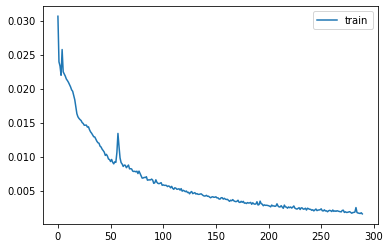

In [ ]:
plt.plot(history_full_lstm_14.history['loss'], label='train')
plt.legend()
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/loss.png")
plt.show()

83/83 [==============================] - 1s 10ms/step
RMSE: 0.078930


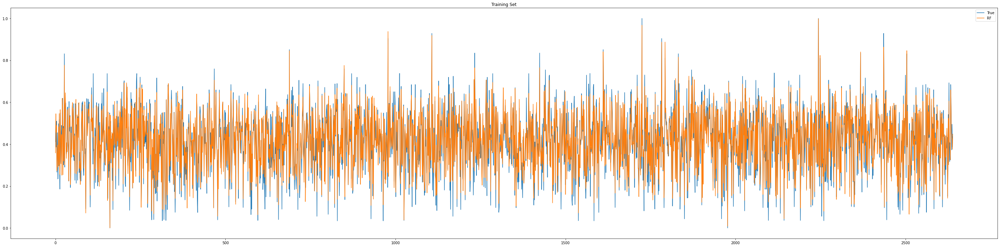

Training Set R-Square= 0.9015951219731643


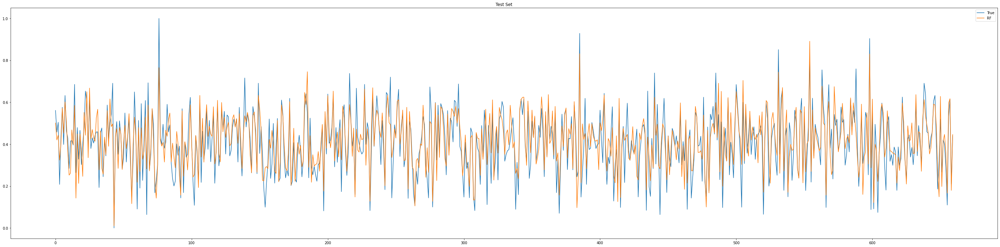

Test Set R-Square= 0.7322811318888061


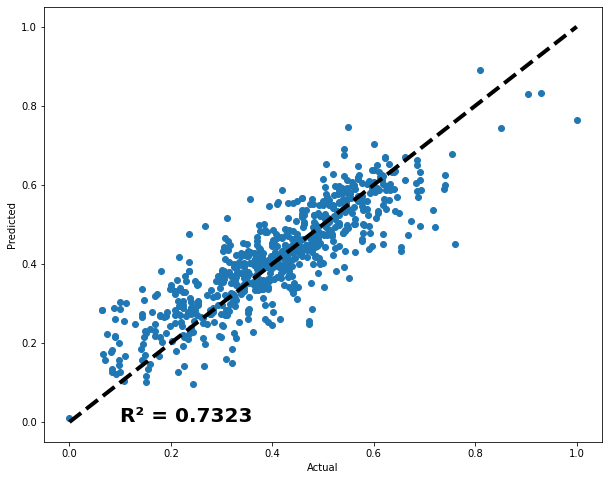

In [ ]:
score = LSTM_full_14.evaluate(X_test_scaled_10_15_20, y_test_scaled_10_15_20, batch_size=1)

pred_lstm_full_14 = LSTM_full_14.predict(X_test_scaled_10_15_20) 
pred_train_lstm_full_14 = LSTM_full_14.predict(X_train_scaled_10_15_20)

rmse_lstm_full_14 = np.sqrt(mean_squared_error(y_test_scaled_10_15_20, pred_lstm_full_14)) 
print("RMSE: %f" % (rmse_lstm_full_14)) 

plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_scaled_10_15_20))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_lstm_full_14)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_scaled_10_15_20 ,pred_train_lstm_full_14)
print("Training Set R-Square=", rf_indices_r2_train)


plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_scaled_10_15_20))
# plt.plot(pred_train_mlp)
plt.plot(pred_lstm_full_14)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for test set
rf_indices_r2_test = r2_score(y_test_scaled_10_15_20,pred_lstm_full_14)
print("Test Set R-Square=", rf_indices_r2_test)

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15_20, pred_lstm_full_14)
ax.plot([test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], [test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled_10_15_20, pred_lstm_full_14)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/r2.png")
plt.show()



## Optuna LSTM

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Global overfitting threshold (same as XGB)
OVERFIT_THRESHOLD = 0.20

# Global best score for LSTM (we maximize R2, so higher is better)
best_score_lstm_3 = float('-inf')
lstm_model_path_3 = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/best_model.h5'

def optuna_lstm_3(trial):
    """
    Objective function for LSTM using 5‑fold cross validation.
    For each fold:
      - Further split the fold’s test/validation set 50–50.
      - Reshape the data (for LSTM, input shape is (n_features_3, 1)).
      - Train with early stopping (via ModelCheckpoint on the validation set).
      - Compute both training MSE and test MSE to check for overfitting.
    If any fold is overfitted, return a large penalty (-1e6).
    Otherwise, compute a trial score = (mean R2 – std R2) across folds.
    If the trial’s score beats the best so far, retrain a final model using the
    best fold’s split and save it.
    """
    clear_session()
    
    fold_test_r2s_3 = []
    fold_train_mses_3 = []
    fold_test_mses_3 = []
    fold_train_indices_3 = []
    fold_test_indices_3 = []
    fold_models_3 = []

    
    for fold, (train_index_3, test_val_index_3) in enumerate(kf_10_15_20.split(X_scaled_10_15_20)):
        # Get fold data
        X_fold_train_3, X_fold_testval_3 = X_scaled_10_15_20[train_index_3], X_scaled_10_15_20[test_val_index_3]
        y_fold_train_3, y_fold_testval = y_scaled_10_15_20[train_index_3], y_scaled_10_15_20[test_val_index_3]
        fold_train_indices_3.append(train_index_3)
        fold_test_indices_3.append(test_val_index_3)
        
        # Further split test_val into test and validation sets (50–50)
        X_test_fold, X_val_fold, y_test_fold, y_val_fold = train_test_split(
            X_fold_testval_3, y_fold_testval, test_size=0.5, random_state=42
        )
        
        # Reshape inputs for LSTM: (samples, n_features, 1)
        n_features_3 = X_fold_train_3.shape[1]
        X_fold_train_3_r = X_fold_train_3.reshape(-1, n_features_3, 1)
        X_val_fold_r_3 = X_val_fold.reshape(-1, n_features_3, 1)
        X_test_fold_r_3 = X_test_fold.reshape(-1, n_features_3, 1)
        
        # -------------------------
        # 1. Hyperparameter suggestions
        # -------------------------

        units = trial.suggest_categorical('units', [32, 64, 128])
        lr = trial.suggest_float('lr', 5e-4, 5e-3, log=True)
        epochs = trial.suggest_int('epochs', 100, 300, step=10)
        batch_size = trial.suggest_categorical('batch_size', [32, 64])
        dropout = trial.suggest_float('dropout', 0.1, 0.3)

        
        # -------------------------
        # 2. Build and train the model with Dropout & EarlyStopping
        # -------------------------
        model = Sequential()
        model.add(LSTM(units=units, activation='tanh', dropout=dropout, return_sequences=True, input_shape=(n_features_3, 1)))
        model.add(LSTM(units=units//2, activation='tanh', dropout=dropout)) 
        model.add(Dense(1))
        model.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        tmp_checkpoint = 'temp_lstm_checkpoint.h5'
        checkpoint = ModelCheckpoint(tmp_checkpoint, monitor='val_loss', mode='min',
                                     save_best_only=True, verbose=0)
        early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
        
        model.fit(X_fold_train_3_r, y_fold_train_3, epochs=epochs, batch_size=batch_size,
                  validation_data=(X_val_fold_r_3, y_val_fold), callbacks=[checkpoint, early_stopping], verbose=0)
        model.load_weights(tmp_checkpoint)
        
        fold_models_3.append(model)
        # -------------------------
        # 3. Evaluate and check for overfitting
        # -------------------------
        y_pred_test = model.predict(X_test_fold_r_3)
        test_r2 = r2_score(y_test_fold, y_pred_test)
        fold_test_r2s_3.append(test_r2)
        print(f" LSTM model R2: {test_r2:.4f}")

        y_pred_train = model.predict(X_fold_train_3_r)
        train_mse = mean_squared_error(y_fold_train_3, y_pred_train)
        test_mse = mean_squared_error(y_test_fold, y_pred_test)
        fold_train_mses_3.append(train_mse)
        fold_test_mses_3.append(test_mse)
        print(f"Train MSE: {train_mse:.4f}, Test MSE: {test_mse:.4f}")

        # Overfitting check: if training MSE is much lower than test MSE, penalize.
        # if test_mse > 0 and ((test_mse - train_mse) / test_mse) > OVERFIT_THRESHOLD:
        #     return -1e6 # print("Overfitted!!")  # large penalty for overfitting
    
    # -------------------------
    # 4. Compute CV metrics and trial score
    # -------------------------
    mean_r2 = np.mean(fold_test_r2s_3)
    std_r2 = np.std(fold_test_r2s_3)
    # trial_score = mean_r2 - std_r2  # lower is better
    trial_score = mean_r2  # lower is better
    # Identify the fold with the highest test R2
    best_fold_index, best_fold_r2 = max(enumerate(fold_test_r2s_3), key=lambda x: x[1])
    
    # -------------------------
    # 5. Retrain final model if trial beats previous best
    # -------------------------
    global best_score_lstm_3
    if trial_score > best_score_lstm_3:
        print(f"Trial R2: {mean_r2:.4f} ± {std_r2:.4f}")
        best_score_lstm_3 = trial_score
        best_train_idx = fold_train_indices_3[best_fold_index]
        best_test_idx = fold_test_indices_3[best_fold_index]
        
        # Split the full data using the best fold's indices
        X_train_full, y_train_full = X_scaled_10_15_20[best_train_idx], y_scaled_10_15_20[best_train_idx]
        X_testval_full, y_testval_full = X_scaled_10_15_20[best_test_idx], y_scaled_10_15_20[best_test_idx]
        X_test_full, X_val_full, y_test_full, y_val_full = train_test_split(
            X_testval_full, y_testval_full, test_size=0.5, random_state=42
        )
        
        # Reshape for LSTM
        n_features_3 = X_train_full.shape[1]
        X_train_full_r = X_train_full.reshape(-1, n_features_3, 1)
        X_val_full_r = X_val_full.reshape(-1, n_features_3, 1)
        X_test_full_r = X_test_full.reshape(-1, n_features_3, 1)
        
       
        # final_model = Sequential()
        # final_model.add(LSTM(units=units, activation='tanh', dropout=dropout, return_sequences=True, input_shape=(n_features_3, 1)))
        # final_model.add(LSTM(units=units//2, activation='tanh', dropout=dropout)) 
        # final_model.add(Dense(1))
        # final_model.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        # final_checkpoint = ModelCheckpoint(lstm_model_path_3, monitor='val_loss', mode='min',
        #                                    save_best_only=True, verbose=0)
        # final_model.fit(X_train_full_r, y_train_full, epochs=epochs, batch_size=batch_size,
        #                 validation_data=(X_val_full_r, y_val_full), callbacks=[final_checkpoint, early_stopping], verbose=0)
        # final_model.load_weights(lstm_model_path_3)
        
        final_model_3 = fold_models_3[best_fold_index]

        y_pred_final = final_model_3.predict(X_test_full_r)
        final_r2 = r2_score(y_test_full, y_pred_final)
        print(f"Best LSTM model R2: {final_r2:.4f}")
        final_mse = mean_squared_error(y_test_full, y_pred_final)
        print(f"Best LSTM model MSE: {final_mse:.4f}")
        
        # Save final model info (optional)
        best_model_info = {
            "model": final_model_3,
            "hyperparameters": {"units": units, "lr": lr, "epochs": epochs, "batch_size": batch_size, "dropout": dropout},
            "fold_data": {"X_train": X_train_full_r, "y_train": y_train_full, "X_test": X_test_full_r, "y_test": y_test_full, "X_val": X_val_full_r, "y_val": y_val_full}
        }
        save_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/best_model_info.pkl'
        with open(save_path, 'wb') as f:
            pickle.dump(best_model_info, f)
    
    return trial_score

study_lstm_3 = optuna.create_study(direction="maximize", study_name="lstm_regression")
study_lstm_3.optimize(optuna_lstm_3, n_trials=50)

print("Number of finished trials: {}".format(len(study_lstm_3.trials)))
print("Best trial:")
trial_lstm_3 = study_lstm_3.best_trial
print("  Value (mean R2 - std): {:.4f}".format(trial_lstm_3.value))
print("  Best hyperparameters:")
for key, value in trial_lstm_3.params.items():
    print("    {}: {}".format(key, value))


[I 2025-02-18 19:51:36,268] A new study created in memory with name: lstm_regression


11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6394
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0070, Test MSE: 0.0096
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.5760
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0093, Test MSE: 0.0110
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7076
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0061, Test MSE: 0.0077
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.7393
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0056, Test MSE: 0.0067
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7385
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0071, Test MSE: 0.0078
Trial R2: 0.6802 ± 0.0635
11/11 [==============================] - 0s 3ms/step
Best LSTM model R2: 0.7393
Best LSTM model MSE: 0.0067


INFO:tensorflow:Assets written to: ram://69ac6f6c-dc9a-48e5-89ee-f1ab13581875/assets


INFO:tensorflow:Assets written to: ram://69ac6f6c-dc9a-48e5-89ee-f1ab13581875/assets
[I 2025-02-18 20:01:36,653] Trial 0 finished with value: 0.680170405285615 and parameters: {'units': 32, 'lr': 0.004723723653138355, 'epochs': 190, 'batch_size': 32, 'dropout': 0.11227330631652654}. Best is trial 0 with value: 0.680170405285615.


11/11 [==============================] - 1s 15ms/step
 LSTM model R2: 0.3450
83/83 [==============================] - 1s 14ms/step
Train MSE: 0.0135, Test MSE: 0.0174
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.4512
83/83 [==============================] - 1s 12ms/step
Train MSE: 0.0143, Test MSE: 0.0143
11/11 [==============================] - 1s 16ms/step
 LSTM model R2: 0.4709
83/83 [==============================] - 1s 15ms/step
Train MSE: 0.0142, Test MSE: 0.0139
11/11 [==============================] - 1s 20ms/step
 LSTM model R2: 0.5146
83/83 [==============================] - 1s 18ms/step
Train MSE: 0.0141, Test MSE: 0.0125
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.4653
83/83 [==============================] - 1s 14ms/step


[I 2025-02-18 20:22:58,661] Trial 1 finished with value: 0.44941245516517087 and parameters: {'units': 128, 'lr': 0.0034061796292725924, 'epochs': 180, 'batch_size': 64, 'dropout': 0.25876343891279674}. Best is trial 0 with value: 0.680170405285615.


Train MSE: 0.0135, Test MSE: 0.0159
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6413
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0069, Test MSE: 0.0095
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5833
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0092, Test MSE: 0.0108
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6477
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0081, Test MSE: 0.0092
11/11 [==============================] - 0s 6ms/step
 LSTM model R2: 0.6544
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0090, Test MSE: 0.0089
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6866
83/83 [==============================] - 0s 5ms/step


[I 2025-02-18 20:35:33,801] Trial 2 finished with value: 0.6426388470153196 and parameters: {'units': 64, 'lr': 0.0035230361987723335, 'epochs': 180, 'batch_size': 64, 'dropout': 0.14574652145097905}. Best is trial 0 with value: 0.680170405285615.


Train MSE: 0.0069, Test MSE: 0.0093
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.2971
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0139, Test MSE: 0.0187
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.2777
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0182, Test MSE: 0.0188
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.3919
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0167, Test MSE: 0.0160
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.3439
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0188, Test MSE: 0.0169
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.2558
83/83 [==============================] - 0s 3ms/step


[I 2025-02-18 20:39:30,228] Trial 3 finished with value: 0.3132862688183085 and parameters: {'units': 32, 'lr': 0.004966292796912172, 'epochs': 120, 'batch_size': 64, 'dropout': 0.2828270583351796}. Best is trial 0 with value: 0.680170405285615.


Train MSE: 0.0184, Test MSE: 0.0221
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.2519
83/83 [==============================] - 1s 14ms/step
Train MSE: 0.0158, Test MSE: 0.0198
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.4889
83/83 [==============================] - 1s 13ms/step
Train MSE: 0.0129, Test MSE: 0.0133
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.4595
83/83 [==============================] - 1s 13ms/step
Train MSE: 0.0149, Test MSE: 0.0142
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5038
83/83 [==============================] - 1s 12ms/step
Train MSE: 0.0154, Test MSE: 0.0128
11/11 [==============================] - 1s 15ms/step
 LSTM model R2: 0.4044
83/83 [==============================] - 1s 15ms/step


[I 2025-02-18 21:01:44,929] Trial 4 finished with value: 0.42170171552404134 and parameters: {'units': 128, 'lr': 0.002350438620667221, 'epochs': 190, 'batch_size': 32, 'dropout': 0.2805393474474467}. Best is trial 0 with value: 0.680170405285615.


Train MSE: 0.0136, Test MSE: 0.0177
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.2609
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0176, Test MSE: 0.0196
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1072
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0225, Test MSE: 0.0232
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1645
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0224, Test MSE: 0.0219
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.2086
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0221, Test MSE: 0.0204
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.1279
83/83 [==============================] - 0s 3ms/step


[I 2025-02-18 21:05:51,953] Trial 5 finished with value: 0.17381030250869173 and parameters: {'units': 32, 'lr': 0.0010170765405275405, 'epochs': 160, 'batch_size': 64, 'dropout': 0.2669778506266577}. Best is trial 0 with value: 0.680170405285615.


Train MSE: 0.0224, Test MSE: 0.0260
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.3917
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0130, Test MSE: 0.0161
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4532
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0139, Test MSE: 0.0142
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4682
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0139, Test MSE: 0.0140
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6031
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0111, Test MSE: 0.0103
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5598
83/83 [==============================] - 0s 5ms/step


[I 2025-02-18 21:17:26,061] Trial 6 finished with value: 0.4951838470432749 and parameters: {'units': 64, 'lr': 0.001986989812556622, 'epochs': 160, 'batch_size': 32, 'dropout': 0.24135603499615968}. Best is trial 0 with value: 0.680170405285615.


Train MSE: 0.0119, Test MSE: 0.0131
11/11 [==============================] - 2s 6ms/step
 LSTM model R2: 0.1414
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0219, Test MSE: 0.0228
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.0970
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0228, Test MSE: 0.0235
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1371
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0229, Test MSE: 0.0227
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.1722
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0231, Test MSE: 0.0214
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.1414
83/83 [==============================] - 0s 4ms/step


[I 2025-02-18 21:24:16,530] Trial 7 finished with value: 0.13783991899919698 and parameters: {'units': 64, 'lr': 0.0005520666606390835, 'epochs': 190, 'batch_size': 64, 'dropout': 0.28284362391560114}. Best is trial 0 with value: 0.680170405285615.


Train MSE: 0.0219, Test MSE: 0.0256
11/11 [==============================] - 1s 16ms/step
 LSTM model R2: 0.4414
83/83 [==============================] - 1s 14ms/step
Train MSE: 0.0120, Test MSE: 0.0148
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.4884
83/83 [==============================] - 1s 16ms/step
Train MSE: 0.0135, Test MSE: 0.0133
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.4047
83/83 [==============================] - 1s 13ms/step
Train MSE: 0.0155, Test MSE: 0.0156
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.4751
83/83 [==============================] - 1s 15ms/step
Train MSE: 0.0160, Test MSE: 0.0136
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.2816
83/83 [==============================] - 1s 14ms/step


[I 2025-02-18 21:54:46,328] Trial 8 finished with value: 0.4182322007423915 and parameters: {'units': 128, 'lr': 0.0006821592521424464, 'epochs': 190, 'batch_size': 32, 'dropout': 0.1806127368412702}. Best is trial 0 with value: 0.680170405285615.


Train MSE: 0.0181, Test MSE: 0.0214
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.4395
83/83 [==============================] - 1s 14ms/step
Train MSE: 0.0121, Test MSE: 0.0149
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.4617
83/83 [==============================] - 1s 13ms/step
Train MSE: 0.0132, Test MSE: 0.0140
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.4360
83/83 [==============================] - 1s 13ms/step
Train MSE: 0.0155, Test MSE: 0.0148
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.4480
83/83 [==============================] - 1s 14ms/step
Train MSE: 0.0155, Test MSE: 0.0143
11/11 [==============================] - 1s 18ms/step
 LSTM model R2: 0.4963
83/83 [==============================] - 1s 16ms/step


[I 2025-02-18 22:18:44,244] Trial 9 finished with value: 0.45630385397877793 and parameters: {'units': 128, 'lr': 0.0036823767444599123, 'epochs': 280, 'batch_size': 32, 'dropout': 0.2793927730154222}. Best is trial 0 with value: 0.680170405285615.


Train MSE: 0.0131, Test MSE: 0.0150
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.5270
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0098, Test MSE: 0.0125
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.4055
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0128, Test MSE: 0.0155
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5052
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0134, Test MSE: 0.0130
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5608
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0122, Test MSE: 0.0113
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6559
83/83 [==============================] - 0s 3ms/step


[I 2025-02-18 22:31:59,791] Trial 10 finished with value: 0.5308829165746927 and parameters: {'units': 32, 'lr': 0.0013191753730155869, 'epochs': 240, 'batch_size': 32, 'dropout': 0.10342633798794727}. Best is trial 0 with value: 0.680170405285615.


Train MSE: 0.0085, Test MSE: 0.0102
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.7207
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0042, Test MSE: 0.0074
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5852
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0082, Test MSE: 0.0108
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6879
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0075, Test MSE: 0.0082
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.7409
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0060, Test MSE: 0.0067
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.7153
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0069, Test MSE: 0.0085
Trial R2: 0.6900 ± 0.0550
11/11 [==============================] - 0s 5ms/step
Best LSTM model R2: 0.7409
Best LSTM model MSE: 0.0067


INFO:tensorflow:Assets written to: ram://b5bad65d-a719-43ba-bb13-01a51a9c6909/assets


INFO:tensorflow:Assets written to: ram://b5bad65d-a719-43ba-bb13-01a51a9c6909/assets
[I 2025-02-18 22:45:25,321] Trial 11 finished with value: 0.6899877229875535 and parameters: {'units': 64, 'lr': 0.0048506465537559796, 'epochs': 240, 'batch_size': 64, 'dropout': 0.11798147436683531}. Best is trial 11 with value: 0.6899877229875535.


11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6311
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0076, Test MSE: 0.0098
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5781
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0096, Test MSE: 0.0110
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6032
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0099, Test MSE: 0.0104
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.6303
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0083, Test MSE: 0.0096
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7630
83/83 [==============================] - 0s 3ms/step


[I 2025-02-18 22:52:11,455] Trial 12 finished with value: 0.6411456687144363 and parameters: {'units': 32, 'lr': 0.004754128422266761, 'epochs': 240, 'batch_size': 64, 'dropout': 0.12428232292009453}. Best is trial 11 with value: 0.6899877229875535.


Train MSE: 0.0061, Test MSE: 0.0071
11/11 [==============================] - 1s 7ms/step
 LSTM model R2: 0.7033
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0043, Test MSE: 0.0079
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.7338
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0058, Test MSE: 0.0069
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.7076
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0064, Test MSE: 0.0077
11/11 [==============================] - 1s 6ms/step
 LSTM model R2: 0.7195
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0060, Test MSE: 0.0072
11/11 [==============================] - 0s 6ms/step
 LSTM model R2: 0.7203
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0074, Test MSE: 0.0083
Trial R2: 0.7169 ± 0.0107
11/11 [==============================] - 0s 4ms/step
Best LSTM model R2: 0.7338
Best LSTM model MSE: 0.0069


INFO:tensorflow:Assets written to: ram://e63097d1-e117-4c50-9473-913b4559f9f0/assets


INFO:tensorflow:Assets written to: ram://e63097d1-e117-4c50-9473-913b4559f9f0/assets
[I 2025-02-18 23:07:58,414] Trial 13 finished with value: 0.7169041971347268 and parameters: {'units': 64, 'lr': 0.0025798356329212904, 'epochs': 240, 'batch_size': 32, 'dropout': 0.10232416239092602}. Best is trial 13 with value: 0.7169041971347268.


11/11 [==============================] - 1s 11ms/step
 LSTM model R2: 0.5215
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0095, Test MSE: 0.0127
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6060
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0088, Test MSE: 0.0102
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4986
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0141, Test MSE: 0.0132
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6341
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0079, Test MSE: 0.0095
11/11 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6154
83/83 [==============================] - 0s 5ms/step


[I 2025-02-18 23:21:10,853] Trial 14 finished with value: 0.5751294447423365 and parameters: {'units': 64, 'lr': 0.0024585159535058447, 'epochs': 240, 'batch_size': 64, 'dropout': 0.15219135824294333}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0090, Test MSE: 0.0114
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6361
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0065, Test MSE: 0.0097
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6671
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0066, Test MSE: 0.0087
11/11 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6636
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0076, Test MSE: 0.0088
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6982
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0070, Test MSE: 0.0078
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.7133
83/83 [==============================] - 0s 5ms/step


[I 2025-02-18 23:37:35,449] Trial 15 finished with value: 0.6756484904665321 and parameters: {'units': 64, 'lr': 0.002990548618884763, 'epochs': 300, 'batch_size': 32, 'dropout': 0.13332737850348864}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0059, Test MSE: 0.0085
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5026
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0103, Test MSE: 0.0132
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6539
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0074, Test MSE: 0.0090
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.4988
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0134, Test MSE: 0.0132
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6596
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0068, Test MSE: 0.0088
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5926
83/83 [==============================] - 0s 5ms/step


[I 2025-02-18 23:52:52,143] Trial 16 finished with value: 0.5814957117032769 and parameters: {'units': 64, 'lr': 0.001781450035841362, 'epochs': 260, 'batch_size': 64, 'dropout': 0.10555978923842305}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0097, Test MSE: 0.0121
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5707
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0093, Test MSE: 0.0114
11/11 [==============================] - 2s 6ms/step
 LSTM model R2: 0.6319
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0087, Test MSE: 0.0096
11/11 [==============================] - 1s 6ms/step
 LSTM model R2: 0.6475
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0084, Test MSE: 0.0093
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6537
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0085, Test MSE: 0.0089
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6516
83/83 [==============================] - 0s 5ms/step


[I 2025-02-19 00:06:10,423] Trial 17 finished with value: 0.631067349133211 and parameters: {'units': 64, 'lr': 0.0026313957459908866, 'epochs': 220, 'batch_size': 32, 'dropout': 0.16518703371768062}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0091, Test MSE: 0.0104
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5790
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0074, Test MSE: 0.0112
11/11 [==============================] - 1s 8ms/step
 LSTM model R2: 0.6520
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0077, Test MSE: 0.0091
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5408
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0130, Test MSE: 0.0121
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6610
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0077, Test MSE: 0.0088
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5814
83/83 [==============================] - 0s 5ms/step


[I 2025-02-19 00:20:58,401] Trial 18 finished with value: 0.6028577685911498 and parameters: {'units': 64, 'lr': 0.002115109889787387, 'epochs': 220, 'batch_size': 64, 'dropout': 0.12538463314243892}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0106, Test MSE: 0.0125
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.4194
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0114, Test MSE: 0.0154
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.3272
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0161, Test MSE: 0.0175
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.4781
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0142, Test MSE: 0.0137
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5768
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0117, Test MSE: 0.0109
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5429
83/83 [==============================] - 0s 5ms/step


[I 2025-02-19 00:33:22,351] Trial 19 finished with value: 0.46890258554607167 and parameters: {'units': 64, 'lr': 0.0014616512747699646, 'epochs': 280, 'batch_size': 32, 'dropout': 0.19248428550032523}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0113, Test MSE: 0.0136
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.3716
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0130, Test MSE: 0.0167
11/11 [==============================] - 1s 6ms/step
 LSTM model R2: 0.5225
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0116, Test MSE: 0.0124
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5285
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0111, Test MSE: 0.0124
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5270
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0130, Test MSE: 0.0122
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5777
83/83 [==============================] - 0s 5ms/step


[I 2025-02-19 00:43:11,247] Trial 20 finished with value: 0.5054657339480005 and parameters: {'units': 64, 'lr': 0.0028734892702289177, 'epochs': 100, 'batch_size': 64, 'dropout': 0.2176948327998761}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0111, Test MSE: 0.0126
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.6777
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0058, Test MSE: 0.0086
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.7278
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0057, Test MSE: 0.0071
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.6768
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0071, Test MSE: 0.0085
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.7336
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0062, Test MSE: 0.0069
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7305
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 00:54:05,629] Trial 21 finished with value: 0.7092885531464769 and parameters: {'units': 32, 'lr': 0.004285070543274322, 'epochs': 210, 'batch_size': 32, 'dropout': 0.10294680721862642}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0071, Test MSE: 0.0080
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6214
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0068, Test MSE: 0.0100
11/11 [==============================] - 1s 4ms/step
 LSTM model R2: 0.6834
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0057, Test MSE: 0.0082
11/11 [==============================] - 1s 4ms/step
 LSTM model R2: 0.6364
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0076, Test MSE: 0.0095
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.6957
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0074, Test MSE: 0.0079
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7291
83/83 [==============================] - 0s 3ms/step


[I 2025-02-19 01:04:13,967] Trial 22 finished with value: 0.6732117055735579 and parameters: {'units': 32, 'lr': 0.004024158405847886, 'epochs': 210, 'batch_size': 32, 'dropout': 0.10116553039150981}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0061, Test MSE: 0.0081
11/11 [==============================] - 2s 4ms/step
 LSTM model R2: 0.6380
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0071, Test MSE: 0.0096
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5893
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0074, Test MSE: 0.0107
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.6511
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0085, Test MSE: 0.0092
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7184
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0069, Test MSE: 0.0073
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.6176
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 01:13:16,350] Trial 23 finished with value: 0.6428550768331674 and parameters: {'units': 32, 'lr': 0.004172039562978206, 'epochs': 260, 'batch_size': 32, 'dropout': 0.12434392793994363}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0104, Test MSE: 0.0114
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5381
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0074, Test MSE: 0.0123
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6716
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0071, Test MSE: 0.0085
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6456
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0083, Test MSE: 0.0093
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.7160
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0066, Test MSE: 0.0073
11/11 [==============================] - 1s 8ms/step
 LSTM model R2: 0.6621
83/83 [==============================] - 1s 7ms/step


[I 2025-02-19 01:25:50,160] Trial 24 finished with value: 0.6466884903186345 and parameters: {'units': 64, 'lr': 0.003283482755083899, 'epochs': 260, 'batch_size': 32, 'dropout': 0.13945032389468612}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0081, Test MSE: 0.0101
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5867
83/83 [==============================] - 0s 3ms/step
Train MSE: 0.0074, Test MSE: 0.0110
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5861
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0090, Test MSE: 0.0108
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6672
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0077, Test MSE: 0.0087
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7293
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0060, Test MSE: 0.0070
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7072
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 01:34:56,837] Trial 25 finished with value: 0.655308297509255 and parameters: {'units': 32, 'lr': 0.004065501963654157, 'epochs': 230, 'batch_size': 32, 'dropout': 0.11917962291628181}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0077, Test MSE: 0.0087
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.5439
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0089, Test MSE: 0.0121
11/11 [==============================] - 1s 7ms/step
 LSTM model R2: 0.6223
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0090, Test MSE: 0.0098
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6736
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0079, Test MSE: 0.0086
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6917
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0081, Test MSE: 0.0080
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.7176
83/83 [==============================] - 0s 4ms/step


[I 2025-02-19 01:48:56,522] Trial 26 finished with value: 0.6498134944030187 and parameters: {'units': 64, 'lr': 0.003174321600736264, 'epochs': 210, 'batch_size': 32, 'dropout': 0.15723268946308938}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0075, Test MSE: 0.0084
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.5720
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0067, Test MSE: 0.0114
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6424
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0080, Test MSE: 0.0093
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.6299
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0094, Test MSE: 0.0097
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.7022
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0068, Test MSE: 0.0077
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.6874
83/83 [==============================] - 0s 4ms/step


[I 2025-02-19 02:01:01,439] Trial 27 finished with value: 0.6467874961153698 and parameters: {'units': 64, 'lr': 0.0029270169267707003, 'epochs': 150, 'batch_size': 32, 'dropout': 0.1385120932294055}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0085, Test MSE: 0.0093
11/11 [==============================] - 1s 15ms/step
 LSTM model R2: 0.5728
83/83 [==============================] - 1s 15ms/step
Train MSE: 0.0069, Test MSE: 0.0113
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.6387
83/83 [==============================] - 1s 13ms/step
Train MSE: 0.0068, Test MSE: 0.0094
11/11 [==============================] - 1s 11ms/step
 LSTM model R2: 0.7188
83/83 [==============================] - 1s 12ms/step
Train MSE: 0.0052, Test MSE: 0.0074
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.7225
83/83 [==============================] - 1s 12ms/step
Train MSE: 0.0060, Test MSE: 0.0072
11/11 [==============================] - 1s 12ms/step
 LSTM model R2: 0.7056
83/83 [==============================] - 1s 14ms/step


[I 2025-02-19 02:31:24,860] Trial 28 finished with value: 0.6716760430220852 and parameters: {'units': 128, 'lr': 0.0037927859892369197, 'epochs': 280, 'batch_size': 64, 'dropout': 0.11527948444905511}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0075, Test MSE: 0.0088
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6098
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0060, Test MSE: 0.0104
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6585
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0064, Test MSE: 0.0089
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7349
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0062, Test MSE: 0.0070
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6843
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0071, Test MSE: 0.0082
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7349
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 02:41:15,049] Trial 29 finished with value: 0.6844838043497857 and parameters: {'units': 32, 'lr': 0.004925556875472603, 'epochs': 250, 'batch_size': 32, 'dropout': 0.10120775651729612}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0054, Test MSE: 0.0079
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6707
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0058, Test MSE: 0.0087
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5641
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0099, Test MSE: 0.0113
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6409
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0072, Test MSE: 0.0094
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6489
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0083, Test MSE: 0.0091
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7035
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 02:50:52,707] Trial 30 finished with value: 0.6456238095454654 and parameters: {'units': 32, 'lr': 0.004134007026997602, 'epochs': 300, 'batch_size': 32, 'dropout': 0.11501862573132156}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0070, Test MSE: 0.0088
11/11 [==============================] - 1s 4ms/step
 LSTM model R2: 0.6507
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0058, Test MSE: 0.0093
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.6817
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0061, Test MSE: 0.0083
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7289
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0064, Test MSE: 0.0071
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6928
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0057, Test MSE: 0.0079
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7359
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 03:01:15,943] Trial 31 finished with value: 0.6979976163876985 and parameters: {'units': 32, 'lr': 0.004746659171993915, 'epochs': 250, 'batch_size': 32, 'dropout': 0.1024720829955004}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0058, Test MSE: 0.0079
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6180
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0071, Test MSE: 0.0101
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.5447
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0103, Test MSE: 0.0118
11/11 [==============================] - 1s 4ms/step
 LSTM model R2: 0.7155
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0058, Test MSE: 0.0075
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7225
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0059, Test MSE: 0.0072
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7318
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 03:10:25,899] Trial 32 finished with value: 0.6665009988131076 and parameters: {'units': 32, 'lr': 0.00438205928046035, 'epochs': 220, 'batch_size': 32, 'dropout': 0.11329171312334947}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0073, Test MSE: 0.0080
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.4959
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0102, Test MSE: 0.0134
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6529
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0070, Test MSE: 0.0090
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6019
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0104, Test MSE: 0.0104
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6798
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0081, Test MSE: 0.0083
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6625
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 03:19:37,690] Trial 33 finished with value: 0.6185977094821282 and parameters: {'units': 32, 'lr': 0.003397328536278363, 'epochs': 270, 'batch_size': 32, 'dropout': 0.13229653687587714}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0088, Test MSE: 0.0100
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5993
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0068, Test MSE: 0.0106
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6798
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0069, Test MSE: 0.0083
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.6736
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0077, Test MSE: 0.0086
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6836
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0072, Test MSE: 0.0082
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7190
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 03:27:50,433] Trial 34 finished with value: 0.6710736491428676 and parameters: {'units': 32, 'lr': 0.004943862874689586, 'epochs': 230, 'batch_size': 32, 'dropout': 0.10047058770262501}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0065, Test MSE: 0.0084
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5435
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0080, Test MSE: 0.0121
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.5775
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0088, Test MSE: 0.0110
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6789
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0077, Test MSE: 0.0084
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5038
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0139, Test MSE: 0.0128
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6700
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 03:34:15,395] Trial 35 finished with value: 0.5947359969541262 and parameters: {'units': 32, 'lr': 0.003605434451247613, 'epochs': 210, 'batch_size': 64, 'dropout': 0.11302571094727207}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0080, Test MSE: 0.0098
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.5496
83/83 [==============================] - 1s 14ms/step
Train MSE: 0.0073, Test MSE: 0.0120
11/11 [==============================] - 1s 12ms/step
 LSTM model R2: 0.6900
83/83 [==============================] - 1s 12ms/step
Train MSE: 0.0065, Test MSE: 0.0081
11/11 [==============================] - 1s 11ms/step
 LSTM model R2: 0.6895
83/83 [==============================] - 1s 14ms/step
Train MSE: 0.0067, Test MSE: 0.0082
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.7161
83/83 [==============================] - 1s 13ms/step
Train MSE: 0.0062, Test MSE: 0.0073
11/11 [==============================] - 1s 11ms/step
 LSTM model R2: 0.6626
83/83 [==============================] - 1s 13ms/step


[I 2025-02-19 04:01:53,995] Trial 36 finished with value: 0.6615724220615362 and parameters: {'units': 128, 'lr': 0.004442610266032577, 'epochs': 250, 'batch_size': 32, 'dropout': 0.14291353267616866}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0087, Test MSE: 0.0100
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.6171
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0073, Test MSE: 0.0102
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.6830
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0068, Test MSE: 0.0082
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.6728
83/83 [==============================] - 0s 5ms/step
Train MSE: 0.0076, Test MSE: 0.0086
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.7033
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0064, Test MSE: 0.0077
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.7098
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0069, Test MSE: 0.0086


[I 2025-02-19 04:15:28,955] Trial 37 finished with value: 0.6772013822722307 and parameters: {'units': 64, 'lr': 0.003448142051258986, 'epochs': 200, 'batch_size': 64, 'dropout': 0.1302210177758134}. Best is trial 13 with value: 0.7169041971347268.


11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6137
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0069, Test MSE: 0.0102
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.4782
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0126, Test MSE: 0.0136
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.5686
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0121, Test MSE: 0.0113
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7127
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0066, Test MSE: 0.0074
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5554
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 04:24:54,302] Trial 38 finished with value: 0.585727525074533 and parameters: {'units': 32, 'lr': 0.002710226729568692, 'epochs': 180, 'batch_size': 32, 'dropout': 0.11363045067298691}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0116, Test MSE: 0.0132
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.5830
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0068, Test MSE: 0.0111
11/11 [==============================] - 1s 4ms/step
 LSTM model R2: 0.6527
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0076, Test MSE: 0.0090
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.7205
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0066, Test MSE: 0.0073
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.6964
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0068, Test MSE: 0.0078
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.7532
83/83 [==============================] - 0s 4ms/step


[I 2025-02-19 04:37:44,419] Trial 39 finished with value: 0.6811611131778289 and parameters: {'units': 64, 'lr': 0.004578363031903386, 'epochs': 230, 'batch_size': 64, 'dropout': 0.12322972754649247}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0057, Test MSE: 0.0073
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.5879
83/83 [==============================] - 1s 14ms/step
Train MSE: 0.0070, Test MSE: 0.0109
11/11 [==============================] - 2s 12ms/step
 LSTM model R2: 0.5877
83/83 [==============================] - 1s 13ms/step
Train MSE: 0.0078, Test MSE: 0.0107
11/11 [==============================] - 1s 15ms/step
 LSTM model R2: 0.6753
83/83 [==============================] - 1s 15ms/step
Train MSE: 0.0080, Test MSE: 0.0085
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6765
83/83 [==============================] - 1s 16ms/step
Train MSE: 0.0081, Test MSE: 0.0084
11/11 [==============================] - 1s 12ms/step
 LSTM model R2: 0.7173
83/83 [==============================] - 1s 13ms/step


[I 2025-02-19 05:05:04,238] Trial 40 finished with value: 0.6489116592547947 and parameters: {'units': 128, 'lr': 0.0032171692405905034, 'epochs': 170, 'batch_size': 32, 'dropout': 0.14938749364135112}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0074, Test MSE: 0.0084
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6727
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0050, Test MSE: 0.0087
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.6698
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0064, Test MSE: 0.0086
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7113
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0059, Test MSE: 0.0076
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7299
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0058, Test MSE: 0.0070
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7488
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 05:14:55,189] Trial 41 finished with value: 0.7065060106432608 and parameters: {'units': 32, 'lr': 0.004878820057690968, 'epochs': 240, 'batch_size': 32, 'dropout': 0.10113737440526469}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0067, Test MSE: 0.0075
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6424
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0070, Test MSE: 0.0095
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6651
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0075, Test MSE: 0.0087
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6868
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0073, Test MSE: 0.0082
11/11 [==============================] - 0s 6ms/step
 LSTM model R2: 0.6795
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0078, Test MSE: 0.0083
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6920
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 05:24:17,105] Trial 42 finished with value: 0.6731598243205547 and parameters: {'units': 32, 'lr': 0.0038457777400167144, 'epochs': 250, 'batch_size': 32, 'dropout': 0.1096889705070351}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0076, Test MSE: 0.0092
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5927
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0077, Test MSE: 0.0108
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.7123
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0057, Test MSE: 0.0075
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.6577
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0065, Test MSE: 0.0090
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7548
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0052, Test MSE: 0.0063
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7258
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 05:35:30,315] Trial 43 finished with value: 0.6886546475195766 and parameters: {'units': 32, 'lr': 0.004954511451265854, 'epochs': 200, 'batch_size': 32, 'dropout': 0.10782708414781995}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0067, Test MSE: 0.0082
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.6188
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0065, Test MSE: 0.0101
11/11 [==============================] - 1s 4ms/step
 LSTM model R2: 0.6374
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0075, Test MSE: 0.0094
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6834
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0070, Test MSE: 0.0083
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7079
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0065, Test MSE: 0.0075
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6861
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 05:45:21,604] Trial 44 finished with value: 0.6667316077929835 and parameters: {'units': 32, 'lr': 0.004344013341098516, 'epochs': 240, 'batch_size': 32, 'dropout': 0.11959922960453716}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0077, Test MSE: 0.0093
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5619
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0075, Test MSE: 0.0116
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6553
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0068, Test MSE: 0.0090
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7176
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0065, Test MSE: 0.0074
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5396
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0131, Test MSE: 0.0119
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.7352
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 05:54:34,441] Trial 45 finished with value: 0.6419432605729505 and parameters: {'units': 32, 'lr': 0.003717596908998048, 'epochs': 270, 'batch_size': 32, 'dropout': 0.10063735039882292}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0062, Test MSE: 0.0079
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5535
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0088, Test MSE: 0.0118
11/11 [==============================] - 1s 3ms/step
 LSTM model R2: 0.5807
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0083, Test MSE: 0.0109
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6698
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0074, Test MSE: 0.0087
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.6859
83/83 [==============================] - 0s 2ms/step
Train MSE: 0.0077, Test MSE: 0.0081
11/11 [==============================] - 0s 3ms/step
 LSTM model R2: 0.5822
83/83 [==============================] - 0s 2ms/step


[I 2025-02-19 06:01:06,538] Trial 46 finished with value: 0.6144388064903566 and parameters: {'units': 32, 'lr': 0.004480475937203017, 'epochs': 230, 'batch_size': 64, 'dropout': 0.13217992133044085}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0107, Test MSE: 0.0124
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6523
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0053, Test MSE: 0.0092
11/11 [==============================] - 1s 5ms/step
 LSTM model R2: 0.6821
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0066, Test MSE: 0.0083
11/11 [==============================] - 0s 4ms/step
 LSTM model R2: 0.7113
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0063, Test MSE: 0.0076
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.7482
83/83 [==============================] - 0s 4ms/step
Train MSE: 0.0045, Test MSE: 0.0065
11/11 [==============================] - 0s 5ms/step
 LSTM model R2: 0.7656
83/83 [==============================] - 0s 4ms/step


[I 2025-02-19 06:15:50,286] Trial 47 finished with value: 0.7119298619865726 and parameters: {'units': 64, 'lr': 0.003824290478065653, 'epochs': 250, 'batch_size': 32, 'dropout': 0.10911612417731688}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0051, Test MSE: 0.0070
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.6841
83/83 [==============================] - 1s 11ms/step
Train MSE: 0.0049, Test MSE: 0.0084
11/11 [==============================] - 1s 10ms/step
 LSTM model R2: 0.6887
83/83 [==============================] - 1s 12ms/step
Train MSE: 0.0056, Test MSE: 0.0081
11/11 [==============================] - 1s 15ms/step
 LSTM model R2: 0.7179
83/83 [==============================] - 1s 12ms/step
Train MSE: 0.0059, Test MSE: 0.0074
11/11 [==============================] - 1s 13ms/step
 LSTM model R2: 0.7128
83/83 [==============================] - 1s 11ms/step
Train MSE: 0.0067, Test MSE: 0.0074
11/11 [==============================] - 1s 23ms/step
 LSTM model R2: 0.7509
83/83 [==============================] - 1s 13ms/step


[I 2025-02-19 06:45:27,314] Trial 48 finished with value: 0.7108871018979751 and parameters: {'units': 128, 'lr': 0.0036657803175298904, 'epochs': 290, 'batch_size': 32, 'dropout': 0.10943946969123444}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0070, Test MSE: 0.0074
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.5929
83/83 [==============================] - 1s 13ms/step
Train MSE: 0.0074, Test MSE: 0.0108
11/11 [==============================] - 1s 21ms/step
 LSTM model R2: 0.6823
83/83 [==============================] - 1s 11ms/step
Train MSE: 0.0072, Test MSE: 0.0083
11/11 [==============================] - 1s 16ms/step
 LSTM model R2: 0.6900
83/83 [==============================] - 1s 14ms/step
Train MSE: 0.0073, Test MSE: 0.0081
11/11 [==============================] - 1s 18ms/step
 LSTM model R2: 0.7269
83/83 [==============================] - 1s 14ms/step
Train MSE: 0.0052, Test MSE: 0.0071
11/11 [==============================] - 1s 14ms/step
 LSTM model R2: 0.7449
83/83 [==============================] - 1s 12ms/step


[I 2025-02-19 07:14:01,511] Trial 49 finished with value: 0.6873912843399896 and parameters: {'units': 128, 'lr': 0.0023360263738236237, 'epochs': 290, 'batch_size': 32, 'dropout': 0.11052535084410801}. Best is trial 13 with value: 0.7169041971347268.


Train MSE: 0.0051, Test MSE: 0.0076
Number of finished trials: 50
Best trial:
  Value (mean R2 - std): 0.7169
  Best hyperparameters:
    units: 64
    lr: 0.0025798356329212904
    epochs: 240
    batch_size: 32
    dropout: 0.10232416239092602


In [ ]:

best_score_lstm_3 = float('-inf')  # Initialize the best score
lstm3_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/best_model.h5'

def lstm_optuna_case3(trial):
    clear_session()

    input_shape = (X_train_scaled_10_15_20.shape[1], 1)

    model = Sequential()
    model.add(LSTM(units=trial.suggest_categorical('units', [16, 32, 64, 128]),
                   activation='tanh', input_shape=input_shape))
    model.add(Dense(1))

    learning_r = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
    model.compile(loss='mse', optimizer=Adam(lr=learning_r), metrics=['mean_squared_error'])

    # Save the best model weights
    model_checkpoint = ModelCheckpoint(lstm3_model_path, monitor='val_loss', mode='min', save_best_only=True)

    model.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20, epochs=trial.suggest_int('epochs', 250, 450, 10),
              batch_size=8, validation_data=(X_test_scaled_10_15_20, y_test_scaled_10_15_20), callbacks=[model_checkpoint], verbose=0)

    model.load_weights(lstm3_model_path)  # Load the best weights saved during training

    y_pred = model.predict(X_test_scaled_10_15_20)
    score = r2_score(y_test_scaled_10_15_20, y_pred)

    global best_score_lstm_3
    if score > best_score_lstm_3:  # Update the best score and save the model weights
        best_score_lstm_3 = score
        model.save('/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/best_model_weights.h5')

    return score

study_lstm_3 = optuna.create_study(direction="maximize")
study_lstm_3.optimize(lstm_optuna_case3, n_trials=50)

print("Number of finished trials: {}".format(len(study_lstm_3.trials)))

print("Best trial:")
trial_lstm_3 = study_lstm_3.best_trial

print("  Value: {}".format(trial_lstm_3.value))

print("  Params: ")
for key, value in trial_lstm_3.params.items():
    print("    {}: {}".format(key, value))

[I 2023-11-10 01:11:44,845] A new study created in memory with name: no-name-edb0763e-22f7-4e0c-bcce-c7668a9d012f


2023-11-10 01:11:45.798175: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


21/21 [==============================] - 1s 5ms/step


[I 2023-11-10 01:18:11,583] Trial 0 finished with value: 0.38978046483396744 and parameters: {'units': 16, 'lr': 0.0002183699308333191, 'epochs': 330}. Best is trial 0 with value: 0.38978046483396744.


21/21 [==============================] - 1s 12ms/step


[I 2023-11-10 01:33:01,723] Trial 1 finished with value: 0.7267613803683854 and parameters: {'units': 128, 'lr': 0.00039116684059472217, 'epochs': 260}. Best is trial 1 with value: 0.7267613803683854.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 01:40:29,667] Trial 2 finished with value: 0.6753014373206787 and parameters: {'units': 64, 'lr': 0.0005610384710273318, 'epochs': 270}. Best is trial 1 with value: 0.7267613803683854.


21/21 [==============================] - 1s 15ms/step


[I 2023-11-10 02:02:21,460] Trial 3 finished with value: 0.695092717485845 and parameters: {'units': 128, 'lr': 0.0009847605924356844, 'epochs': 320}. Best is trial 1 with value: 0.7267613803683854.


21/21 [==============================] - 1s 17ms/step


[I 2023-11-10 02:27:03,787] Trial 4 finished with value: 0.6865451170085208 and parameters: {'units': 128, 'lr': 0.00033193059839945583, 'epochs': 310}. Best is trial 1 with value: 0.7267613803683854.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-10 02:32:52,161] Trial 5 finished with value: 0.2720423281894724 and parameters: {'units': 16, 'lr': 0.00011525711278311305, 'epochs': 330}. Best is trial 1 with value: 0.7267613803683854.


21/21 [==============================] - 0s 1ms/step


[I 2023-11-10 02:37:37,763] Trial 6 finished with value: 0.6055717580726657 and parameters: {'units': 16, 'lr': 0.00037711708955475446, 'epochs': 280}. Best is trial 1 with value: 0.7267613803683854.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-10 02:43:29,320] Trial 7 finished with value: 0.3898811826069323 and parameters: {'units': 32, 'lr': 0.00012651229972136804, 'epochs': 300}. Best is trial 1 with value: 0.7267613803683854.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-10 02:52:13,946] Trial 8 finished with value: 0.6224479984717988 and parameters: {'units': 32, 'lr': 0.0003834025319546122, 'epochs': 440}. Best is trial 1 with value: 0.7267613803683854.


21/21 [==============================] - 1s 4ms/step


[I 2023-11-10 03:00:07,956] Trial 9 finished with value: 0.7285749430839258 and parameters: {'units': 64, 'lr': 0.0006263489596461286, 'epochs': 270}. Best is trial 9 with value: 0.7285749430839258.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 03:10:19,921] Trial 10 finished with value: 0.7392287810618283 and parameters: {'units': 64, 'lr': 0.0009687739362345628, 'epochs': 380}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-10 03:21:39,414] Trial 11 finished with value: 0.7311731899675757 and parameters: {'units': 64, 'lr': 0.000944184657113817, 'epochs': 380}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 03:32:27,145] Trial 12 finished with value: 0.7240531043660299 and parameters: {'units': 64, 'lr': 0.0009501553942311192, 'epochs': 390}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-10 03:42:22,069] Trial 13 finished with value: 0.7129789222731052 and parameters: {'units': 64, 'lr': 0.0007300291154830558, 'epochs': 380}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-10 03:51:36,101] Trial 14 finished with value: 0.7344674425425962 and parameters: {'units': 64, 'lr': 0.0009814350278521562, 'epochs': 380}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 04:02:20,678] Trial 15 finished with value: 0.6549993596092643 and parameters: {'units': 64, 'lr': 0.0005260078202956013, 'epochs': 420}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 04:10:45,278] Trial 16 finished with value: 0.6903843953886062 and parameters: {'units': 64, 'lr': 0.0007389332147243671, 'epochs': 350}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 04:22:06,783] Trial 17 finished with value: 0.7134966293983734 and parameters: {'units': 64, 'lr': 0.0007643104580121124, 'epochs': 410}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 1s 2ms/step


[I 2023-11-10 04:28:54,131] Trial 18 finished with value: 0.5941854856663594 and parameters: {'units': 32, 'lr': 0.0005020264081009652, 'epochs': 360}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 04:42:07,037] Trial 19 finished with value: 0.6857026640009227 and parameters: {'units': 64, 'lr': 0.00025508476466673796, 'epochs': 450}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 04:53:23,216] Trial 20 finished with value: 0.7241399288395798 and parameters: {'units': 64, 'lr': 0.0008048100280448744, 'epochs': 360}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 05:04:18,011] Trial 21 finished with value: 0.7197571333105004 and parameters: {'units': 64, 'lr': 0.0009758915082298928, 'epochs': 390}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 05:16:33,446] Trial 22 finished with value: 0.7111066885942041 and parameters: {'units': 64, 'lr': 0.0006438514123705275, 'epochs': 410}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 05:27:00,340] Trial 23 finished with value: 0.7255256398965182 and parameters: {'units': 64, 'lr': 0.0008432817510408845, 'epochs': 380}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 1s 3ms/step


[I 2023-11-10 05:35:24,457] Trial 24 finished with value: 0.7193006122641011 and parameters: {'units': 64, 'lr': 0.0009832150915370286, 'epochs': 350}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 05:45:01,852] Trial 25 finished with value: 0.6982380605885397 and parameters: {'units': 64, 'lr': 0.0006693169708804012, 'epochs': 370}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 1s 12ms/step


[I 2023-11-10 06:09:36,876] Trial 26 finished with value: 0.7270910440073391 and parameters: {'units': 128, 'lr': 0.0008435260385629347, 'epochs': 430}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-10 06:17:16,546] Trial 27 finished with value: 0.6868926880336493 and parameters: {'units': 32, 'lr': 0.000586364790879888, 'epochs': 400}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 1s 1ms/step


[I 2023-11-10 06:23:05,959] Trial 28 finished with value: 0.6670313609842847 and parameters: {'units': 16, 'lr': 0.0008567997393073262, 'epochs': 340}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-10 06:29:38,873] Trial 29 finished with value: 0.4654474149337333 and parameters: {'units': 16, 'lr': 0.0004731733418894153, 'epochs': 370}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-10 06:41:21,349] Trial 30 finished with value: 0.7048187962071029 and parameters: {'units': 64, 'lr': 0.0006906603465672899, 'epochs': 400}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-10 06:48:19,746] Trial 31 finished with value: 0.737281287791369 and parameters: {'units': 64, 'lr': 0.000867602086078297, 'epochs': 250}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-10 06:55:50,587] Trial 32 finished with value: 0.7322950017749321 and parameters: {'units': 64, 'lr': 0.0008345270680651996, 'epochs': 250}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-10 07:02:53,783] Trial 33 finished with value: 0.722805364853353 and parameters: {'units': 64, 'lr': 0.0007957401858948228, 'epochs': 250}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 0s 11ms/step


[I 2023-11-10 07:18:39,559] Trial 34 finished with value: 0.7381971759686246 and parameters: {'units': 128, 'lr': 0.000594775911779777, 'epochs': 290}. Best is trial 10 with value: 0.7392287810618283.


21/21 [==============================] - 1s 14ms/step


[I 2023-11-10 07:35:06,907] Trial 35 finished with value: 0.7436800974424865 and parameters: {'units': 128, 'lr': 0.0006066298514434279, 'epochs': 290}. Best is trial 35 with value: 0.7436800974424865.


21/21 [==============================] - 1s 16ms/step


[I 2023-11-10 07:52:02,450] Trial 36 finished with value: 0.7020732859898386 and parameters: {'units': 128, 'lr': 0.0004491480341030885, 'epochs': 300}. Best is trial 35 with value: 0.7436800974424865.


21/21 [==============================] - 1s 16ms/step


[I 2023-11-10 08:08:16,922] Trial 37 finished with value: 0.7302221599463063 and parameters: {'units': 128, 'lr': 0.000563807639671232, 'epochs': 290}. Best is trial 35 with value: 0.7436800974424865.


21/21 [==============================] - 1s 14ms/step


[I 2023-11-10 08:23:09,686] Trial 38 finished with value: 0.7318711261096961 and parameters: {'units': 128, 'lr': 0.0006182561612447784, 'epochs': 270}. Best is trial 35 with value: 0.7436800974424865.


21/21 [==============================] - 1s 16ms/step


[I 2023-11-10 08:40:31,589] Trial 39 finished with value: 0.741352551682305 and parameters: {'units': 128, 'lr': 0.00042701721308321575, 'epochs': 310}. Best is trial 35 with value: 0.7436800974424865.


21/21 [==============================] - 1s 11ms/step


[I 2023-11-10 08:57:18,585] Trial 40 finished with value: 0.7607760915513243 and parameters: {'units': 128, 'lr': 0.0004253464131467946, 'epochs': 320}. Best is trial 40 with value: 0.7607760915513243.


21/21 [==============================] - 1s 14ms/step


[I 2023-11-10 09:15:26,745] Trial 41 finished with value: 0.7297487105280892 and parameters: {'units': 128, 'lr': 0.000453119231032233, 'epochs': 320}. Best is trial 40 with value: 0.7607760915513243.


21/21 [==============================] - 1s 14ms/step


[I 2023-11-10 09:33:17,726] Trial 42 finished with value: 0.7082531322919177 and parameters: {'units': 128, 'lr': 0.00041849324764711433, 'epochs': 310}. Best is trial 40 with value: 0.7607760915513243.


21/21 [==============================] - 1s 16ms/step


[I 2023-11-10 09:48:59,173] Trial 43 finished with value: 0.7326929965247523 and parameters: {'units': 128, 'lr': 0.0005345921524969706, 'epochs': 290}. Best is trial 40 with value: 0.7607760915513243.


21/21 [==============================] - 2s 14ms/step


[I 2023-11-10 10:07:32,832] Trial 44 finished with value: 0.6827300894067161 and parameters: {'units': 128, 'lr': 0.00032533681349970354, 'epochs': 330}. Best is trial 40 with value: 0.7607760915513243.


21/21 [==============================] - 1s 16ms/step


[I 2023-11-10 10:25:35,643] Trial 45 finished with value: 0.7081456223448094 and parameters: {'units': 128, 'lr': 0.0003563944505619999, 'epochs': 310}. Best is trial 40 with value: 0.7607760915513243.


21/21 [==============================] - 1s 17ms/step


[I 2023-11-10 10:41:57,772] Trial 46 finished with value: 0.7205365486439408 and parameters: {'units': 128, 'lr': 0.0003953909002413914, 'epochs': 280}. Best is trial 40 with value: 0.7607760915513243.


21/21 [==============================] - 1s 15ms/step


[I 2023-11-10 11:00:26,201] Trial 47 finished with value: 0.7407264352784946 and parameters: {'units': 128, 'lr': 0.0005763975826448696, 'epochs': 320}. Best is trial 40 with value: 0.7607760915513243.


21/21 [==============================] - 1s 14ms/step


[I 2023-11-10 11:19:34,231] Trial 48 finished with value: 0.7514621842361573 and parameters: {'units': 128, 'lr': 0.0005075332051666905, 'epochs': 320}. Best is trial 40 with value: 0.7607760915513243.


21/21 [==============================] - 1s 13ms/step


[I 2023-11-10 11:37:58,175] Trial 49 finished with value: 0.7094259397774192 and parameters: {'units': 128, 'lr': 0.0004994609193916709, 'epochs': 320}. Best is trial 40 with value: 0.7607760915513243.


Number of finished trials: 50
Best trial:
  Value: 0.7607760915513243
  Params: 
    units: 128
    lr: 0.0004253464131467946
    epochs: 320


## Optuna MLP

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Dropout
from tensorflow.keras.regularizers import l2

# Global overfitting threshold (same as XGB)
OVERFIT_THRESHOLD = 0.20

# Global best score for MLP (we maximize R2)
best_score_mlp_3 = float('-inf')
mlp_model_path_3 = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/mlp/best_model.h5'

def optuna_mlp_3(trial):
    """
    Objective function for MLP using 5‑fold cross validation.
    """
    clear_session()
    
    fold_test_r2s_3 = []
    fold_train_mses_3 = []
    fold_test_mses_3 = []
    fold_train_indices_3 = []
    fold_test_indices_3 = []
    fold_models_3 = []
    fold_history_3 =[]
    for fold, (train_index, test_val_index) in enumerate(kf_10_15_20.split(X_scaled_10_15_20)):
        # Get fold data
        X_fold_train, X_fold_testval = X_scaled_10_15_20[train_index], X_scaled_10_15_20[test_val_index]
        y_fold_train, y_fold_testval = y_scaled_10_15_20[train_index], y_scaled_10_15_20[test_val_index]
        fold_train_indices_3.append(train_index)
        fold_test_indices_3.append(test_val_index)
        
        # Further split test_val into test and validation sets (50–50)
        X_test_fold, X_val_fold, y_test_fold, y_val_fold = train_test_split(
            X_fold_testval, y_fold_testval, test_size=0.5, random_state=42
        )
        
        # Hyperparameter suggestions
        units1 = trial.suggest_categorical('units_1', [32, 64, 128])
        units2 = trial.suggest_categorical('units_2', [16, 32])
        units3 = trial.suggest_categorical('units_3', [8, 16])
        lr = trial.suggest_float('lr', 3e-4, 3e-3, log=True)
        epochs = trial.suggest_int('epochs', 80, 200, step=10)
        dropout = trial.suggest_float('dropout', 0.2, 0.5)
        batch_size = trial.suggest_categorical('batch_size', [64, 128])
        l2_reg = trial.suggest_float('l2_reg', 1e-5, 1e-2, log=True)
        
        # Build and train the model_3
        model_3 = Sequential()
        model_3.add(Dense(units1, activation='relu', kernel_regularizer=l2(l2_reg), input_shape=(X_fold_train.shape[1],)))
        model_3.add(Dropout(dropout))
        model_3.add(Dense(units2, activation='relu', kernel_regularizer=l2(l2_reg)))
        model_3.add(Dropout(dropout))
        model_3.add(Dense(units3, activation='relu', kernel_regularizer=l2(l2_reg)))
        model_3.add(Dense(1))
        model_3.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        tmp_checkpoint_3 = 'temp_mlp_checkpoint.h5'
        checkpoint_3 = ModelCheckpoint(tmp_checkpoint_3, monitor='val_loss', mode='min',
                                     save_best_only=True, verbose=0)
        early_stopping_3 = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
        
        history = model_3.fit(X_fold_train, y_fold_train, epochs=epochs, batch_size=batch_size,
                  validation_data=(X_val_fold, y_val_fold), callbacks=[checkpoint_3, early_stopping_3], verbose=0)
        model_3.load_weights(tmp_checkpoint_3)
        fold_models_3.append(model_3)
        fold_history_3.append(history)
        # Evaluate model_3
        y_pred_test = model_3.predict(X_test_fold)
        test_r2 = r2_score(y_test_fold, y_pred_test)
        fold_test_r2s_3.append(test_r2)
        
        y_pred_train = model_3.predict(X_fold_train)
        train_mse = mean_squared_error(y_fold_train, y_pred_train)
        test_mse = mean_squared_error(y_test_fold, y_pred_test)
        fold_train_mses_3.append(train_mse)
        fold_test_mses_3.append(test_mse)
        
        # if test_mse > 0 and ((test_mse - train_mse) / test_mse) > OVERFIT_THRESHOLD:
        #     return -1e6  # penalty for overfitting
    
    # Compute CV metrics
    mean_r2 = np.mean(fold_test_r2s_3)
    std_r2 = np.std(fold_test_r2s_3)
    trial_score = mean_r2  # maximize R2
    
    best_fold_index, best_fold_r2 = max(enumerate(fold_test_r2s_3), key=lambda x: x[1])

    
    # Retrain final model_3 if trial beats previous best
    global best_score_mlp_3
    if trial_score > best_score_mlp_3:
        best_score_mlp_3 = trial_score
        
        best_train_idx = fold_train_indices_3[best_fold_index]
        best_test_idx = fold_test_indices_3[best_fold_index]
        
        X_train_full, y_train_full = X_scaled_10_15_20[best_train_idx], y_scaled_10_15_20[best_train_idx]
        X_testval_full, y_testval_full = X_scaled_10_15_20[best_test_idx], y_scaled_10_15_20[best_test_idx]
        X_test_full, X_val_full, y_test_full, y_val_full = train_test_split(
            X_testval_full, y_testval_full, test_size=0.5, random_state=42
        )
        
        # final_model_3 = Sequential()
        # final_model_3.add(Dense(units1, activation='relu', kernel_regularizer=l2(l2_reg), input_shape=(X_fold_train.shape[1],)))
        # final_model_3.add(Dropout(dropout))
        # final_model_3.add(Dense(units2, activation='relu', kernel_regularizer=l2(l2_reg)))
        # final_model_3.add(Dropout(dropout))
        # final_model_3.add(Dense(units3, activation='relu', kernel_regularizer=l2(l2_reg)))
        # final_model_3.add(Dense(1))
        # final_model_3.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])
        
        # final_checkpoint_3 = ModelCheckpoint(mlp_model_path_3, monitor='val_loss', mode='min',
        #                                    save_best_only=True, verbose=0)
        # final_model_3.fit(X_train_full, y_train_full, epochs=epochs, batch_size=batch_size,
        #                 validation_data=(X_val_full, y_val_full), callbacks=[final_checkpoint_3, early_stopping_3], verbose=0)
        # final_model_3.load_weights(mlp_model_path_3)
        
        final_model_3 = fold_models_3[best_fold_index]
        y_pred_final = final_model_3.predict(X_test_full)
        final_r2 = r2_score(y_test_full, y_pred_final)
        print(f"Best MLP model R2: {final_r2:.4f}")
        
        best_model_info = {
            "model": final_model_3,
           "history": fold_history_3[best_fold_index],
            "hyperparameters": {"units_1": units1, "units_2": units2, "units_3": units3, "lr": lr, "epochs": epochs, "dropout": dropout, "batch_size": batch_size, "l2_reg": l2_reg},
            "fold_data": {"X_train": X_train_full, "y_train": y_train_full, "X_test": X_test_full, "y_test": y_test_full, "X_val": X_val_full, "y_val": y_val_full}
            
        }
        save_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/mlp/best_model_info.pkl'
        with open(save_path, 'wb') as f:
            pickle.dump(best_model_info, f)

    
    return trial_score

study_mlp_3 = optuna.create_study(direction="maximize", study_name="mlp_regression_case3")
study_mlp_3.optimize(optuna_mlp_3, n_trials=30)
print("Number of finished trials: {}".format(len(study_mlp_3.trials)))

print("Best trial:")
trial_mlp_3 = study_mlp_3.best_trial

print("  Value: {}".format(trial_mlp_3.value))

print("  Params: ")
for key, value in trial_mlp_3.params.items():
    print("    {}: {}".format(key, value))


[I 2025-02-19 07:14:01,685] A new study created in memory with name: mlp_regression_case3


11/11 [==============================] - 0s 328us/step
Best MLP model R2: 0.4906
INFO:tensorflow:Assets written to: ram://ffef4ec2-43af-41cd-bbab-7c171ee497b9/assets


INFO:tensorflow:Assets written to: ram://ffef4ec2-43af-41cd-bbab-7c171ee497b9/assets
[I 2025-02-19 07:14:27,213] Trial 0 finished with value: 0.45899884269214475 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0004974005291788998, 'epochs': 140, 'dropout': 0.46526542581641506, 'batch_size': 128, 'l2_reg': 0.0036991346240411557}. Best is trial 0 with value: 0.45899884269214475.


11/11 [==============================] - 0s 333us/step
Best MLP model R2: 0.6283
INFO:tensorflow:Assets written to: ram://fdc0778e-9078-4dde-a9cb-6a02c60e1305/assets


INFO:tensorflow:Assets written to: ram://fdc0778e-9078-4dde-a9cb-6a02c60e1305/assets
[I 2025-02-19 07:14:53,580] Trial 1 finished with value: 0.5952315755206541 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0010879768008911666, 'epochs': 170, 'dropout': 0.452391776465404, 'batch_size': 64, 'l2_reg': 0.0010628556280158012}. Best is trial 1 with value: 0.5952315755206541.


11/11 [==============================] - 0s 386us/step
Best MLP model R2: 0.7433
INFO:tensorflow:Assets written to: ram://46de607c-a81e-4d31-9296-01995ed22dc8/assets


INFO:tensorflow:Assets written to: ram://46de607c-a81e-4d31-9296-01995ed22dc8/assets
[I 2025-02-19 07:15:11,624] Trial 2 finished with value: 0.7143729388758727 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0011752588241986752, 'epochs': 100, 'dropout': 0.2936445572318995, 'batch_size': 128, 'l2_reg': 6.166393623518638e-05}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 309us/step


[I 2025-02-19 07:15:32,230] Trial 3 finished with value: 0.3535486818451579 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0004619465185244807, 'epochs': 90, 'dropout': 0.4584013921132742, 'batch_size': 64, 'l2_reg': 0.005941906893761617}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 309us/step


[I 2025-02-19 07:16:03,569] Trial 4 finished with value: 0.28778406251575295 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0003071483175927522, 'epochs': 190, 'dropout': 0.23880132944061797, 'batch_size': 128, 'l2_reg': 0.009037722862467524}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 310us/step


[I 2025-02-19 07:16:20,051] Trial 5 finished with value: 0.35806657300197975 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.002923514633015685, 'epochs': 100, 'dropout': 0.4909364366052433, 'batch_size': 128, 'l2_reg': 0.005213351759366488}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 311us/step


[I 2025-02-19 07:16:42,797] Trial 6 finished with value: 0.6102250192921612 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0020975423513708517, 'epochs': 170, 'dropout': 0.47872377271063804, 'batch_size': 64, 'l2_reg': 0.00036094011438889237}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 296us/step


[I 2025-02-19 07:17:01,856] Trial 7 finished with value: 0.5703654427897218 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0016776691441221807, 'epochs': 100, 'dropout': 0.4969749766224516, 'batch_size': 64, 'l2_reg': 0.0006669625874652678}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 304us/step


[I 2025-02-19 07:17:24,384] Trial 8 finished with value: 0.7018837524468731 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 16, 'lr': 0.0021305579525210485, 'epochs': 180, 'dropout': 0.22828274993470202, 'batch_size': 128, 'l2_reg': 7.052583338953867e-05}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 298us/step


[I 2025-02-19 07:17:40,577] Trial 9 finished with value: 0.37406247729305314 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.00037506917588574456, 'epochs': 90, 'dropout': 0.4196541387359577, 'batch_size': 128, 'l2_reg': 0.005263464144789997}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 300us/step


[I 2025-02-19 07:17:58,908] Trial 10 finished with value: 0.6609006301733922 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0008099979188284965, 'epochs': 130, 'dropout': 0.3103813163608171, 'batch_size': 128, 'l2_reg': 1.0890674815128299e-05}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 291us/step


[I 2025-02-19 07:18:15,165] Trial 11 finished with value: 0.6859199415923707 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 16, 'lr': 0.0013468594949613759, 'epochs': 120, 'dropout': 0.2043974144236693, 'batch_size': 128, 'l2_reg': 6.2010211177933e-05}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 304us/step


[I 2025-02-19 07:18:40,601] Trial 12 finished with value: 0.7125973272980031 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0008278134993435724, 'epochs': 200, 'dropout': 0.28002821332362976, 'batch_size': 128, 'l2_reg': 7.95299426366384e-05}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 303us/step


[I 2025-02-19 07:19:06,155] Trial 13 finished with value: 0.7033231411909936 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0008002545124343222, 'epochs': 200, 'dropout': 0.30828044334137267, 'batch_size': 128, 'l2_reg': 7.50493538696912e-05}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 312us/step


[I 2025-02-19 07:19:29,459] Trial 14 finished with value: 0.7086514262752865 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0007342469403267042, 'epochs': 150, 'dropout': 0.27737761025225, 'batch_size': 128, 'l2_reg': 0.00014540479062769124}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 321us/step


[I 2025-02-19 07:19:47,601] Trial 15 finished with value: 0.6879329966674419 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0011225796966419653, 'epochs': 120, 'dropout': 0.3628031499469389, 'batch_size': 128, 'l2_reg': 2.4463632426315604e-05}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 318us/step


[I 2025-02-19 07:20:10,124] Trial 16 finished with value: 0.6825965069806494 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0006451207432485308, 'epochs': 150, 'dropout': 0.3558102094005619, 'batch_size': 128, 'l2_reg': 0.00018851927521417497}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 316us/step


[I 2025-02-19 07:20:24,576] Trial 17 finished with value: 0.6903055476133776 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0010380840180344217, 'epochs': 80, 'dropout': 0.26997728330244103, 'batch_size': 128, 'l2_reg': 2.8464801814977306e-05}. Best is trial 2 with value: 0.7143729388758727.


83/83 [==============================] - 0s 306us/step


[I 2025-02-19 07:20:46,901] Trial 18 finished with value: 0.673828054474007 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0013094739364819946, 'epochs': 110, 'dropout': 0.3283452470953191, 'batch_size': 64, 'l2_reg': 0.00018859921163491086}. Best is trial 2 with value: 0.7143729388758727.


11/11 [==============================] - 0s 402us/step
Best MLP model R2: 0.7766
INFO:tensorflow:Assets written to: ram://b86c680f-6e8a-453d-8a92-0836851ba03a/assets


INFO:tensorflow:Assets written to: ram://b86c680f-6e8a-453d-8a92-0836851ba03a/assets
[I 2025-02-19 07:21:13,060] Trial 19 finished with value: 0.7484966824498678 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0009201898081614401, 'epochs': 160, 'dropout': 0.2732585853740633, 'batch_size': 128, 'l2_reg': 3.643318757766738e-05}. Best is trial 19 with value: 0.7484966824498678.


83/83 [==============================] - 0s 306us/step


[I 2025-02-19 07:21:36,057] Trial 20 finished with value: 0.6769724649226596 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 16, 'lr': 0.0006601439613181917, 'epochs': 160, 'dropout': 0.3944112554410456, 'batch_size': 128, 'l2_reg': 2.6832981840284687e-05}. Best is trial 19 with value: 0.7484966824498678.


11/11 [==============================] - 0s 377us/step
Best MLP model R2: 0.7819
INFO:tensorflow:Assets written to: ram://71e0e2d3-87ad-40dd-8a9c-64b30bb40fc5/assets


INFO:tensorflow:Assets written to: ram://71e0e2d3-87ad-40dd-8a9c-64b30bb40fc5/assets
[I 2025-02-19 07:22:07,184] Trial 21 finished with value: 0.7544873284402792 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0009367927323278037, 'epochs': 200, 'dropout': 0.27702426406918856, 'batch_size': 128, 'l2_reg': 4.744869451597833e-05}. Best is trial 21 with value: 0.7544873284402792.


11/11 [==============================] - 0s 375us/step
Best MLP model R2: 0.7858
INFO:tensorflow:Assets written to: ram://a8342ed3-d2ec-45c2-bcb5-1c19f34a207b/assets


INFO:tensorflow:Assets written to: ram://a8342ed3-d2ec-45c2-bcb5-1c19f34a207b/assets
[I 2025-02-19 07:22:36,180] Trial 22 finished with value: 0.7548957750007712 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0009186637257979338, 'epochs': 180, 'dropout': 0.2538216938131981, 'batch_size': 128, 'l2_reg': 3.711944396757243e-05}. Best is trial 22 with value: 0.7548957750007712.


83/83 [==============================] - 0s 315us/step


[I 2025-02-19 07:22:58,183] Trial 23 finished with value: 0.7326972397144429 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0009405387925559638, 'epochs': 180, 'dropout': 0.24842889912134822, 'batch_size': 128, 'l2_reg': 1.0310239686048127e-05}. Best is trial 22 with value: 0.7548957750007712.


83/83 [==============================] - 0s 313us/step


[I 2025-02-19 07:23:25,180] Trial 24 finished with value: 0.7495604454515676 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0009564556106014771, 'epochs': 190, 'dropout': 0.25255105172246683, 'batch_size': 128, 'l2_reg': 3.433056496572869e-05}. Best is trial 22 with value: 0.7548957750007712.


83/83 [==============================] - 0s 307us/step


[I 2025-02-19 07:23:52,905] Trial 25 finished with value: 0.7303607897318619 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0006054226865966636, 'epochs': 190, 'dropout': 0.24944166807456677, 'batch_size': 128, 'l2_reg': 1.7593385931250745e-05}. Best is trial 22 with value: 0.7548957750007712.


11/11 [==============================] - 0s 367us/step
Best MLP model R2: 0.8019
INFO:tensorflow:Assets written to: ram://2615e8d5-0e0e-4e08-aeb1-b4d7239f087d/assets


INFO:tensorflow:Assets written to: ram://2615e8d5-0e0e-4e08-aeb1-b4d7239f087d/assets
[I 2025-02-19 07:24:26,208] Trial 26 finished with value: 0.7637232371929162 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0009431312166275805, 'epochs': 190, 'dropout': 0.210615996746373, 'batch_size': 64, 'l2_reg': 3.8895525775082014e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 306us/step


[I 2025-02-19 07:24:54,696] Trial 27 finished with value: 0.7538174437788184 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0014222366649672153, 'epochs': 200, 'dropout': 0.20004171811091953, 'batch_size': 64, 'l2_reg': 4.430390623175866e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 297us/step


[I 2025-02-19 07:25:24,640] Trial 28 finished with value: 0.7478996121672885 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.000922607638859093, 'epochs': 180, 'dropout': 0.21525917455387242, 'batch_size': 64, 'l2_reg': 1.725169673539111e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 310us/step


[I 2025-02-19 07:25:58,315] Trial 29 finished with value: 0.746451253611669 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0005387859372410515, 'epochs': 170, 'dropout': 0.22372385009775778, 'batch_size': 64, 'l2_reg': 0.00011192072286191082}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 297us/step


[I 2025-02-19 07:26:32,050] Trial 30 finished with value: 0.7201871669614229 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0007282069160250875, 'epochs': 190, 'dropout': 0.2312678974122298, 'batch_size': 64, 'l2_reg': 4.713215823281428e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 302us/step


[I 2025-02-19 07:27:01,435] Trial 31 finished with value: 0.7515933420651816 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0013470865414732002, 'epochs': 200, 'dropout': 0.2038652320700939, 'batch_size': 64, 'l2_reg': 4.310150991315723e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 303us/step


[I 2025-02-19 07:27:35,817] Trial 32 finished with value: 0.7429486448606422 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0011619771007791628, 'epochs': 200, 'dropout': 0.20103398441792117, 'batch_size': 64, 'l2_reg': 0.00011232624260758193}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 303us/step


[I 2025-02-19 07:28:04,907] Trial 33 finished with value: 0.7525304572395166 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0010770964969340543, 'epochs': 180, 'dropout': 0.22143667105838785, 'batch_size': 64, 'l2_reg': 4.199360875443182e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 306us/step


[I 2025-02-19 07:28:29,943] Trial 34 finished with value: 0.7447510145524305 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0012460970398975642, 'epochs': 190, 'dropout': 0.25004269134043056, 'batch_size': 64, 'l2_reg': 2.0804876273221105e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 306us/step


[I 2025-02-19 07:28:58,719] Trial 35 finished with value: 0.7322758856489713 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.001533272790258326, 'epochs': 170, 'dropout': 0.23803354234226237, 'batch_size': 64, 'l2_reg': 5.018569271994985e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 305us/step


[I 2025-02-19 07:29:30,220] Trial 36 finished with value: 0.7555610057154534 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0009570929928743906, 'epochs': 200, 'dropout': 0.21516088678874118, 'batch_size': 64, 'l2_reg': 1.4633276901888289e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 307us/step


[I 2025-02-19 07:30:00,119] Trial 37 finished with value: 0.7548799785540122 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0010478105605316978, 'epochs': 190, 'dropout': 0.2597858627322838, 'batch_size': 64, 'l2_reg': 1.5288423562123746e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 294us/step


[I 2025-02-19 07:30:26,248] Trial 38 finished with value: 0.7035483312630388 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0010685766165261829, 'epochs': 160, 'dropout': 0.21778591905792752, 'batch_size': 64, 'l2_reg': 1.3978608638863176e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 302us/step


[I 2025-02-19 07:30:56,711] Trial 39 finished with value: 0.7464397959959054 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0008076756689598423, 'epochs': 180, 'dropout': 0.2614798717901009, 'batch_size': 64, 'l2_reg': 1.3637011016712475e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 295us/step


[I 2025-02-19 07:31:25,206] Trial 40 finished with value: 0.7426614801678124 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0011872597150570248, 'epochs': 190, 'dropout': 0.23669344095646086, 'batch_size': 64, 'l2_reg': 1.898455163914469e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 311us/step


[I 2025-02-19 07:31:58,417] Trial 41 finished with value: 0.7549813846311615 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0009965721061248117, 'epochs': 200, 'dropout': 0.28668409121835486, 'batch_size': 64, 'l2_reg': 2.7980653354870145e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 390us/step


[I 2025-02-19 07:32:36,549] Trial 42 finished with value: 0.7497387672336807 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0010239275241740696, 'epochs': 190, 'dropout': 0.2617525705424457, 'batch_size': 64, 'l2_reg': 2.7785370556736025e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 345us/step


[I 2025-02-19 07:33:09,658] Trial 43 finished with value: 0.7449266809360326 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0011841429168274447, 'epochs': 180, 'dropout': 0.29378919055851915, 'batch_size': 64, 'l2_reg': 1.4639448055562365e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 315us/step


[I 2025-02-19 07:33:44,527] Trial 44 finished with value: 0.7481345729756019 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0008441985264932591, 'epochs': 200, 'dropout': 0.24553140621876182, 'batch_size': 64, 'l2_reg': 1.0247718985204652e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 305us/step


[I 2025-02-19 07:34:12,602] Trial 45 finished with value: 0.7223097316288669 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0010170379496457487, 'epochs': 170, 'dropout': 0.23172226873793728, 'batch_size': 64, 'l2_reg': 2.2132107758120587e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 289us/step


[I 2025-02-19 07:34:46,934] Trial 46 finished with value: 0.7553651296120685 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0008769481868512236, 'epochs': 190, 'dropout': 0.21602854697882554, 'batch_size': 64, 'l2_reg': 2.2218713570611958e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 284us/step


[I 2025-02-19 07:35:21,170] Trial 47 finished with value: 0.739614546909114 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0007529219936579298, 'epochs': 200, 'dropout': 0.21477484051921997, 'batch_size': 64, 'l2_reg': 2.7655402660501793e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 304us/step


[I 2025-02-19 07:35:49,829] Trial 48 finished with value: 0.7448257280656676 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.000855624031726376, 'epochs': 140, 'dropout': 0.22902566811847908, 'batch_size': 64, 'l2_reg': 6.213235272158566e-05}. Best is trial 26 with value: 0.7637232371929162.


83/83 [==============================] - 0s 294us/step


[I 2025-02-19 07:36:21,561] Trial 49 finished with value: 0.7635460138602049 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0008745665024524773, 'epochs': 180, 'dropout': 0.213076874573135, 'batch_size': 64, 'l2_reg': 2.1302061381697035e-05}. Best is trial 26 with value: 0.7637232371929162.


Number of finished trials: 50
Best trial:
  Value: 0.7637232371929162
  Params: 
    units_1: 128
    units_2: 32
    units_3: 8
    lr: 0.0009431312166275805
    epochs: 190
    dropout: 0.210615996746373
    batch_size: 64
    l2_reg: 3.8895525775082014e-05


In [ ]:
"""[I 2025-02-16 20:04:46,842] A new study created in memory with name: mlp_regression_case3
11/11 [==============================] - 0s 632us/step
83/83 [==============================] - 0s 397us/step
[I 2025-02-16 20:04:53,719] Trial 0 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.00031742555712471873, 'epochs': 120, 'dropout': 0.23306401942570937, 'batch_size': 64, 'l2_reg': 0.0006145255154524974}. Best is trial 0 with value: -1000000.0.
11/11 [==============================] - 0s 787us/step
83/83 [==============================] - 0s 515us/step
[I 2025-02-16 20:04:57,491] Trial 1 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.002067080467839779, 'epochs': 110, 'dropout': 0.3725924482299212, 'batch_size': 128, 'l2_reg': 5.6504226172067436e-05}. Best is trial 0 with value: -1000000.0.
11/11 [==============================] - 0s 629us/step
83/83 [==============================] - 0s 321us/step
[I 2025-02-16 20:05:00,950] Trial 2 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0023623534204702235, 'epochs': 110, 'dropout': 0.23606512538342517, 'batch_size': 128, 'l2_reg': 1.802550264691799e-05}. Best is trial 0 with value: -1000000.0.
11/11 [==============================] - 0s 653us/step
83/83 [==============================] - 0s 325us/step
11/11 [==============================] - 0s 426us/step
83/83 [==============================] - 0s 297us/step
11/11 [==============================] - 0s 852us/step
83/83 [==============================] - 0s 304us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 293us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 292us/step
11/11 [==============================] - 0s 452us/step
[I 2025-02-16 20:05:28,451] Trial 3 finished with value: 0.545536522379018 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006266399472883091, 'epochs': 100, 'dropout': 0.43673001535499884, 'batch_size': 64, 'l2_reg': 0.0021895337189349637}. Best is trial 3 with value: 0.545536522379018.
Best MLP model_3 R2: 0.5887
11/11 [==============================] - 0s 859us/step
83/83 [==============================] - 0s 294us/step
[I 2025-02-16 20:05:35,191] Trial 4 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0007849774377772362, 'epochs': 170, 'dropout': 0.2509161866399895, 'batch_size': 64, 'l2_reg': 0.000435209171652285}. Best is trial 3 with value: 0.545536522379018.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 325us/step
[I 2025-02-16 20:05:41,301] Trial 5 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0005790144564706771, 'epochs': 180, 'dropout': 0.3377695627763311, 'batch_size': 128, 'l2_reg': 2.1082605098781667e-05}. Best is trial 3 with value: 0.545536522379018.
11/11 [==============================] - 0s 658us/step
83/83 [==============================] - 0s 359us/step
[I 2025-02-16 20:05:45,074] Trial 6 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0006895840151932799, 'epochs': 90, 'dropout': 0.4181606309618898, 'batch_size': 128, 'l2_reg': 2.990128285617302e-05}. Best is trial 3 with value: 0.545536522379018.
11/11 [==============================] - 0s 964us/step
83/83 [==============================] - 0s 358us/step
[I 2025-02-16 20:05:50,916] Trial 7 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 16, 'lr': 0.0003437499201373208, 'epochs': 140, 'dropout': 0.3785779164973312, 'batch_size': 128, 'l2_reg': 0.0002601925428057917}. Best is trial 3 with value: 0.545536522379018.
11/11 [==============================] - 0s 760us/step
83/83 [==============================] - 0s 332us/step
[I 2025-02-16 20:05:54,548] Trial 8 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0008263494487666203, 'epochs': 100, 'dropout': 0.30651934417372373, 'batch_size': 128, 'l2_reg': 0.0027253936140464387}. Best is trial 3 with value: 0.545536522379018.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 341us/step
11/11 [==============================] - 0s 674us/step
83/83 [==============================] - 0s 330us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 306us/step
11/11 [==============================] - 0s 637us/step
83/83 [==============================] - 0s 344us/step
11/11 [==============================] - 0s 650us/step
83/83 [==============================] - 0s 303us/step
[I 2025-02-16 20:06:22,004] Trial 9 finished with value: 0.3998617596339321 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0012562525531392547, 'epochs': 160, 'dropout': 0.2889671992020786, 'batch_size': 128, 'l2_reg': 0.008092057217804403}. Best is trial 3 with value: 0.545536522379018.
11/11 [==============================] - 0s 622us/step
83/83 [==============================] - 0s 338us/step
[I 2025-02-16 20:06:28,267] Trial 10 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0012462286061349964, 'epochs': 200, 'dropout': 0.4655529189128864, 'batch_size': 64, 'l2_reg': 0.0019104605411001882}. Best is trial 3 with value: 0.545536522379018.
11/11 [==============================] - 0s 612us/step
83/83 [==============================] - 0s 341us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 291us/step
11/11 [==============================] - 0s 952us/step
83/83 [==============================] - 0s 292us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 406us/step
11/11 [==============================] - 0s 595us/step
83/83 [==============================] - 0s 350us/step
[I 2025-02-16 20:06:59,974] Trial 11 finished with value: 0.34747012600847266 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.001357522733366112, 'epochs': 150, 'dropout': 0.4622443705090099, 'batch_size': 64, 'l2_reg': 0.009608734398139938}. Best is trial 3 with value: 0.545536522379018.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 333us/step
11/11 [==============================] - 0s 2ms/step
83/83 [==============================] - 0s 358us/step
11/11 [==============================] - 0s 570us/step
83/83 [==============================] - 0s 418us/step
11/11 [==============================] - 0s 673us/step
83/83 [==============================] - 0s 576us/step
11/11 [==============================] - 0s 659us/step
83/83 [==============================] - 0s 299us/step
[I 2025-02-16 20:07:22,327] Trial 12 finished with value: 0.3364653077927833 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0011468940134571962, 'epochs': 80, 'dropout': 0.42109660231331236, 'batch_size': 64, 'l2_reg': 0.008094853861730485}. Best is trial 3 with value: 0.545536522379018.
11/11 [==============================] - 0s 598us/step
83/83 [==============================] - 0s 306us/step
11/11 [==============================] - 0s 522us/step
83/83 [==============================] - 0s 1ms/step
11/11 [==============================] - 0s 505us/step
83/83 [==============================] - 0s 319us/step
11/11 [==============================] - 0s 541us/step
83/83 [==============================] - 0s 308us/step
11/11 [==============================] - 0s 750us/step
83/83 [==============================] - 0s 303us/step
11/11 [==============================] - 0s 810us/step
[I 2025-02-16 20:07:55,506] Trial 13 finished with value: 0.5537060734403705 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.000530908560578577, 'epochs': 130, 'dropout': 0.30398541929920275, 'batch_size': 64, 'l2_reg': 0.0029714867496999377}. Best is trial 13 with value: 0.5537060734403705.
Best MLP model_3 R2: 0.5850
11/11 [==============================] - 0s 520us/step
83/83 [==============================] - 0s 316us/step
[I 2025-02-16 20:08:01,125] Trial 14 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0005059383145853509, 'epochs': 130, 'dropout': 0.48720123031443974, 'batch_size': 64, 'l2_reg': 0.001314791079612941}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 636us/step
83/83 [==============================] - 0s 327us/step
11/11 [==============================] - 0s 967us/step
83/83 [==============================] - 0s 312us/step
11/11 [==============================] - 0s 617us/step
83/83 [==============================] - 0s 315us/step
11/11 [==============================] - 0s 540us/step
83/83 [==============================] - 0s 319us/step
11/11 [==============================] - 0s 540us/step
83/83 [==============================] - 0s 285us/step
[I 2025-02-16 20:08:29,312] Trial 15 finished with value: 0.504031513316715 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0004584281078064968, 'epochs': 130, 'dropout': 0.3346156975594793, 'batch_size': 64, 'l2_reg': 0.0037223107809793202}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 641us/step
83/83 [==============================] - 0s 285us/step
[I 2025-02-16 20:08:33,273] Trial 16 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0004141031373168284, 'epochs': 80, 'dropout': 0.20528831478617562, 'batch_size': 64, 'l2_reg': 0.0009976749935748988}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 964us/step
83/83 [==============================] - 0s 353us/step
11/11 [==============================] - 0s 554us/step
83/83 [==============================] - 0s 301us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 291us/step
11/11 [==============================] - 0s 775us/step
83/83 [==============================] - 0s 282us/step
11/11 [==============================] - 0s 609us/step
83/83 [==============================] - 0s 285us/step
[I 2025-02-16 20:08:56,970] Trial 17 finished with value: 0.5225293465804433 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0005634512747866746, 'epochs': 100, 'dropout': 0.28316329013101316, 'batch_size': 64, 'l2_reg': 0.00337900043382314}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 509us/step
83/83 [==============================] - 0s 321us/step
[I 2025-02-16 20:09:02,004] Trial 18 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0006231764292112913, 'epochs': 120, 'dropout': 0.4034059474994186, 'batch_size': 64, 'l2_reg': 0.0002268815360300364}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 507us/step
83/83 [==============================] - 0s 320us/step
[I 2025-02-16 20:09:07,904] Trial 19 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.000413853215318938, 'epochs': 140, 'dropout': 0.36014388995584223, 'batch_size': 64, 'l2_reg': 0.0008483479146122764}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 542us/step
83/83 [==============================] - 0s 320us/step
[I 2025-02-16 20:09:12,725] Trial 20 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0009482525673270432, 'epochs': 100, 'dropout': 0.3177515125250743, 'batch_size': 64, 'l2_reg': 0.002269739895494598}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 414us/step
83/83 [==============================] - 0s 290us/step
11/11 [==============================] - 0s 523us/step
83/83 [==============================] - 0s 292us/step
11/11 [==============================] - 0s 516us/step
83/83 [==============================] - 0s 286us/step
11/11 [==============================] - 0s 526us/step
83/83 [==============================] - 0s 310us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 409us/step
[I 2025-02-16 20:09:34,995] Trial 21 finished with value: 0.5009828136751238 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.000568059819570921, 'epochs': 100, 'dropout': 0.2828391874417885, 'batch_size': 64, 'l2_reg': 0.0040355751437872135}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 726us/step
83/83 [==============================] - 0s 3ms/step
11/11 [==============================] - 0s 545us/step
83/83 [==============================] - 0s 298us/step
11/11 [==============================] - 0s 562us/step
83/83 [==============================] - 0s 294us/step
11/11 [==============================] - 0s 585us/step
83/83 [==============================] - 0s 283us/step
11/11 [==============================] - 0s 479us/step
83/83 [==============================] - 0s 302us/step
[I 2025-02-16 20:09:56,505] Trial 22 finished with value: 0.47534871332624357 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006814525814759155, 'epochs': 90, 'dropout': 0.27862505067894017, 'batch_size': 64, 'l2_reg': 0.005319650861681815}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 674us/step
83/83 [==============================] - 0s 2ms/step
[I 2025-02-16 20:10:02,052] Trial 23 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0005192321899920662, 'epochs': 120, 'dropout': 0.3316445701715266, 'batch_size': 64, 'l2_reg': 0.0016012980214499658}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 799us/step
83/83 [==============================] - 0s 365us/step
11/11 [==============================] - 0s 508us/step
83/83 [==============================] - 0s 314us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 290us/step
11/11 [==============================] - 0s 511us/step
83/83 [==============================] - 0s 359us/step
11/11 [==============================] - 0s 517us/step
83/83 [==============================] - 0s 304us/step
[I 2025-02-16 20:10:26,830] Trial 24 finished with value: 0.5349421398450479 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.000383139200380035, 'epochs': 110, 'dropout': 0.30985360345023916, 'batch_size': 64, 'l2_reg': 0.003151780015332471}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 531us/step
83/83 [==============================] - 0s 357us/step
[I 2025-02-16 20:10:32,990] Trial 25 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0003766114494755047, 'epochs': 130, 'dropout': 0.35358220234535004, 'batch_size': 64, 'l2_reg': 0.0018067299849425845}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 527us/step
83/83 [==============================] - 0s 396us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 391us/step
11/11 [==============================] - 0s 694us/step
83/83 [==============================] - 0s 301us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 308us/step
11/11 [==============================] - 0s 906us/step
83/83 [==============================] - 0s 286us/step
[I 2025-02-16 20:10:59,199] Trial 26 finished with value: 0.38912484889991794 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.00045932372866693385, 'epochs': 110, 'dropout': 0.31266046204692566, 'batch_size': 64, 'l2_reg': 0.005065907789883188}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 558us/step
83/83 [==============================] - 0s 420us/step
[I 2025-02-16 20:11:06,334] Trial 27 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.00034807897315443587, 'epochs': 150, 'dropout': 0.3896665913597694, 'batch_size': 64, 'l2_reg': 0.0013362520520113345}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 629us/step
83/83 [==============================] - 0s 320us/step
11/11 [==============================] - 0s 541us/step
83/83 [==============================] - 0s 308us/step
11/11 [==============================] - 0s 660us/step
83/83 [==============================] - 0s 297us/step
11/11 [==============================] - 0s 491us/step
83/83 [==============================] - 0s 296us/step
11/11 [==============================] - 0s 978us/step
83/83 [==============================] - 0s 300us/step
[I 2025-02-16 20:11:28,572] Trial 28 finished with value: 0.4777703935422327 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0003199026306563857, 'epochs': 90, 'dropout': 0.3551070397233735, 'batch_size': 64, 'l2_reg': 0.002726424329906383}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 774us/step
83/83 [==============================] - 0s 2ms/step
[I 2025-02-16 20:11:34,153] Trial 29 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.00031503354534100113, 'epochs': 120, 'dropout': 0.2642376722005751, 'batch_size': 64, 'l2_reg': 0.0005740371069770004}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 542us/step
83/83 [==============================] - 0s 355us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 299us/step
11/11 [==============================] - 0s 669us/step
83/83 [==============================] - 0s 302us/step
11/11 [==============================] - 0s 529us/step
83/83 [==============================] - 0s 358us/step
11/11 [==============================] - 0s 743us/step
83/83 [==============================] - 0s 304us/step
[I 2025-02-16 20:11:59,178] Trial 30 finished with value: 0.4097569504172084 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.00039761866578166333, 'epochs': 110, 'dropout': 0.3185932543338705, 'batch_size': 64, 'l2_reg': 0.006066695758650594}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 506us/step
83/83 [==============================] - 0s 300us/step
11/11 [==============================] - 0s 417us/step
83/83 [==============================] - 0s 298us/step
11/11 [==============================] - 0s 424us/step
83/83 [==============================] - 0s 301us/step
11/11 [==============================] - 0s 433us/step
83/83 [==============================] - 0s 303us/step
11/11 [==============================] - 0s 837us/step
83/83 [==============================] - 0s 288us/step
[I 2025-02-16 20:12:21,364] Trial 31 finished with value: 0.4846160950041535 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0005030875246016182, 'epochs': 100, 'dropout': 0.29089647737889807, 'batch_size': 64, 'l2_reg': 0.004289206979361314}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 507us/step
83/83 [==============================] - 0s 365us/step
[I 2025-02-16 20:12:26,608] Trial 32 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006153150462261989, 'epochs': 120, 'dropout': 0.26547464697754897, 'batch_size': 64, 'l2_reg': 0.0030101595006508737}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 269us/step
11/11 [==============================] - 0s 586us/step
83/83 [==============================] - 0s 313us/step
11/11 [==============================] - 0s 605us/step
83/83 [==============================] - 0s 299us/step
11/11 [==============================] - 0s 551us/step
83/83 [==============================] - 0s 295us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 304us/step
[I 2025-02-16 20:12:51,535] Trial 33 finished with value: 0.5249858679559964 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.00044987414159427906, 'epochs': 110, 'dropout': 0.30103174542381234, 'batch_size': 64, 'l2_reg': 0.003000047365533886}. Best is trial 13 with value: 0.5537060734403705.
11/11 [==============================] - 0s 565us/step
83/83 [==============================] - 0s 388us/step
11/11 [==============================] - 0s 637us/step
83/83 [==============================] - 0s 304us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 335us/step
11/11 [==============================] - 0s 437us/step
83/83 [==============================] - 0s 299us/step
11/11 [==============================] - 0s 478us/step
83/83 [==============================] - 0s 309us/step
11/11 [==============================] - 0s 679us/step
[I 2025-02-16 20:13:20,685] Trial 34 finished with value: 0.5567471421015954 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 16, 'lr': 0.00046587077601307466, 'epochs': 110, 'dropout': 0.2996045808995652, 'batch_size': 64, 'l2_reg': 0.0021782410629521886}. Best is trial 34 with value: 0.5567471421015954.
Best MLP model_3 R2: 0.5817
11/11 [==============================] - 0s 532us/step
83/83 [==============================] - 0s 301us/step
[I 2025-02-16 20:13:26,439] Trial 35 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0003828249693943395, 'epochs': 130, 'dropout': 0.3371024188004238, 'batch_size': 64, 'l2_reg': 0.0008950401434214103}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 347us/step
11/11 [==============================] - 0s 863us/step
83/83 [==============================] - 0s 322us/step
11/11 [==============================] - 0s 527us/step
83/83 [==============================] - 0s 372us/step
11/11 [==============================] - 0s 988us/step
83/83 [==============================] - 0s 314us/step
11/11 [==============================] - 0s 449us/step
83/83 [==============================] - 0s 309us/step
[I 2025-02-16 20:13:46,908] Trial 36 finished with value: 0.5441030093331618 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.0006935954682987576, 'epochs': 110, 'dropout': 0.24747866530652793, 'batch_size': 128, 'l2_reg': 0.0020450734500580925}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 684us/step
83/83 [==============================] - 0s 308us/step
[I 2025-02-16 20:13:50,336] Trial 37 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.000683509275712391, 'epochs': 90, 'dropout': 0.23782839198289862, 'batch_size': 128, 'l2_reg': 0.001973745569946097}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 720us/step
83/83 [==============================] - 0s 334us/step
[I 2025-02-16 20:13:54,890] Trial 38 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0007821157495207603, 'epochs': 150, 'dropout': 0.24967924505654643, 'batch_size': 128, 'l2_reg': 0.0003737191820382301}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 392us/step
83/83 [==============================] - 0s 299us/step
[I 2025-02-16 20:13:58,578] Trial 39 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.0007315602912513498, 'epochs': 120, 'dropout': 0.2289583625739272, 'batch_size': 128, 'l2_reg': 0.0005425628111634455}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 448us/step
83/83 [==============================] - 0s 326us/step
11/11 [==============================] - 0s 781us/step
83/83 [==============================] - 0s 296us/step
11/11 [==============================] - 0s 549us/step
83/83 [==============================] - 0s 302us/step
11/11 [==============================] - 0s 615us/step
83/83 [==============================] - 0s 309us/step
11/11 [==============================] - 0s 515us/step
83/83 [==============================] - 0s 314us/step
[I 2025-02-16 20:14:17,023] Trial 40 finished with value: 0.4012722431491538 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0008596890976001134, 'epochs': 110, 'dropout': 0.266137146010424, 'batch_size': 128, 'l2_reg': 0.006463630598437406}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 551us/step
83/83 [==============================] - 0s 313us/step
11/11 [==============================] - 0s 521us/step
83/83 [==============================] - 0s 297us/step
11/11 [==============================] - 0s 406us/step
83/83 [==============================] - 0s 292us/step
11/11 [==============================] - 0s 618us/step
83/83 [==============================] - 0s 306us/step
11/11 [==============================] - 0s 486us/step
83/83 [==============================] - 0s 304us/step
[I 2025-02-16 20:14:35,462] Trial 41 finished with value: 0.5269501572394095 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.0005305818286302313, 'epochs': 110, 'dropout': 0.29906640993388195, 'batch_size': 128, 'l2_reg': 0.002378284222703935}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 607us/step
83/83 [==============================] - 0s 302us/step
[I 2025-02-16 20:14:40,098] Trial 42 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 8, 'lr': 0.000616826542897992, 'epochs': 140, 'dropout': 0.3223383411533846, 'batch_size': 128, 'l2_reg': 0.0012562371030419236}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 429us/step
83/83 [==============================] - 0s 312us/step
11/11 [==============================] - 0s 460us/step
83/83 [==============================] - 0s 297us/step
11/11 [==============================] - 0s 479us/step
83/83 [==============================] - 0s 298us/step
11/11 [==============================] - 0s 374us/step
83/83 [==============================] - 0s 313us/step
11/11 [==============================] - 0s 520us/step
83/83 [==============================] - 0s 323us/step
[I 2025-02-16 20:14:55,996] Trial 43 finished with value: 0.43366645088588396 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 16, 'lr': 0.0004727683379936122, 'epochs': 90, 'dropout': 0.3039610824831401, 'batch_size': 128, 'l2_reg': 0.004161298225149885}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 444us/step
[I 2025-02-16 20:15:05,652] Trial 44 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 16, 'lr': 0.0005588001230964491, 'epochs': 200, 'dropout': 0.3421104317526429, 'batch_size': 64, 'l2_reg': 0.0020956899084779114}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 445us/step
11/11 [==============================] - 0s 994us/step
83/83 [==============================] - 0s 293us/step
11/11 [==============================] - 0s 699us/step
83/83 [==============================] - 0s 291us/step
11/11 [==============================] - 0s 972us/step
83/83 [==============================] - 0s 327us/step
11/11 [==============================] - 0s 2ms/step
83/83 [==============================] - 0s 334us/step
[I 2025-02-16 20:15:27,167] Trial 45 finished with value: 0.3682511203697187 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.000665026124738778, 'epochs': 100, 'dropout': 0.37480586075484035, 'batch_size': 128, 'l2_reg': 0.006407897237905914}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 658us/step
83/83 [==============================] - 0s 335us/step
11/11 [==============================] - 0s 769us/step
83/83 [==============================] - 0s 306us/step
11/11 [==============================] - 0s 922us/step
83/83 [==============================] - 0s 307us/step
11/11 [==============================] - 0s 792us/step
83/83 [==============================] - 0s 304us/step
11/11 [==============================] - 0s 431us/step
83/83 [==============================] - 0s 300us/step
[I 2025-02-16 20:15:53,565] Trial 46 finished with value: 0.3428446494637353 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 16, 'lr': 0.00042618268312661435, 'epochs': 130, 'dropout': 0.328227163984727, 'batch_size': 64, 'l2_reg': 0.009259828892072185}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 436us/step
83/83 [==============================] - 0s 292us/step
[I 2025-02-16 20:15:57,175] Trial 47 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 16, 'units_3': 16, 'lr': 0.0004969900758650105, 'epochs': 80, 'dropout': 0.2975596480384883, 'batch_size': 64, 'l2_reg': 0.0016408371672738714}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 811us/step
83/83 [==============================] - 0s 337us/step
11/11 [==============================] - 0s 641us/step
83/83 [==============================] - 0s 300us/step
11/11 [==============================] - 0s 653us/step
83/83 [==============================] - 0s 317us/step
11/11 [==============================] - 0s 630us/step
83/83 [==============================] - 0s 308us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 309us/step
[I 2025-02-16 20:16:22,418] Trial 48 finished with value: 0.540638243953276 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0007450039549052424, 'epochs': 170, 'dropout': 0.31633974567483647, 'batch_size': 128, 'l2_reg': 0.0029534978964042414}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 747us/step
83/83 [==============================] - 0s 344us/step
[I 2025-02-16 20:16:27,643] Trial 49 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.0007535142523941885, 'epochs': 180, 'dropout': 0.3668510623669442, 'batch_size': 128, 'l2_reg': 0.0007249335556708821}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 450us/step
83/83 [==============================] - 0s 307us/step
[I 2025-02-16 20:16:32,760] Trial 50 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0008614029815316318, 'epochs': 180, 'dropout': 0.34274976545907554, 'batch_size': 128, 'l2_reg': 0.0011158771149764517}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 428us/step
83/83 [==============================] - 0s 309us/step
11/11 [==============================] - 0s 414us/step
83/83 [==============================] - 0s 301us/step
11/11 [==============================] - 0s 582us/step
83/83 [==============================] - 0s 298us/step
11/11 [==============================] - 0s 607us/step
83/83 [==============================] - 0s 318us/step
11/11 [==============================] - 0s 422us/step
83/83 [==============================] - 0s 302us/step
[I 2025-02-16 20:16:56,705] Trial 51 finished with value: 0.5114932513449658 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0005954656250004667, 'epochs': 160, 'dropout': 0.3110694571270274, 'batch_size': 128, 'l2_reg': 0.0036440431892826295}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 435us/step
83/83 [==============================] - 0s 301us/step
[I 2025-02-16 20:17:02,145] Trial 52 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 16, 'lr': 0.0005409189788435769, 'epochs': 190, 'dropout': 0.32498107854991704, 'batch_size': 128, 'l2_reg': 0.0028587404387349882}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 606us/step
83/83 [==============================] - 0s 322us/step
[I 2025-02-16 20:17:07,378] Trial 53 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006458298041316175, 'epochs': 170, 'dropout': 0.30921286531064185, 'batch_size': 128, 'l2_reg': 0.0015960668740864022}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 437us/step
83/83 [==============================] - 0s 308us/step
[I 2025-02-16 20:17:12,114] Trial 54 finished with value: -1000000.0 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 16, 'lr': 0.0007077268618471442, 'epochs': 110, 'dropout': 0.2904305619029961, 'batch_size': 64, 'l2_reg': 0.002332211676734681}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 411us/step
83/83 [==============================] - 0s 321us/step
11/11 [==============================] - 0s 668us/step
83/83 [==============================] - 0s 309us/step
11/11 [==============================] - 0s 414us/step
83/83 [==============================] - 0s 307us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 303us/step
11/11 [==============================] - 0s 982us/step
83/83 [==============================] - 0s 306us/step
[I 2025-02-16 20:17:40,812] Trial 55 finished with value: 0.5104513030854836 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 16, 'lr': 0.0004330520746359787, 'epochs': 140, 'dropout': 0.27679015424521153, 'batch_size': 64, 'l2_reg': 0.00447143366299841}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 583us/step
83/83 [==============================] - 0s 310us/step
11/11 [==============================] - 0s 692us/step
83/83 [==============================] - 0s 299us/step
11/11 [==============================] - 0s 608us/step
83/83 [==============================] - 0s 294us/step
11/11 [==============================] - 0s 475us/step
83/83 [==============================] - 0s 313us/step
11/11 [==============================] - 0s 719us/step
83/83 [==============================] - 0s 331us/step
[I 2025-02-16 20:18:03,030] Trial 56 finished with value: 0.515837324323247 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.000575933502387689, 'epochs': 100, 'dropout': 0.3472217700877339, 'batch_size': 64, 'l2_reg': 0.0031273924631004435}. Best is trial 34 with value: 0.5567471421015954.
11/11 [==============================] - 0s 530us/step
83/83 [==============================] - 0s 361us/step
11/11 [==============================] - 0s 488us/step
83/83 [==============================] - 0s 302us/step
11/11 [==============================] - 0s 440us/step
83/83 [==============================] - 0s 288us/step
11/11 [==============================] - 0s 440us/step
83/83 [==============================] - 0s 291us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 291us/step
11/11 [==============================] - 0s 397us/step
[I 2025-02-16 20:18:26,973] Trial 57 finished with value: 0.5779479336992132 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0007882639301568085, 'epochs': 120, 'dropout': 0.43122793458175873, 'batch_size': 128, 'l2_reg': 0.001470163064624455}. Best is trial 57 with value: 0.5779479336992132.
Best MLP model_3 R2: 0.6162
11/11 [==============================] - 0s 494us/step
83/83 [==============================] - 0s 298us/step
11/11 [==============================] - 0s 397us/step
83/83 [==============================] - 0s 309us/step
11/11 [==============================] - 0s 485us/step
83/83 [==============================] - 0s 297us/step
11/11 [==============================] - 0s 448us/step
83/83 [==============================] - 0s 295us/step
11/11 [==============================] - 0s 444us/step
83/83 [==============================] - 0s 295us/step
11/11 [==============================] - 0s 602us/step
[I 2025-02-16 20:18:50,515] Trial 58 finished with value: 0.6008811242777594 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0010236358336267487, 'epochs': 120, 'dropout': 0.4334249392089984, 'batch_size': 128, 'l2_reg': 0.001042692983632752}. Best is trial 58 with value: 0.6008811242777594.
Best MLP model_3 R2: 0.6023
11/11 [==============================] - 0s 584us/step
83/83 [==============================] - 0s 296us/step
[I 2025-02-16 20:18:54,523] Trial 59 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0010446756015317935, 'epochs': 120, 'dropout': 0.4347524705487168, 'batch_size': 128, 'l2_reg': 0.001343909309552336}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 417us/step
83/83 [==============================] - 0s 305us/step
[I 2025-02-16 20:18:58,353] Trial 60 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 8, 'lr': 0.0009695053346178279, 'epochs': 130, 'dropout': 0.445534404079036, 'batch_size': 128, 'l2_reg': 0.0011034339381377895}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 620us/step
83/83 [==============================] - 0s 296us/step
11/11 [==============================] - 0s 604us/step
83/83 [==============================] - 0s 301us/step
11/11 [==============================] - 0s 680us/step
83/83 [==============================] - 0s 298us/step
11/11 [==============================] - 0s 430us/step
83/83 [==============================] - 0s 301us/step
11/11 [==============================] - 0s 471us/step
83/83 [==============================] - 0s 301us/step
[I 2025-02-16 20:19:17,901] Trial 61 finished with value: 0.5338310592719315 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.00080758527424256, 'epochs': 120, 'dropout': 0.4611428994884332, 'batch_size': 128, 'l2_reg': 0.002221199563422262}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 502us/step
83/83 [==============================] - 0s 399us/step
[I 2025-02-16 20:19:22,389] Trial 62 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006516492207215026, 'epochs': 140, 'dropout': 0.42556227409178266, 'batch_size': 128, 'l2_reg': 0.0016686776670705719}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 667us/step
83/83 [==============================] - 0s 324us/step
[I 2025-02-16 20:19:27,227] Trial 63 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0007394205535554105, 'epochs': 130, 'dropout': 0.3989937609360629, 'batch_size': 128, 'l2_reg': 0.000829062816432}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 371us/step
11/11 [==============================] - 0s 499us/step
83/83 [==============================] - 0s 300us/step
11/11 [==============================] - 0s 419us/step
83/83 [==============================] - 0s 292us/step
11/11 [==============================] - 0s 426us/step
83/83 [==============================] - 0s 300us/step
11/11 [==============================] - 0s 441us/step
83/83 [==============================] - 0s 296us/step
[I 2025-02-16 20:19:46,728] Trial 64 finished with value: 0.5395926010645812 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0008545481378247697, 'epochs': 120, 'dropout': 0.4126048019973957, 'batch_size': 128, 'l2_reg': 0.0023620729800136932}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 576us/step
83/83 [==============================] - 0s 288us/step
11/11 [==============================] - 0s 431us/step
83/83 [==============================] - 0s 297us/step
11/11 [==============================] - 0s 406us/step
83/83 [==============================] - 0s 311us/step
11/11 [==============================] - 0s 499us/step
83/83 [==============================] - 0s 294us/step
11/11 [==============================] - 0s 851us/step
83/83 [==============================] - 0s 300us/step
[I 2025-02-16 20:20:06,113] Trial 65 finished with value: 0.5618724279688011 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0007053932531644085, 'epochs': 110, 'dropout': 0.49451516402415213, 'batch_size': 128, 'l2_reg': 0.0015180976372149023}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 433us/step
83/83 [==============================] - 0s 310us/step
[I 2025-02-16 20:20:09,680] Trial 66 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006021558614624213, 'epochs': 110, 'dropout': 0.49452001682867536, 'batch_size': 128, 'l2_reg': 0.0010529535059302512}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 460us/step
83/83 [==============================] - 0s 313us/step
11/11 [==============================] - 0s 425us/step
83/83 [==============================] - 0s 294us/step
11/11 [==============================] - 0s 502us/step
83/83 [==============================] - 0s 329us/step
11/11 [==============================] - 0s 473us/step
83/83 [==============================] - 0s 300us/step
11/11 [==============================] - 0s 517us/step
83/83 [==============================] - 0s 308us/step
[I 2025-02-16 20:20:26,930] Trial 67 finished with value: 0.528709404395592 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006874171775324271, 'epochs': 100, 'dropout': 0.47284692656354954, 'batch_size': 128, 'l2_reg': 0.0014127561343541546}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 565us/step
83/83 [==============================] - 0s 496us/step
11/11 [==============================] - 0s 697us/step
83/83 [==============================] - 0s 318us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 335us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 331us/step
11/11 [==============================] - 0s 472us/step
83/83 [==============================] - 0s 300us/step
[I 2025-02-16 20:20:50,635] Trial 68 finished with value: 0.5325863963264229 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0004813851611852477, 'epochs': 120, 'dropout': 0.4786368344662492, 'batch_size': 128, 'l2_reg': 0.0019514222709931855}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 789us/step
83/83 [==============================] - 0s 351us/step
[I 2025-02-16 20:20:55,749] Trial 69 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0005305128368326199, 'epochs': 110, 'dropout': 0.4517694563018386, 'batch_size': 128, 'l2_reg': 0.0007521513345177134}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 530us/step
83/83 [==============================] - 0s 363us/step
11/11 [==============================] - 0s 536us/step
83/83 [==============================] - 0s 314us/step
11/11 [==============================] - 0s 440us/step
83/83 [==============================] - 0s 298us/step
11/11 [==============================] - 1s 76ms/step
83/83 [==============================] - 0s 348us/step
11/11 [==============================] - 0s 451us/step
83/83 [==============================] - 0s 312us/step
[I 2025-02-16 20:21:16,444] Trial 70 finished with value: 0.5500591087125265 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0007828115800582991, 'epochs': 90, 'dropout': 0.49301488939358745, 'batch_size': 64, 'l2_reg': 0.0017511941170053078}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 342us/step
11/11 [==============================] - 0s 427us/step
83/83 [==============================] - 0s 326us/step
11/11 [==============================] - 0s 556us/step
83/83 [==============================] - 0s 324us/step
11/11 [==============================] - 0s 17ms/step
83/83 [==============================] - 0s 800us/step
11/11 [==============================] - 0s 804us/step
83/83 [==============================] - 0s 294us/step
[I 2025-02-16 20:21:40,810] Trial 71 finished with value: 0.547777075623497 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0008093574462464356, 'epochs': 100, 'dropout': 0.490683557853407, 'batch_size': 64, 'l2_reg': 0.0015725787342798256}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 838us/step
83/83 [==============================] - 0s 355us/step
[I 2025-02-16 20:21:45,319] Trial 72 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0009181952746126031, 'epochs': 90, 'dropout': 0.4939006606861772, 'batch_size': 64, 'l2_reg': 0.0015897646757697713}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 601us/step
83/83 [==============================] - 0s 346us/step
[I 2025-02-16 20:21:50,173] Trial 73 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0007865976215821631, 'epochs': 100, 'dropout': 0.48504966228879226, 'batch_size': 64, 'l2_reg': 0.000978347585808638}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 571us/step
83/83 [==============================] - 0s 1ms/step
[I 2025-02-16 20:21:55,081] Trial 74 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.000833136573046201, 'epochs': 80, 'dropout': 0.4695372048920439, 'batch_size': 64, 'l2_reg': 0.001229014554180064}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 529us/step
83/83 [==============================] - 0s 359us/step
11/11 [==============================] - 0s 441us/step
83/83 [==============================] - 0s 807us/step
11/11 [==============================] - 0s 649us/step
83/83 [==============================] - 0s 291us/step
11/11 [==============================] - 0s 636us/step
83/83 [==============================] - 0s 375us/step
11/11 [==============================] - 0s 603us/step
83/83 [==============================] - 0s 301us/step
[I 2025-02-16 20:22:16,914] Trial 75 finished with value: 0.48564172781941056 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0010664917049917355, 'epochs': 90, 'dropout': 0.4813690787239194, 'batch_size': 64, 'l2_reg': 0.0037176465041857533}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 577us/step
83/83 [==============================] - 0s 349us/step
11/11 [==============================] - 0s 605us/step
83/83 [==============================] - 0s 301us/step
11/11 [==============================] - 0s 662us/step
83/83 [==============================] - 0s 302us/step
11/11 [==============================] - 0s 919us/step
83/83 [==============================] - 0s 388us/step
11/11 [==============================] - 0s 543us/step
83/83 [==============================] - 0s 310us/step
[I 2025-02-16 20:22:40,899] Trial 76 finished with value: 0.5214801145755177 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0009088107382630864, 'epochs': 100, 'dropout': 0.4963308735886891, 'batch_size': 64, 'l2_reg': 0.002607093644792741}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 445us/step
83/83 [==============================] - 0s 325us/step
11/11 [==============================] - 0s 572us/step
83/83 [==============================] - 0s 348us/step
11/11 [==============================] - 0s 407us/step
83/83 [==============================] - 0s 304us/step
11/11 [==============================] - 0s 467us/step
83/83 [==============================] - 0s 308us/step
11/11 [==============================] - 0s 478us/step
83/83 [==============================] - 0s 302us/step
[I 2025-02-16 20:23:02,408] Trial 77 finished with value: 0.546754312973003 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006365491314820837, 'epochs': 100, 'dropout': 0.49988003007566484, 'batch_size': 64, 'l2_reg': 0.0018678849665728573}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 629us/step
83/83 [==============================] - 0s 342us/step
[I 2025-02-16 20:23:06,663] Trial 78 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0007946048482448356, 'epochs': 90, 'dropout': 0.4996758659760705, 'batch_size': 64, 'l2_reg': 0.0014768951784470963}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 485us/step
83/83 [==============================] - 0s 318us/step
11/11 [==============================] - 0s 501us/step
83/83 [==============================] - 0s 317us/step
11/11 [==============================] - 0s 591us/step
83/83 [==============================] - 0s 310us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 324us/step
11/11 [==============================] - 0s 644us/step
83/83 [==============================] - 0s 323us/step
[I 2025-02-16 20:23:35,201] Trial 79 finished with value: 0.5663848651181221 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0006561542013011545, 'epochs': 120, 'dropout': 0.4885485702184904, 'batch_size': 64, 'l2_reg': 0.0017748896544472839}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 579us/step
83/83 [==============================] - 0s 348us/step
[I 2025-02-16 20:23:39,911] Trial 80 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0007484948333810285, 'epochs': 120, 'dropout': 0.48833125875937533, 'batch_size': 64, 'l2_reg': 0.0011770300282945606}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 842us/step
83/83 [==============================] - 0s 353us/step
[I 2025-02-16 20:23:44,925] Trial 81 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0006310534160402425, 'epochs': 110, 'dropout': 0.4800140457968135, 'batch_size': 64, 'l2_reg': 0.001820018139331783}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 856us/step
83/83 [==============================] - 0s 308us/step
11/11 [==============================] - 0s 556us/step
83/83 [==============================] - 0s 301us/step
11/11 [==============================] - 0s 638us/step
83/83 [==============================] - 0s 314us/step
11/11 [==============================] - 0s 657us/step
83/83 [==============================] - 0s 314us/step
11/11 [==============================] - 0s 542us/step
83/83 [==============================] - 0s 318us/step
[I 2025-02-16 20:24:13,656] Trial 82 finished with value: 0.557709676437859 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0007088321713149096, 'epochs': 130, 'dropout': 0.4881911123241535, 'batch_size': 64, 'l2_reg': 0.0018610577738594977}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 605us/step
83/83 [==============================] - 0s 371us/step
11/11 [==============================] - 0s 535us/step
83/83 [==============================] - 0s 299us/step
11/11 [==============================] - 0s 624us/step
83/83 [==============================] - 0s 304us/step
11/11 [==============================] - 0s 669us/step
83/83 [==============================] - 0s 304us/step
11/11 [==============================] - 0s 612us/step
83/83 [==============================] - 0s 324us/step
[I 2025-02-16 20:24:42,084] Trial 83 finished with value: 0.5320807486611309 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0005826108073320136, 'epochs': 130, 'dropout': 0.4629217042207327, 'batch_size': 64, 'l2_reg': 0.002670407043093733}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 657us/step
83/83 [==============================] - 0s 349us/step
[I 2025-02-16 20:24:47,644] Trial 84 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0007192661543792299, 'epochs': 130, 'dropout': 0.4877860739320355, 'batch_size': 64, 'l2_reg': 0.0009673116518206572}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 547us/step
83/83 [==============================] - 0s 355us/step
[I 2025-02-16 20:24:53,991] Trial 85 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0006814248714948455, 'epochs': 130, 'dropout': 0.47554343119824233, 'batch_size': 64, 'l2_reg': 0.0014634735939044647}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 747us/step
83/83 [==============================] - 0s 343us/step
11/11 [==============================] - 0s 648us/step
83/83 [==============================] - 0s 318us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 337us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 510us/step
11/11 [==============================] - 0s 710us/step
83/83 [==============================] - 0s 495us/step
[I 2025-02-16 20:25:24,311] Trial 86 finished with value: 0.4982430328522682 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0007715086687497926, 'epochs': 120, 'dropout': 0.46842623525033494, 'batch_size': 64, 'l2_reg': 0.00339558520098271}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 399us/step
[I 2025-02-16 20:25:31,065] Trial 87 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.00082043761989592, 'epochs': 120, 'dropout': 0.4880684392133349, 'batch_size': 64, 'l2_reg': 0.002181364990966397}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 476us/step
[I 2025-02-16 20:25:36,311] Trial 88 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0007122123728331684, 'epochs': 140, 'dropout': 0.45586079865596557, 'batch_size': 64, 'l2_reg': 0.0017631645584688946}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 429us/step
[I 2025-02-16 20:25:43,311] Trial 89 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0005457484868078403, 'epochs': 110, 'dropout': 0.47416460059938276, 'batch_size': 64, 'l2_reg': 0.0013158744077143199}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 539us/step
[I 2025-02-16 20:25:49,679] Trial 90 finished with value: -1000000.0 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 16, 'lr': 0.0008727933648807311, 'epochs': 120, 'dropout': 0.46479406090534814, 'batch_size': 64, 'l2_reg': 0.0024022826547892067}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 564us/step
83/83 [==============================] - 0s 490us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 493us/step
11/11 [==============================] - 0s 682us/step
83/83 [==============================] - 0s 308us/step
11/11 [==============================] - 0s 763us/step
83/83 [==============================] - 0s 303us/step
11/11 [==============================] - 0s 620us/step
83/83 [==============================] - 0s 315us/step
[I 2025-02-16 20:26:15,283] Trial 91 finished with value: 0.5556222741185385 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006460193282335325, 'epochs': 100, 'dropout': 0.4826993161362082, 'batch_size': 64, 'l2_reg': 0.0019069021875720332}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 599us/step
83/83 [==============================] - 0s 384us/step
11/11 [==============================] - 0s 633us/step
83/83 [==============================] - 0s 299us/step
11/11 [==============================] - 0s 494us/step
83/83 [==============================] - 0s 293us/step
11/11 [==============================] - 0s 538us/step
83/83 [==============================] - 0s 303us/step
11/11 [==============================] - 0s 1ms/step
83/83 [==============================] - 0s 363us/step
[I 2025-02-16 20:26:39,609] Trial 92 finished with value: 0.5502224330997876 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006595525425946218, 'epochs': 100, 'dropout': 0.49028157873285466, 'batch_size': 64, 'l2_reg': 0.002006537764453121}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 768us/step
83/83 [==============================] - 0s 339us/step
11/11 [==============================] - 0s 867us/step
83/83 [==============================] - 0s 306us/step
11/11 [==============================] - 0s 776us/step
83/83 [==============================] - 0s 336us/step
11/11 [==============================] - 0s 493us/step
83/83 [==============================] - 0s 307us/step
11/11 [==============================] - 0s 416us/step
83/83 [==============================] - 0s 308us/step
[I 2025-02-16 20:27:03,682] Trial 93 finished with value: 0.5574071106789174 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006147727125445365, 'epochs': 110, 'dropout': 0.4822045946384948, 'batch_size': 64, 'l2_reg': 0.001868289908779311}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 665us/step
83/83 [==============================] - 0s 317us/step
11/11 [==============================] - 0s 816us/step
83/83 [==============================] - 0s 329us/step
11/11 [==============================] - 0s 566us/step
83/83 [==============================] - 0s 299us/step
11/11 [==============================] - 0s 547us/step
83/83 [==============================] - 0s 412us/step
11/11 [==============================] - 0s 6ms/step
83/83 [==============================] - 0s 314us/step
[I 2025-02-16 20:27:30,144] Trial 94 finished with value: 0.552390503217989 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006611800726714867, 'epochs': 110, 'dropout': 0.4818845539102603, 'batch_size': 64, 'l2_reg': 0.002004252632801938}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 578us/step
83/83 [==============================] - 0s 331us/step
11/11 [==============================] - 0s 611us/step
83/83 [==============================] - 0s 297us/step
11/11 [==============================] - 0s 576us/step
83/83 [==============================] - 0s 310us/step
11/11 [==============================] - 0s 702us/step
83/83 [==============================] - 0s 298us/step
11/11 [==============================] - 0s 635us/step
83/83 [==============================] - 0s 298us/step
[I 2025-02-16 20:27:55,067] Trial 95 finished with value: 0.4783232987234759 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006003327857543743, 'epochs': 110, 'dropout': 0.48260367187591124, 'batch_size': 64, 'l2_reg': 0.003330250263015963}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 511us/step
83/83 [==============================] - 0s 304us/step
11/11 [==============================] - 0s 671us/step
83/83 [==============================] - 0s 291us/step
11/11 [==============================] - 0s 621us/step
83/83 [==============================] - 0s 321us/step
11/11 [==============================] - 0s 478us/step
83/83 [==============================] - 0s 329us/step
11/11 [==============================] - 0s 450us/step
83/83 [==============================] - 0s 298us/step
[I 2025-02-16 20:28:21,822] Trial 96 finished with value: 0.5295126287212687 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0005675459836032762, 'epochs': 120, 'dropout': 0.4773457983541386, 'batch_size': 64, 'l2_reg': 0.00250851821178746}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 588us/step
83/83 [==============================] - 0s 328us/step
[I 2025-02-16 20:28:26,935] Trial 97 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0005091619021173517, 'epochs': 110, 'dropout': 0.4721031180830741, 'batch_size': 64, 'l2_reg': 0.0013477067138744118}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 798us/step
83/83 [==============================] - 0s 325us/step
11/11 [==============================] - 0s 822us/step
83/83 [==============================] - 0s 1ms/step
11/11 [==============================] - 0s 418us/step
83/83 [==============================] - 0s 349us/step
11/11 [==============================] - 0s 441us/step
83/83 [==============================] - 0s 299us/step
11/11 [==============================] - 0s 510us/step
83/83 [==============================] - 0s 330us/step
[I 2025-02-16 20:28:51,975] Trial 98 finished with value: 0.5517117051701667 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006179633368433451, 'epochs': 110, 'dropout': 0.4585515945767866, 'batch_size': 64, 'l2_reg': 0.0021162014640797346}. Best is trial 58 with value: 0.6008811242777594.
11/11 [==============================] - 0s 722us/step
83/83 [==============================] - 0s 389us/step
[I 2025-02-16 20:28:57,426] Trial 99 finished with value: -1000000.0 and parameters: {'units_1': 32, 'units_2': 32, 'units_3': 16, 'lr': 0.0006416572464249457, 'epochs': 130, 'dropout': 0.4491122335029252, 'batch_size': 64, 'l2_reg': 0.0026435778453535075}. Best is trial 58 with value: 0.6008811242777594.
Number of finished trials: 100
Best trial:
  Value: 0.6008811242777594
  Params: 
    units_1: 32
    units_2: 32
    units_3: 16
    lr: 0.0010236358336267487
    epochs: 120
    dropout: 0.4334249392089984
    batch_size: 128
    l2_reg: 0.001042692983632752"""

In [ ]:
study_mlp_3 = optuna.create_study(direction="maximize")
study_mlp_3.optimize(mlp_optuna_3, n_trials=100)

print("Number of finished trials: {}".format(len(study_mlp_3.trials)))

print("Best trial:")
trial_mlp_3 = study_mlp_3.best_trial

print("  Value: {}".format(trial_mlp_3.value))

print("  Params: ")
for key, value in trial_mlp_3.params.items():
    print("    {}: {}".format(key, value))

[I 2023-11-11 14:02:18,539] A new study created in memory with name: no-name-ae30650d-be41-40d5-aa38-3b226eafcc49
2023-11-11 14:02:19.386021: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 14:03:43,448] Trial 0 finished with value: -2.953771296887453e-06 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 4, 'lr': 0.0009833119527871905, 'epochs': 250}. Best is trial 0 with value: -2.953771296887453e-06.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 14:06:44,586] Trial 1 finished with value: 0.6507900737339557 and parameters: {'units_1': 256, 'units_2': 8, 'units_3': 4, 'lr': 0.0001337037934659052, 'epochs': 440}. Best is trial 1 with value: 0.6507900737339557.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 14:10:35,256] Trial 2 finished with value: 0.6590478111317442 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.00013421053763421523, 'epochs': 320}. Best is trial 2 with value: 0.6590478111317442.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 14:13:06,331] Trial 3 finished with value: 0.6994861395329758 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0005219413464124187, 'epochs': 430}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 1ms/step


[I 2023-11-11 14:14:25,019] Trial 4 finished with value: 0.6034590313366235 and parameters: {'units_1': 64, 'units_2': 8, 'units_3': 4, 'lr': 0.0001374985052126349, 'epochs': 280}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 14:16:42,337] Trial 5 finished with value: 0.6624703685179927 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.00016895437537654232, 'epochs': 360}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 14:18:54,149] Trial 6 finished with value: 0.6893721749039223 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0008494642696150833, 'epochs': 370}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 14:22:04,768] Trial 7 finished with value: 0.6756816091382565 and parameters: {'units_1': 256, 'units_2': 8, 'units_3': 8, 'lr': 0.00024078053142164994, 'epochs': 450}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 14:23:52,807] Trial 8 finished with value: 0.6300912160068631 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 4, 'lr': 0.00013952281534180546, 'epochs': 320}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 14:25:20,603] Trial 9 finished with value: 0.628291167299855 and parameters: {'units_1': 128, 'units_2': 8, 'units_3': 4, 'lr': 0.00015056460055446846, 'epochs': 280}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 14:28:04,609] Trial 10 finished with value: 0.6722307147802968 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.000501629788005, 'epochs': 410}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 14:30:54,550] Trial 11 finished with value: 0.6851555806595894 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0006459834246540785, 'epochs': 390}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 14:33:17,518] Trial 12 finished with value: 0.6955212521324297 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.00045903072035311594, 'epochs': 390}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 14:35:45,037] Trial 13 finished with value: 0.6568235566379026 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.00040995021437018357, 'epochs': 410}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 14:39:00,949] Trial 14 finished with value: 0.611760597124449 and parameters: {'units_1': 128, 'units_2': 64, 'units_3': 8, 'lr': 0.00036467514281596415, 'epochs': 420}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 986us/step


[I 2023-11-11 14:41:02,142] Trial 15 finished with value: 0.6746616867323649 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 8, 'lr': 0.00029397468204988284, 'epochs': 390}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 1ms/step


[I 2023-11-11 14:42:58,891] Trial 16 finished with value: 0.6916748153455432 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0005761004198081779, 'epochs': 330}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 14:45:43,787] Trial 17 finished with value: 0.6730297475232285 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.00044877053817509696, 'epochs': 430}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 14:49:45,887] Trial 18 finished with value: 0.6978210890101055 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0007144104295627406, 'epochs': 380}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 1s 8ms/step


[I 2023-11-11 14:53:00,240] Trial 19 finished with value: 0.6949529785875037 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0007044164969734286, 'epochs': 340}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 14:57:15,873] Trial 20 finished with value: 0.6859273399366242 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0007901266459869126, 'epochs': 370}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 15:01:34,778] Trial 21 finished with value: 0.6698938669429161 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.00053643666198151, 'epochs': 390}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 6s 6ms/step


[I 2023-11-11 15:06:47,002] Trial 22 finished with value: 0.6956255466391178 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0006206857087771034, 'epochs': 400}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 7ms/step


[I 2023-11-11 15:12:33,527] Trial 23 finished with value: 0.6691004519958865 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0006172762524052812, 'epochs': 410}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 5ms/step


[I 2023-11-11 15:17:53,729] Trial 24 finished with value: 0.68979099565037 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0007582099664585909, 'epochs': 450}. Best is trial 3 with value: 0.6994861395329758.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 15:24:06,929] Trial 25 finished with value: 0.7014533777638743 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0005713024025349729, 'epochs': 430}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 15:28:25,848] Trial 26 finished with value: 0.6589748757240157 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 4, 'lr': 0.0005145312569719677, 'epochs': 430}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 1s 11ms/step


[I 2023-11-11 15:31:40,600] Trial 27 finished with value: 0.6765932031516897 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0009395055814753892, 'epochs': 430}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 5ms/step


[I 2023-11-11 15:36:51,995] Trial 28 finished with value: 0.6896074146842597 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0006669668731249007, 'epochs': 370}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 15:40:09,105] Trial 29 finished with value: 0.630370480005872 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 4, 'lr': 0.0008324016823503387, 'epochs': 350}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-11 15:42:03,955] Trial 30 finished with value: 0.6742046403150579 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.0009747625293541538, 'epochs': 250}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 15:46:27,446] Trial 31 finished with value: 0.6592249348305386 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0006135960866407248, 'epochs': 400}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 15:50:57,445] Trial 32 finished with value: 0.6153541972439742 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0005560974000752085, 'epochs': 440}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 15:55:02,214] Trial 33 finished with value: 0.6763059311738834 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.000709190686533568, 'epochs': 420}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 5ms/step


[I 2023-11-11 15:58:54,954] Trial 34 finished with value: 0.6233682562061814 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 4, 'lr': 0.0005894928940003343, 'epochs': 380}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 16:02:02,236] Trial 35 finished with value: 0.6605457794842318 and parameters: {'units_1': 256, 'units_2': 8, 'units_3': 8, 'lr': 0.0007227183052050383, 'epochs': 400}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 16:06:36,490] Trial 36 finished with value: 0.6992202358436446 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0004724815199358965, 'epochs': 440}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 1s 7ms/step


[I 2023-11-11 16:10:49,012] Trial 37 finished with value: 0.6867709027641404 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0003829457308119319, 'epochs': 450}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 16:13:08,711] Trial 38 finished with value: 0.6697879527310102 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 4, 'lr': 0.0004722448486695371, 'epochs': 440}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-11 16:15:46,431] Trial 39 finished with value: 0.6856833298362022 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0005192039389367639, 'epochs': 300}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 16:19:30,130] Trial 40 finished with value: 0.6772200589130896 and parameters: {'units_1': 256, 'units_2': 8, 'units_3': 8, 'lr': 0.00041166830783234275, 'epochs': 420}. Best is trial 25 with value: 0.7014533777638743.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 16:23:35,554] Trial 41 finished with value: 0.7082866685476991 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0006281616527043613, 'epochs': 440}. Best is trial 41 with value: 0.7082866685476991.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 16:28:17,311] Trial 42 finished with value: 0.711572426131441 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.000827744772677698, 'epochs': 440}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 5ms/step


[I 2023-11-11 16:32:42,092] Trial 43 finished with value: 0.7067744760702328 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0008081285523911507, 'epochs': 440}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 16:35:33,825] Trial 44 finished with value: 0.6932883992085792 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0009064689413936999, 'epochs': 450}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 16:39:53,383] Trial 45 finished with value: 0.6940264291114302 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0008324288532668942, 'epochs': 430}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 16:42:34,896] Trial 46 finished with value: 0.6445366199051223 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 4, 'lr': 0.0006617162452083803, 'epochs': 440}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-11 16:46:37,904] Trial 47 finished with value: 0.6959239124367702 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.000874353486527594, 'epochs': 420}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 16:48:32,611] Trial 48 finished with value: 0.6551633214494883 and parameters: {'units_1': 64, 'units_2': 8, 'units_3': 8, 'lr': 0.0008037771933009334, 'epochs': 410}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 3s 2ms/step


[I 2023-11-11 16:51:23,187] Trial 49 finished with value: 0.6778058396367281 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0007633049213973544, 'epochs': 440}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 16:54:36,707] Trial 50 finished with value: 0.670213896462582 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.0005685293069799118, 'epochs': 450}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 16:58:09,602] Trial 51 finished with value: 0.7070950306806171 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0004951452123364655, 'epochs': 430}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 17:01:58,002] Trial 52 finished with value: 0.6234649790881726 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0005498801142510397, 'epochs': 430}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 17:05:34,832] Trial 53 finished with value: 0.700716220185815 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0009814760964735616, 'epochs': 420}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 17:08:50,656] Trial 54 finished with value: 0.6882119135540491 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0009621391023476056, 'epochs': 420}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 17:11:34,344] Trial 55 finished with value: 0.6662623276382407 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0008784982621979978, 'epochs': 440}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-11 17:14:13,149] Trial 56 finished with value: 0.6903551294509652 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.000677079274993379, 'epochs': 410}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 17:17:05,814] Trial 57 finished with value: 0.6703530844058285 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.00099985296444597, 'epochs': 450}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 17:19:35,869] Trial 58 finished with value: 0.6859356329896134 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0007675211397607345, 'epochs': 430}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 17:22:06,019] Trial 59 finished with value: 0.688591550981865 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0008860003007717626, 'epochs': 420}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 2s 2ms/step


[I 2023-11-11 17:24:25,096] Trial 60 finished with value: 0.6174030206596197 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 4, 'lr': 0.0006485436601943376, 'epochs': 400}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-11 17:26:41,876] Trial 61 finished with value: 0.6925822091767636 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.000739624344102073, 'epochs': 430}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 1ms/step


[I 2023-11-11 17:28:32,157] Trial 62 finished with value: 0.6350747028460646 and parameters: {'units_1': 128, 'units_2': 16, 'units_3': 8, 'lr': 0.0008133083096625097, 'epochs': 440}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 17:31:09,777] Trial 63 finished with value: 0.6922056790606719 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0006055447745056917, 'epochs': 410}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 17:33:22,854] Trial 64 finished with value: 0.6643124017488138 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.0005087282921980732, 'epochs': 430}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 3s 163ms/step


[I 2023-11-11 17:35:27,561] Trial 65 finished with value: 0.688306995089144 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0006867819970112298, 'epochs': 450}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 17:37:07,294] Trial 66 finished with value: 0.6863093461298919 and parameters: {'units_1': 128, 'units_2': 8, 'units_3': 8, 'lr': 0.0006276417476094581, 'epochs': 420}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 17:39:55,452] Trial 67 finished with value: 0.6854231790746113 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0009080158608137098, 'epochs': 410}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 17:42:46,204] Trial 68 finished with value: 0.6974723900668243 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.000791049939588702, 'epochs': 440}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 17:45:16,086] Trial 69 finished with value: 0.6953322400839433 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.0005729484859933374, 'epochs': 430}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 17:48:33,837] Trial 70 finished with value: 0.6986379834011048 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.000711913120849931, 'epochs': 400}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 17:51:25,574] Trial 71 finished with value: 0.6919438679908245 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0004539513262252138, 'epochs': 440}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 17:54:29,013] Trial 72 finished with value: 0.7063931031522797 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0005197989148911529, 'epochs': 450}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 4ms/step


[I 2023-11-11 17:57:34,744] Trial 73 finished with value: 0.6965821444830331 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0004998634828525652, 'epochs': 450}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:00:45,744] Trial 74 finished with value: 0.6889779711464704 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0005378931385051781, 'epochs': 450}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:03:40,038] Trial 75 finished with value: 0.7078634228070629 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0005905870253580512, 'epochs': 420}. Best is trial 42 with value: 0.711572426131441.


21/21 [==============================] - 4s 175ms/step


[I 2023-11-11 18:06:20,241] Trial 76 finished with value: 0.7130886927777256 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.000605511636281923, 'epochs': 420}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 18:09:22,977] Trial 77 finished with value: 0.6778737951763927 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 4, 'lr': 0.0005858624028714418, 'epochs': 440}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:12:15,324] Trial 78 finished with value: 0.6814118638531532 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.000643995792903639, 'epochs': 430}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:15:15,779] Trial 79 finished with value: 0.6117652953288141 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0006149240541145607, 'epochs': 430}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 1ms/step


[I 2023-11-11 18:16:54,853] Trial 80 finished with value: 0.6916458029585134 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0005455839330906493, 'epochs': 260}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 1ms/step


[I 2023-11-11 18:19:28,067] Trial 81 finished with value: 0.6913530013663063 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0007435100819442284, 'epochs': 420}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:21:47,175] Trial 82 finished with value: 0.6202318470806674 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0008333459730262044, 'epochs': 410}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:24:13,131] Trial 83 finished with value: 0.7111425777177057 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.000683809997994826, 'epochs': 420}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:26:46,382] Trial 84 finished with value: 0.7075872635329568 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0006618218923571122, 'epochs': 440}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:28:37,529] Trial 85 finished with value: 0.685724829954113 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0006942367157271793, 'epochs': 310}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:30:51,294] Trial 86 finished with value: 0.6775961219156346 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0006619352052806358, 'epochs': 360}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 2s 116ms/step


[I 2023-11-11 18:32:48,370] Trial 87 finished with value: 0.6960311218435457 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.0005917429384809267, 'epochs': 450}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:35:32,469] Trial 88 finished with value: 0.6972955735644071 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0006324844465315912, 'epochs': 440}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:38:19,656] Trial 89 finished with value: 0.5604927585608623 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 4, 'lr': 0.000726913652541787, 'epochs': 450}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 3ms/step


[I 2023-11-11 18:41:15,734] Trial 90 finished with value: 0.7053665536067155 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0007723255243969781, 'epochs': 440}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:44:17,330] Trial 91 finished with value: 0.70728253328063 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0007645926421833598, 'epochs': 440}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:47:18,312] Trial 92 finished with value: 0.7072686463714701 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0006714516043897316, 'epochs': 430}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:49:59,567] Trial 93 finished with value: 0.6853206412675249 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0007028283822500264, 'epochs': 420}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:52:44,145] Trial 94 finished with value: 0.693961360177481 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0006695163461206963, 'epochs': 430}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:55:28,640] Trial 95 finished with value: 0.6812079829272274 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0008078870736484967, 'epochs': 430}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 18:57:41,635] Trial 96 finished with value: 0.6510224865882367 and parameters: {'units_1': 256, 'units_2': 8, 'units_3': 8, 'lr': 0.0008501502250618795, 'epochs': 420}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 2ms/step


[I 2023-11-11 19:00:20,274] Trial 97 finished with value: 0.6899401374250866 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0007595387062566788, 'epochs': 440}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 4s 191ms/step


[I 2023-11-11 19:02:54,733] Trial 98 finished with value: 0.6694774611240465 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0006397691731737274, 'epochs': 410}. Best is trial 76 with value: 0.7130886927777256.


21/21 [==============================] - 0s 1ms/step


[I 2023-11-11 19:05:11,233] Trial 99 finished with value: 0.6853495468773615 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.0005999781771348023, 'epochs': 380}. Best is trial 76 with value: 0.7130886927777256.


Number of finished trials: 100
Best trial:
  Value: 0.7130886927777256
  Params: 
    units_1: 256
    units_2: 32
    units_3: 8
    lr: 0.000605511636281923
    epochs: 420


## MLP

In [ ]:
input_shape=(X_train_scaled_10_15_20.shape[1],1)

clear_session()
MLP_full_14 = Sequential()
MLP_full_14.add(Dense(256, activation="relu",input_shape=input_shape))
#MLP_full.add(Dropout(0.2))
MLP_full_14.add(Dense(64, activation="relu"))
#MLP_full.add(Dropout(0.4))
MLP_full_14.add(Dense(8, activation="relu"))
MLP_full_14.add(Flatten())    
MLP_full_14.add(Dense(1))
MLP_full_14.compile(loss='mse', optimizer=Adam(lr=0.00023260227608851982))#,decay=1e-3 / 200))

history_MLP_full_14 = MLP_full_14.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20, epochs=400, batch_size=1)


Epoch 1/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0186
Epoch 2/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0133
Epoch 3/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0118
Epoch 4/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0108
Epoch 5/400
2640/2640 [==============================] - 4s 1ms/step - loss: 0.0106
Epoch 6/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0103
Epoch 7/400
2640/2640 [==============================] - 3s 980us/step - loss: 0.0101
Epoch 8/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0099
Epoch 9/400
2640/2640 [==============================] - 3s 992us/step - loss: 0.0099
Epoch 10/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0096
Epoch 11/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0094
Epoch 12/400
2640/2640 [==============================] - 4s 1ms/step 

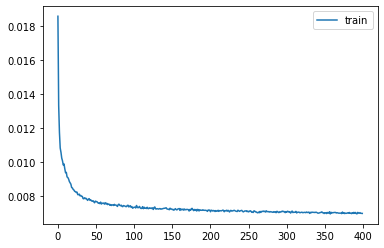

In [ ]:
plt.plot(history_MLP_full_14.history['loss'], label='train')
plt.legend()
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/mlp/loss.png")
plt.show()

21/21 [==============================] - 0s 3ms/step
RMSE: 0.086122


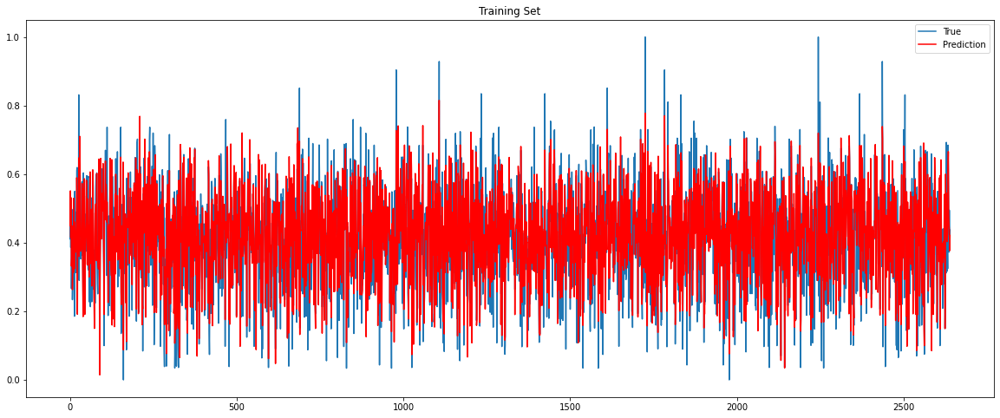

Training Set R-Square= 0.7054048599438016


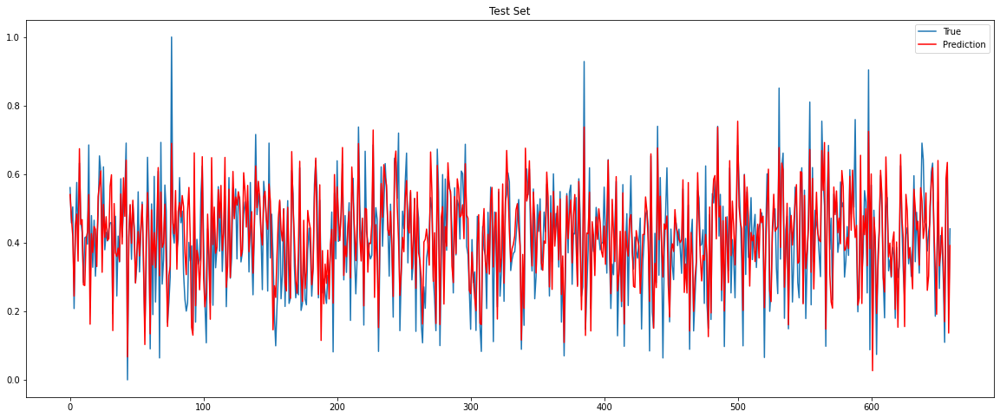

Test Set R-Square= 0.6812693160134772


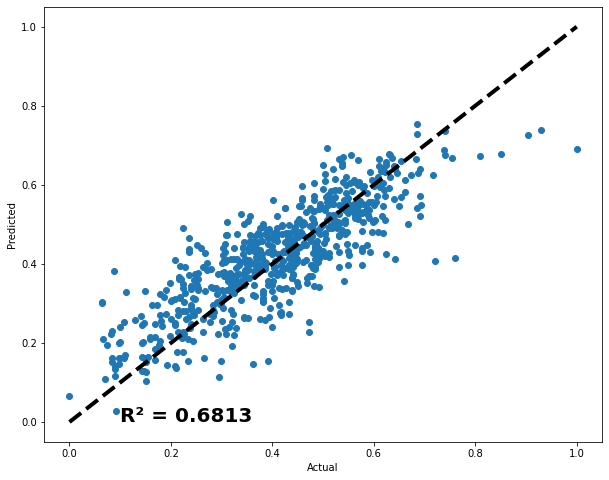

In [ ]:
pred_train_mlp_full_14 = MLP_full_14.predict(X_train_scaled_10_15_20)
pred_test_mlp_full_14 = MLP_full_14.predict(X_test_scaled_10_15_20)

rmse_mlp_full_14 = np.sqrt(mean_squared_error(y_test_scaled_10_15_20, pred_test_mlp_full_14)) 
print("RMSE: %f" % (rmse_mlp_full_14)) 

plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_scaled_10_15_20))
plt.plot(pred_train_mlp_full_14,'r')
plt.title("Average WFV predictions on train data")
plt.legend(["True", "Prediction"])
plt.title('Training Set')
plt.savefig("")
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_train = r2_score(y_train_scaled_10_15_20,pred_train_mlp_full_14)
print("Training Set R-Square=", mlp_indices_r2_train)


plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_scaled_10_15_20))
plt.plot(pred_test_mlp_full_14,'r')
plt.title("Average WFV predictions on test data")
plt.legend(["True", "Prediction"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_test = r2_score(y_test_scaled_10_15_20,pred_test_mlp_full_14)
print("Test Set R-Square=", mlp_indices_r2_test)

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15_20, pred_test_mlp_full_14)
ax.plot([test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], [test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled_10_15_20, pred_test_mlp_full_14)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/mlp/r2.png")
plt.show()




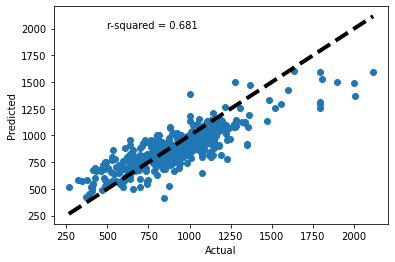

In [ ]:
fig, ax = plt.subplots()
ax.scatter(y_test_full_16, pred_test_mlp_full_16)
ax.plot([yield_full_16.min(), yield_full_16.max()], [yield_full_16.min(), yield_full_16.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("r-squared = {:.3f}".format(r2_score(y_test_full_16, pred_test_mlp_full_16)), (500, 2000))
plt.show()


## XGBoost

In [ ]:
param = {
    'max_depth': 4,
    'learning_rate': 0.22263268291255955,
    'n_estimators': 835,
    'min_child_weight': 3,
    'gamma': 0.013250717825604455,
    'subsample': 0.4671058000154715,
    'colsample_bytree': 0.09841076552545186,
    'reg_alpha': 0.8142648557298242,
    'reg_lambda': 0.16537014620751905,
    'random_state': 641,
}

xg_reg_full_14 = xgb.XGBRegressor(**param)
# xg_reg_full_14 = xgb.XGBRegressor(objective ='reg:squarederror') 

# xg_reg_full_14.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20)
xg_reg_full_14.load_model("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/xgboost/best_model_weights.json")

RMSE: 0.074740


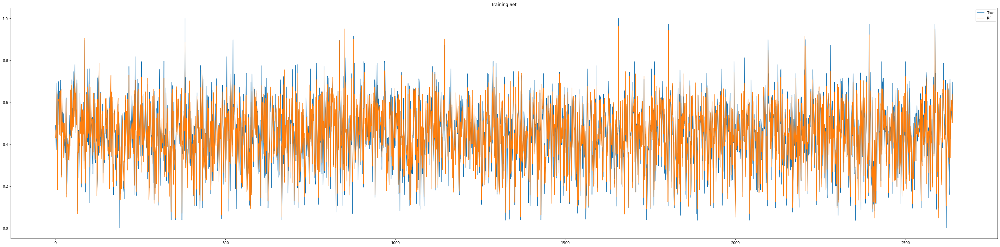

Training Set R-Square= 0.9062059114721946


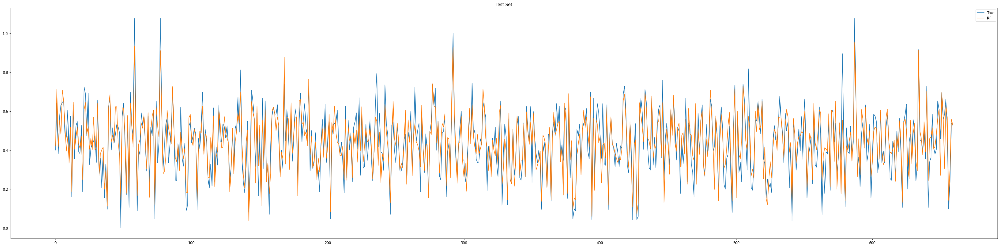

Test Set R-Square= 0.801850415074157


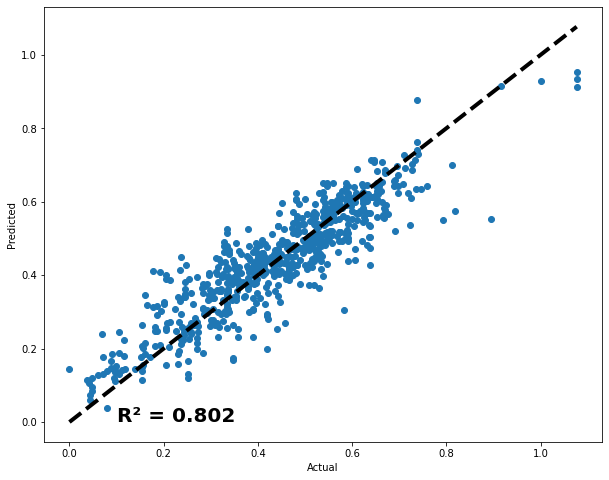

In [ ]:
pred_xgb_full_14 = xg_reg_full_14.predict(X_test_scaled_10_15_20)
pred_train_xgb_full_14 = xg_reg_full_14.predict(X_train_scaled_10_15_20)

rmse_xgb_full_3 = np.sqrt(mean_squared_error(y_test_scaled_10_15_20, pred_xgb_full_14)) 

print("RMSE: %f" % (rmse_xgb_full_3)) 

plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_scaled_10_15_20))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_xgb_full_14)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train_full = r2_score(y_train_scaled_10_15_20,pred_train_xgb_full_14)
print("Training Set R-Square=", rf_indices_r2_train_full)

plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_scaled_10_15_20))
# plt.plot(pred_train_mlp)
plt.plot(pred_xgb_full_14)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_test_full = r2_score(y_test_scaled_10_15_20,pred_xgb_full_14)
print("Test Set R-Square=", rf_indices_r2_test_full)

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15_20, pred_xgb_full_14)
ax.plot([test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], [test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_scaled_10_15_20, pred_xgb_full_14)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/xgboost/r2.png")
plt.show()


## Optuna XGBoost

In [ ]:
best_score_xgb_3 = float('inf')  # Initialize the best score


# You can also define a threshold to flag overfitting on a per-fold basis.
# For each fold, if the relative gap between test and training error is above this threshold, we mark the trial as overfitted.
OVERFIT_THRESHOLD = 0.20  # e.g. if (test_mse - train_mse_3) / test_mse > 20%

def optuna_xgb_3(trial):
    """
    Objective function for Optuna.
    
    For each trial, we:
      1. Suggest XGBoost hyperparameters.
      2. Run a 5‑fold cross validation.
           - In each fold: split the fold’s “test/validation” set further 50–50.
           - Scale features (and target) using training‐only information.
           - Fit the XGBoost model with early stopping on the validation set.
           - Compute both training and test error (MSE).
           - Check for overfitting on that fold.
      3. If any fold shows too much overfitting, we immediately return a high penalty.
      4. Otherwise, compute the mean and standard deviation of the test MSE across folds.
      5. Update (and save) the best model if the combined score (mean + std) is lower than the best seen so far.
    """
    # -------------------------
    # 1. Hyperparameter suggestions
    # -------------------------
    param_3 = {
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.01, 1.0),
        'subsample': trial.suggest_float('subsample', 0.01, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
        'random_state': trial.suggest_int('random_state', 1, 1000)
    }
    
    # -------------------------
    # 2. 5-Fold Cross Validation
    # -------------------------
    fold_test_mses_3 = []       # Will store test MSE (on the 50% test split of each fold)
    fold_train_mses_3 = []      # Will store training MSE for overfitting check
    fold_train_indices_3 = []   # Will store the training indices for each fold
    fold_test_indices_3 = []    # Will store the test indices for each fold
    fold_test_r2_3 = []
    # Loop over each fold
    for fold, (train_index_3, test_val_index_3) in enumerate(kf_10_15_20.split(X_scaled_10_15_20)):
        # The CV split: use fold's training indices and "test/validation" indices.
        X_fold_train_10_15_20, X_fold_testval_10_15_20 = X_scaled_10_15_20[train_index_3], X_scaled_10_15_20[test_val_index_3]
        y_fold_train_10_15_20, y_fold_testval_10_15_20 = y_scaled_10_15_20[train_index_3], y_scaled_10_15_20[test_val_index_3]
        fold_train_indices_3.append(train_index_3)
        fold_test_indices_3.append(test_val_index_3)
        # --- Further split the test/validation set into 50–50 splits ---
        # This yields a test set (for final prediction evaluation) and a validation set (for early stopping)
        (X_test_fold_10_15_20, X_val_fold_10_15_20,
         y_test_fold_10_15_20, y_val_fold_10_15_20) = train_test_split(
            X_fold_testval_10_15_20, y_fold_testval_10_15_20, test_size=0.5,
            random_state=42
        )
        
        # --- Train the model with early stopping ---
        xgb_model_3 = xgb.XGBRegressor(**param_3)
        xgb_model_3.fit(
            X_fold_train_10_15_20, y_fold_train_10_15_20,
            eval_set=[(X_val_fold_10_15_20, y_val_fold_10_15_20)],
            early_stopping_rounds=10,
            verbose=False
        )
        
        # --- Evaluate performance on test set (for this fold) ---
        y_pred_test_3 = xgb_model_3.predict(X_test_fold_10_15_20)
        test_r2_fold = r2_score(y_test_fold_10_15_20, y_pred_test_3)
        fold_test_r2_3.append(test_r2_fold)
        test_mse_3 = mean_squared_error(y_test_fold_10_15_20, y_pred_test_3)
        fold_test_mses_3.append(test_mse_3)
        
        # Also compute training error (using the training fold) for an overfitting check.
        y_pred_train = xgb_model_3.predict(X_fold_train_10_15_20)
        train_mse_3 = mean_squared_error(y_fold_train_10_15_20, y_pred_train)
        fold_train_mses_3.append(train_mse_3)
        
        # --- Check for overfitting in this fold ---
        # If the training error is much lower than the test error, then we flag this fold.
        # if test_mse_3 > 0 and ((test_mse_3 - train_mse_3) / test_mse_3) > OVERFIT_THRESHOLD:
        #     # If overfitting is detected in any fold, we return a large penalty.
        #     # (This trial will not be considered as a candidate for the best model.)
        #     return 1e6  # high penalty value
    
    mean_mse_3 = np.mean(fold_test_mses_3)
    std_mse_3 = np.std(fold_test_mses_3)
    trial_score_3 = mean_mse_3 + std_mse_3  # Lower is better when both error and its variance are low.
    
    # Find the index of the fold with the lowest test MSE
    best_fold_index_3, best_fold_mse = min(enumerate(fold_test_mses_3), key=lambda x: x[1])
    
    # -------------------------
    # 4. Save model if this trial beats all previous non-overfitted trials
    # -------------------------
    # trial_score_3 = fold_test_mses_3[best_fold_index_3]  # Lower is better when both error and its variance are low.
    global best_score_xgb_3
    if trial_score_3 < best_score_xgb_3:
        best_score_xgb_3 = trial_score_3
        # To save the “best‐of‐the‐best” model, retrain on the entire dataset using the same splitting scheme.
        # First, split the full dataset into 80% training and 20% test/validation.
        X_fold_train_full_10_15_20, X_testval_full_10_15_20 = X_scaled_10_15_20[fold_train_indices_3[best_fold_index_3]], X_scaled_10_15_20[fold_test_indices_3[best_fold_index_3]]
        y_fold_train_full_10_15_20, y_testval_full_10_15_20 = y_scaled_10_15_20[fold_train_indices_3[best_fold_index_3]], y_scaled_10_15_20[fold_test_indices_3[best_fold_index_3]]
        # Then split the 20% into equal parts: test and validation (each 10% of the full data).
        X_test_full_10_15_20, X_val_full_10_15_20, y_test_full_10_15_20, y_val_full_10_15_20 = train_test_split(
            X_testval_full_10_15_20, y_testval_full_10_15_20, test_size=0.5, random_state=42
        )
  
        # Train a final model on the full training set with early stopping on the validation set.
        xgb_final_model_3 = xgb.XGBRegressor(**param_3)
        xgb_final_model_3.fit(
            X_fold_train_full_10_15_20, y_fold_train_full_10_15_20,
            eval_set=[(X_val_full_10_15_20, y_val_full_10_15_20)],
            early_stopping_rounds=10,
            verbose=False
        )

        y_pred_test_3_best = xgb_final_model_3.predict(X_test_full_10_15_20)
        mse_best_3 = mean_squared_error(y_test_full_10_15_20, y_pred_test_3_best)
        r2_best_3 = r2_score(y_test_full_10_15_20, y_pred_test_3_best)
        print(f"Best model MSE: {mse_best_3:.4f}")
        print(f"Best model R2 score: {r2_best_3:.4f}")

        # Save the final model along with its hyperparameters and the scalers (for future use).
        best_model_info = {
            "model": xgb_final_model_3,
            "params": param_3,
            "fold_data": {"X_train": X_fold_train_full_10_15_20, "y_train": y_fold_train_full_10_15_20, "X_test": X_test_full_10_15_20, "y_test": y_test_full_10_15_20, "X_val": X_val_full_10_15_20, "y_val": y_val_full_10_15_20}
        }
        
        # IMPORTANT: Only one file (the “best” model) is saved/overwritten each time a new best trial is found.
        save_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/xgboost/best_model.pkl'
        with open(save_path, 'wb') as f:
            pickle.dump(best_model_info, f)
    
    return trial_score_3


# Create the study
study_xgb_3 = optuna.create_study(direction='minimize', study_name='regression')
study_xgb_3.optimize(optuna_xgb_3, n_trials=200)
print("Number of finished trials: {}".format(len(study_xgb_3.trials)))
 
print("Best trial:")
trial_xgb_3 = study_xgb_3.best_trial

print("  Value (mean mse + std): {:.4f}".format(trial_xgb_3.value))

print("  Params: ")
for key, value in trial_xgb_3.params.items():
    print("    {}: {}".format(key, value))


[I 2025-02-20 09:58:29,967] A new study created in memory with name: regression
[I 2025-02-20 09:58:30,554] Trial 0 finished with value: 0.015778394405563795 and parameters: {'max_depth': 8, 'learning_rate': 0.16344076868428745, 'n_estimators': 593, 'min_child_weight': 10, 'gamma': 0.4830114469845887, 'subsample': 0.13401782733205894, 'colsample_bytree': 0.5761995716339304, 'reg_alpha': 0.1443041509486493, 'reg_lambda': 0.4794141889994906, 'random_state': 162}. Best is trial 0 with value: 0.015778394405563795.


Best model MSE: 0.0142
Best model R2 score: 0.4495


[I 2025-02-20 09:58:30,956] Trial 1 finished with value: 0.01091789443435805 and parameters: {'max_depth': 2, 'learning_rate': 0.9388481939985012, 'n_estimators': 72, 'min_child_weight': 4, 'gamma': 0.15819302679267666, 'subsample': 0.8582068770097846, 'colsample_bytree': 0.8552667657354004, 'reg_alpha': 0.8751827774202305, 'reg_lambda': 0.528134623386573, 'random_state': 753}. Best is trial 1 with value: 0.01091789443435805.


Best model MSE: 0.0098
Best model R2 score: 0.6195


[I 2025-02-20 09:58:35,691] Trial 2 finished with value: 0.010408983623517902 and parameters: {'max_depth': 10, 'learning_rate': 0.053957171220067, 'n_estimators': 238, 'min_child_weight': 2, 'gamma': 0.40988494415140264, 'subsample': 0.8681259070533662, 'colsample_bytree': 0.5620942353207546, 'reg_alpha': 0.6822732858778892, 'reg_lambda': 0.04136335280373147, 'random_state': 231}. Best is trial 2 with value: 0.010408983623517902.
[I 2025-02-20 09:58:35,828] Trial 3 finished with value: 0.01768157197376027 and parameters: {'max_depth': 4, 'learning_rate': 0.902565183449291, 'n_estimators': 584, 'min_child_weight': 10, 'gamma': 0.3903477452409923, 'subsample': 0.15767498778538291, 'colsample_bytree': 0.27952636012131343, 'reg_alpha': 0.07177763338250254, 'reg_lambda': 0.6226564636485551, 'random_state': 90}. Best is trial 2 with value: 0.010408983623517902.


Best model MSE: 0.0092
Best model R2 score: 0.6426


[I 2025-02-20 09:58:37,723] Trial 4 finished with value: 0.008979311292939923 and parameters: {'max_depth': 9, 'learning_rate': 0.1881273954156515, 'n_estimators': 709, 'min_child_weight': 7, 'gamma': 0.14516609140098108, 'subsample': 0.5610292647948527, 'colsample_bytree': 0.4177069044192808, 'reg_alpha': 0.506200313095864, 'reg_lambda': 0.022202255202377515, 'random_state': 359}. Best is trial 4 with value: 0.008979311292939923.


Best model MSE: 0.0077
Best model R2 score: 0.7067


[I 2025-02-20 09:58:38,429] Trial 5 finished with value: 0.01389366532531234 and parameters: {'max_depth': 8, 'learning_rate': 0.36391132221743094, 'n_estimators': 56, 'min_child_weight': 3, 'gamma': 0.7689651941126691, 'subsample': 0.6446212628410165, 'colsample_bytree': 0.5300080458684399, 'reg_alpha': 0.9293044217532311, 'reg_lambda': 0.6529822083257056, 'random_state': 377}. Best is trial 4 with value: 0.008979311292939923.
[I 2025-02-20 09:58:38,730] Trial 6 finished with value: 0.012309354390428425 and parameters: {'max_depth': 4, 'learning_rate': 0.6332414546852789, 'n_estimators': 509, 'min_child_weight': 6, 'gamma': 0.7113120969469585, 'subsample': 0.922954664557234, 'colsample_bytree': 0.8336230784094681, 'reg_alpha': 0.2949529567479052, 'reg_lambda': 0.5684837519975895, 'random_state': 640}. Best is trial 4 with value: 0.008979311292939923.
[I 2025-02-20 09:58:39,263] Trial 7 finished with value: 0.014193450591829958 and parameters: {'max_depth': 8, 'learning_rate': 0.804969

Best model MSE: 0.0057
Best model R2 score: 0.7794


[I 2025-02-20 09:59:01,274] Trial 15 finished with value: 0.005799331800627307 and parameters: {'max_depth': 6, 'learning_rate': 0.24660159299203677, 'n_estimators': 804, 'min_child_weight': 8, 'gamma': 0.020778943583615428, 'subsample': 0.5291444457822372, 'colsample_bytree': 0.967832008583494, 'reg_alpha': 0.296588911333729, 'reg_lambda': 0.31578250218274195, 'random_state': 798}. Best is trial 15 with value: 0.005799331800627307.


Best model MSE: 0.0051
Best model R2 score: 0.8009


[I 2025-02-20 09:59:02,361] Trial 16 finished with value: 0.007285754806670311 and parameters: {'max_depth': 6, 'learning_rate': 0.3344399426251955, 'n_estimators': 837, 'min_child_weight': 8, 'gamma': 0.05623408177293792, 'subsample': 0.438376901714824, 'colsample_bytree': 0.9954025003226686, 'reg_alpha': 0.3024321861795409, 'reg_lambda': 0.37183326545429296, 'random_state': 834}. Best is trial 15 with value: 0.005799331800627307.
[I 2025-02-20 09:59:02,794] Trial 17 finished with value: 0.009876089927543958 and parameters: {'max_depth': 6, 'learning_rate': 0.4968094393375537, 'n_estimators': 868, 'min_child_weight': 5, 'gamma': 0.014937939817587786, 'subsample': 0.3154547179990944, 'colsample_bytree': 0.8951555129297093, 'reg_alpha': 0.2932158149749316, 'reg_lambda': 0.355901827003844, 'random_state': 717}. Best is trial 15 with value: 0.005799331800627307.
[I 2025-02-20 09:59:03,465] Trial 18 finished with value: 0.0073997168047799464 and parameters: {'max_depth': 4, 'learning_rate'

Best model MSE: 0.0045
Best model R2 score: 0.8261


[I 2025-02-20 09:59:19,890] Trial 29 finished with value: 0.009949332521208323 and parameters: {'max_depth': 3, 'learning_rate': 0.11161190045324534, 'n_estimators': 563, 'min_child_weight': 6, 'gamma': 0.22978323415872443, 'subsample': 0.7817587201856425, 'colsample_bytree': 0.6326396649662439, 'reg_alpha': 0.5702149014134471, 'reg_lambda': 0.1202182965260597, 'random_state': 977}. Best is trial 28 with value: 0.0057639359173430865.
[I 2025-02-20 09:59:20,507] Trial 30 finished with value: 0.013225591563305595 and parameters: {'max_depth': 1, 'learning_rate': 0.13973146960692423, 'n_estimators': 293, 'min_child_weight': 7, 'gamma': 0.32020652779692704, 'subsample': 0.6624359425418913, 'colsample_bytree': 0.6799928409491287, 'reg_alpha': 0.11708465716682268, 'reg_lambda': 0.09677270739381566, 'random_state': 896}. Best is trial 28 with value: 0.0057639359173430865.
[I 2025-02-20 09:59:22,950] Trial 31 finished with value: 0.007450689011498607 and parameters: {'max_depth': 6, 'learning_

Best model MSE: 0.0040
Best model R2 score: 0.8436


[I 2025-02-20 09:59:30,492] Trial 34 finished with value: 0.009288852529515902 and parameters: {'max_depth': 2, 'learning_rate': 0.0700969520702115, 'n_estimators': 361, 'min_child_weight': 6, 'gamma': 0.12629920769899808, 'subsample': 0.6554918440538833, 'colsample_bytree': 0.5793057241136115, 'reg_alpha': 0.2091410801764293, 'reg_lambda': 0.0808060268888619, 'random_state': 785}. Best is trial 33 with value: 0.004733827998227201.
[I 2025-02-20 09:59:32,655] Trial 35 finished with value: 0.007345695791528559 and parameters: {'max_depth': 4, 'learning_rate': 0.0628112395430814, 'n_estimators': 219, 'min_child_weight': 8, 'gamma': 0.10750482969053296, 'subsample': 0.8106477144475289, 'colsample_bytree': 0.7242441925378044, 'reg_alpha': 0.12127254795137979, 'reg_lambda': 0.0884243261634691, 'random_state': 900}. Best is trial 33 with value: 0.004733827998227201.
[I 2025-02-20 09:59:33,886] Trial 36 finished with value: 0.008188050609621321 and parameters: {'max_depth': 5, 'learning_rate'

Best model MSE: 0.0039
Best model R2 score: 0.8494


[I 2025-02-20 10:01:26,265] Trial 89 finished with value: 0.007680369009745527 and parameters: {'max_depth': 6, 'learning_rate': 0.12346203925985316, 'n_estimators': 241, 'min_child_weight': 1, 'gamma': 0.15401429410672007, 'subsample': 0.965130575047181, 'colsample_bytree': 0.9167022245646234, 'reg_alpha': 0.2396641493555317, 'reg_lambda': 0.057290059272334604, 'random_state': 707}. Best is trial 88 with value: 0.004696652193284571.
[I 2025-02-20 10:01:28,965] Trial 90 finished with value: 0.007175735858940993 and parameters: {'max_depth': 6, 'learning_rate': 0.06037553285601687, 'n_estimators': 183, 'min_child_weight': 3, 'gamma': 0.09316771120941575, 'subsample': 0.9067769668698857, 'colsample_bytree': 0.9855221854621891, 'reg_alpha': 0.29257080750057085, 'reg_lambda': 0.07024154183239756, 'random_state': 860}. Best is trial 88 with value: 0.004696652193284571.
[I 2025-02-20 10:01:31,649] Trial 91 finished with value: 0.005921674253033061 and parameters: {'max_depth': 5, 'learning_r

Best model MSE: 0.0039
Best model R2 score: 0.8472


[I 2025-02-20 10:01:39,256] Trial 93 finished with value: 0.006281176722856229 and parameters: {'max_depth': 6, 'learning_rate': 0.11253625037422484, 'n_estimators': 311, 'min_child_weight': 1, 'gamma': 0.06724865307625812, 'subsample': 0.9516232942613206, 'colsample_bytree': 0.9285902046740511, 'reg_alpha': 0.26433685304388443, 'reg_lambda': 0.024875629267804553, 'random_state': 639}. Best is trial 92 with value: 0.004667629632690842.
[I 2025-02-20 10:01:42,671] Trial 94 finished with value: 0.006967449685107613 and parameters: {'max_depth': 5, 'learning_rate': 0.018310334322464577, 'n_estimators': 193, 'min_child_weight': 2, 'gamma': 0.03530560925506427, 'subsample': 0.9879730091891747, 'colsample_bytree': 0.8683073762006768, 'reg_alpha': 0.22721914941445712, 'reg_lambda': 0.1125157645082452, 'random_state': 727}. Best is trial 92 with value: 0.004667629632690842.
[I 2025-02-20 10:01:45,545] Trial 95 finished with value: 0.004807118350483475 and parameters: {'max_depth': 6, 'learning

Best model MSE: 0.0038
Best model R2 score: 0.8516


[I 2025-02-20 10:02:03,002] Trial 100 finished with value: 0.006403269227631572 and parameters: {'max_depth': 5, 'learning_rate': 0.12694323552228973, 'n_estimators': 215, 'min_child_weight': 1, 'gamma': 0.05953396291570692, 'subsample': 0.8960675999585527, 'colsample_bytree': 0.9990587253242115, 'reg_alpha': 0.3168258755041125, 'reg_lambda': 0.1674707527989409, 'random_state': 564}. Best is trial 99 with value: 0.0046565519703483695.
[I 2025-02-20 10:02:06,679] Trial 101 finished with value: 0.005384051669761532 and parameters: {'max_depth': 6, 'learning_rate': 0.07458841772286914, 'n_estimators': 177, 'min_child_weight': 3, 'gamma': 0.030250242109493418, 'subsample': 0.8799505440461055, 'colsample_bytree': 0.9409626408114604, 'reg_alpha': 0.28724583147394045, 'reg_lambda': 0.11257846729241035, 'random_state': 635}. Best is trial 99 with value: 0.0046565519703483695.
[I 2025-02-20 10:02:09,715] Trial 102 finished with value: 0.004795052792745549 and parameters: {'max_depth': 6, 'learn

Best model MSE: 0.0042
Best model R2 score: 0.8393


[I 2025-02-20 10:03:15,408] Trial 128 finished with value: 0.00769406502719405 and parameters: {'max_depth': 5, 'learning_rate': 0.14851667726426235, 'n_estimators': 164, 'min_child_weight': 4, 'gamma': 0.1410632921025296, 'subsample': 0.8573022446782981, 'colsample_bytree': 0.961511971099463, 'reg_alpha': 0.18892750622282903, 'reg_lambda': 0.09520739785581935, 'random_state': 549}. Best is trial 127 with value: 0.004540332359708174.
[I 2025-02-20 10:03:17,584] Trial 129 finished with value: 0.006977807736111956 and parameters: {'max_depth': 5, 'learning_rate': 0.12394113837417661, 'n_estimators': 239, 'min_child_weight': 4, 'gamma': 0.08793241214879746, 'subsample': 0.875953756892646, 'colsample_bytree': 0.9402265821429042, 'reg_alpha': 0.2404060569144554, 'reg_lambda': 0.0365659962706443, 'random_state': 505}. Best is trial 127 with value: 0.004540332359708174.
[I 2025-02-20 10:03:19,785] Trial 130 finished with value: 0.006242339334993489 and parameters: {'max_depth': 5, 'learning_r

Best model MSE: 0.0038
Best model R2 score: 0.8543


[I 2025-02-20 10:04:12,095] Trial 153 finished with value: 0.005358209707243131 and parameters: {'max_depth': 6, 'learning_rate': 0.1661326261521447, 'n_estimators': 161, 'min_child_weight': 1, 'gamma': 0.03827401823391682, 'subsample': 0.9385996935254762, 'colsample_bytree': 0.9268031342033282, 'reg_alpha': 0.20452614015101717, 'reg_lambda': 0.0318756486053727, 'random_state': 618}. Best is trial 152 with value: 0.004451051694318562.
[I 2025-02-20 10:04:15,354] Trial 154 finished with value: 0.004507964501558528 and parameters: {'max_depth': 5, 'learning_rate': 0.13946027529892044, 'n_estimators': 201, 'min_child_weight': 2, 'gamma': 0.010359387520506417, 'subsample': 0.9770470791788048, 'colsample_bytree': 0.9368509459605066, 'reg_alpha': 0.164283391258529, 'reg_lambda': 0.028865932982013735, 'random_state': 640}. Best is trial 152 with value: 0.004451051694318562.
[I 2025-02-20 10:04:16,773] Trial 155 finished with value: 0.00606594897674691 and parameters: {'max_depth': 5, 'learnin

Best model MSE: 0.0037
Best model R2 score: 0.8561


[I 2025-02-20 10:05:48,069] Trial 192 finished with value: 0.008812693029564904 and parameters: {'max_depth': 5, 'learning_rate': 0.28728897621056887, 'n_estimators': 250, 'min_child_weight': 1, 'gamma': 0.2096617324804551, 'subsample': 0.8647555864022834, 'colsample_bytree': 0.9396582074306278, 'reg_alpha': 0.4022777604486186, 'reg_lambda': 0.05384736691857892, 'random_state': 607}. Best is trial 191 with value: 0.004405729382949239.
[I 2025-02-20 10:05:49,065] Trial 193 finished with value: 0.010057935444376135 and parameters: {'max_depth': 5, 'learning_rate': 0.14666176907826445, 'n_estimators': 286, 'min_child_weight': 1, 'gamma': 0.4023651081626456, 'subsample': 0.9183378553893411, 'colsample_bytree': 0.916784957250443, 'reg_alpha': 0.38413965132334116, 'reg_lambda': 0.09785442234034535, 'random_state': 632}. Best is trial 191 with value: 0.004405729382949239.
[I 2025-02-20 10:05:52,086] Trial 194 finished with value: 0.005415299663257257 and parameters: {'max_depth': 5, 'learning

Number of finished trials: 200
Best trial:
  Value (mean mse + std): 0.0044
  Params: 
    max_depth: 5
    learning_rate: 0.1251412961501111
    n_estimators: 256
    min_child_weight: 1
    gamma: 0.01007800244603585
    subsample: 0.8821238707417866
    colsample_bytree: 0.9429312873845411
    reg_alpha: 0.2098001241258002
    reg_lambda: 0.056784215278500166
    random_state: 563


In [ ]:
# Load the saved model and its hyperparameters
load_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/xgboost/best_model.pkl'
with open(load_path, 'rb') as f:
    best_model_info = pickle.load(f)

# Retrieve the model and its hyperparameters (if needed)
xgb_final_model_3 = best_model_info["model"]
best_params = best_model_info["params"]

predicted_value = xgb_final_model_3.predict(X_test_scaled_10_15_20)


r2_test = r2_score(y_test_scaled_10_15_20, predicted_value)
print("R2 score on test set:", r2_test)

R2 score on test set: 0.7315842444572636


In [ ]:
# Load the saved model and its hyperparameters
load_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/xgboost/best_model.pkl'
with open(load_path, 'rb') as f:
    best_model_info = pickle.load(f)

# Retrieve the model and its hyperparameters (if needed)
xgb_final_model_1 = best_model_info["model"]
best_params = best_model_info["params"]

predicted_value = xgb_final_model_1.predict(X_test_scaled)


r2_test = r2_score(y_test_scaled, predicted_value)
print("R2 score on test set:", r2_test)

KeyError: 'params'

In [ ]:
best_score_xgb_3 = float('inf')  # Initialize the best score

def optuna_xgb_3(trial):
    param = {
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.01, 1.0),
        'subsample': trial.suggest_float('subsample', 0.01, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
        'random_state': trial.suggest_int('random_state', 1, 1000)
    }
    model = xgb.XGBRegressor(**param)
    model.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20)
    y_pred = model.predict(X_test_scaled_10_15_20)

    mse_3 = mean_squared_error(y_test_scaled_10_15_20, y_pred)
    global best_score_xgb_3
    if mse_3 < best_score_xgb_3:  # Update the best score and save the model weights
        best_score_xgb_3 = mse_3
        model.save_model('/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/xgboost/best_model_weights.json')
    return mse_3

# Create the study
study_xgb_3 = optuna.create_study(direction='minimize', study_name='regression')
study_xgb_3.optimize(optuna_xgb_3, n_trials=100)


print("Number of finished trials: {}".format(len(study_xgb_3.trials)))

print("Best trial:")
trial_xgb_3 = study_xgb_3.best_trial

print("  Value: {}".format(trial_xgb_3.value))

print("  Params: ")
for key, value in trial_xgb_3.params.items():
    print("    {}: {}".format(key, value))

[I 2023-11-13 18:36:32,150] A new study created in memory with name: regression
[I 2023-11-13 18:36:35,954] Trial 0 finished with value: 0.01410153136576198 and parameters: {'max_depth': 4, 'learning_rate': 0.45503564601505414, 'n_estimators': 868, 'min_child_weight': 1, 'gamma': 0.8204642137812881, 'subsample': 0.28813692644101474, 'colsample_bytree': 0.8699826498242662, 'reg_alpha': 0.415319345672984, 'reg_lambda': 0.8919077749991401, 'random_state': 596}. Best is trial 0 with value: 0.01410153136576198.
[I 2023-11-13 18:36:36,470] Trial 1 finished with value: 0.015450272788094173 and parameters: {'max_depth': 3, 'learning_rate': 0.48924662017417936, 'n_estimators': 191, 'min_child_weight': 10, 'gamma': 0.7668019015711163, 'subsample': 0.3198854353018256, 'colsample_bytree': 0.44875328859574626, 'reg_alpha': 0.727137840389391, 'reg_lambda': 0.26687918486105416, 'random_state': 31}. Best is trial 0 with value: 0.01410153136576198.
[I 2023-11-13 18:36:41,595] Trial 2 finished with valu

Number of finished trials: 100
Best trial:
  Value: 0.005586109972063694
  Params: 
    max_depth: 6
    learning_rate: 0.5776561057845523
    n_estimators: 406
    min_child_weight: 3
    gamma: 0.029688898134754657
    subsample: 0.9789265023319311
    colsample_bytree: 0.5960863005175199
    reg_alpha: 0.756038550251351
    reg_lambda: 0.4850395728418791
    random_state: 132


# Results

RMSE: 0.074486
R2: 0.765172


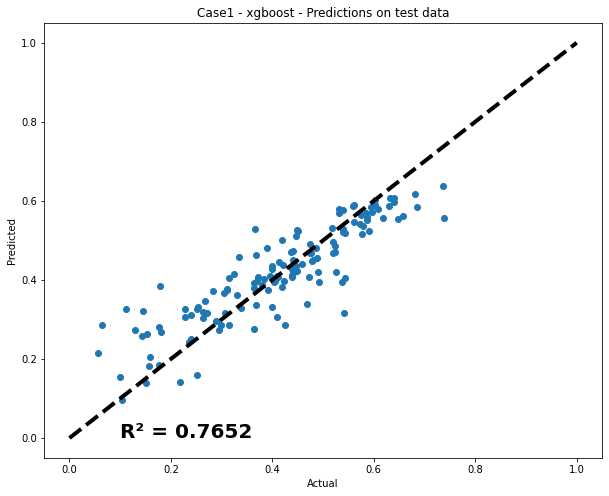

In [41]:
case1_xgb_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/xgboost/best_model.pkl'

with open(case1_xgb_model_path, 'rb') as f:
    best_model_info = pickle.load(f)
case_model = best_model_info.get("model")
best_case_data = best_model_info.get("fold_data")

pred = case_model.predict(X_test_scaled) 

rmse = np.sqrt(mean_squared_error(y_test_scaled, pred)) 
print("RMSE: %f" % (rmse)) 

r2 = r2_score(y_test_scaled, pred)
print("R2: %f" % (r2)) 

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled, pred)
ax.plot([test.min(), test.max()], [test.min(), test.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title(f"Case1 - xgboost - Predictions on test data")
ax.annotate("R² = {:.4f}".format(r2), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/xgboost/r2.png")
plt.show()


In [23]:
SAVE_DIR = "/Users/alperbalmumcu/Github/crop-yield-estimation/results/"


In [36]:
def print_results(model, X_test, y_test, test, case_name, model_name, _type, r2_save_path, save_bool =True):
    pred = model.predict(X_test) 
    
    rmse = np.sqrt(mean_squared_error(y_test, pred)) 
    print("RMSE: %f" % (rmse)) 

    r2 = r2_score(y_test, pred)
    print("R2: %f" % (r2)) 

    fig, ax = plt.subplots(figsize=(10,8))
    ax.scatter(y_test, pred)
    ax.plot([test.min(), test.max()], [test.min(), test.max()], 'k--', lw=4)
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title(f"{case_name} - {model_name} - predictions on {_type} data")
    ax.annotate("R² = {:.4f}".format(r2), (0.1, 0),fontsize=20, fontweight='bold')
    if save_bool:
        plt.savefig(r2_save_path)
    plt.show()
    return rmse, r2

In [25]:
def save_history(history, case_name, model_name, save_path=SAVE_DIR+"case1/lstm/loss.png", save_bool=False):

    plt.figure(figsize=(16, 10))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'{case_name} - {model_name} - Training and Validation Loss')
    plt.legend()
    plt.grid(True)
    if save_bool:
        plt.savefig(save_path)
    plt.show()

In [39]:
def case_model_predict( case_name, model_name, best_model_info_path, case_data, history_save_path, r2_save_path=SAVE_DIR+"case1/lstm/r2.png"):
    # Load best hyperparameters
    # best_model_info_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/lstm/best_model_info.pkl'
    with open(best_model_info_path, 'rb') as f:
        best_model_info = pickle.load(f)
    case_model = best_model_info.get("model")
    best_case_data = best_model_info.get("fold_data")

            # "fold_data": {"X_train": X_fold_train_full_10_15_20, "y_train": y_fold_train_full_10_15_20, "X_test": X_test_full_10_15_20, "y_test": y_test_full_10_15_20, "X_val": X_val_full_10_15_20, "y_val": y_val_full_10_15_20}
    best_case_data["X_test"]
    best_case_data["y_test"]
    best_case_data["X_val"]
    best_case_data["y_val"]
    best_case_data["X_train"]
    best_case_data["y_train"]


    history = None
    if (model_name == "lstm") or (model_name == "mlp"):
        try:
            history = best_model_info.get("history")
            save_history(history, case_name, model_name, save_path=history_save_path, save_bool=True)
        except:
            pass

    
    # case_model_rmse,case_model_r2 = print_results(case_model,c1_datas[0][1],c1_datas[0][3],c1_datas[0][4],r2_save_path=r2_save_path)

    ## Test Data
    case_model_rmse,case_model_r2 = print_results(case_model,
                                                  best_case_data["X_test"],
                                                  best_case_data["y_test"],
                                                  case_data[0][4],
                                                  case_name,
                                                  model_name,
                                                  _type="test",
                                                  r2_save_path=r2_save_path,
                                                   save_bool=True)

    # Train Data
    case_model_rmse_train,case_model_r2_train = print_results(case_model,
                                                              best_case_data["X_train"],
                                                              best_case_data["y_train"],
                                                              case_data[0][4],
                                                              case_name,
                                                              model_name,
                                                              _type="train",
                                                              r2_save_path=r2_save_path,
                                                              save_bool=False)

    # Validation Data
    case_model_rmse_val,case_model_r2_val = print_results(case_model,
                                                          best_case_data["X_val"],
                                                          best_case_data["y_val"],
                                                          case_data[0][4],
                                                          case_name,
                                                          model_name,
                                                          _type="val",
                                                          r2_save_path=r2_save_path,
                                                          save_bool=False)

    return case_model_rmse, case_model_r2, case_model_rmse_train, case_model_r2_train, case_model_rmse_val, case_model_r2_val


In [27]:
def case_model_identifier(model_path, case_id =1):
    import os
    # Extracting the desired part
    path_parts = model_path.split(os.sep)
    index = path_parts.index(f"Case{case_id}")
    extracted_path = os.path.join(path_parts[index], path_parts[index + 1])
    return extracted_path, path_parts[index], path_parts[index + 1]

## All Cases Results

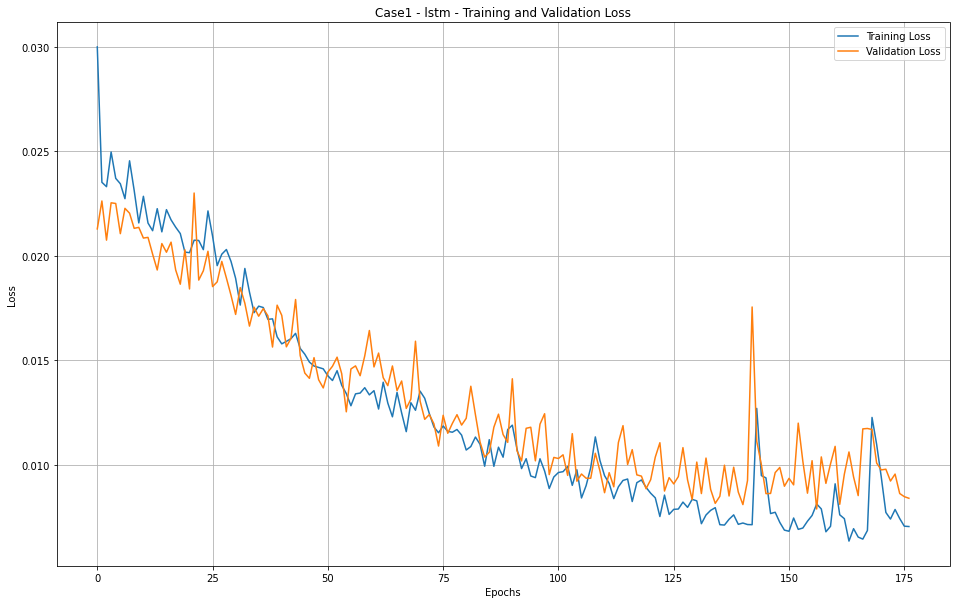

4/4 [==============================] - 0s 5ms/step
RMSE: 0.086449
R2: 0.688310


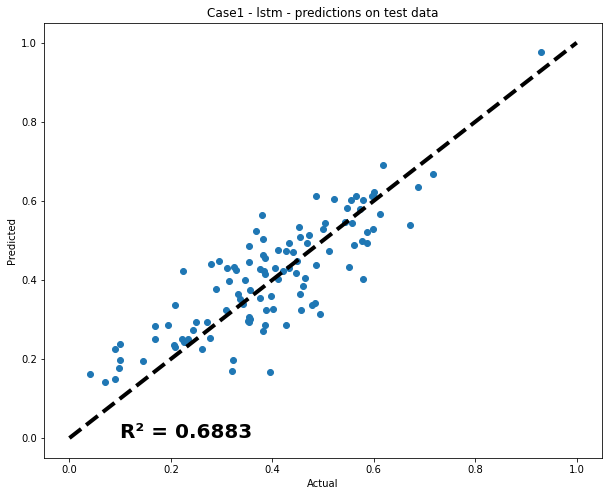

28/28 [==============================] - 0s 5ms/step
RMSE: 0.074362
R2: 0.760426


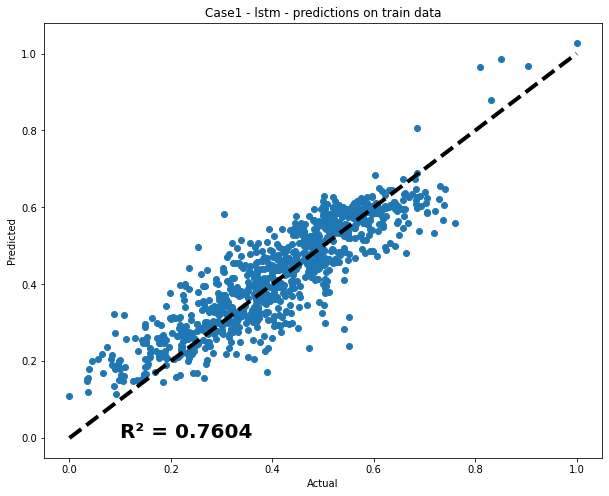

4/4 [==============================] - 0s 4ms/step
RMSE: 0.088725
R2: 0.638380


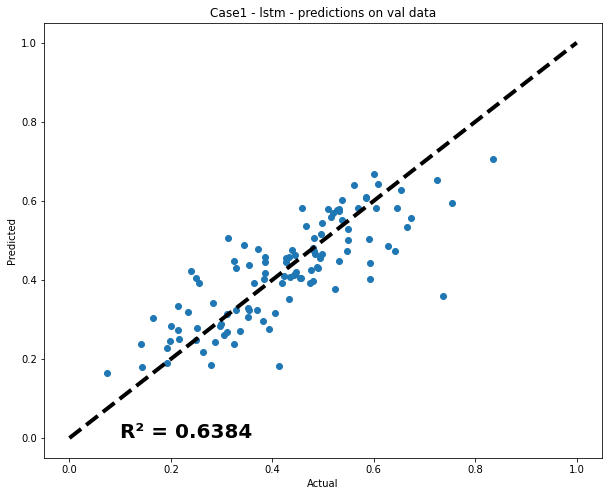

7/7 [==============================] - 1s 6ms/step
RMSE: 0.082769
R2: 0.740667


<Figure size 1152x720 with 0 Axes>

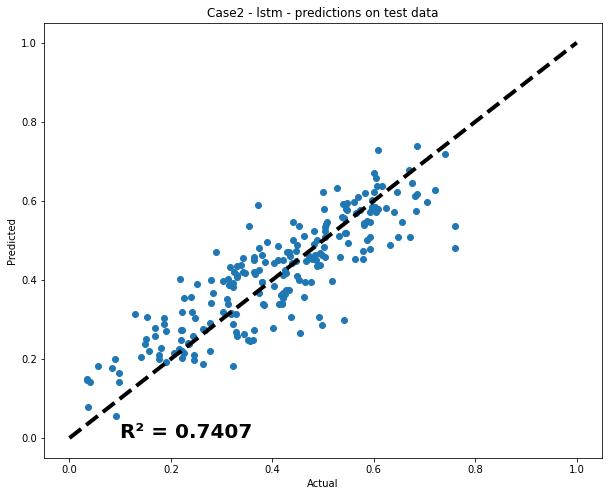

55/55 [==============================] - 0s 5ms/step
RMSE: 0.066479
R2: 0.808128


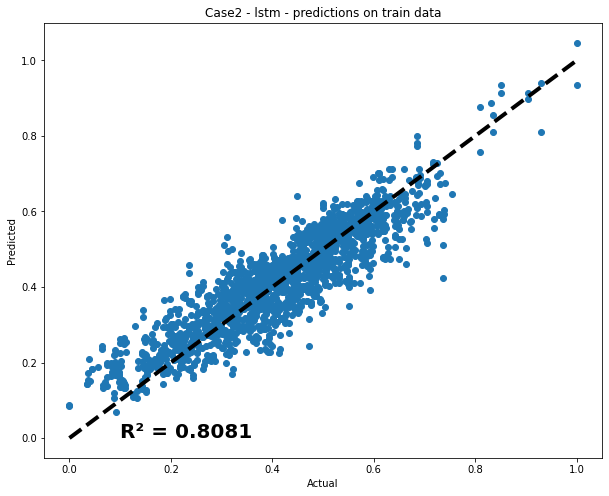

7/7 [==============================] - 0s 5ms/step
RMSE: 0.083762
R2: 0.652512


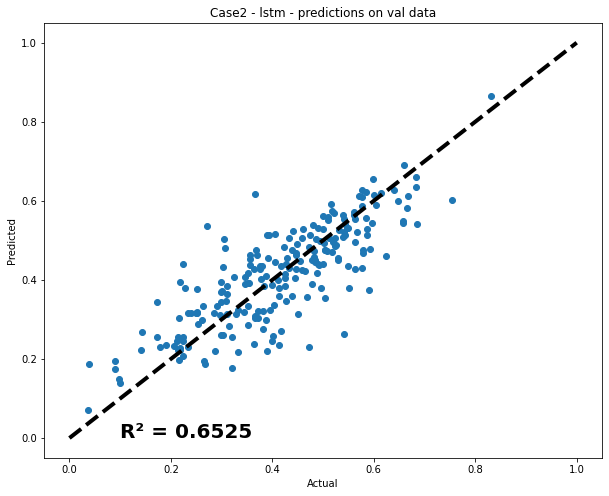

11/11 [==============================] - 0s 4ms/step
RMSE: 0.083203
R2: 0.733807


<Figure size 1152x720 with 0 Axes>

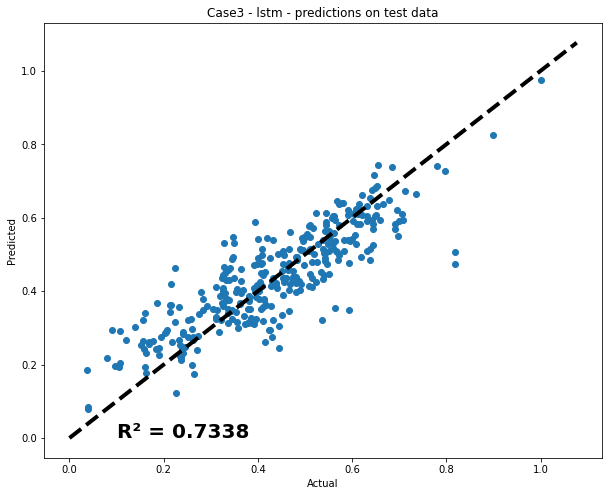

83/83 [==============================] - 0s 4ms/step
RMSE: 0.075858
R2: 0.787917


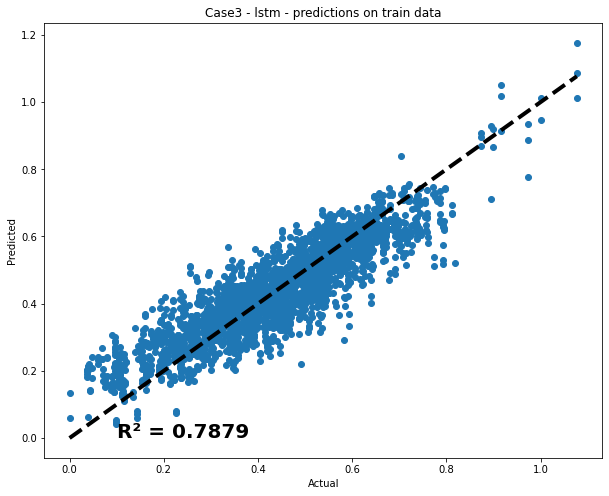

11/11 [==============================] - 0s 4ms/step
RMSE: 0.090437
R2: 0.664645


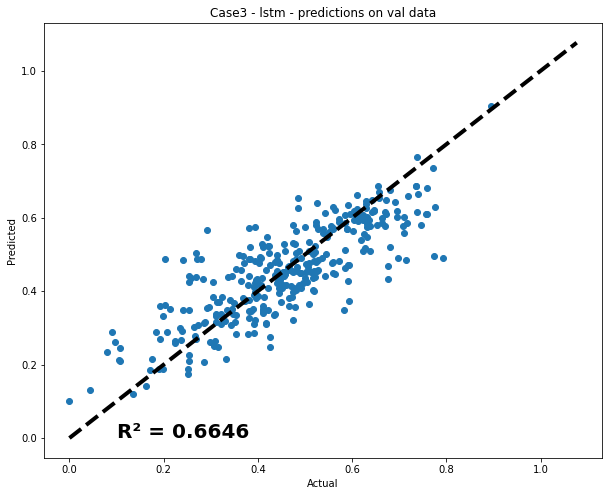

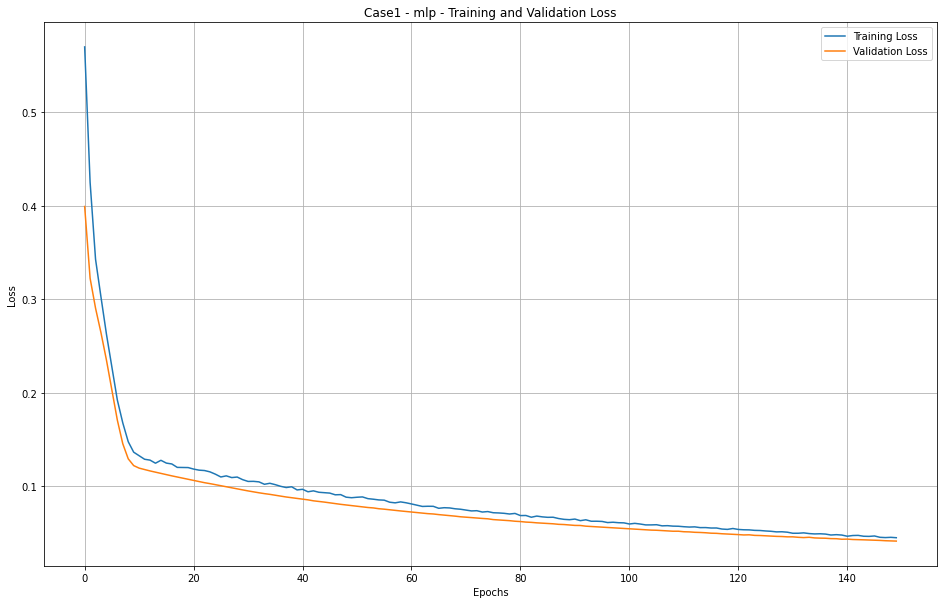

4/4 [==============================] - 0s 660us/step
RMSE: 0.086081
R2: 0.680027


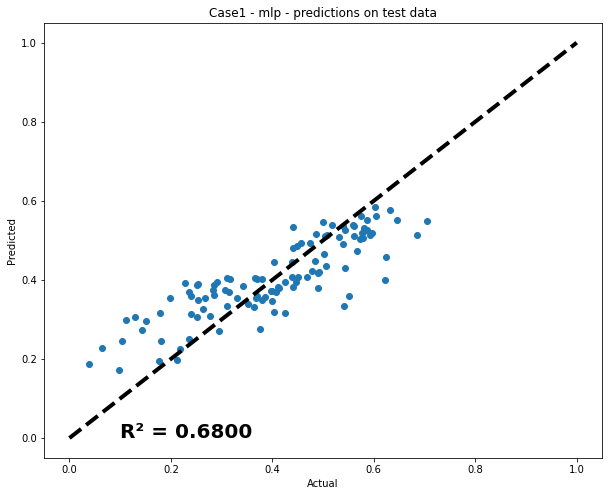

28/28 [==============================] - 0s 359us/step
RMSE: 0.099845
R2: 0.577149


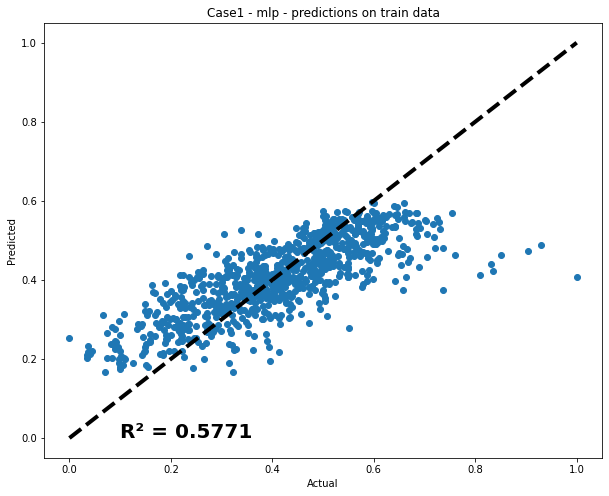

4/4 [==============================] - 0s 574us/step
RMSE: 0.095228
R2: 0.506729


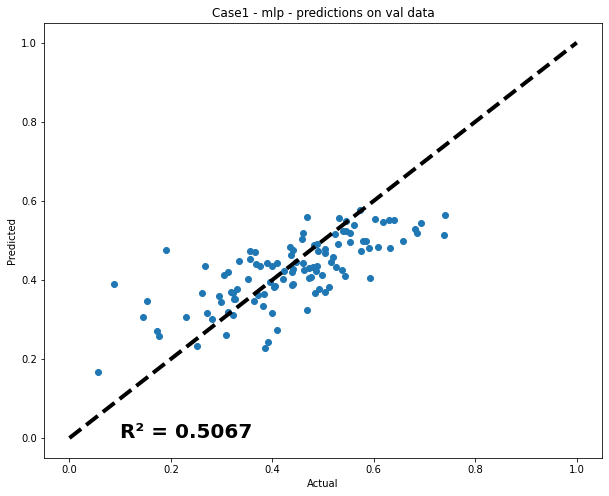

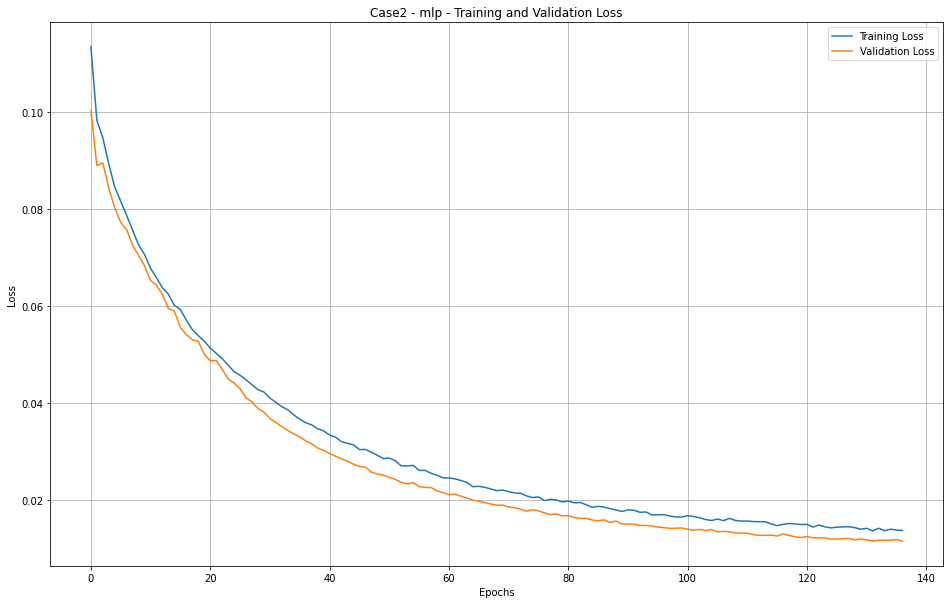

7/7 [==============================] - 0s 473us/step
RMSE: 0.074860
R2: 0.721016


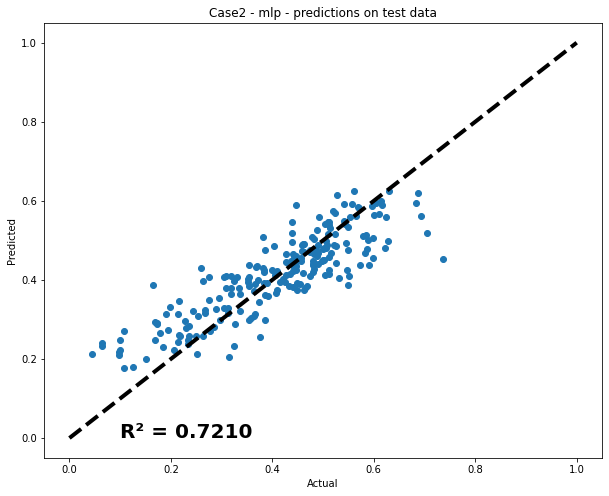

55/55 [==============================] - 0s 502us/step
RMSE: 0.083970
R2: 0.701300


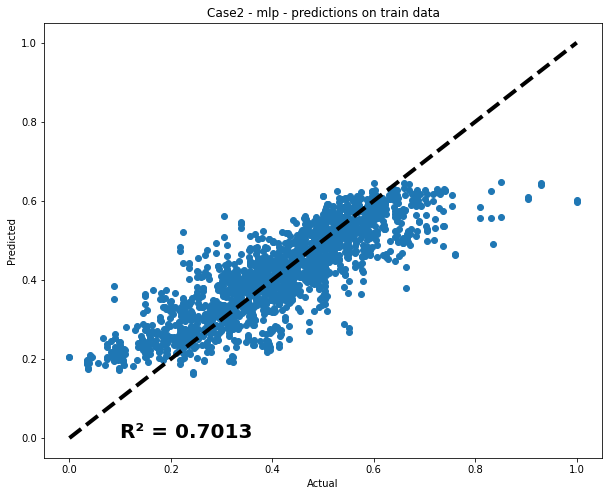

7/7 [==============================] - 0s 592us/step
RMSE: 0.078677
R2: 0.712855


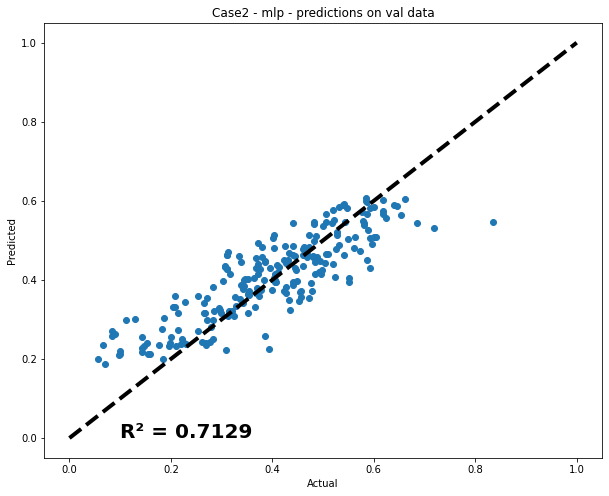

11/11 [==============================] - 0s 731us/step
RMSE: 0.076787
R2: 0.801890


<Figure size 1152x720 with 0 Axes>

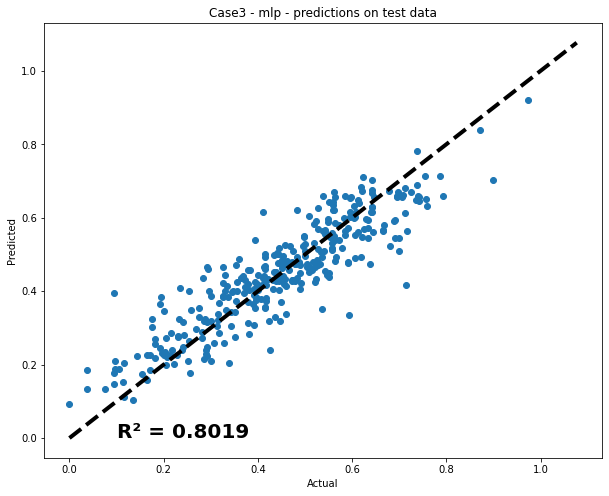

83/83 [==============================] - 0s 327us/step
RMSE: 0.060254
R2: 0.862103


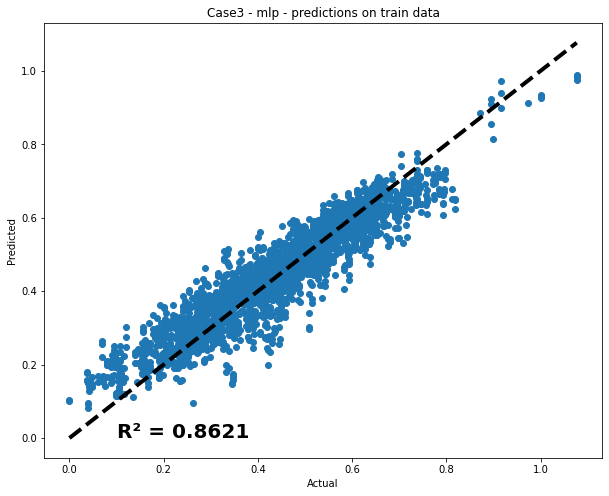

11/11 [==============================] - 0s 417us/step
RMSE: 0.072628
R2: 0.807345


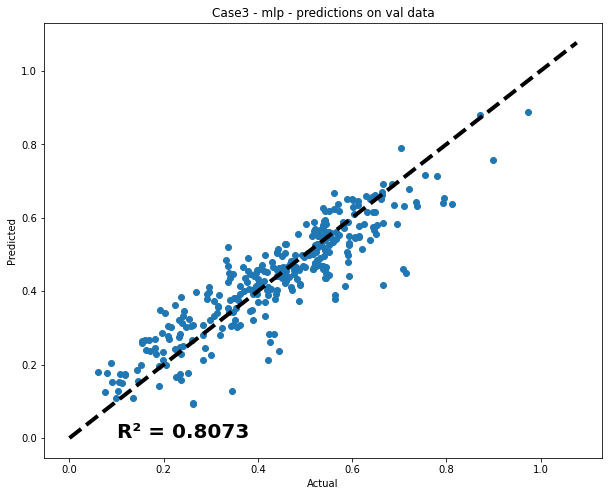

RMSE: 0.085603
R2: 0.683566


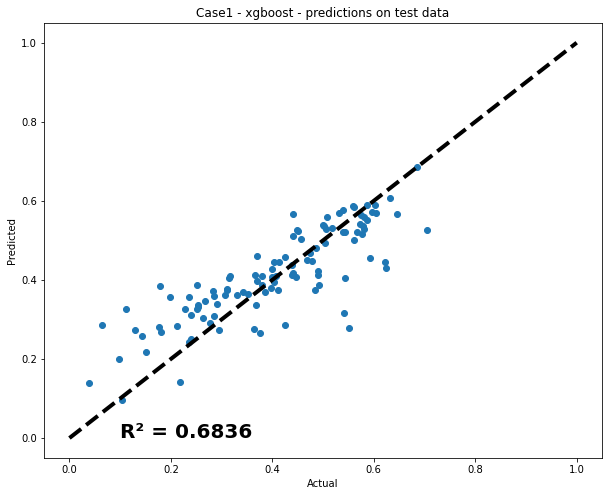

RMSE: 0.046575
R2: 0.907987


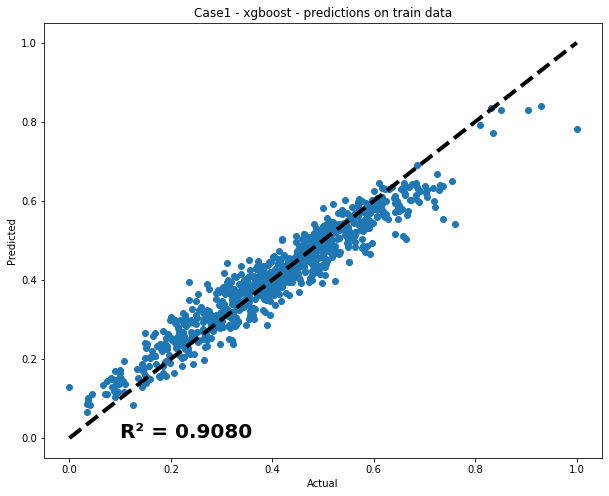

RMSE: 0.086166
R2: 0.596140


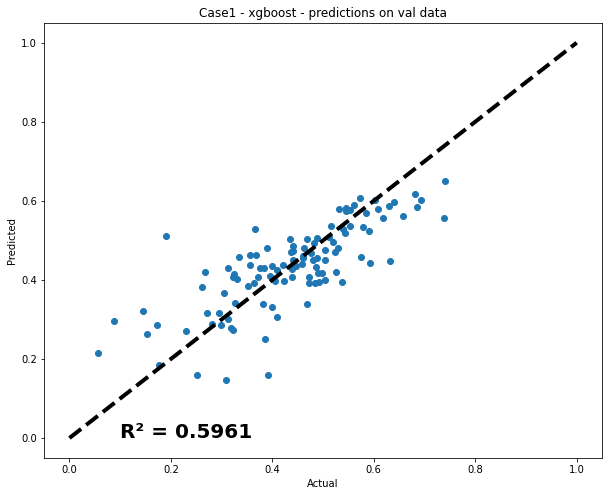

RMSE: 0.069462
R2: 0.759798


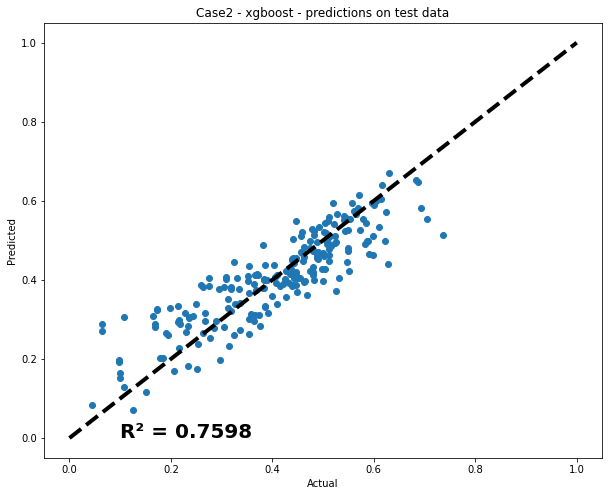

RMSE: 0.041722
R2: 0.926260


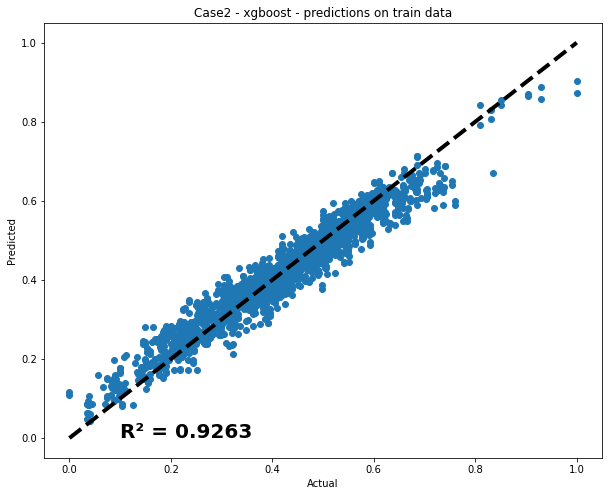

RMSE: 0.065697
R2: 0.799785


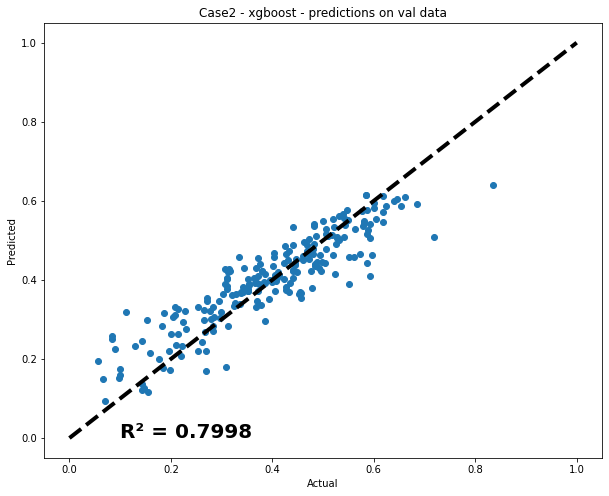

RMSE: 0.060968
R2: 0.856120


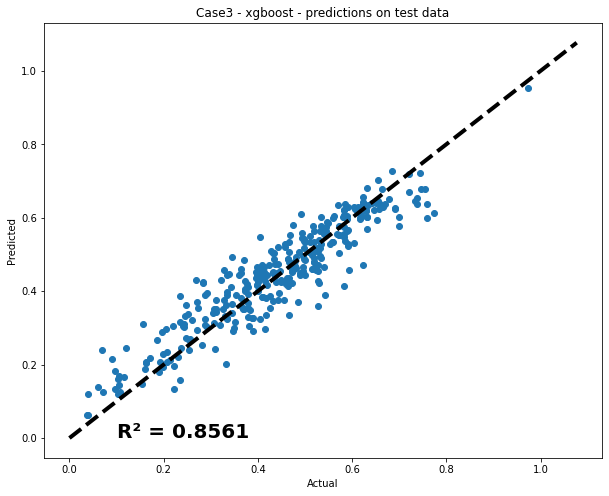

RMSE: 0.032892
R2: 0.959918


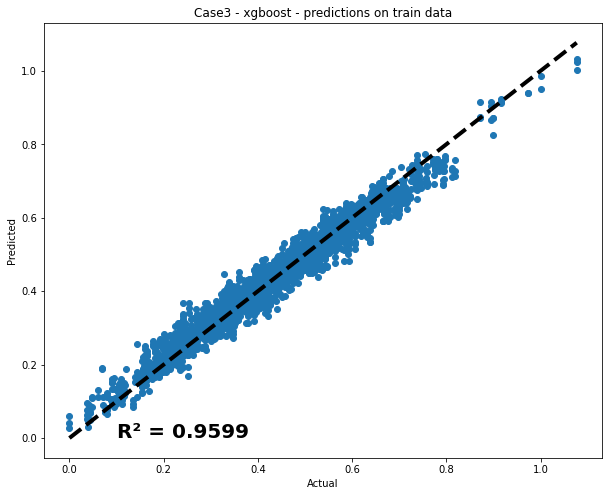

RMSE: 0.059544
R2: 0.862774


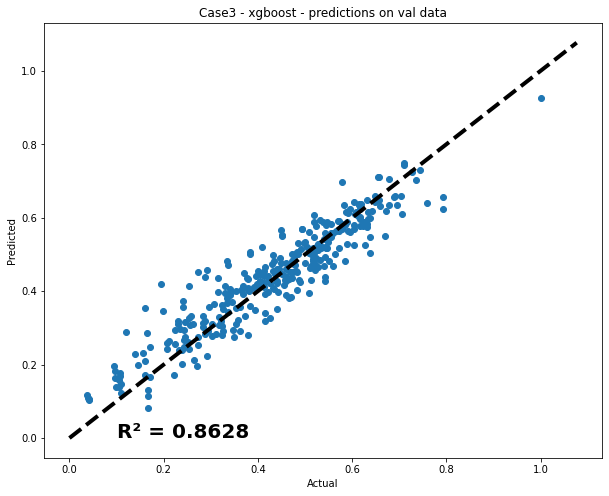

In [40]:
case1_lstm_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/lstm/best_model_info.pkl'
case2_lstm_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/best_model_info.pkl'
case3_lstm_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/best_model_info.pkl'

case1_mlp_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/mlp/best_model_info.pkl'
case2_mlp_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/mlp/best_model_info.pkl'
case3_mlp_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/mlp/best_model_info.pkl'

case1_xgb_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/xgboost/best_model.pkl'
case2_xgb_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/xgboost/best_model.pkl'
case3_xgb_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/xgboost/best_model.pkl'

results_model_paths = [case1_lstm_model_path,
                       case2_lstm_model_path,
                       case3_lstm_model_path,

                       case1_mlp_model_path,
                       case2_mlp_model_path,
                       case3_mlp_model_path,

                       case1_xgb_model_path,
                       case2_xgb_model_path,
                       case3_xgb_model_path
                       ]

results_rmse = []
results_r2 = []
results_rmse_train = []
results_r2_train = []
results_rmse_val = []
results_r2_val = []

for idx, model_path in enumerate(results_model_paths):
    
    if (idx == 0) or (idx == 3) or (idx == 6) :
        case_data = c1_datas
        extracted_path, case_name, model_name = case_model_identifier(model_path, case_id =1)
    elif (idx == 1) or (idx == 4) or (idx == 7) :
        case_data = c2_datas
        extracted_path, case_name, model_name = case_model_identifier(model_path, case_id =2)
    elif (idx == 2) or (idx == 5) or (idx == 8) :
        case_data = c3_datas
        extracted_path, case_name, model_name = case_model_identifier(model_path, case_id =3)

    case_rmse, case_r2, case_rmse_train, case_r2_train, case_rmse_val, case_r2_val = case_model_predict(case_name, model_name,best_model_info_path=model_path, 
                                            case_data = case_data, 
                                            history_save_path= SAVE_DIR + extracted_path +"/loss.png",
                                            r2_save_path = SAVE_DIR + extracted_path+"/r2.png" )
    
    # case_rmse, case_r2 = case_model_predict(case_name, model_name, best_model_info_path=model_path, 
    #                                         case_data = case_data,
    #                                         r2_save_path = SAVE_DIR + extracted_path+"/r2.png" )
    results_r2.append(case_r2)
    results_rmse.append(case_rmse)
    results_rmse_train.append(case_rmse_train)
    results_r2_train.append(case_r2_train)
    results_rmse_val.append(case_rmse_val)
    results_r2_val.append(case_r2_val)


In [119]:
best_model_r2_index, best_model_r2 = max(enumerate(results_r2), key=lambda x: x[1])
best_model_rmse_index, best_model_rmse = min(enumerate(results_rmse), key=lambda x: x[1])

print(f"Best Model R2: {results_r2[best_model_r2_index]} - {results_model_paths[best_model_r2_index]}")
print(f"Best Model RMSE: {results_rmse[best_model_rmse_index]} - {results_model_paths[best_model_rmse_index]}")

Best Model R2: 0.856119524772772 - /Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/xgboost/best_model.pkl
Best Model RMSE: 0.060968114070355565 - /Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/xgboost/best_model.pkl


Best Model

In [146]:
results_r2_train

[0.7604260060730156,
 0.8081276391506562,
 0.7879168870111091,
 0.8545201236434847,
 0.8304490038235732,
 0.862103413838931,
 0.9066260718895566,
 0.9262595795163918,
 0.9599177133864579]

In [145]:
results_r2_val

[0.6383803600962544,
 0.6525115526969731,
 0.6646447645580016,
 0.6776640441558797,
 0.7636133436072823,
 0.8073454223306542,
 0.6959799067423034,
 0.7997850670053719,
 0.86277388600253]

In [144]:
results_r2

[0.6883102994860146,
 0.7406668352517254,
 0.7338071046818261,
 0.7646959501588293,
 0.7704347958444429,
 0.8018904857965119,
 0.696258368492285,
 0.759797842475613,
 0.856119524772772]

In [ ]:
results_rmse

[0.08644856427906981,
 0.08276917388611091,
 0.08320295377010566,
 0.08608062675162477,
 0.07485979603282948,
 0.07678723857445681,
 0.08560332596671072,
 0.06946200446369281,
 0.060968114070355565]

In [175]:
X_test_scaled_10_15.shape

(275, 50)

4/4 [==============================] - 0s 2ms/step


Text(0.1, 0, 'R² = 0.7690')

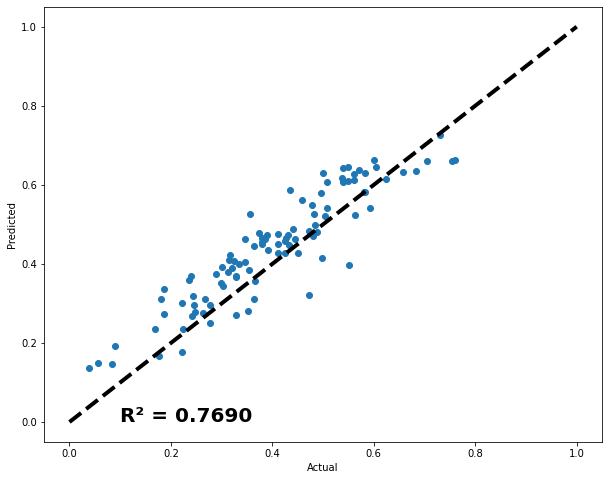

In [186]:
mlp_case1_path = results_model_paths[5]
with open(mlp_case1_path, 'rb') as f:
    mlp_case1_info = pickle.load(f)
mlp_case1_model = mlp_case1_info.get("model")
pred_test_mlp_case1 = mlp_case1_model.predict(X_test_scaled_10_15[:100])

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15[:100], pred_test_mlp_case1)
ax.plot([test_scaled_10_15.min(), test_scaled_10_15.max()], [test_scaled_10_15.min(), test_scaled_10_15.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')

#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled_10_15[:100], pred_test_mlp_case1)), (0.1, 0),fontsize=20, fontweight='bold')

Text(0.1, 0, 'R² = 0.6398')

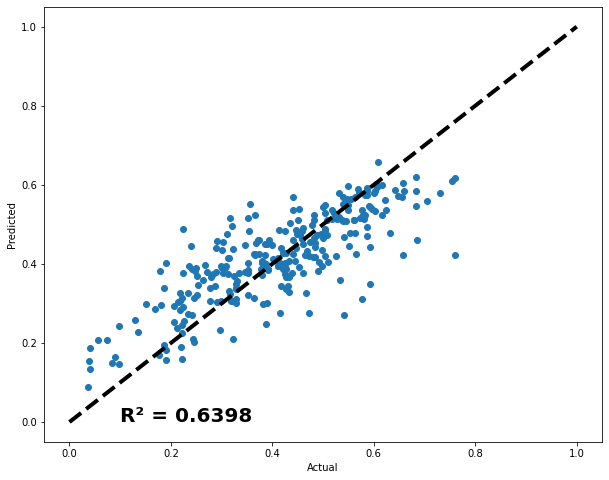

## LSTM History

In [15]:
def LSTM_case_model_extracter(best_model_info_path):

    with open(best_model_info_path, 'rb') as f:
        best_model_info = pickle.load(f)
    case_model = best_model_info.get("model")
    best_case_data = best_model_info.get("fold_data")

            # "fold_data": {"X_train": X_fold_train_full_10_15_20, "y_train": y_fold_train_full_10_15_20, "X_test": X_test_full_10_15_20, "y_test": y_test_full_10_15_20, "X_val": X_val_full_10_15_20, "y_val": y_val_full_10_15_20}
    best_case_data["X_test"]
    best_case_data["y_test"]
    best_case_data["X_val"]
    best_case_data["y_val"]
    best_case_data["X_train"]
    best_case_data["y_train"]

    return case_model, best_case_data

Epoch 1/210
28/28 [==============================] - 3s 36ms/step - loss: 0.0374 - mean_squared_error: 0.0374 - val_loss: 0.0240 - val_mean_squared_error: 0.0240
Epoch 2/210
28/28 [==============================] - 1s 19ms/step - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0213 - val_mean_squared_error: 0.0213
Epoch 3/210
28/28 [==============================] - 1s 20ms/step - loss: 0.0246 - mean_squared_error: 0.0246 - val_loss: 0.0213 - val_mean_squared_error: 0.0213
Epoch 4/210
28/28 [==============================] - 1s 19ms/step - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0213 - val_mean_squared_error: 0.0213
Epoch 5/210
28/28 [==============================] - 1s 20ms/step - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0226 - val_mean_squared_error: 0.0226
Epoch 6/210
28/28 [==============================] - 1s 19ms/step - loss: 0.0230 - mean_squared_error: 0.0230 - val_loss: 0.0211 - val_mean_squared_error: 0.0211
Epoch 7/210
28/28 [=========

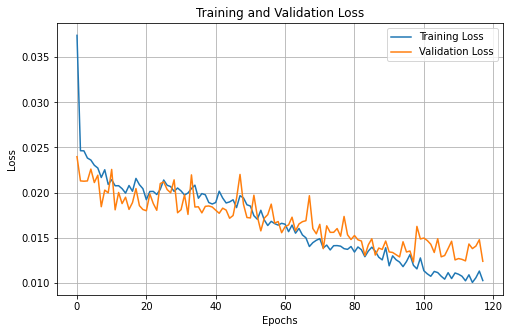

In [18]:
case1_lstm_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/lstm/best_model_info.pkl'
case2_lstm_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/best_model_info.pkl'
case3_lstm_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/best_model_info.pkl'

_, case1_lstm_data = LSTM_case_model_extracter(case1_lstm_model_path) 



from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Sequential
# Case 1

units= 64
lr= 0.002738778997637705
epochs= 210
batch_size= 32
dropout= 0.10379324700292442

n_features = case1_lstm_data["X_train"].shape[1]
X_train_full_r = case1_lstm_data["X_train"]
X_val_full_r =  case1_lstm_data["X_val"]
X_test_full_r =  case1_lstm_data["X_test"]


LSTM_CASE1 = Sequential()
LSTM_CASE1.add(LSTM(units=units, activation='tanh', dropout=dropout, return_sequences=True, input_shape=(n_features, 1)))
LSTM_CASE1.add(LSTM(units=units//2, activation='tanh', dropout=dropout)) 
LSTM_CASE1.add(Dense(1))
LSTM_CASE1.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])


early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history_LSTM_CASE1 = LSTM_CASE1.fit(X_train_full_r, case1_lstm_data["y_train"], epochs=epochs, batch_size=batch_size,
            validation_data=(X_val_full_r, case1_lstm_data["y_val"]), callbacks= early_stopping, verbose=1)

# Kayıp değerlerini çizdirme
plt.figure(figsize=(8, 5))
plt.plot(history_LSTM_CASE1.history['loss'], label='Training Loss')
plt.plot(history_LSTM_CASE1.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()



Epoch 1/210
55/55 [==============================] - 3s 23ms/step - loss: 0.0319 - mean_squared_error: 0.0319 - val_loss: 0.0207 - val_mean_squared_error: 0.0207
Epoch 2/210
55/55 [==============================] - 1s 14ms/step - loss: 0.0239 - mean_squared_error: 0.0239 - val_loss: 0.0200 - val_mean_squared_error: 0.0200
Epoch 3/210
55/55 [==============================] - 1s 14ms/step - loss: 0.0234 - mean_squared_error: 0.0234 - val_loss: 0.0194 - val_mean_squared_error: 0.0194
Epoch 4/210
55/55 [==============================] - 1s 16ms/step - loss: 0.0223 - mean_squared_error: 0.0223 - val_loss: 0.0211 - val_mean_squared_error: 0.0211
Epoch 5/210
55/55 [==============================] - 1s 15ms/step - loss: 0.0218 - mean_squared_error: 0.0218 - val_loss: 0.0174 - val_mean_squared_error: 0.0174
Epoch 6/210
55/55 [==============================] - 1s 15ms/step - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0175 - val_mean_squared_error: 0.0175
Epoch 7/210
55/55 [=========

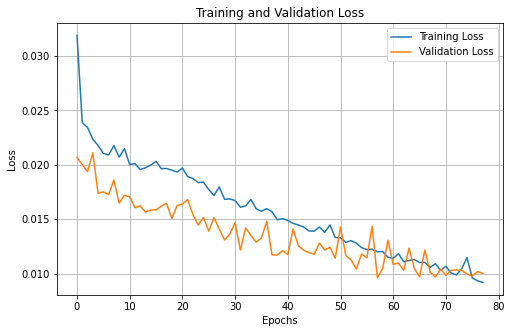

In [19]:
_, case2_lstm_data = LSTM_case_model_extracter(case2_lstm_model_path)

# Case 2

units= 64
lr= 0.002738778997637705
epochs= 210
batch_size= 32
dropout= 0.10379324700292442


n_features = case2_lstm_data["X_train"].shape[1]
X_train_full_r = case2_lstm_data["X_train"]
X_val_full_r =  case2_lstm_data["X_val"]
X_test_full_r =  case2_lstm_data["X_test"]


LSTM_CASE2 = Sequential()
LSTM_CASE2.add(LSTM(units=units, activation='tanh', dropout=dropout, return_sequences=True, input_shape=(n_features, 1)))
LSTM_CASE2.add(LSTM(units=units//2, activation='tanh', dropout=dropout)) 
LSTM_CASE2.add(Dense(1))
LSTM_CASE2.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])


early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history_LSTM_CASE2 = LSTM_CASE2.fit(X_train_full_r, case2_lstm_data["y_train"], epochs=epochs, batch_size=batch_size,
            validation_data=(X_val_full_r, case2_lstm_data["y_val"]), callbacks= early_stopping, verbose=1)

# Kayıp değerlerini çizdirme
plt.figure(figsize=(8, 5))
plt.plot(history_LSTM_CASE2.history['loss'], label='Training Loss')
plt.plot(history_LSTM_CASE2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()



Epoch 1/240
83/83 [==============================] - 4s 22ms/step - loss: 0.0356 - mean_squared_error: 0.0356 - val_loss: 0.0261 - val_mean_squared_error: 0.0261
Epoch 2/240
83/83 [==============================] - 2s 19ms/step - loss: 0.0273 - mean_squared_error: 0.0273 - val_loss: 0.0241 - val_mean_squared_error: 0.0241
Epoch 3/240
83/83 [==============================] - 1s 18ms/step - loss: 0.0258 - mean_squared_error: 0.0258 - val_loss: 0.0219 - val_mean_squared_error: 0.0219
Epoch 4/240
83/83 [==============================] - 2s 19ms/step - loss: 0.0247 - mean_squared_error: 0.0247 - val_loss: 0.0235 - val_mean_squared_error: 0.0235
Epoch 5/240
83/83 [==============================] - 2s 19ms/step - loss: 0.0250 - mean_squared_error: 0.0250 - val_loss: 0.0200 - val_mean_squared_error: 0.0200
Epoch 6/240
83/83 [==============================] - 2s 19ms/step - loss: 0.0237 - mean_squared_error: 0.0237 - val_loss: 0.0215 - val_mean_squared_error: 0.0215
Epoch 7/240
83/83 [=========

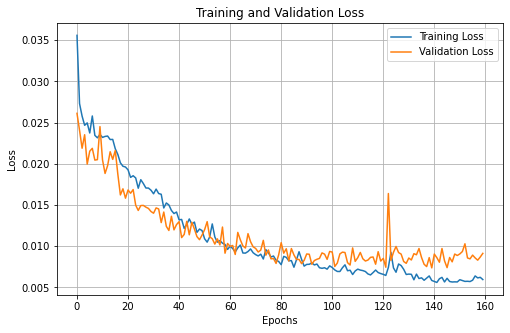

In [20]:
_, case3_lstm_data = LSTM_case_model_extracter(case3_lstm_model_path)

# Case 3
units= 64
lr= 0.0025798356329212904
epochs= 240
batch_size= 32
dropout= 0.10232416239092602


n_features = case3_lstm_data["X_train"].shape[1]
X_train_full_r = case3_lstm_data["X_train"]
X_val_full_r =  case3_lstm_data["X_val"]
X_test_full_r =  case3_lstm_data["X_test"]


LSTM_CASE3 = Sequential()
LSTM_CASE3.add(LSTM(units=units, activation='tanh', dropout=dropout, return_sequences=True, input_shape=(n_features, 1)))
LSTM_CASE3.add(LSTM(units=units//2, activation='tanh', dropout=dropout)) 
LSTM_CASE3.add(Dense(1))
LSTM_CASE3.compile(loss='mse', optimizer=Adam(learning_rate=lr), metrics=['mean_squared_error'])


early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

history_LSTM_CASE3 = LSTM_CASE3.fit(X_train_full_r, case3_lstm_data["y_train"], epochs=epochs, batch_size=batch_size,
            validation_data=(X_val_full_r, case3_lstm_data["y_val"]), callbacks= early_stopping, verbose=1)

# Kayıp değerlerini çizdirme
plt.figure(figsize=(8, 5))
plt.plot(history_LSTM_CASE3.history['loss'], label='Training Loss')
plt.plot(history_LSTM_CASE3.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()


## MLP History

In [ ]:

case1_mlp_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/mlp/best_model_info.pkl'
case2_mlp_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/mlp/best_model_info.pkl'
case3_mlp_model_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/mlp/best_model_info.pkl'


# SHAP

#### Top Interactions

In [44]:
import re
def change_dynamic_indexes(input_string):
    # Define a regular expression pattern to match words with an underscore
    pattern = re.compile(r'(\w+)_(\d+)')
    mount_dict = {"4": 'APR', 
                  "5": 'MAY', 
                  "6": 'JUN', 
                  "7": 'JUL', 
                  "8": 'AUG', 
                  "9": 'SEP'}

    # Define a function to handle the replacement
    def replace(match):
        # Extract the components matched by the pattern
        word, index = match.groups()
        
        # Return the replacement string
        return f'$\mathregular{{{word.upper()}^{{{mount_dict[index]}}}}}$'
    
    # Use the sub function to replace the matched patterns in the input string
    result_string = pattern.sub(replace, input_string)
    
    return result_string


In [45]:
def top_interactions(explainer,X_test_df, save_path):
    # Calculate SHAP interaction values
    shap_interaction_values = explainer.shap_interaction_values(X_test_df)

    # Calculate the mean absolute interaction values for each feature pair
    mean_interaction_values = abs(shap_interaction_values).mean(0)
    # Mask the diagonal (intra-feature interactions)

    masked_interaction_values = np.ma.masked_where(np.eye(mean_interaction_values.shape[0]), mean_interaction_values)

    # Extract the indices of the top 6 interactions between different features
    top_interactions = np.unravel_index(np.argsort(masked_interaction_values, axis=None)[::-1], mean_interaction_values.shape)
    top_interactions = list(zip(top_interactions[0], top_interactions[1]))
    top_interactions = [pair for pair in top_interactions if pair[0] != pair[1]][:30]

    # Get the feature names (replace these with your actual feature names)
    feature_names = X_test_df.columns

    # Extract feature names for the top 6 interactions
    top_interactions_names = [f"{change_dynamic_indexes(feature_names[i])} & {change_dynamic_indexes(feature_names[j])}" for i, j in top_interactions][::-1]

    # Get the corresponding importance values for the top 6 interactions
    top_values = [mean_interaction_values[i, j] for i, j in top_interactions][::-1]

    # Create a bar plot for the top 6 interactions between different features
    plt.figure(figsize=(10, 6))
    plt.barh(top_interactions_names[1::2], top_values[1::2])
    plt.xlabel('Mean Absolute Interaction Value')
    plt.ylabel('Feature Importance')
    plt.title('Top Interactions Between Different Features')
    plt.tight_layout(pad=3)  # Adjust pad parameter for padding

    plt.savefig(save_path)
    plt.show()


#### Contributions of Dynamic and Static Features

In [46]:
def contributions(_shap_values,explainer,X_test_df,save_path):

    # Calculate SHAP values for dynamic and static features
    shap_values_dynamic = _shap_values[:, :42]
    shap_values_static = _shap_values[:, 42:]

    # Calculate mean absolute SHAP values for dynamic and static features
    mean_shap_dynamic = np.mean(np.abs(shap_values_dynamic), axis=0)
    mean_shap_static = np.mean(np.abs(shap_values_static), axis=0)

    # Calculate SHAP interaction values for all features
    shap_interaction_values_all = explainer.shap_interaction_values(X_test_df)

    # Calculate the mean absolute interaction values for each feature pair
    mean_interaction_values = np.mean(np.abs(shap_interaction_values_all), axis=0)

    # Calculate the contributions of dynamic and static features to the overall importance
    total_importance = np.sum(mean_shap_dynamic) + np.sum(mean_shap_static)
    dynamic_contribution = np.sum(mean_shap_dynamic) / total_importance
    static_contribution = np.sum(mean_shap_static) / total_importance

    def addlabels(x,y):
        for i in range(len(x)):
            plt.text(i, y[i], y[i], ha = 'center',bbox = dict(facecolor = 'white', alpha =.8))

    # Create a bar plot to show the contributions of dynamic and static features
    plt.figure(figsize=(8,7))
    plt.bar('Dynamic Features', dynamic_contribution, width=0.5 ,color='skyblue', alpha=0.8)
    plt.bar('Static Features', static_contribution,width=0.5, color='orange', alpha=0.8)
    addlabels(['Dynamic Features','Static Features'],[dynamic_contribution,static_contribution])
    plt.ylabel('Contribution to Overall Importance')
    plt.title('Contribution of Dynamic and Static Features to Overall Importance')
    plt.ylim([0, 1])
    plt.savefig(save_path)
    plt.show()

    print(f"Dynamic Feature Importance: {dynamic_contribution}")
    print(f"Static Feature Importance: {static_contribution}")

#### HeatMap

In [64]:
def heatmap_per_case(case1_shap_values,c1_dfs,save_fig):
    import seaborn as sns
    from matplotlib.colors import ListedColormap

    mount_dict = {'APR':4,
                'MAY':5,
                'JUN':6,
                'JUL':7,
                'AUG':8,
                'SEP':9
                }

    cols_rename = {
        0: c1_dfs[0][1].columns[1].upper(),
        1: c1_dfs[0][1].columns[2].upper(),
        2: c1_dfs[0][1].columns[3].upper(),
        3: c1_dfs[0][1].columns[4].upper(),
        4: c1_dfs[0][1].columns[5].upper(),
        5: c1_dfs[0][1].columns[6].upper(),
        6: c1_dfs[0][1].columns[7].upper()
    }

    dynamic_min = np.mean(case1_shap_values[:, :42], axis=0).reshape(7, 6).min()
    dynamic_max = np.mean(case1_shap_values[:, :42], axis=0).reshape(7, 6).max()

    def heatmap_dynamic(shap_values_dynamic,cols_rename,mount_dict,axis):
        df_tmp =  pd.DataFrame(np.mean(shap_values_dynamic, axis=0).reshape(7,6), columns=mount_dict.keys()).rename(cols_rename, axis='index')
        max_df_vals = np.max(df_tmp.values, axis=1)
        indices = df_tmp.index
        max_value_tuples = list(zip(indices, max_df_vals,range(0,7)))
        sorted_max_value_tuples = sorted(max_value_tuples, key=lambda x: x[1])
        sorted_indices = [t[0] for t in sorted_max_value_tuples]
        sorted_indices_nums = [t[2] for t in sorted_max_value_tuples]
        sorted_array_7x6 = df_tmp.values[sorted_indices_nums]

        sns.heatmap(pd.DataFrame(sorted_array_7x6, columns=df_tmp.columns).set_index(pd.Index(sorted_indices)).iloc[::-1],
                    annot=False, linewidth=1, linecolor='w',annot_kws={"size": 7}, ax = axis,cbar=False, cmap="YlGnBu",yticklabels=True)
        plt.yticks(rotation=0)

    def heatmap_static(shap_values_static, df,axis):
        sns.heatmap(pd.DataFrame(np.mean(shap_values_static, axis=0).reshape(1,8), columns=df.columns[8:-1]).rename({0: "Soil Params"}, axis='index'), 
                    annot=False, linewidth=1, linecolor='w',ax = axis,cbar=False, cmap="YlGnBu" , vmin=dynamic_min, vmax=dynamic_max)
        
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, gridspec_kw={'height_ratios': [1, 9, 1.5]})

    norm = plt.Normalize(vmin=np.min([np.mean(case1_shap_values[: , :42], axis=0).reshape(7,6).min(), np.mean(case1_shap_values[: , 42:], axis=0).reshape(1,8).min()]),
                        vmax=np.max([np.mean(case1_shap_values[: , :42], axis=0).reshape(7,6).max(), np.mean(case1_shap_values[: , 42:], axis=0).reshape(1,8).max()]))
    
    cbar = plt.cm.ScalarMappable(norm=norm, cmap='YlGnBu')
    cbar.set_array([])

    heatmap_dynamic(case1_shap_values[: , :42],cols_rename,mount_dict, ax2)
    heatmap_static(case1_shap_values[: , 42:],c1_dfs[0][1], ax3)

    cbar_ax = plt.gcf().add_axes([0.1, 0.9, 0.85, 0.05]) 
    plt.colorbar(cbar, cax=cbar_ax,orientation='horizontal',ax=ax1, ticks=np.linspace(dynamic_min, dynamic_max, 7))
    ax1.axis('off')

    plt.tight_layout()
    plt.title("Global Importance")
    # plt.savefig(save_fig)
    plt.savefig(save_fig, dpi=600, format="tiff", pil_kwargs={"compression": "tiff_lzw"})

    plt.show()

    

## Case 1

In [52]:
best_model_path = results_model_paths[6]
with open(best_model_path, 'rb') as f:
    best_model_info = pickle.load(f)
xgb_case1_model = best_model_info.get("model")
xgb_case1_test = best_model_info.get("fold_data")["X_test"]




In [53]:
X_test_df_case1 = pd.DataFrame(xgb_case1_test, columns = c1_dfs[0][2].columns[:-1])

explainer_xgb_case1 = shap.TreeExplainer(xgb_case1_model)
case1_shap_values = explainer_xgb_case1.shap_values(X_test_df_case1)

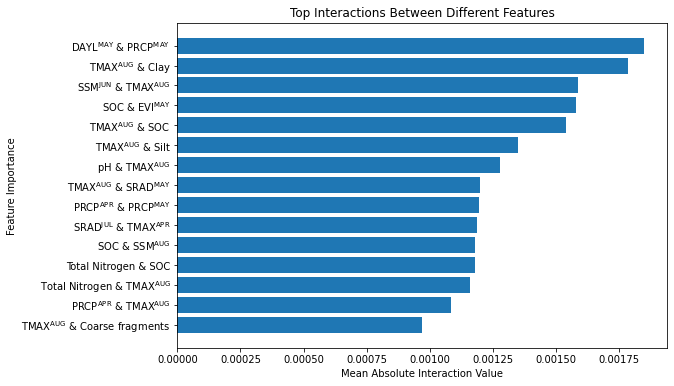

In [54]:
case_1_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/feature_importance/case1_top_interactions.png'

top_interactions(explainer_xgb_case1,X_test_df_case1,case_1_path)

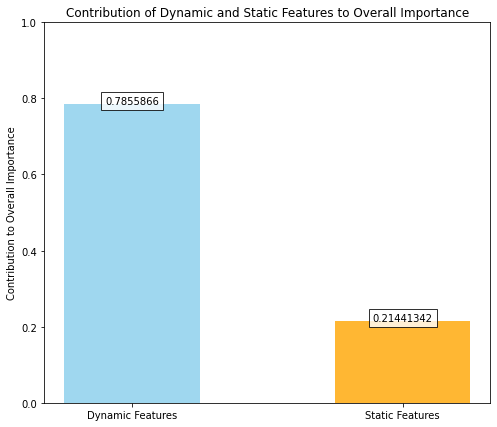

Dynamic Feature Importance: 0.7855865955352783
Static Feature Importance: 0.21441341936588287


In [67]:
save_fig_case1 = "/Users/alperbalmumcu/Github/crop-yield-estimation/results/feature_importance/case1_contributions.png"
contributions(case1_shap_values,explainer_xgb_case1,X_test_df_case1,save_fig_case1)

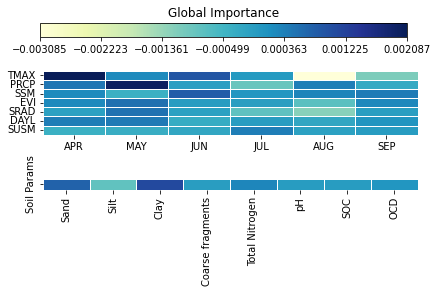

In [65]:
heatmap_per_case(case1_shap_values,c1_dfs,save_fig="/Users/alperbalmumcu/Github/crop-yield-estimation/results/feature_importance/case1_global_importance.png")

## Case 2

In [68]:
best_model_path = results_model_paths[7]
with open(best_model_path, 'rb') as f:
    best_model_info = pickle.load(f)
xgb_case2_model = best_model_info.get("model")
xgb_case2_test = best_model_info.get("fold_data")["X_test"]


In [69]:
X_test_df_case2 = pd.DataFrame(xgb_case2_test, columns = c2_dfs[0][2].columns[:-1])

explainer_xgb_case2 = shap.TreeExplainer(xgb_case2_model)
case2_shap_values = explainer_xgb_case2.shap_values(X_test_df_case2)

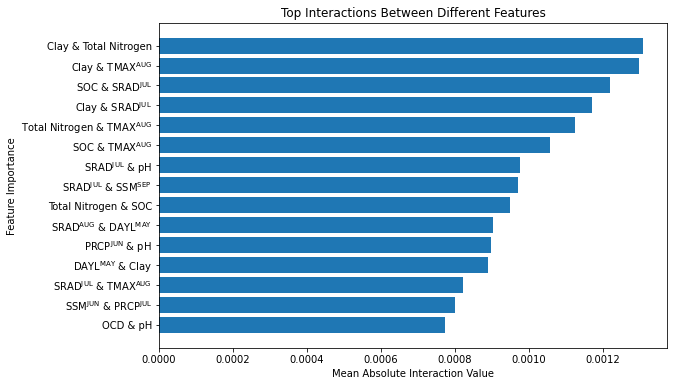

In [70]:
case_2_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/feature_importance/case2_top_interactions.png'

top_interactions(explainer_xgb_case2,X_test_df_case2,case_2_path)

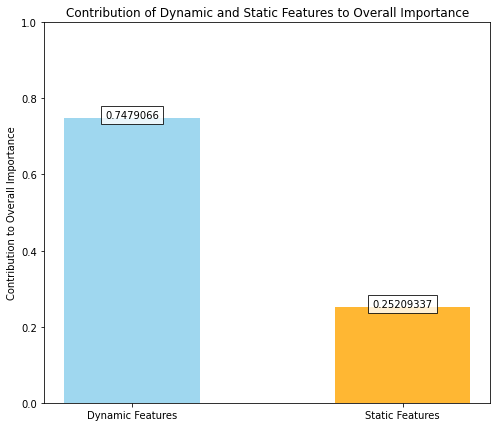

Dynamic Feature Importance: 0.7479066252708435
Static Feature Importance: 0.2520933747291565


In [71]:
save_fig_case2 = "/Users/alperbalmumcu/Github/crop-yield-estimation/results/feature_importance/case2_contributions.png"

contributions(case2_shap_values,explainer_xgb_case2,X_test_df_case2,save_fig_case2)

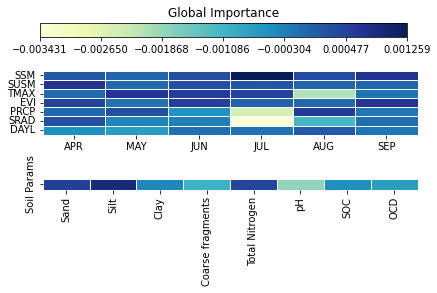

In [72]:
heatmap_per_case(case2_shap_values,c2_dfs,save_fig="/Users/alperbalmumcu/Github/crop-yield-estimation/results/feature_importance/case2_global_importance.png")

## Case 3

In [73]:
best_model_path = results_model_paths[8]
with open(best_model_path, 'rb') as f:
    best_model_info = pickle.load(f)
xgb_case3_model = best_model_info.get("model")
xgb_case3_test = best_model_info.get("fold_data")["X_test"]


In [74]:
X_test_df_case3 = pd.DataFrame(X_test_scaled_10_15_20, columns = c3_dfs[0][2].columns[:-1])

explainer_xgb_case3 = shap.TreeExplainer(xgb_case3_model)
case3_shap_values = explainer_xgb_case3.shap_values(X_test_df_case3)

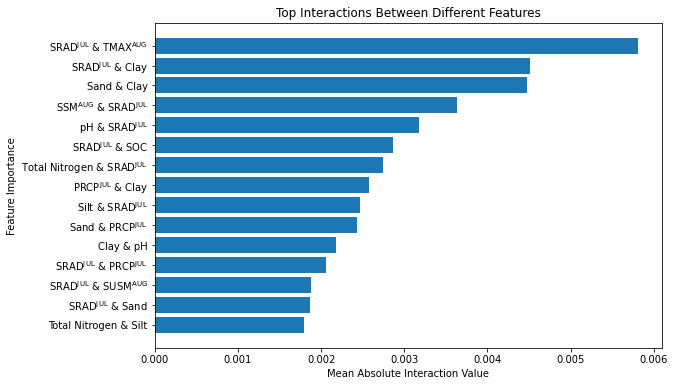

In [75]:
case_3_path = '/Users/alperbalmumcu/Github/crop-yield-estimation/results/feature_importance/case3_top_interactions.png'

top_interactions(explainer_xgb_case3,X_test_df_case3,case_3_path)

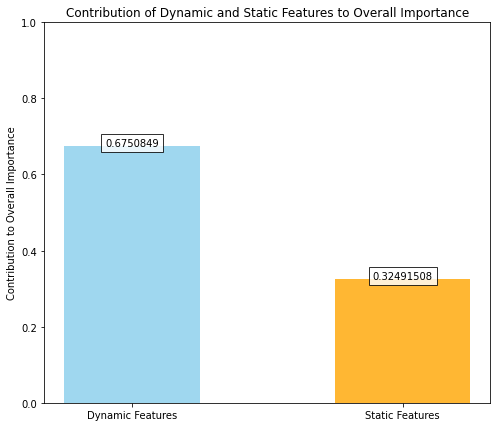

Dynamic Feature Importance: 0.6750848889350891
Static Feature Importance: 0.3249150812625885


In [76]:
save_fig_case3 = "/Users/alperbalmumcu/Github/crop-yield-estimation/results/feature_importance/case3_contributions.png"
contributions(case3_shap_values,explainer_xgb_case3,X_test_df_case3,save_fig_case3)

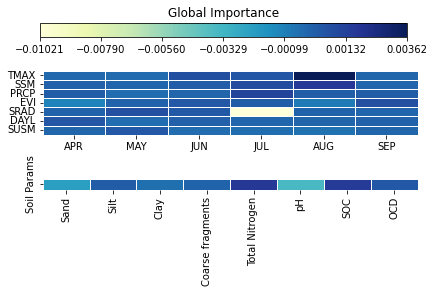

In [77]:
heatmap_per_case(case3_shap_values,c3_dfs,save_fig="/Users/alperbalmumcu/Github/crop-yield-estimation/results/feature_importance/case3_global_importance.png")

# Evaluation

In [42]:
def plot_case_comparation(branches,y1,y2,y3):
   import plotly.graph_objs as go
   from plotly.offline import iplot

   trace1 = go.Bar(
      x = branches,
      y = y1,
      name = 'LSTM'
   )
   trace2 = go.Bar(
      x = branches,
      y = y2,
      name = 'MLP'
   )
   trace3 = go.Bar(
      x = branches,
      y = y3,
      name = 'XGBoost'
   )
   data = [trace1, trace2, trace3]
   layout = go.Layout(barmode = 'group',title="RMSE Comparison of All Models in All Cases")
   fig = go.Figure(data = data, layout = layout)
   iplot(fig)

In [311]:
# r2_scores_case1 = [case1_LSTM_r2,
#                    case1_MLP_r2,
#                    case1_XGB_r2]

r2_scores_case1 = results_r2[0:3]
r2_scores_case2 = results_r2[3:6]
r2_scores_case3 = [r2,results_r2[7],results_r2[8]]

# r2_scores_case2 = [case2_LSTM_r2, 
#                    case2_MLP_r2, 
#                    case2_XGB_r2]

# r2_scores_case3 = [case3_LSTM_r2,
#                    case3_MLP_r2,
#                    case3_XGB_r2]

branches = ['case1', 'case2', 'case3']
# branches = ['LSTM', 'MLP', 'XGB']

plot_case_comparation(branches,
                      r2_scores_case1,
                      r2_scores_case2,
                      r2_scores_case3)


In [43]:
rmse_scores_case1 = results_rmse[0:3]
rmse_scores_case2 = results_rmse[3:6]
rmse_scores_case3 = [0.074486,results_rmse[7],results_rmse[8]]


branches = ['LSTM', 'MLP', 'XGB']

plot_case_comparation(branches,
                      rmse_scores_case1,
                      rmse_scores_case2,
                      rmse_scores_case3)


In [444]:
data = {
    'Model': ['LSTM', 'MLP', 'XGB'],
    'RMSE (case1)': rmse_scores_case1,
    'RMSE (case2)': rmse_scores_case2,
    'RMSE (case3)': rmse_scores_case3,
    'R2 Score (case1)': r2_scores_case1,
    'R2 Score (case2)': r2_scores_case2,
    'R2 Score (case3)': r2_scores_case3
}

# Create a DataFrame from the data dictionary
df = pd.DataFrame(data)

# Set the 'Model' column as the index
df.set_index('Model', inplace=True)

# Display the table
df.head()

,RMSE (case1),RMSE (case2),RMSE (case3),R2 Score (case1),R2 Score (case2),R2 Score (case3)
Model,,,,,,
LSTM,0.082065,0.078019,0.082122,0.680532,0.738984,0.760776
MLP,0.084470,0.083432,0.089936,0.661531,0.701510,0.713089
XGB,0.081130,0.073147,0.074740,0.687770,0.770566,0.801850


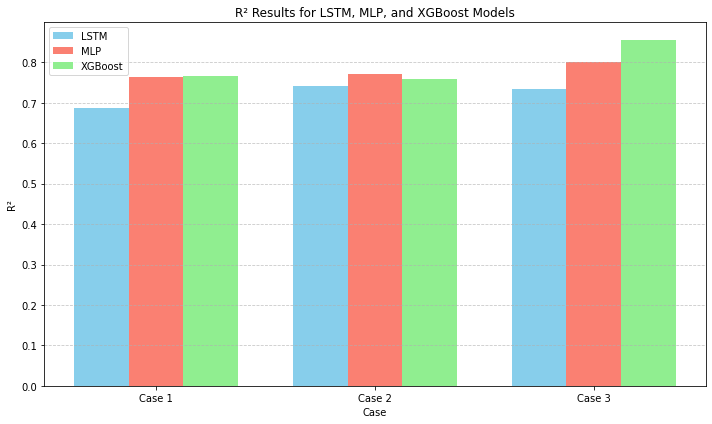

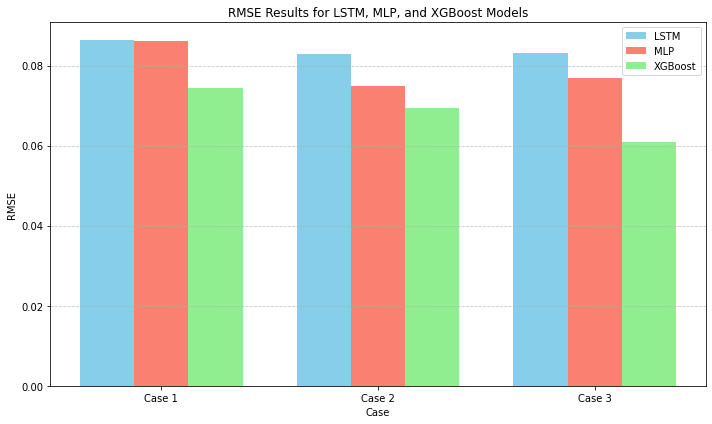

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# Define the case numbers and positions
cases = [1, 2, 3]
x = np.arange(len(cases))  # [0, 1, 2]
bar_width = 0.25

# R² values for each model (order: Case1, Case2, Case3)
r2_lstm = [0.6883102994860146, 0.7406668352517254, 0.7338071046818261]
r2_mlp  = [0.7646959501588293, 0.7704347958444429, 0.8018904857965119]
r2_xgb  = [0.765172, 0.759797842475613, 0.856119524772772]

# RMSE values for each model (order: Case1, Case2, Case3)
rmse_lstm = [0.08644856427906981, 0.08276917388611091, 0.08320295377010566]
rmse_mlp  = [0.08608062675162477, 0.07485979603282948, 0.07678723857445681]
rmse_xgb  = [0.074486, 0.06946200446369281, 0.060968114070355565]

# Plot R² results
plt.figure(figsize=(10, 6))
plt.bar(x - bar_width, r2_lstm, width=bar_width, label='LSTM', color='skyblue')
plt.bar(x, r2_mlp, width=bar_width, label='MLP', color='salmon')
plt.bar(x + bar_width, r2_xgb, width=bar_width, label='XGBoost', color='lightgreen')
plt.xlabel('Case')
plt.ylabel('R²')
plt.title('R² Results for LSTM, MLP, and XGBoost Models')
plt.xticks(x, ['Case 1', 'Case 2', 'Case 3'])
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plot RMSE results
plt.figure(figsize=(10, 6))
plt.bar(x - bar_width, rmse_lstm, width=bar_width, label='LSTM', color='skyblue')
plt.bar(x, rmse_mlp, width=bar_width, label='MLP', color='salmon')
plt.bar(x + bar_width, rmse_xgb, width=bar_width, label='XGBoost', color='lightgreen')
plt.xlabel('Case')
plt.ylabel('RMSE')
plt.title('RMSE Results for LSTM, MLP, and XGBoost Models')
plt.xticks(x, ['Case 1', 'Case 2', 'Case 3'])
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()
